#Libraries
Import all required libraries.

In [ ]:
import requests
import io
import numpy as np
import pandas as pd
from matplotlib import pyplot as plt

#Dataset
Download and import the datasets and the matrix Π.

In [ ]:
df_ecis = pd.read_excel('https://drive.usercontent.google.com/download?id=14feUcM-kdPOSaxZh6gQTT24efXDCeAec&export=download&authuser=0&confirm=t&uuid=5f38ecde-442d-4771-8951-3ef200bc0f24&at=APZUnTWHGdteIZFBuQtjBwjm604L:1699303530580')
EP = pd.read_excel('https://drive.usercontent.google.com/download?id=1PNbzbJh9gSGwHs7aYA4DaDHIlZYgQkCJ&export=download&authuser=0&confirm=t&uuid=9cd57a0e-06a7-4bbd-a43f-f476c55013a1&at=APZUnTV3rCmkubap5gsG5eEyiNxj:1699303201668')
PBE = pd.read_excel('https://drive.usercontent.google.com/download?id=1geBCxNDKbp3CTrOVG_3thdvp8pOmXaBa&export=download&authuser=0&confirm=t&uuid=b0989fb6-2929-4ce1-a027-e2d67e8992bf&at=APZUnTWiE39vvsz7AUo7ZymJtWuF:1699303610190')

response = requests.get('https://drive.usercontent.google.com/download?id=14uXSP_z7rIZZMGSl8wM0CyZStlZlIc7Y&export=download&authuser=0&confirm=t&uuid=09f87f23-e0bf-4970-9a94-e596acd77490&at=APZUnTVPNI7Q0hPnn7M-AJDWfD6a:1699303649887')
Pi = np.load(io.BytesIO(response.content))

#Functions

Define functions for calculating R2 and RMSE.

In [ ]:
# This function calculates the RMSE value.

def calc_rmse(y, y_pred):
    residuals = y - y_pred
    print('RMSE =', np.sqrt(np.mean(residuals**2)))
    return np.sqrt(np.mean(residuals**2))


# This function calculates the R2 value.

def calc_r2(y, y_pred):
    residuals = y - y_pred
    r2 = 1 - np.var(residuals) / np.var(y - y.mean())
    print('R2 =',r2)
    return r2

#Bayesian on Clusters (Batch)

## Step 1: Variable Initialization
- Initialize the number of loops and the number of structures.
- Create lists to store statistical measures: RMSE, R2, stds, and stds_J.
- Extract potential energy data columns from a DataFrame `EP`, including `f_comb`, `f_reaxff`, `f_meam`, `f_eam`, `f_CHGNet`, and `f_M3GNet`.
- Convert the energy values from meV/f.u. to eV.

In [ ]:
# Define the number of optimization loops and the total number of structures
number_of_loops = 74
n_structures = 370

# Initialize lists to store Root Mean Square Error (RMSE), R-squared (R2),
# standard deviations (stds and stds_J) for further analysis.
RMSE=[]
R2=[]
stds=[]
stds_J=[]

# Extract and scale energy values from empirical potentials DataFrame
# for different interatomic potentials.
f_comb = EP['Cluster_COMB3 (meV/f.u.)']*0.001
f_reaxff = EP['Cluster_ReaxxFF (meV/f.u.)']*0.001
f_meam = EP['Cluster_MEAM (meV/f.u.)']*0.001
f_eam = EP['Cluster_EAM (meV/f.u.)']*0.001
f_CHGNet = EP['Cluster_CHGNet (meV/f.u.)']*0.001
f_M3GNet = EP['Cluster_M3GNet (meV/f.u.)']*0.001


## Step 2: Data Processing

- Divide the potential energy data by 1000 to convert from meV to eV.
- Create a DataFrame `ep` to store the processed energy values.
- Calculate the mean energy `mu` and the covariance matrix `k` from the energy data.
- Add the identity matrix to the covariance matrix to avoid singularities.

In [ ]:
# Create a DataFrame 'ep' by stacking energy arrays for various interatomic potentials
ep = pd.DataFrame([f_comb, f_reaxff, f_meam, f_eam, f_CHGNet, f_M3GNet])

# Calculate the mean of energy values across different interatomic potentials
mu = np.mean(ep, axis=0)

# Stack energy arrays into matrix 'X' for further calculations
X = np.stack((f_comb, f_reaxff, f_eam, f_meam, f_CHGNet, f_M3GNet))

# Calculate the covariance matrix 'k' for the stacked matrix 'X'
k = np.cov(X.T)

# Add a small diagonal perturbation to the covariance matrix 'K'
K = k + np.identity(n_structures) * 0.001

# Initialize a square matrix 'w' with zeros and set diagonal elements to 0.10 to assign a higher weight to DFT calculations.
w = np.zeros((n_structures, n_structures))
np.fill_diagonal(w, 0.10)


## Step 3: Iterative Optimization Loop and Results Visualization

- Enter a loop that runs for a specified number of iterations (controlled by `number_of_loops`).
- Inside the loop, perform various calculations and manipulations of energy values and matrices, including:
   - Update matrices and select configurations based on determinants.
   - Identify configurations to be replaced with DFT (Density Functional Theory) data.
   - Adjust scaling factors for different potential energy contributions.
   - Update energy values and store them.
   - Calculate and store RMSE and R-squared values to evaluate the optimization process.

- For each iteration, generate and display a plot to visualize the energies and J (interatomic potentials) parameters. The plot includes:
   - DFT and potential energy values for different configurations.
   - Error bars for potential energy values.
   - Iteration number for tracking progress.

index of sampled structures: [369, 354, 353, 274, 258]

RMSE = 9.16258201844351
R2 = 0.8148392302726514


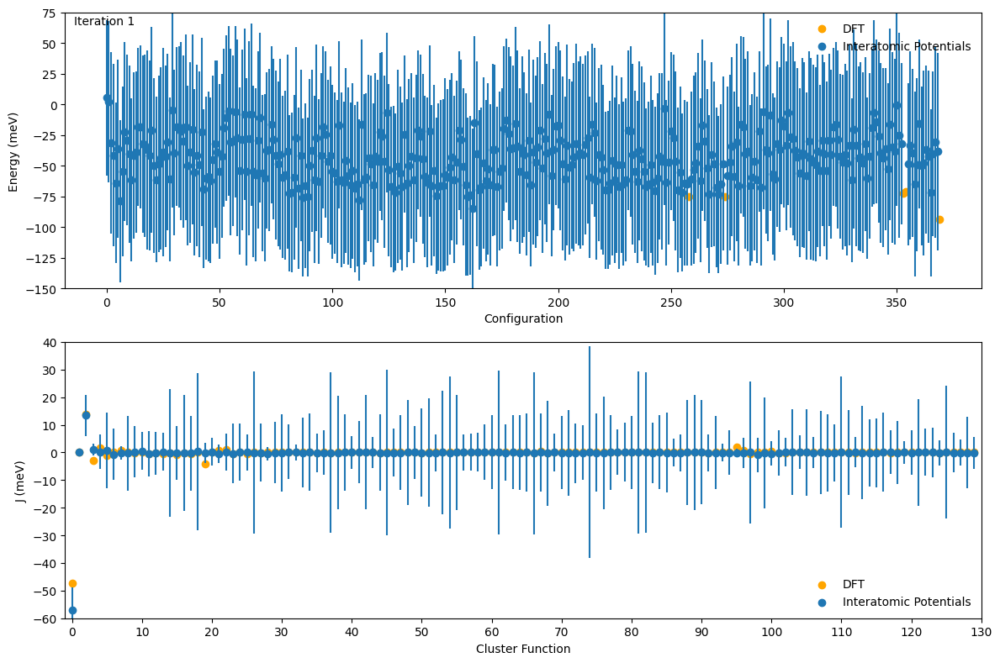

index of sampled structures: [369, 354, 353, 274, 258, 351, 350, 312, 25, 20]

RMSE = 8.957058691327921
R2 = 0.8386211783787927


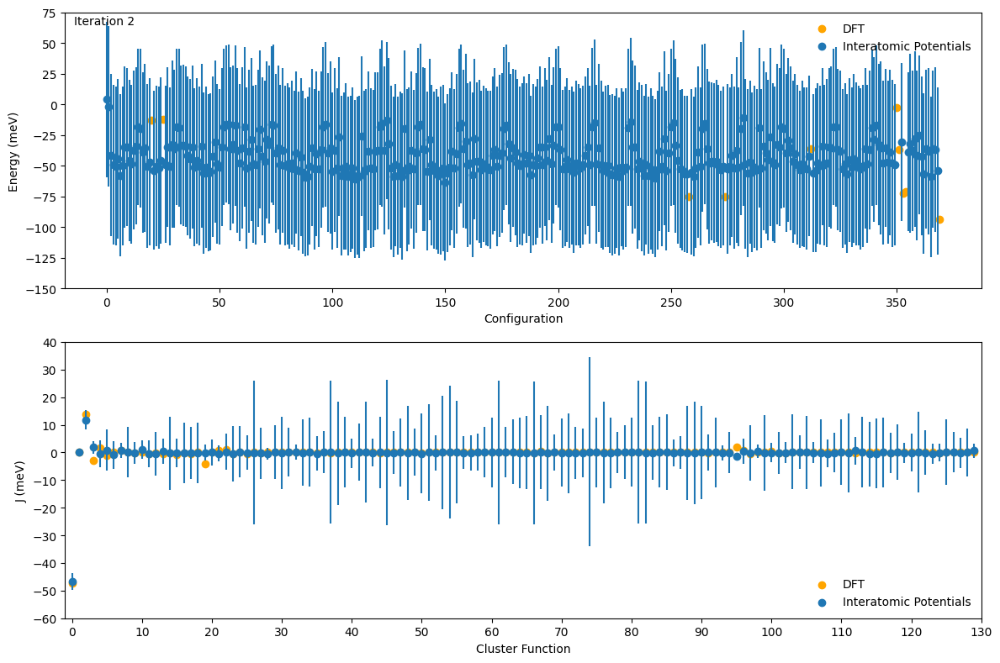

index of sampled structures: [369, 354, 353, 274, 258, 351, 350, 312, 25, 20, 358, 356, 294, 282, 279]

RMSE = 8.355737972018643
R2 = 0.8498786599148808


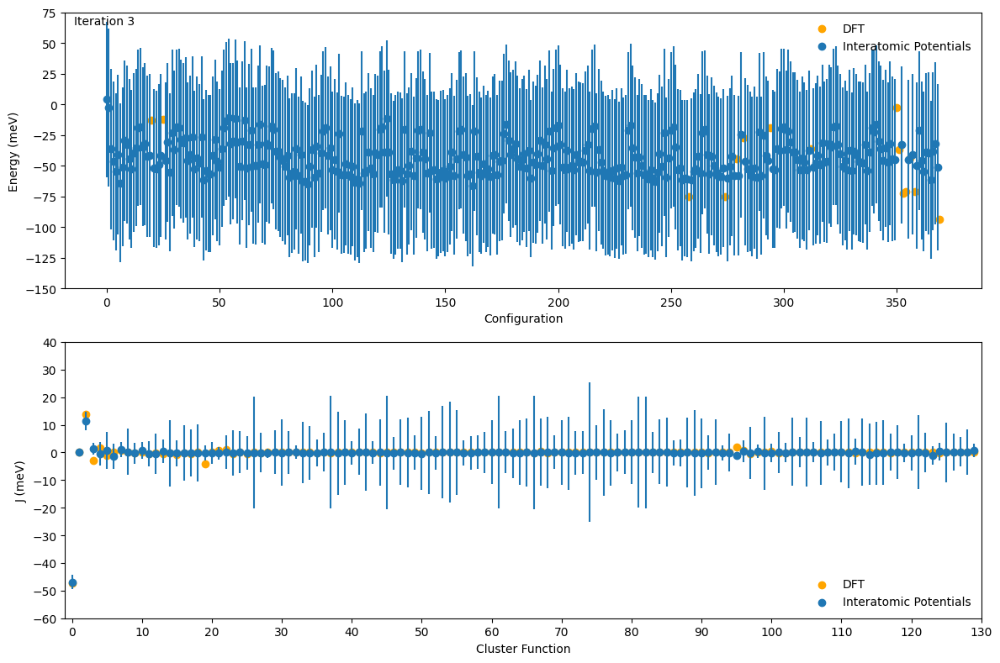

index of sampled structures: [369, 354, 353, 274, 258, 351, 350, 312, 25, 20, 358, 356, 294, 282, 279, 359, 284, 283, 247, 159]

RMSE = 7.600199276411201
R2 = 0.8638168445375976


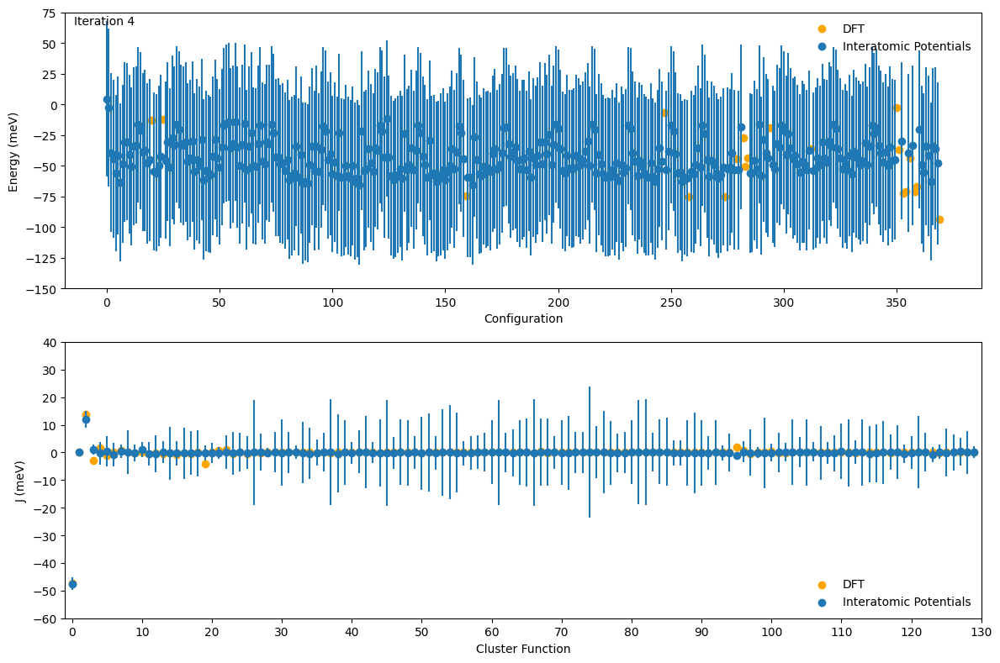

index of sampled structures: [369, 354, 353, 274, 258, 351, 350, 312, 25, 20, 358, 356, 294, 282, 279, 359, 284, 283, 247, 159, 343, 291, 233, 131, 29]

RMSE = 7.269416472357789
R2 = 0.8833626234557225


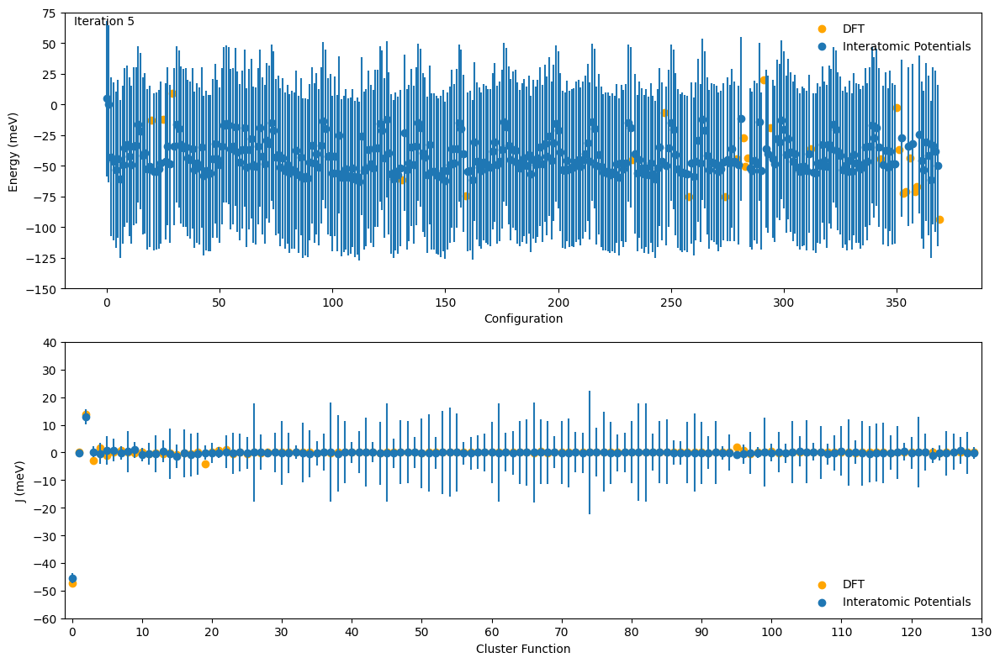

index of sampled structures: [369, 354, 353, 274, 258, 351, 350, 312, 25, 20, 358, 356, 294, 282, 279, 359, 284, 283, 247, 159, 343, 291, 233, 131, 29, 319, 281, 275, 262, 24]

RMSE = 6.722391104643923
R2 = 0.8922872136807213


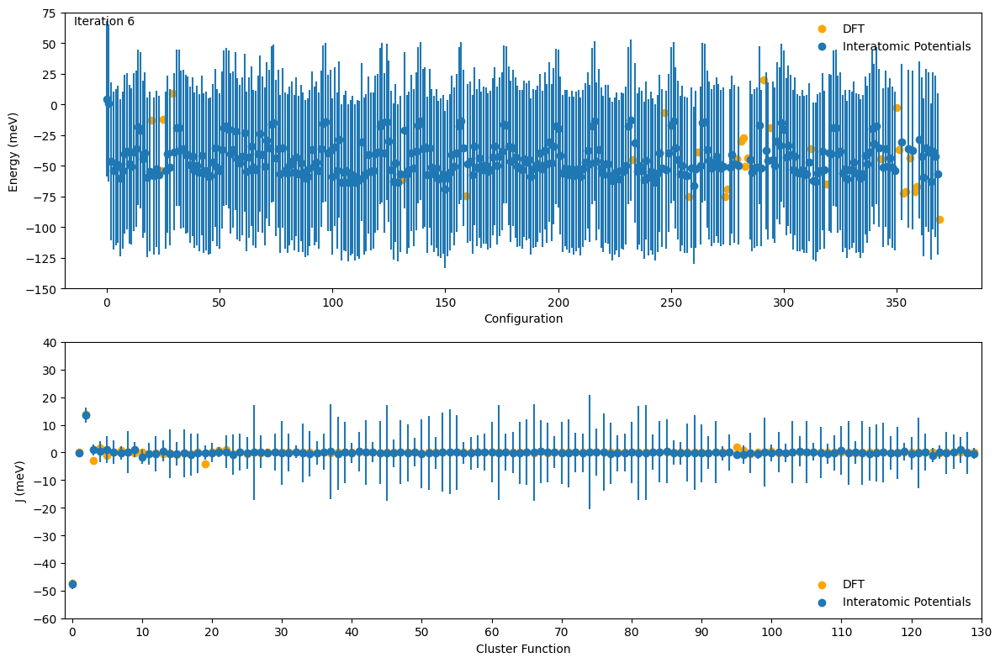

index of sampled structures: [369, 354, 353, 274, 258, 351, 350, 312, 25, 20, 358, 356, 294, 282, 279, 359, 284, 283, 247, 159, 343, 291, 233, 131, 29, 319, 281, 275, 262, 24, 368, 331, 252, 182, 125]

RMSE = 6.675702614693016
R2 = 0.8918926957643168


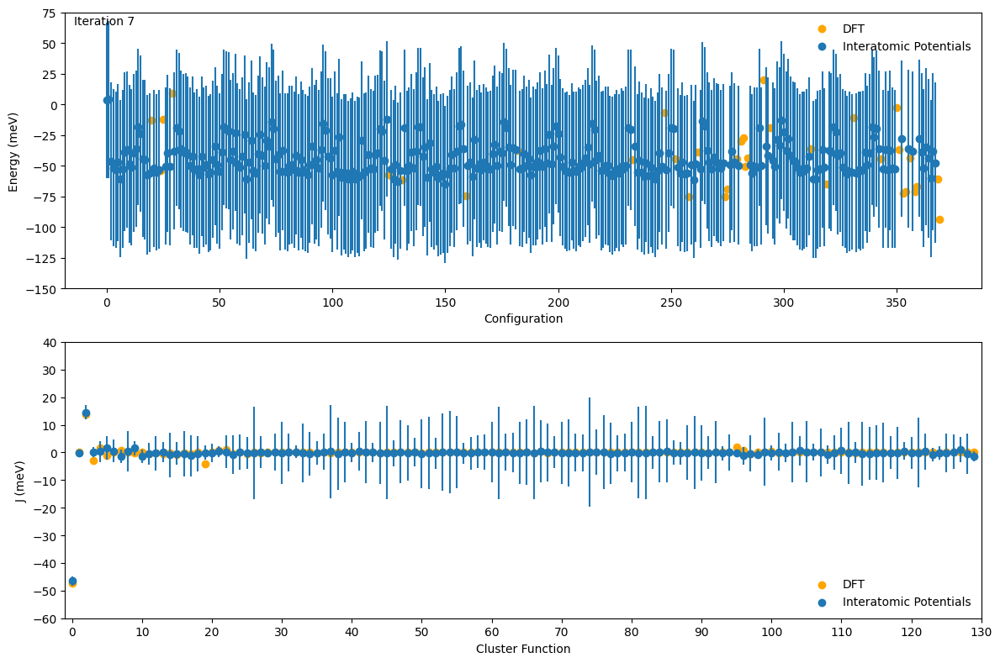

index of sampled structures: [369, 354, 353, 274, 258, 351, 350, 312, 25, 20, 358, 356, 294, 282, 279, 359, 284, 283, 247, 159, 343, 291, 233, 131, 29, 319, 281, 275, 262, 24, 368, 331, 252, 182, 125, 367, 348, 99, 63, 58]

RMSE = 6.1456916750342145
R2 = 0.9122771710062652


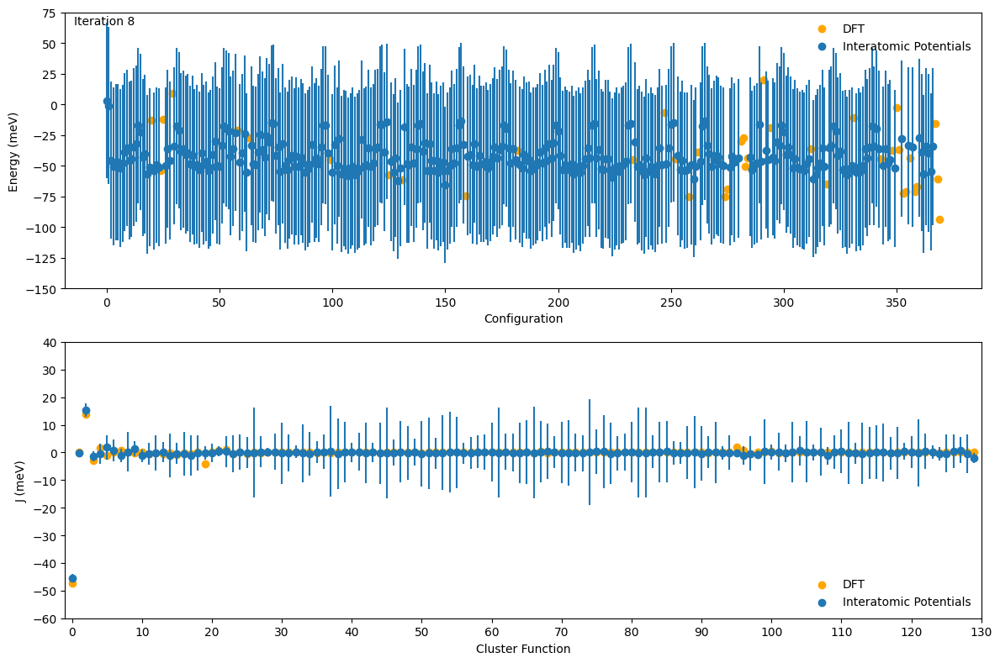

index of sampled structures: [369, 354, 353, 274, 258, 351, 350, 312, 25, 20, 358, 356, 294, 282, 279, 359, 284, 283, 247, 159, 343, 291, 233, 131, 29, 319, 281, 275, 262, 24, 368, 331, 252, 182, 125, 367, 348, 99, 63, 58, 259, 181, 149, 148, 87]

RMSE = 6.014896360042881
R2 = 0.914312968695195


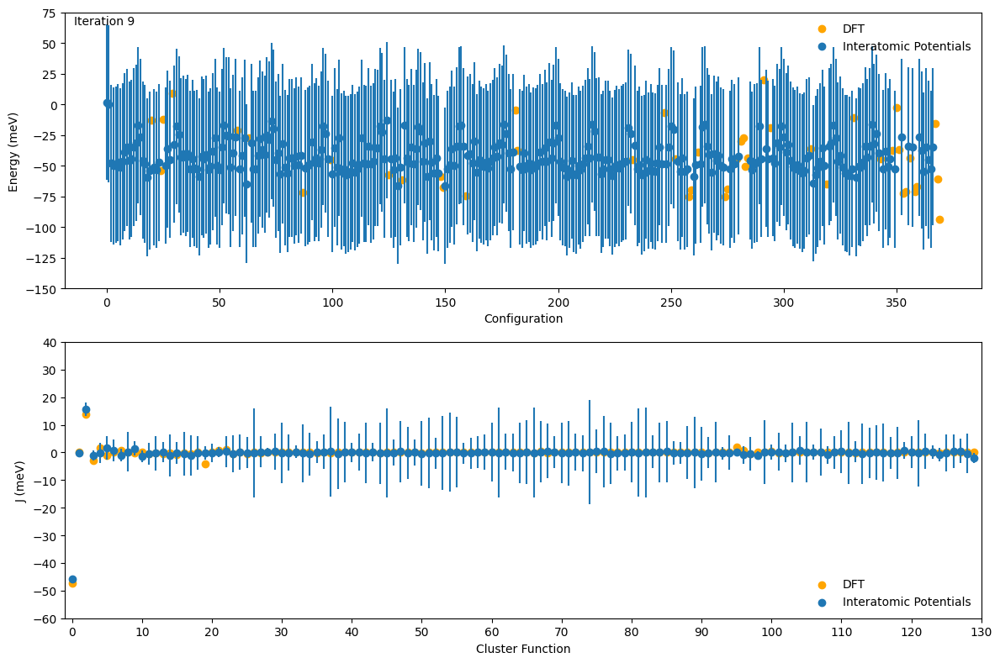

index of sampled structures: [369, 354, 353, 274, 258, 351, 350, 312, 25, 20, 358, 356, 294, 282, 279, 359, 284, 283, 247, 159, 343, 291, 233, 131, 29, 319, 281, 275, 262, 24, 368, 331, 252, 182, 125, 367, 348, 99, 63, 58, 259, 181, 149, 148, 87, 347, 340, 234, 232, 93]

RMSE = 6.005471776823394
R2 = 0.9137303294020556


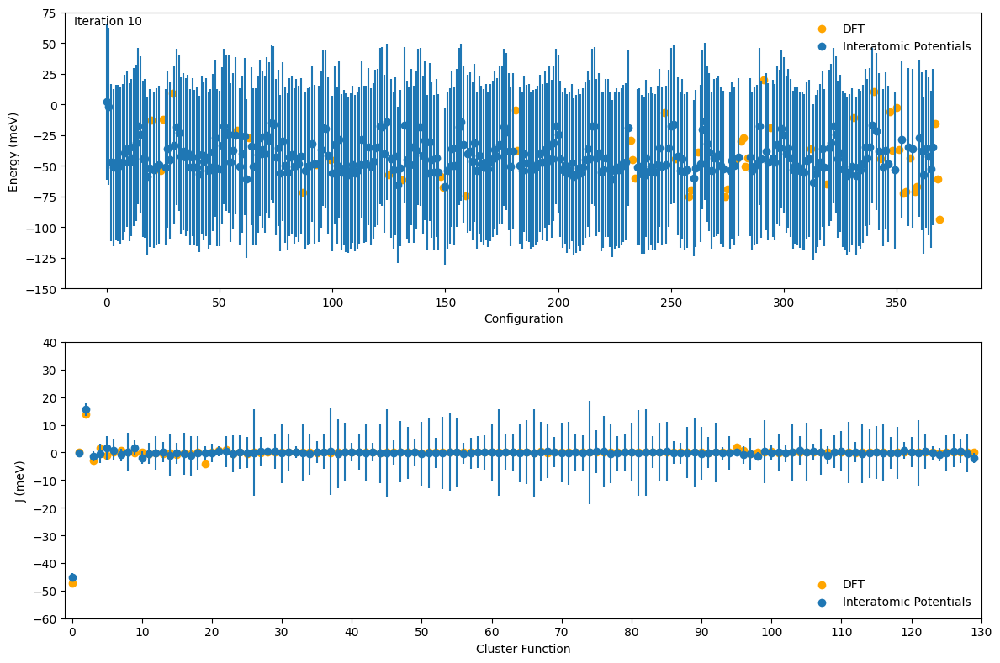

index of sampled structures: [369, 354, 353, 274, 258, 351, 350, 312, 25, 20, 358, 356, 294, 282, 279, 359, 284, 283, 247, 159, 343, 291, 233, 131, 29, 319, 281, 275, 262, 24, 368, 331, 252, 182, 125, 367, 348, 99, 63, 58, 259, 181, 149, 148, 87, 347, 340, 234, 232, 93, 357, 288, 264, 255, 78]

RMSE = 5.571778646341892
R2 = 0.9231160402609296


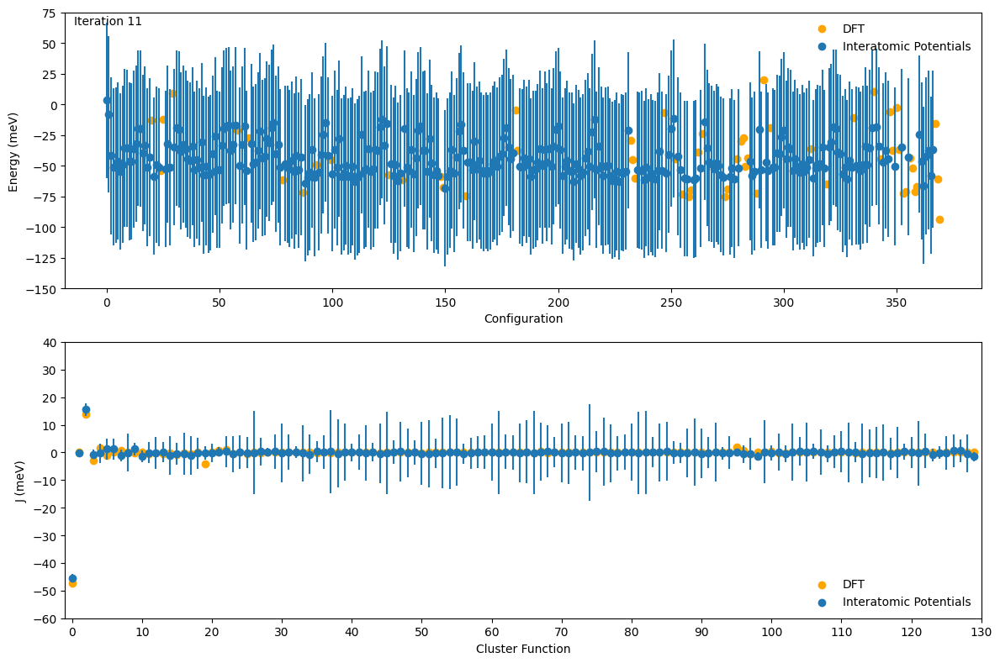

index of sampled structures: [369, 354, 353, 274, 258, 351, 350, 312, 25, 20, 358, 356, 294, 282, 279, 359, 284, 283, 247, 159, 343, 291, 233, 131, 29, 319, 281, 275, 262, 24, 368, 331, 252, 182, 125, 367, 348, 99, 63, 58, 259, 181, 149, 148, 87, 347, 340, 234, 232, 93, 357, 288, 264, 255, 78, 302, 179, 174, 141, 55]

RMSE = 5.720367206451502
R2 = 0.9193448560672899


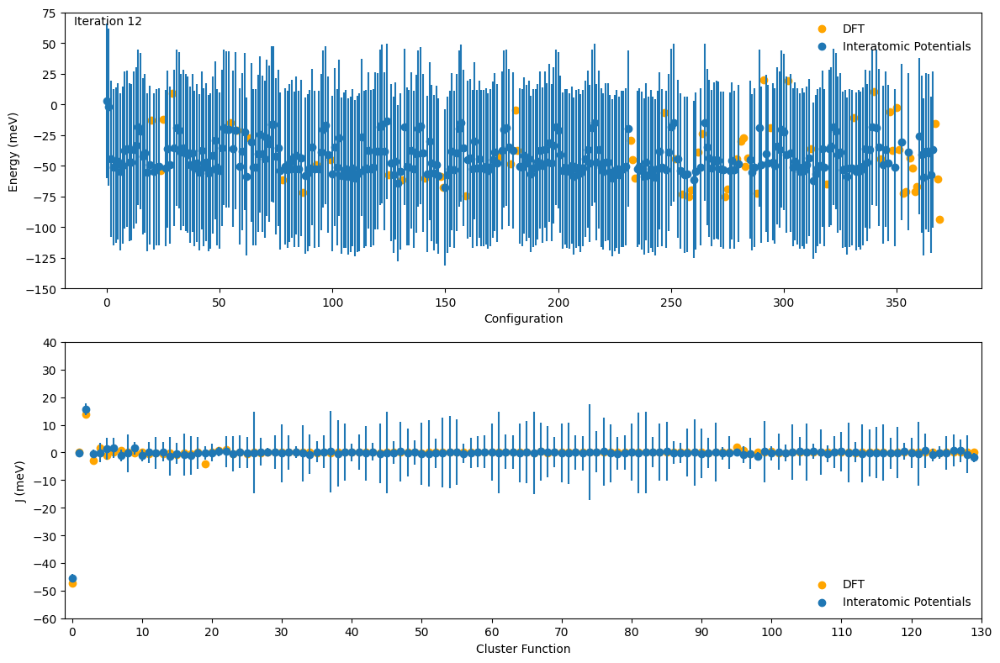

index of sampled structures: [369, 354, 353, 274, 258, 351, 350, 312, 25, 20, 358, 356, 294, 282, 279, 359, 284, 283, 247, 159, 343, 291, 233, 131, 29, 319, 281, 275, 262, 24, 368, 331, 252, 182, 125, 367, 348, 99, 63, 58, 259, 181, 149, 148, 87, 347, 340, 234, 232, 93, 357, 288, 264, 255, 78, 302, 179, 174, 141, 55, 237, 216, 133, 64, 42]

RMSE = 5.743844510291134
R2 = 0.9192686406653595


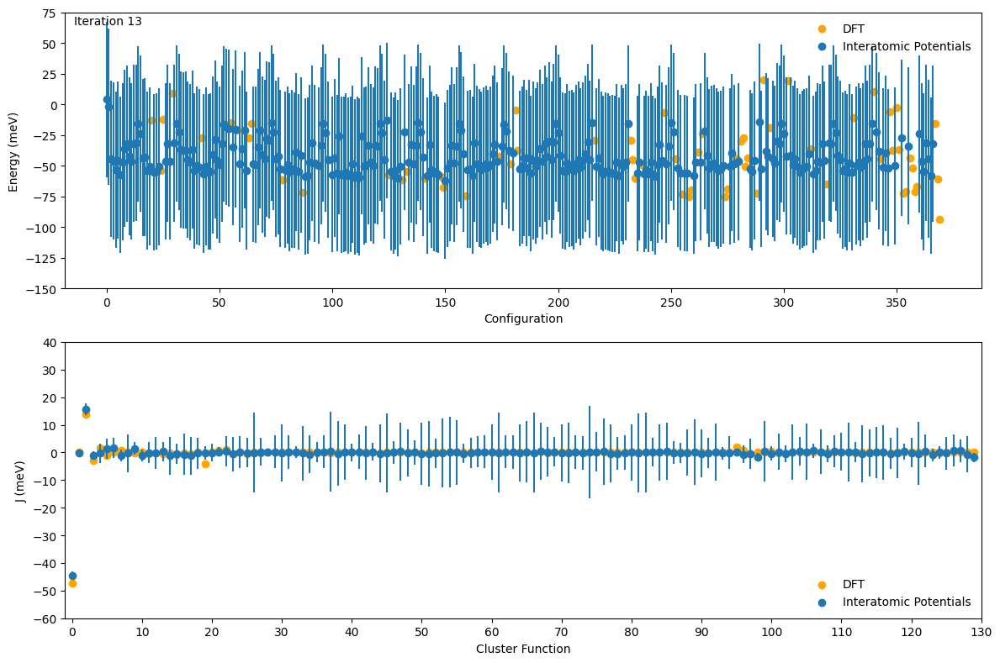

index of sampled structures: [369, 354, 353, 274, 258, 351, 350, 312, 25, 20, 358, 356, 294, 282, 279, 359, 284, 283, 247, 159, 343, 291, 233, 131, 29, 319, 281, 275, 262, 24, 368, 331, 252, 182, 125, 367, 348, 99, 63, 58, 259, 181, 149, 148, 87, 347, 340, 234, 232, 93, 357, 288, 264, 255, 78, 302, 179, 174, 141, 55, 237, 216, 133, 64, 42, 304, 287, 204, 62, 43]

RMSE = 5.678597116753924
R2 = 0.9213127039504734


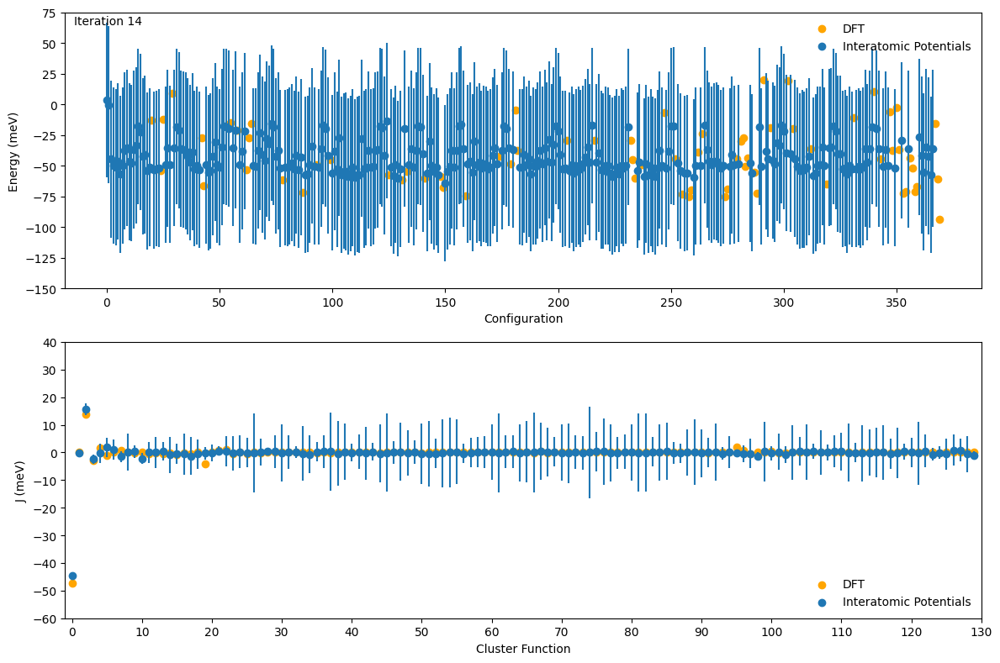

index of sampled structures: [369, 354, 353, 274, 258, 351, 350, 312, 25, 20, 358, 356, 294, 282, 279, 359, 284, 283, 247, 159, 343, 291, 233, 131, 29, 319, 281, 275, 262, 24, 368, 331, 252, 182, 125, 367, 348, 99, 63, 58, 259, 181, 149, 148, 87, 347, 340, 234, 232, 93, 357, 288, 264, 255, 78, 302, 179, 174, 141, 55, 237, 216, 133, 64, 42, 304, 287, 204, 62, 43, 270, 219, 218, 122, 19]

RMSE = 5.6184897803524665
R2 = 0.9221834219076522


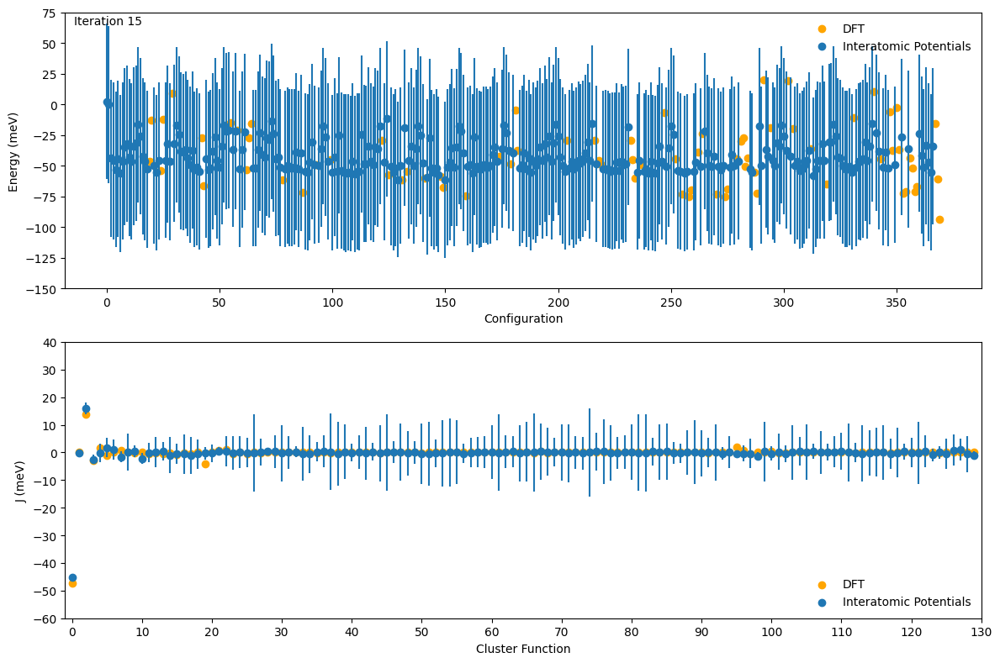

index of sampled structures: [369, 354, 353, 274, 258, 351, 350, 312, 25, 20, 358, 356, 294, 282, 279, 359, 284, 283, 247, 159, 343, 291, 233, 131, 29, 319, 281, 275, 262, 24, 368, 331, 252, 182, 125, 367, 348, 99, 63, 58, 259, 181, 149, 148, 87, 347, 340, 234, 232, 93, 357, 288, 264, 255, 78, 302, 179, 174, 141, 55, 237, 216, 133, 64, 42, 304, 287, 204, 62, 43, 270, 219, 218, 122, 19, 278, 241, 196, 162, 44]

RMSE = 5.545260245962662
R2 = 0.9239652524425817


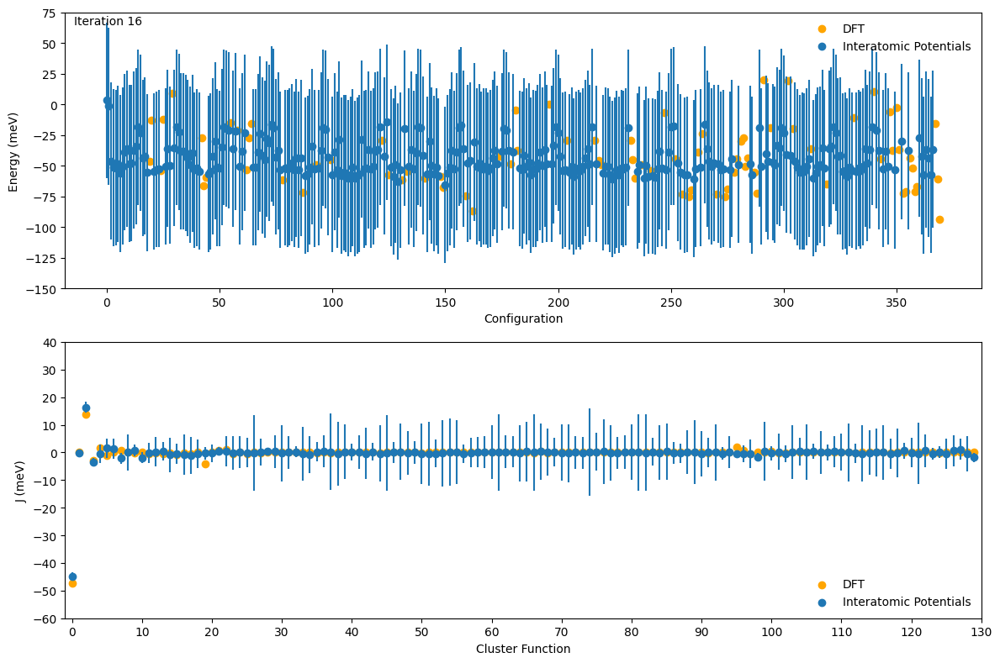

index of sampled structures: [369, 354, 353, 274, 258, 351, 350, 312, 25, 20, 358, 356, 294, 282, 279, 359, 284, 283, 247, 159, 343, 291, 233, 131, 29, 319, 281, 275, 262, 24, 368, 331, 252, 182, 125, 367, 348, 99, 63, 58, 259, 181, 149, 148, 87, 347, 340, 234, 232, 93, 357, 288, 264, 255, 78, 302, 179, 174, 141, 55, 237, 216, 133, 64, 42, 304, 287, 204, 62, 43, 270, 219, 218, 122, 19, 278, 241, 196, 162, 44, 329, 314, 208, 101, 17]

RMSE = 5.640290933713882
R2 = 0.9212352936150836


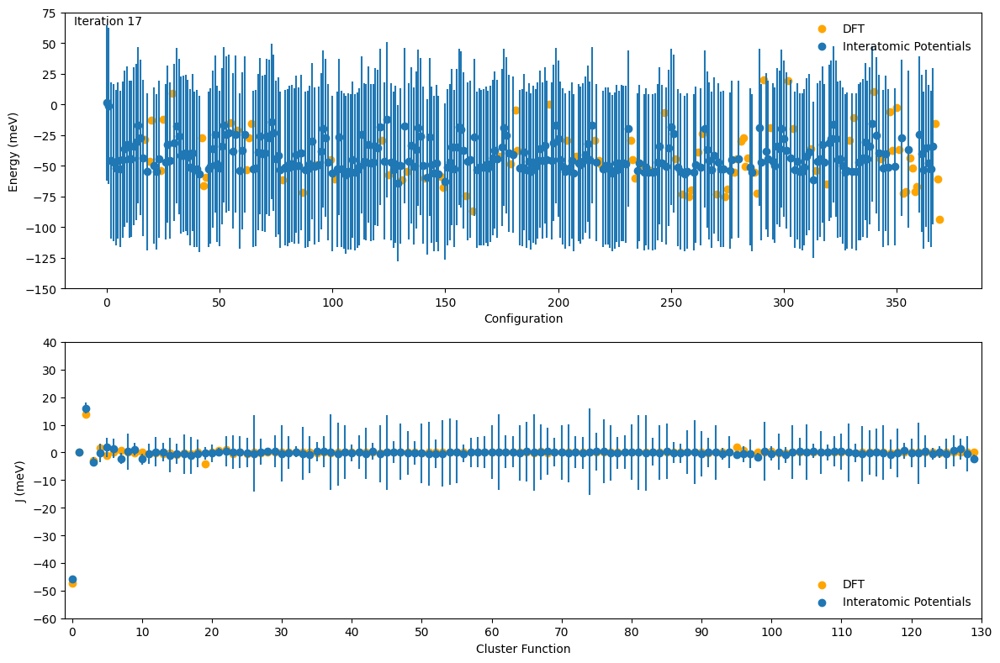

index of sampled structures: [369, 354, 353, 274, 258, 351, 350, 312, 25, 20, 358, 356, 294, 282, 279, 359, 284, 283, 247, 159, 343, 291, 233, 131, 29, 319, 281, 275, 262, 24, 368, 331, 252, 182, 125, 367, 348, 99, 63, 58, 259, 181, 149, 148, 87, 347, 340, 234, 232, 93, 357, 288, 264, 255, 78, 302, 179, 174, 141, 55, 237, 216, 133, 64, 42, 304, 287, 204, 62, 43, 270, 219, 218, 122, 19, 278, 241, 196, 162, 44, 329, 314, 208, 101, 17, 175, 172, 161, 106, 97]

RMSE = 5.394134365341847
R2 = 0.9277580854646882


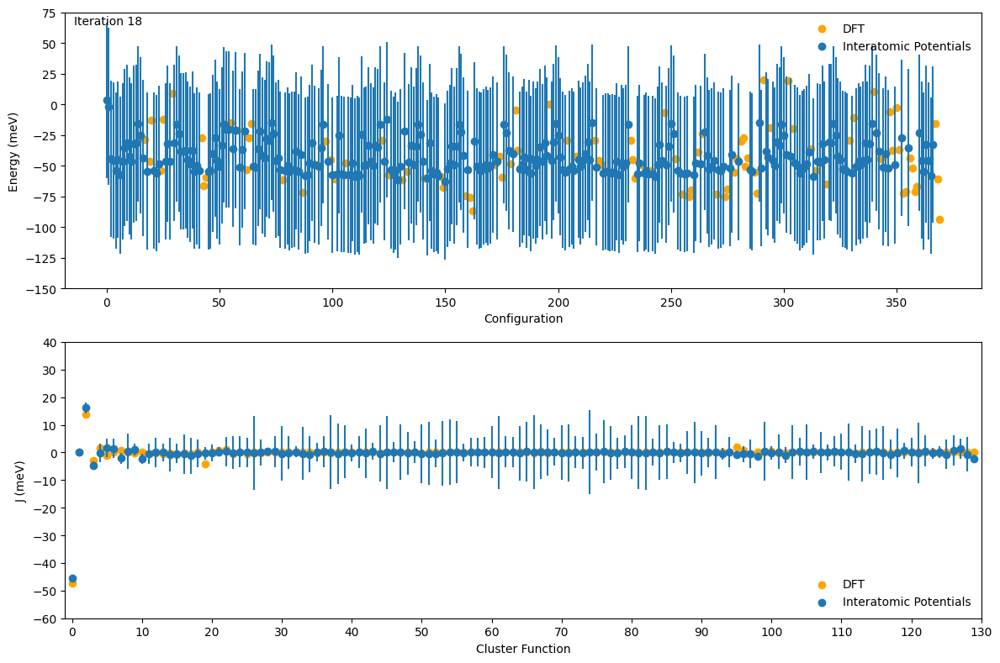

index of sampled structures: [369, 354, 353, 274, 258, 351, 350, 312, 25, 20, 358, 356, 294, 282, 279, 359, 284, 283, 247, 159, 343, 291, 233, 131, 29, 319, 281, 275, 262, 24, 368, 331, 252, 182, 125, 367, 348, 99, 63, 58, 259, 181, 149, 148, 87, 347, 340, 234, 232, 93, 357, 288, 264, 255, 78, 302, 179, 174, 141, 55, 237, 216, 133, 64, 42, 304, 287, 204, 62, 43, 270, 219, 218, 122, 19, 278, 241, 196, 162, 44, 329, 314, 208, 101, 17, 175, 172, 161, 106, 97, 335, 334, 143, 140, 126]

RMSE = 5.075033608240755
R2 = 0.9368436143595763


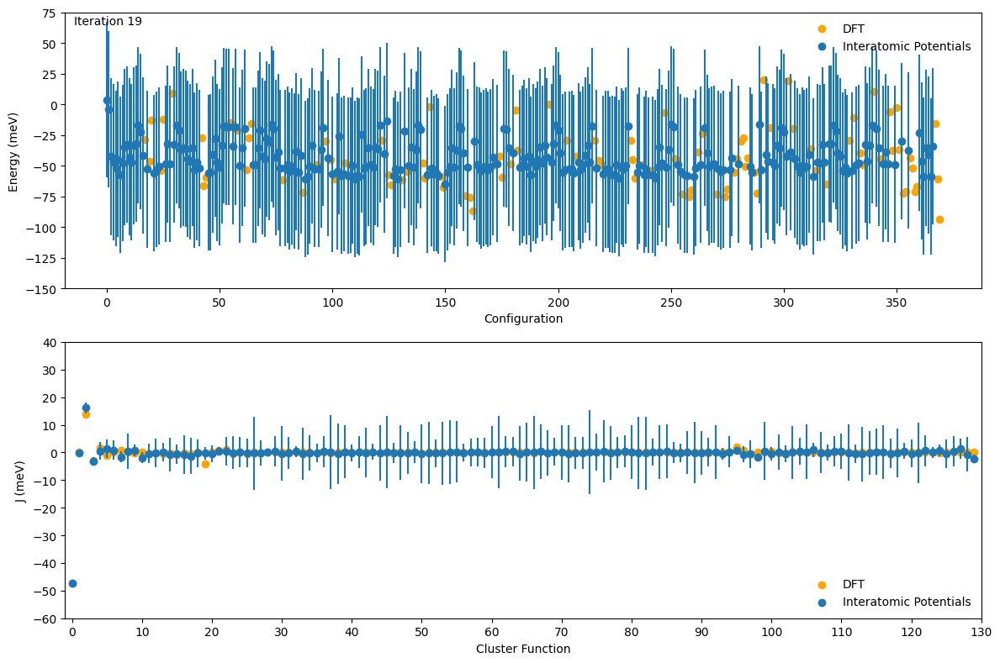

index of sampled structures: [369, 354, 353, 274, 258, 351, 350, 312, 25, 20, 358, 356, 294, 282, 279, 359, 284, 283, 247, 159, 343, 291, 233, 131, 29, 319, 281, 275, 262, 24, 368, 331, 252, 182, 125, 367, 348, 99, 63, 58, 259, 181, 149, 148, 87, 347, 340, 234, 232, 93, 357, 288, 264, 255, 78, 302, 179, 174, 141, 55, 237, 216, 133, 64, 42, 304, 287, 204, 62, 43, 270, 219, 218, 122, 19, 278, 241, 196, 162, 44, 329, 314, 208, 101, 17, 175, 172, 161, 106, 97, 335, 334, 143, 140, 126, 364, 277, 123, 92, 40]

RMSE = 4.981421704070116
R2 = 0.9398618222249585


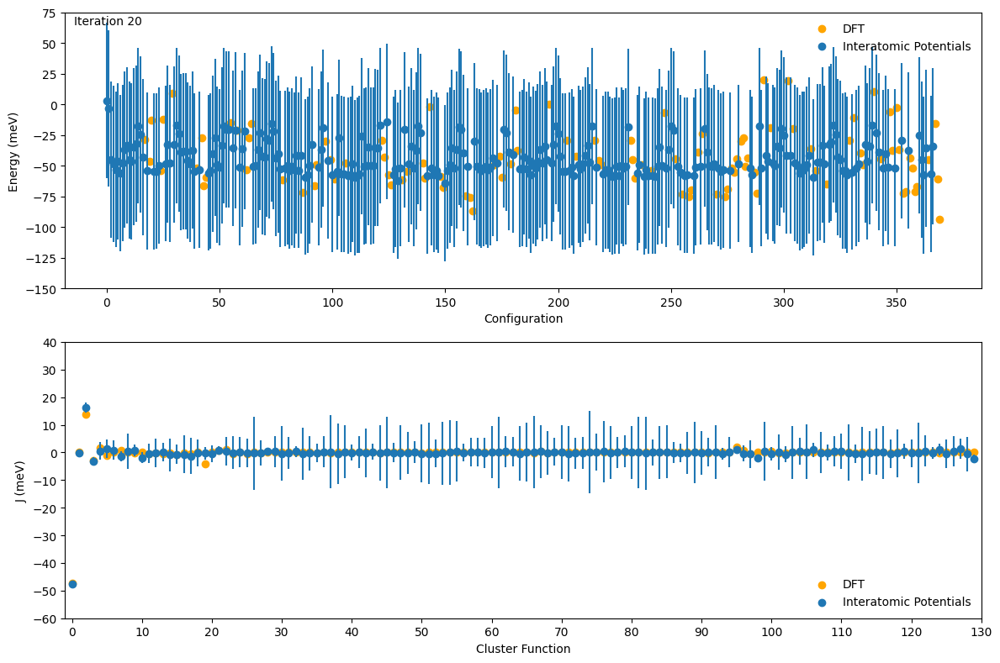

index of sampled structures: [369, 354, 353, 274, 258, 351, 350, 312, 25, 20, 358, 356, 294, 282, 279, 359, 284, 283, 247, 159, 343, 291, 233, 131, 29, 319, 281, 275, 262, 24, 368, 331, 252, 182, 125, 367, 348, 99, 63, 58, 259, 181, 149, 148, 87, 347, 340, 234, 232, 93, 357, 288, 264, 255, 78, 302, 179, 174, 141, 55, 237, 216, 133, 64, 42, 304, 287, 204, 62, 43, 270, 219, 218, 122, 19, 278, 241, 196, 162, 44, 329, 314, 208, 101, 17, 175, 172, 161, 106, 97, 335, 334, 143, 140, 126, 364, 277, 123, 92, 40, 308, 163, 18, 12, 10]

RMSE = 4.707740801693397
R2 = 0.9466065514529366


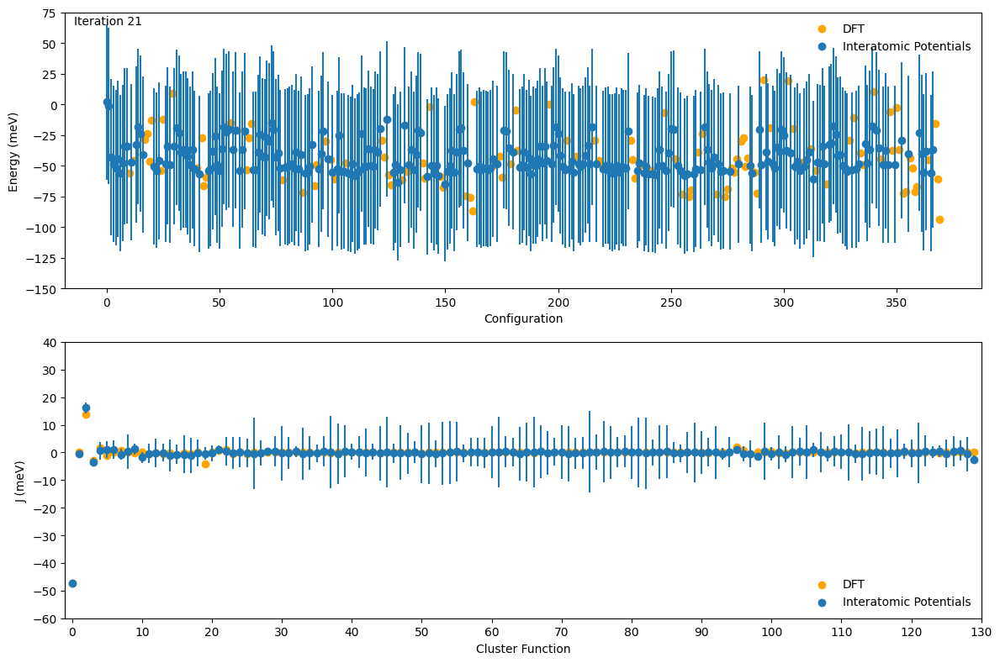

index of sampled structures: [369, 354, 353, 274, 258, 351, 350, 312, 25, 20, 358, 356, 294, 282, 279, 359, 284, 283, 247, 159, 343, 291, 233, 131, 29, 319, 281, 275, 262, 24, 368, 331, 252, 182, 125, 367, 348, 99, 63, 58, 259, 181, 149, 148, 87, 347, 340, 234, 232, 93, 357, 288, 264, 255, 78, 302, 179, 174, 141, 55, 237, 216, 133, 64, 42, 304, 287, 204, 62, 43, 270, 219, 218, 122, 19, 278, 241, 196, 162, 44, 329, 314, 208, 101, 17, 175, 172, 161, 106, 97, 335, 334, 143, 140, 126, 364, 277, 123, 92, 40, 308, 163, 18, 12, 10, 271, 267, 253, 160, 146]

RMSE = 4.804580765463466
R2 = 0.9456637842094641


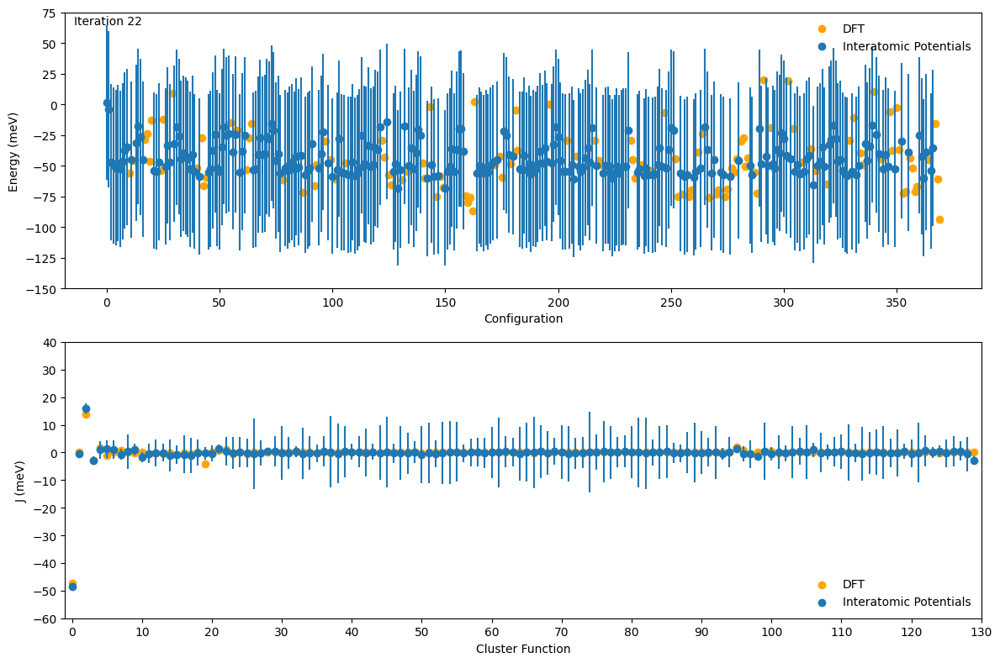

index of sampled structures: [369, 354, 353, 274, 258, 351, 350, 312, 25, 20, 358, 356, 294, 282, 279, 359, 284, 283, 247, 159, 343, 291, 233, 131, 29, 319, 281, 275, 262, 24, 368, 331, 252, 182, 125, 367, 348, 99, 63, 58, 259, 181, 149, 148, 87, 347, 340, 234, 232, 93, 357, 288, 264, 255, 78, 302, 179, 174, 141, 55, 237, 216, 133, 64, 42, 304, 287, 204, 62, 43, 270, 219, 218, 122, 19, 278, 241, 196, 162, 44, 329, 314, 208, 101, 17, 175, 172, 161, 106, 97, 335, 334, 143, 140, 126, 364, 277, 123, 92, 40, 308, 163, 18, 12, 10, 271, 267, 253, 160, 146, 321, 299, 248, 154, 23]

RMSE = 4.862124706763117
R2 = 0.9444802882845545


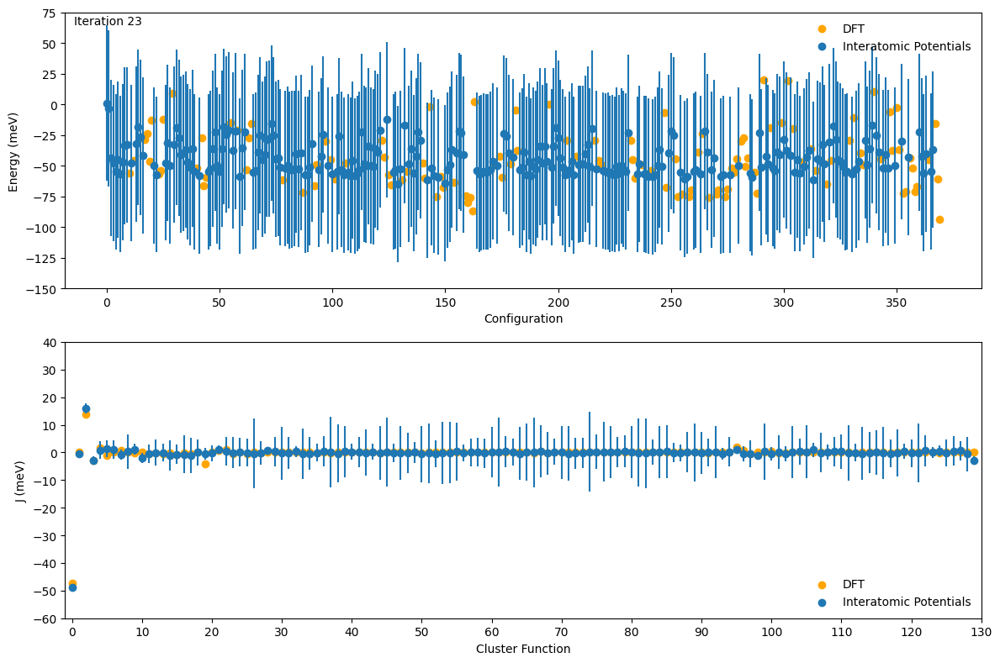

index of sampled structures: [369, 354, 353, 274, 258, 351, 350, 312, 25, 20, 358, 356, 294, 282, 279, 359, 284, 283, 247, 159, 343, 291, 233, 131, 29, 319, 281, 275, 262, 24, 368, 331, 252, 182, 125, 367, 348, 99, 63, 58, 259, 181, 149, 148, 87, 347, 340, 234, 232, 93, 357, 288, 264, 255, 78, 302, 179, 174, 141, 55, 237, 216, 133, 64, 42, 304, 287, 204, 62, 43, 270, 219, 218, 122, 19, 278, 241, 196, 162, 44, 329, 314, 208, 101, 17, 175, 172, 161, 106, 97, 335, 334, 143, 140, 126, 364, 277, 123, 92, 40, 308, 163, 18, 12, 10, 271, 267, 253, 160, 146, 321, 299, 248, 154, 23, 362, 332, 195, 84, 38]

RMSE = 4.664140692750265
R2 = 0.947828897573137


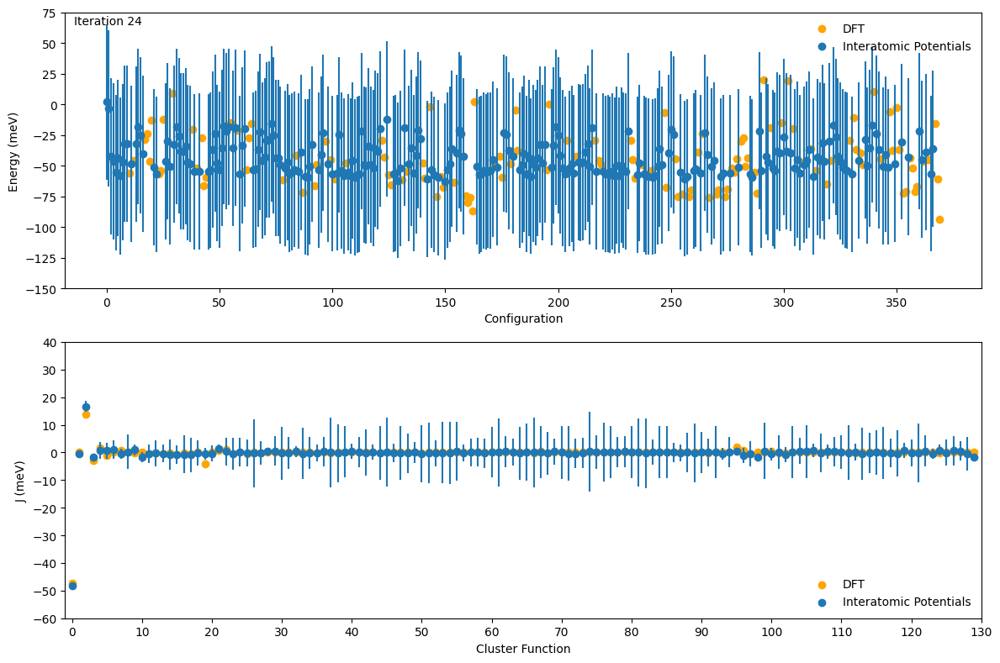

index of sampled structures: [369, 354, 353, 274, 258, 351, 350, 312, 25, 20, 358, 356, 294, 282, 279, 359, 284, 283, 247, 159, 343, 291, 233, 131, 29, 319, 281, 275, 262, 24, 368, 331, 252, 182, 125, 367, 348, 99, 63, 58, 259, 181, 149, 148, 87, 347, 340, 234, 232, 93, 357, 288, 264, 255, 78, 302, 179, 174, 141, 55, 237, 216, 133, 64, 42, 304, 287, 204, 62, 43, 270, 219, 218, 122, 19, 278, 241, 196, 162, 44, 329, 314, 208, 101, 17, 175, 172, 161, 106, 97, 335, 334, 143, 140, 126, 364, 277, 123, 92, 40, 308, 163, 18, 12, 10, 271, 267, 253, 160, 146, 321, 299, 248, 154, 23, 362, 332, 195, 84, 38, 310, 305, 251, 189, 137]

RMSE = 4.31260505697979
R2 = 0.9543206608849636


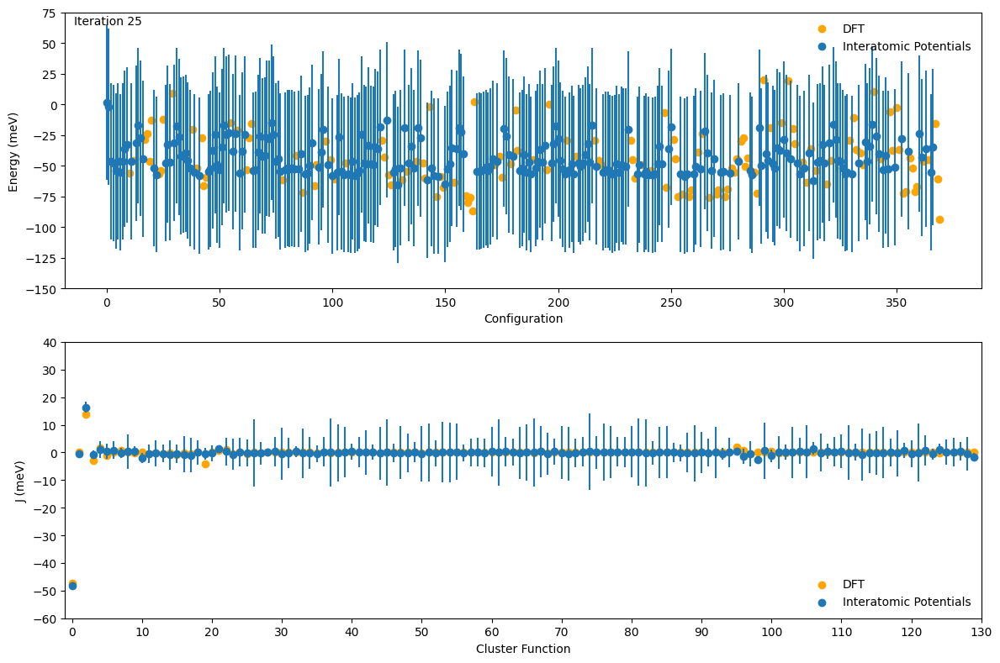

index of sampled structures: [369, 354, 353, 274, 258, 351, 350, 312, 25, 20, 358, 356, 294, 282, 279, 359, 284, 283, 247, 159, 343, 291, 233, 131, 29, 319, 281, 275, 262, 24, 368, 331, 252, 182, 125, 367, 348, 99, 63, 58, 259, 181, 149, 148, 87, 347, 340, 234, 232, 93, 357, 288, 264, 255, 78, 302, 179, 174, 141, 55, 237, 216, 133, 64, 42, 304, 287, 204, 62, 43, 270, 219, 218, 122, 19, 278, 241, 196, 162, 44, 329, 314, 208, 101, 17, 175, 172, 161, 106, 97, 335, 334, 143, 140, 126, 364, 277, 123, 92, 40, 308, 163, 18, 12, 10, 271, 267, 253, 160, 146, 321, 299, 248, 154, 23, 362, 332, 195, 84, 38, 310, 305, 251, 189, 137, 338, 285, 165, 139, 81]

RMSE = 4.3955314444689195
R2 = 0.9529130231135737


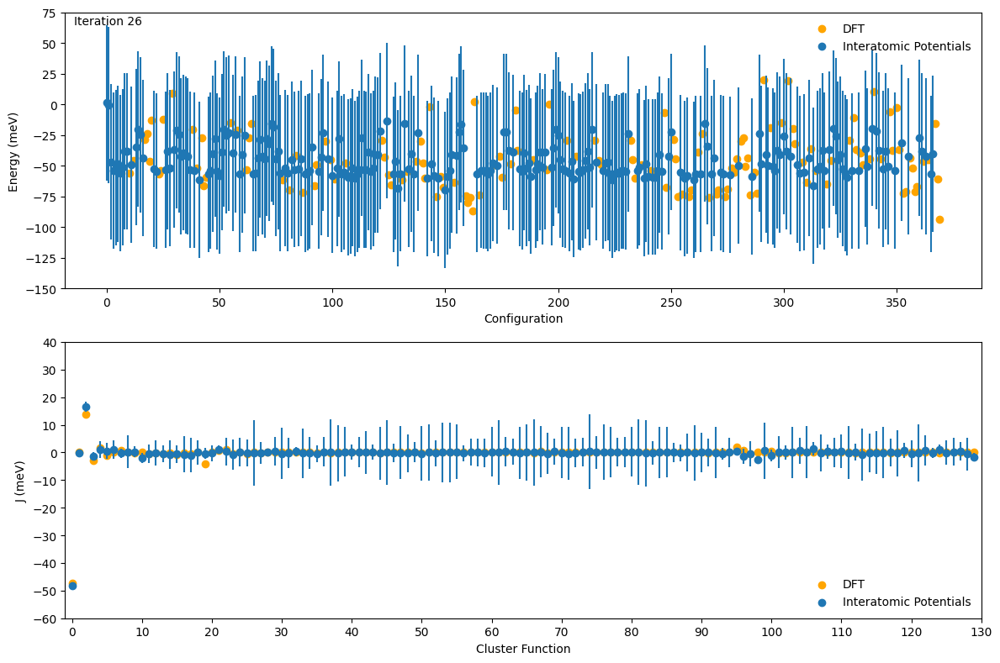

index of sampled structures: [369, 354, 353, 274, 258, 351, 350, 312, 25, 20, 358, 356, 294, 282, 279, 359, 284, 283, 247, 159, 343, 291, 233, 131, 29, 319, 281, 275, 262, 24, 368, 331, 252, 182, 125, 367, 348, 99, 63, 58, 259, 181, 149, 148, 87, 347, 340, 234, 232, 93, 357, 288, 264, 255, 78, 302, 179, 174, 141, 55, 237, 216, 133, 64, 42, 304, 287, 204, 62, 43, 270, 219, 218, 122, 19, 278, 241, 196, 162, 44, 329, 314, 208, 101, 17, 175, 172, 161, 106, 97, 335, 334, 143, 140, 126, 364, 277, 123, 92, 40, 308, 163, 18, 12, 10, 271, 267, 253, 160, 146, 321, 299, 248, 154, 23, 362, 332, 195, 84, 38, 310, 305, 251, 189, 137, 338, 285, 165, 139, 81, 289, 269, 210, 176, 48]

RMSE = 4.36199450431224
R2 = 0.9537558010907795


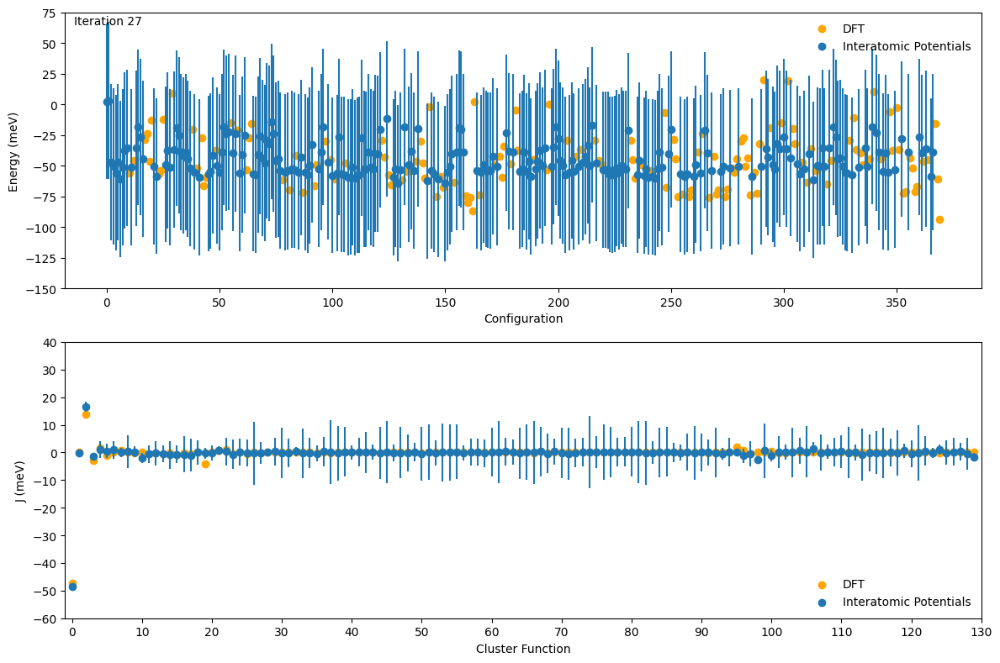

index of sampled structures: [369, 354, 353, 274, 258, 351, 350, 312, 25, 20, 358, 356, 294, 282, 279, 359, 284, 283, 247, 159, 343, 291, 233, 131, 29, 319, 281, 275, 262, 24, 368, 331, 252, 182, 125, 367, 348, 99, 63, 58, 259, 181, 149, 148, 87, 347, 340, 234, 232, 93, 357, 288, 264, 255, 78, 302, 179, 174, 141, 55, 237, 216, 133, 64, 42, 304, 287, 204, 62, 43, 270, 219, 218, 122, 19, 278, 241, 196, 162, 44, 329, 314, 208, 101, 17, 175, 172, 161, 106, 97, 335, 334, 143, 140, 126, 364, 277, 123, 92, 40, 308, 163, 18, 12, 10, 271, 267, 253, 160, 146, 321, 299, 248, 154, 23, 362, 332, 195, 84, 38, 310, 305, 251, 189, 137, 338, 285, 165, 139, 81, 289, 269, 210, 176, 48, 361, 263, 209, 173, 70]

RMSE = 4.310167819625255
R2 = 0.9546359910465355


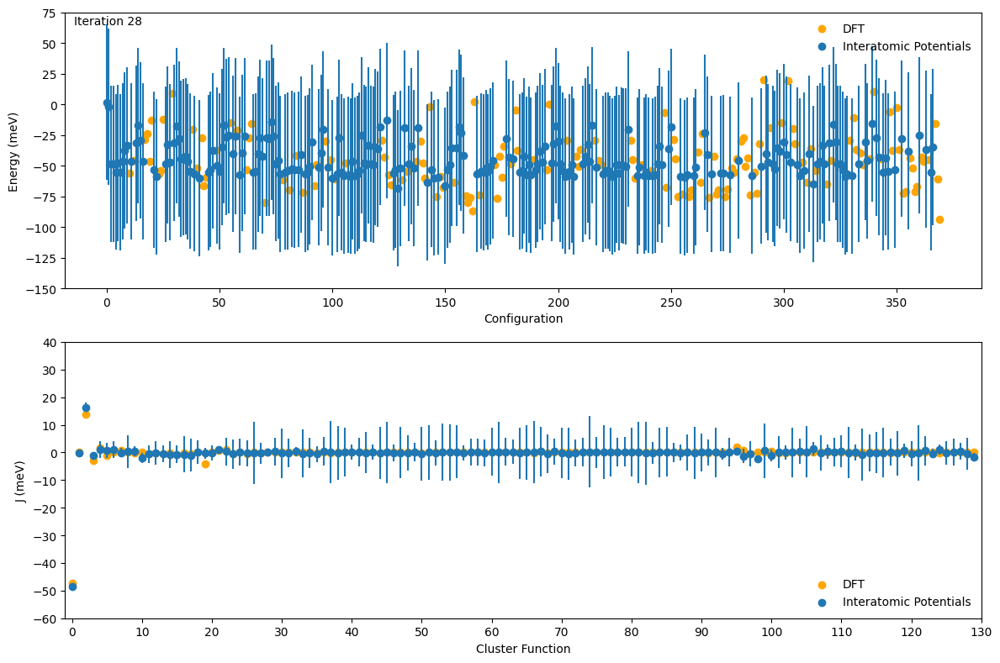

index of sampled structures: [369, 354, 353, 274, 258, 351, 350, 312, 25, 20, 358, 356, 294, 282, 279, 359, 284, 283, 247, 159, 343, 291, 233, 131, 29, 319, 281, 275, 262, 24, 368, 331, 252, 182, 125, 367, 348, 99, 63, 58, 259, 181, 149, 148, 87, 347, 340, 234, 232, 93, 357, 288, 264, 255, 78, 302, 179, 174, 141, 55, 237, 216, 133, 64, 42, 304, 287, 204, 62, 43, 270, 219, 218, 122, 19, 278, 241, 196, 162, 44, 329, 314, 208, 101, 17, 175, 172, 161, 106, 97, 335, 334, 143, 140, 126, 364, 277, 123, 92, 40, 308, 163, 18, 12, 10, 271, 267, 253, 160, 146, 321, 299, 248, 154, 23, 362, 332, 195, 84, 38, 310, 305, 251, 189, 137, 338, 285, 165, 139, 81, 289, 269, 210, 176, 48, 361, 263, 209, 173, 70, 315, 303, 239, 222, 82]

RMSE = 4.143200963506285
R2 = 0.958778842919137


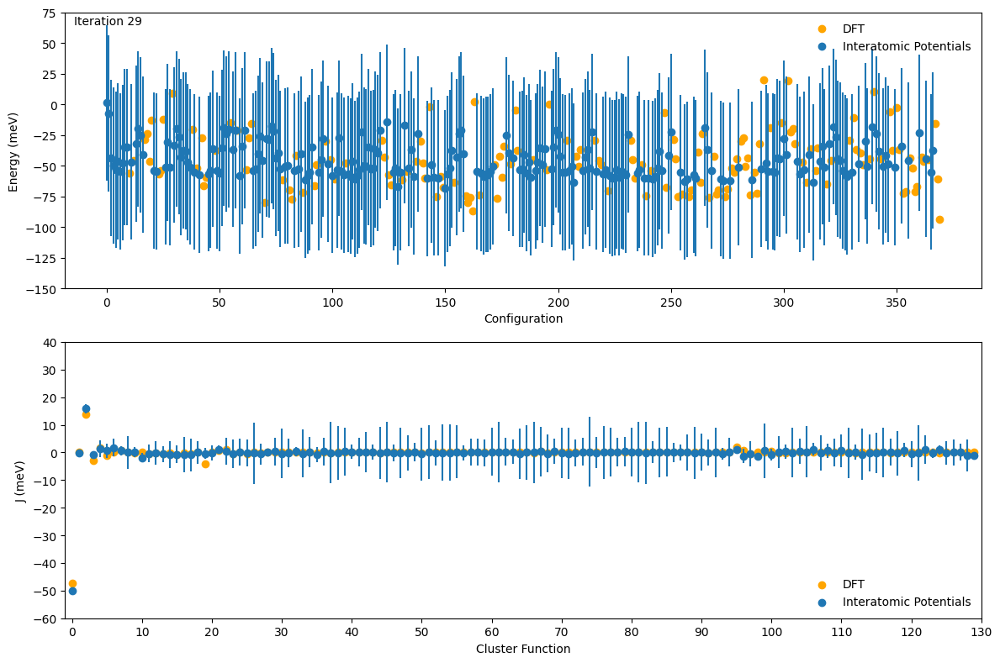

index of sampled structures: [369, 354, 353, 274, 258, 351, 350, 312, 25, 20, 358, 356, 294, 282, 279, 359, 284, 283, 247, 159, 343, 291, 233, 131, 29, 319, 281, 275, 262, 24, 368, 331, 252, 182, 125, 367, 348, 99, 63, 58, 259, 181, 149, 148, 87, 347, 340, 234, 232, 93, 357, 288, 264, 255, 78, 302, 179, 174, 141, 55, 237, 216, 133, 64, 42, 304, 287, 204, 62, 43, 270, 219, 218, 122, 19, 278, 241, 196, 162, 44, 329, 314, 208, 101, 17, 175, 172, 161, 106, 97, 335, 334, 143, 140, 126, 364, 277, 123, 92, 40, 308, 163, 18, 12, 10, 271, 267, 253, 160, 146, 321, 299, 248, 154, 23, 362, 332, 195, 84, 38, 310, 305, 251, 189, 137, 338, 285, 165, 139, 81, 289, 269, 210, 176, 48, 361, 263, 209, 173, 70, 315, 303, 239, 222, 82, 336, 292, 226, 184, 178]

RMSE = 4.128377480369523
R2 = 0.9592868276009116


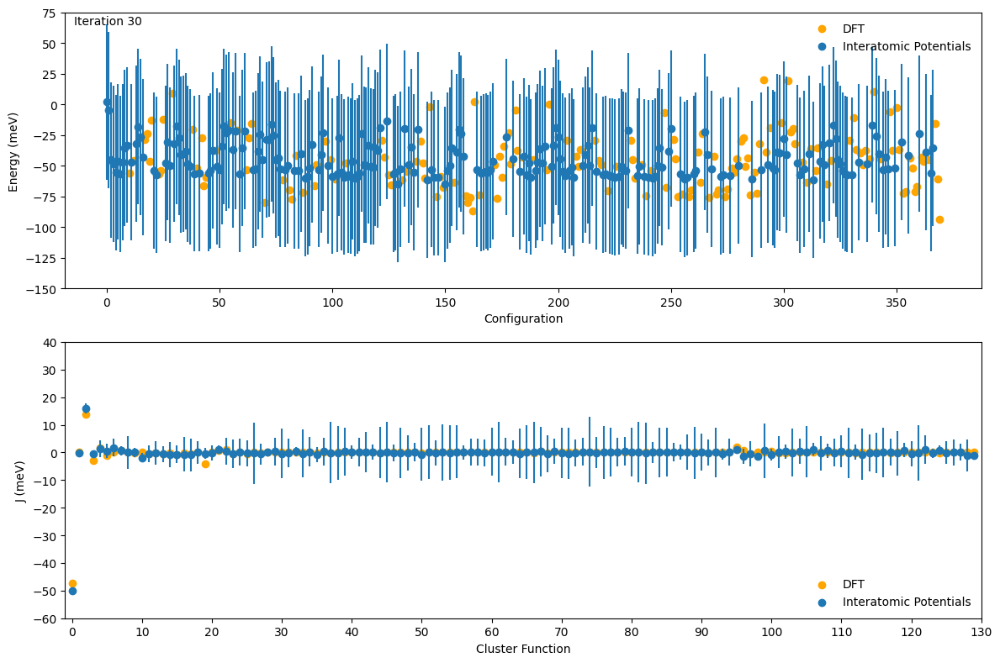

index of sampled structures: [369, 354, 353, 274, 258, 351, 350, 312, 25, 20, 358, 356, 294, 282, 279, 359, 284, 283, 247, 159, 343, 291, 233, 131, 29, 319, 281, 275, 262, 24, 368, 331, 252, 182, 125, 367, 348, 99, 63, 58, 259, 181, 149, 148, 87, 347, 340, 234, 232, 93, 357, 288, 264, 255, 78, 302, 179, 174, 141, 55, 237, 216, 133, 64, 42, 304, 287, 204, 62, 43, 270, 219, 218, 122, 19, 278, 241, 196, 162, 44, 329, 314, 208, 101, 17, 175, 172, 161, 106, 97, 335, 334, 143, 140, 126, 364, 277, 123, 92, 40, 308, 163, 18, 12, 10, 271, 267, 253, 160, 146, 321, 299, 248, 154, 23, 362, 332, 195, 84, 38, 310, 305, 251, 189, 137, 338, 285, 165, 139, 81, 289, 269, 210, 176, 48, 361, 263, 209, 173, 70, 315, 303, 239, 222, 82, 336, 292, 226, 184, 178, 355, 349, 344, 297, 112]

RMSE = 4.0824761515671115
R2 = 0.9600815142951248


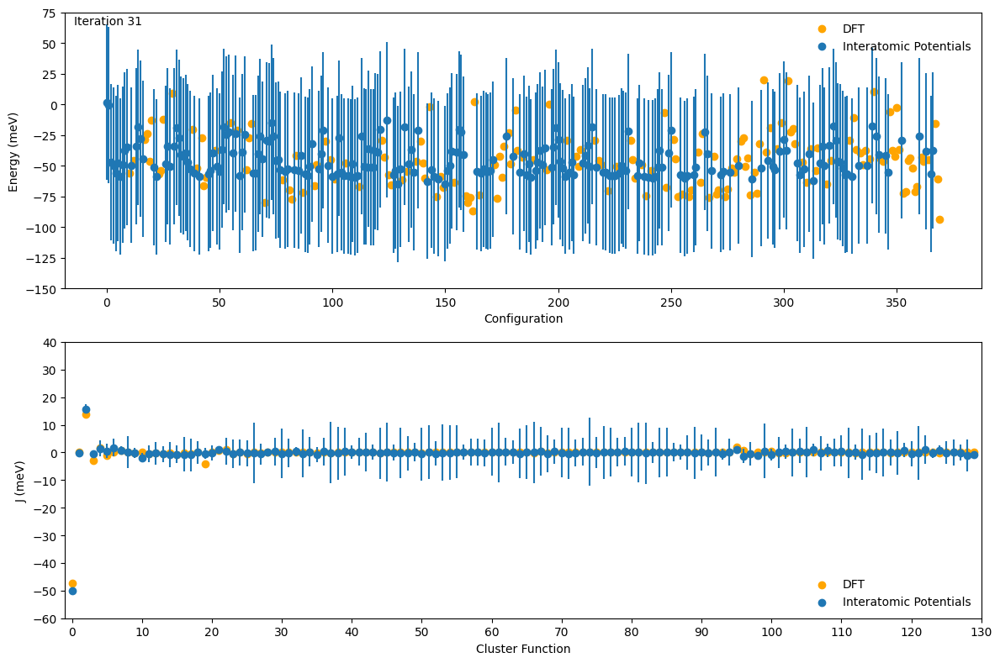

index of sampled structures: [369, 354, 353, 274, 258, 351, 350, 312, 25, 20, 358, 356, 294, 282, 279, 359, 284, 283, 247, 159, 343, 291, 233, 131, 29, 319, 281, 275, 262, 24, 368, 331, 252, 182, 125, 367, 348, 99, 63, 58, 259, 181, 149, 148, 87, 347, 340, 234, 232, 93, 357, 288, 264, 255, 78, 302, 179, 174, 141, 55, 237, 216, 133, 64, 42, 304, 287, 204, 62, 43, 270, 219, 218, 122, 19, 278, 241, 196, 162, 44, 329, 314, 208, 101, 17, 175, 172, 161, 106, 97, 335, 334, 143, 140, 126, 364, 277, 123, 92, 40, 308, 163, 18, 12, 10, 271, 267, 253, 160, 146, 321, 299, 248, 154, 23, 362, 332, 195, 84, 38, 310, 305, 251, 189, 137, 338, 285, 165, 139, 81, 289, 269, 210, 176, 48, 361, 263, 209, 173, 70, 315, 303, 239, 222, 82, 336, 292, 226, 184, 178, 355, 349, 344, 297, 112, 301, 280, 245, 221, 207]

RMSE = 4.0052334573643265
R2 = 0.962043886044329


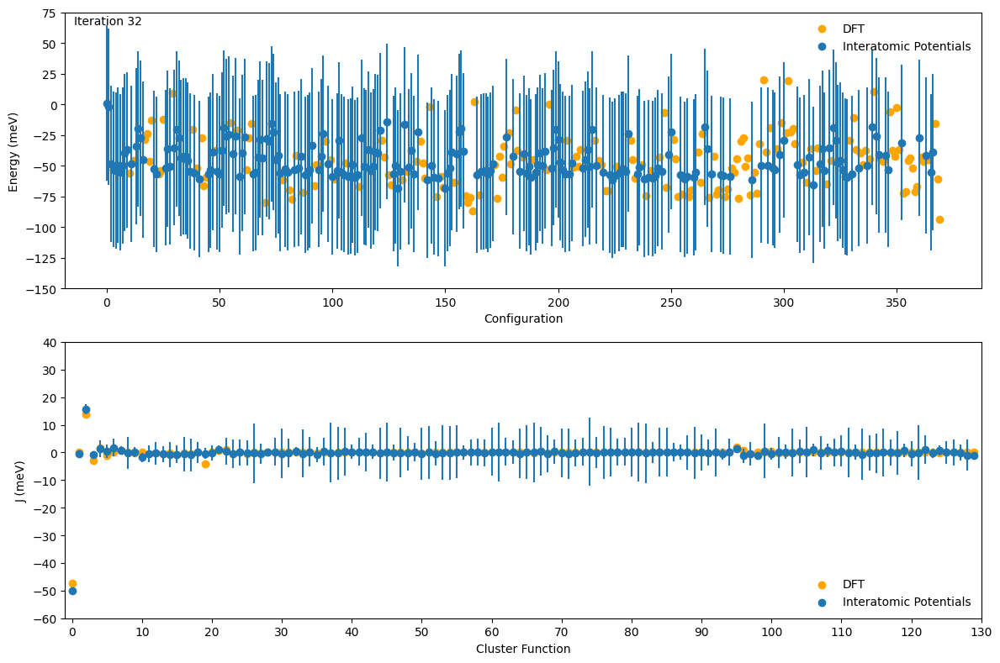

index of sampled structures: [369, 354, 353, 274, 258, 351, 350, 312, 25, 20, 358, 356, 294, 282, 279, 359, 284, 283, 247, 159, 343, 291, 233, 131, 29, 319, 281, 275, 262, 24, 368, 331, 252, 182, 125, 367, 348, 99, 63, 58, 259, 181, 149, 148, 87, 347, 340, 234, 232, 93, 357, 288, 264, 255, 78, 302, 179, 174, 141, 55, 237, 216, 133, 64, 42, 304, 287, 204, 62, 43, 270, 219, 218, 122, 19, 278, 241, 196, 162, 44, 329, 314, 208, 101, 17, 175, 172, 161, 106, 97, 335, 334, 143, 140, 126, 364, 277, 123, 92, 40, 308, 163, 18, 12, 10, 271, 267, 253, 160, 146, 321, 299, 248, 154, 23, 362, 332, 195, 84, 38, 310, 305, 251, 189, 137, 338, 285, 165, 139, 81, 289, 269, 210, 176, 48, 361, 263, 209, 173, 70, 315, 303, 239, 222, 82, 336, 292, 226, 184, 178, 355, 349, 344, 297, 112, 301, 280, 245, 221, 207, 261, 80, 77, 35, 8]

RMSE = 3.5614720955268537
R2 = 0.9692222361069107


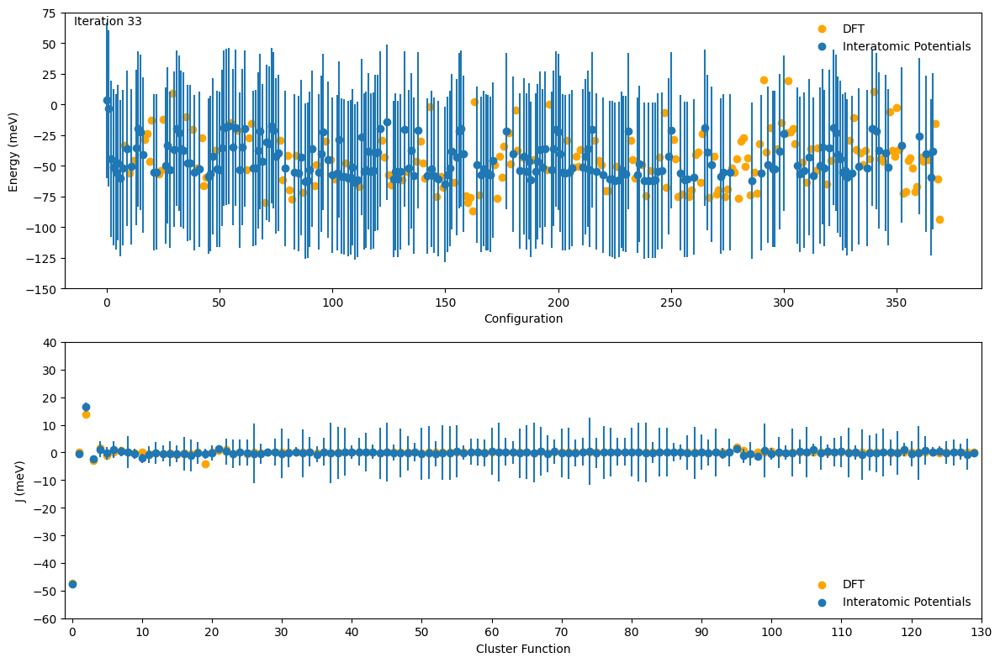

index of sampled structures: [369, 354, 353, 274, 258, 351, 350, 312, 25, 20, 358, 356, 294, 282, 279, 359, 284, 283, 247, 159, 343, 291, 233, 131, 29, 319, 281, 275, 262, 24, 368, 331, 252, 182, 125, 367, 348, 99, 63, 58, 259, 181, 149, 148, 87, 347, 340, 234, 232, 93, 357, 288, 264, 255, 78, 302, 179, 174, 141, 55, 237, 216, 133, 64, 42, 304, 287, 204, 62, 43, 270, 219, 218, 122, 19, 278, 241, 196, 162, 44, 329, 314, 208, 101, 17, 175, 172, 161, 106, 97, 335, 334, 143, 140, 126, 364, 277, 123, 92, 40, 308, 163, 18, 12, 10, 271, 267, 253, 160, 146, 321, 299, 248, 154, 23, 362, 332, 195, 84, 38, 310, 305, 251, 189, 137, 338, 285, 165, 139, 81, 289, 269, 210, 176, 48, 361, 263, 209, 173, 70, 315, 303, 239, 222, 82, 336, 292, 226, 184, 178, 355, 349, 344, 297, 112, 301, 280, 245, 221, 207, 261, 80, 77, 35, 8, 325, 249, 187, 128, 27]

RMSE = 3.078397907209104
R2 = 0.9768169253737357


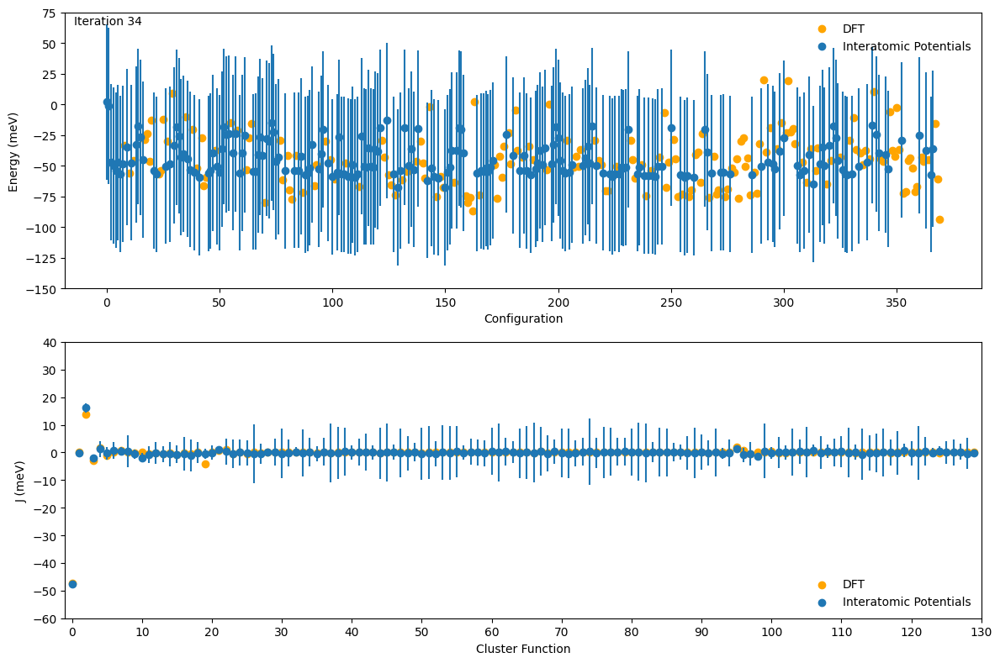

index of sampled structures: [369, 354, 353, 274, 258, 351, 350, 312, 25, 20, 358, 356, 294, 282, 279, 359, 284, 283, 247, 159, 343, 291, 233, 131, 29, 319, 281, 275, 262, 24, 368, 331, 252, 182, 125, 367, 348, 99, 63, 58, 259, 181, 149, 148, 87, 347, 340, 234, 232, 93, 357, 288, 264, 255, 78, 302, 179, 174, 141, 55, 237, 216, 133, 64, 42, 304, 287, 204, 62, 43, 270, 219, 218, 122, 19, 278, 241, 196, 162, 44, 329, 314, 208, 101, 17, 175, 172, 161, 106, 97, 335, 334, 143, 140, 126, 364, 277, 123, 92, 40, 308, 163, 18, 12, 10, 271, 267, 253, 160, 146, 321, 299, 248, 154, 23, 362, 332, 195, 84, 38, 310, 305, 251, 189, 137, 338, 285, 165, 139, 81, 289, 269, 210, 176, 48, 361, 263, 209, 173, 70, 315, 303, 239, 222, 82, 336, 292, 226, 184, 178, 355, 349, 344, 297, 112, 301, 280, 245, 221, 207, 261, 80, 77, 35, 8, 325, 249, 187, 128, 27, 318, 206, 192, 155, 1]

RMSE = 3.0287713802402965
R2 = 0.9777285051054164


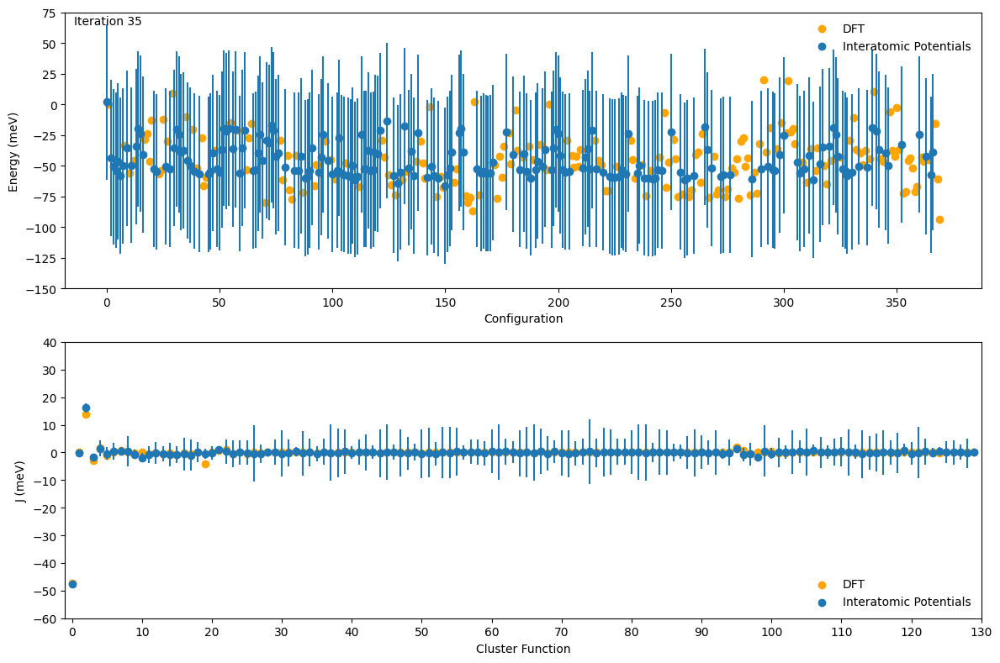

index of sampled structures: [369, 354, 353, 274, 258, 351, 350, 312, 25, 20, 358, 356, 294, 282, 279, 359, 284, 283, 247, 159, 343, 291, 233, 131, 29, 319, 281, 275, 262, 24, 368, 331, 252, 182, 125, 367, 348, 99, 63, 58, 259, 181, 149, 148, 87, 347, 340, 234, 232, 93, 357, 288, 264, 255, 78, 302, 179, 174, 141, 55, 237, 216, 133, 64, 42, 304, 287, 204, 62, 43, 270, 219, 218, 122, 19, 278, 241, 196, 162, 44, 329, 314, 208, 101, 17, 175, 172, 161, 106, 97, 335, 334, 143, 140, 126, 364, 277, 123, 92, 40, 308, 163, 18, 12, 10, 271, 267, 253, 160, 146, 321, 299, 248, 154, 23, 362, 332, 195, 84, 38, 310, 305, 251, 189, 137, 338, 285, 165, 139, 81, 289, 269, 210, 176, 48, 361, 263, 209, 173, 70, 315, 303, 239, 222, 82, 336, 292, 226, 184, 178, 355, 349, 344, 297, 112, 301, 280, 245, 221, 207, 261, 80, 77, 35, 8, 325, 249, 187, 128, 27, 318, 206, 192, 155, 1, 293, 224, 113, 33, 6]

RMSE = 2.935157357712486
R2 = 0.9786860585164512


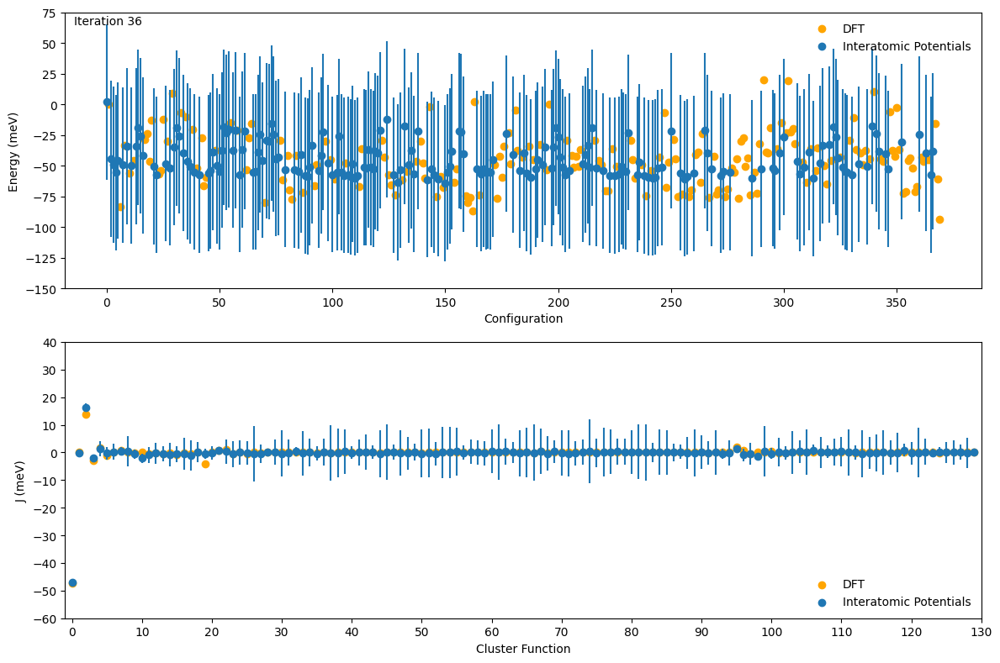

index of sampled structures: [369, 354, 353, 274, 258, 351, 350, 312, 25, 20, 358, 356, 294, 282, 279, 359, 284, 283, 247, 159, 343, 291, 233, 131, 29, 319, 281, 275, 262, 24, 368, 331, 252, 182, 125, 367, 348, 99, 63, 58, 259, 181, 149, 148, 87, 347, 340, 234, 232, 93, 357, 288, 264, 255, 78, 302, 179, 174, 141, 55, 237, 216, 133, 64, 42, 304, 287, 204, 62, 43, 270, 219, 218, 122, 19, 278, 241, 196, 162, 44, 329, 314, 208, 101, 17, 175, 172, 161, 106, 97, 335, 334, 143, 140, 126, 364, 277, 123, 92, 40, 308, 163, 18, 12, 10, 271, 267, 253, 160, 146, 321, 299, 248, 154, 23, 362, 332, 195, 84, 38, 310, 305, 251, 189, 137, 338, 285, 165, 139, 81, 289, 269, 210, 176, 48, 361, 263, 209, 173, 70, 315, 303, 239, 222, 82, 336, 292, 226, 184, 178, 355, 349, 344, 297, 112, 301, 280, 245, 221, 207, 261, 80, 77, 35, 8, 325, 249, 187, 128, 27, 318, 206, 192, 155, 1, 293, 224, 113, 33, 6, 342, 109, 96, 76, 21]

RMSE = 2.830976841817596
R2 = 0.9801162098330919


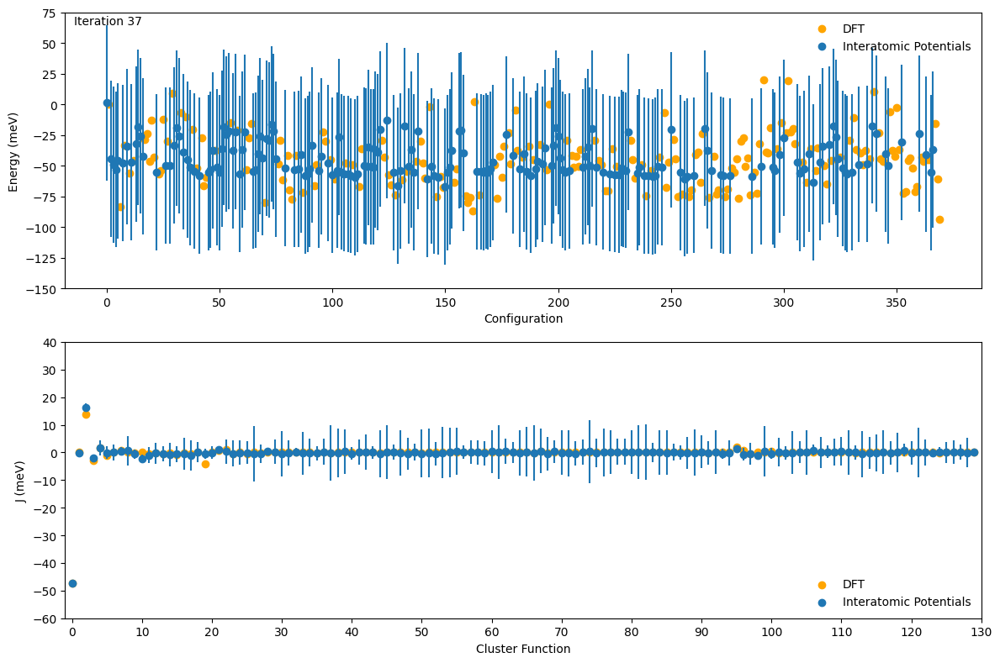

index of sampled structures: [369, 354, 353, 274, 258, 351, 350, 312, 25, 20, 358, 356, 294, 282, 279, 359, 284, 283, 247, 159, 343, 291, 233, 131, 29, 319, 281, 275, 262, 24, 368, 331, 252, 182, 125, 367, 348, 99, 63, 58, 259, 181, 149, 148, 87, 347, 340, 234, 232, 93, 357, 288, 264, 255, 78, 302, 179, 174, 141, 55, 237, 216, 133, 64, 42, 304, 287, 204, 62, 43, 270, 219, 218, 122, 19, 278, 241, 196, 162, 44, 329, 314, 208, 101, 17, 175, 172, 161, 106, 97, 335, 334, 143, 140, 126, 364, 277, 123, 92, 40, 308, 163, 18, 12, 10, 271, 267, 253, 160, 146, 321, 299, 248, 154, 23, 362, 332, 195, 84, 38, 310, 305, 251, 189, 137, 338, 285, 165, 139, 81, 289, 269, 210, 176, 48, 361, 263, 209, 173, 70, 315, 303, 239, 222, 82, 336, 292, 226, 184, 178, 355, 349, 344, 297, 112, 301, 280, 245, 221, 207, 261, 80, 77, 35, 8, 325, 249, 187, 128, 27, 318, 206, 192, 155, 1, 293, 224, 113, 33, 6, 342, 109, 96, 76, 21, 363, 246, 230, 119, 117]

RMSE = 2.7651999070735545
R2 = 0.9810456469908935


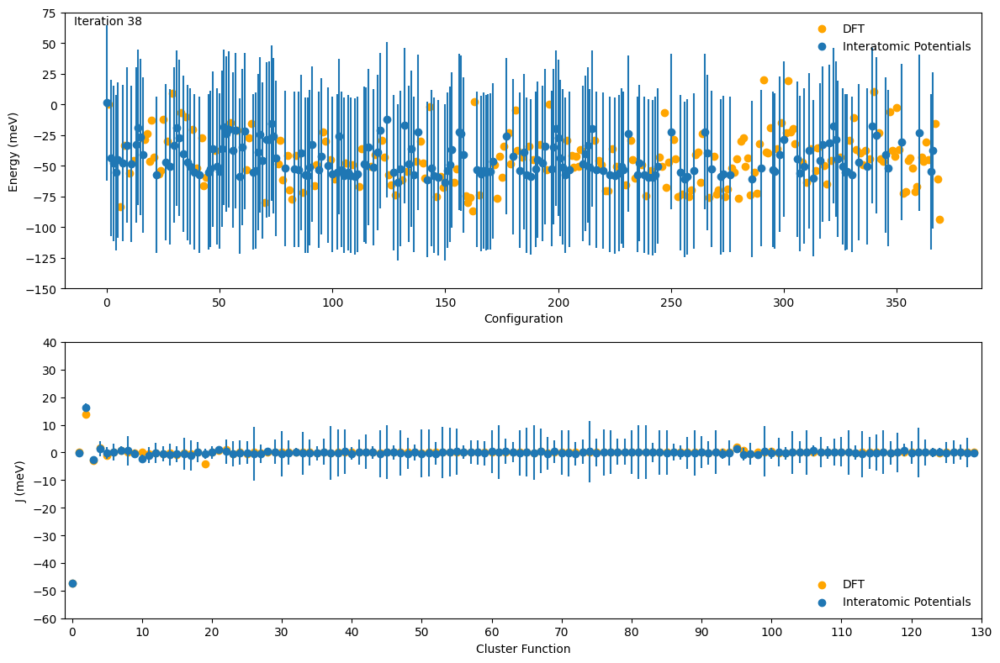

index of sampled structures: [369, 354, 353, 274, 258, 351, 350, 312, 25, 20, 358, 356, 294, 282, 279, 359, 284, 283, 247, 159, 343, 291, 233, 131, 29, 319, 281, 275, 262, 24, 368, 331, 252, 182, 125, 367, 348, 99, 63, 58, 259, 181, 149, 148, 87, 347, 340, 234, 232, 93, 357, 288, 264, 255, 78, 302, 179, 174, 141, 55, 237, 216, 133, 64, 42, 304, 287, 204, 62, 43, 270, 219, 218, 122, 19, 278, 241, 196, 162, 44, 329, 314, 208, 101, 17, 175, 172, 161, 106, 97, 335, 334, 143, 140, 126, 364, 277, 123, 92, 40, 308, 163, 18, 12, 10, 271, 267, 253, 160, 146, 321, 299, 248, 154, 23, 362, 332, 195, 84, 38, 310, 305, 251, 189, 137, 338, 285, 165, 139, 81, 289, 269, 210, 176, 48, 361, 263, 209, 173, 70, 315, 303, 239, 222, 82, 336, 292, 226, 184, 178, 355, 349, 344, 297, 112, 301, 280, 245, 221, 207, 261, 80, 77, 35, 8, 325, 249, 187, 128, 27, 318, 206, 192, 155, 1, 293, 224, 113, 33, 6, 342, 109, 96, 76, 21, 363, 246, 230, 119, 117, 313, 273, 236, 217, 60]

RMSE = 2.625276914708224
R2 = 0.98295719

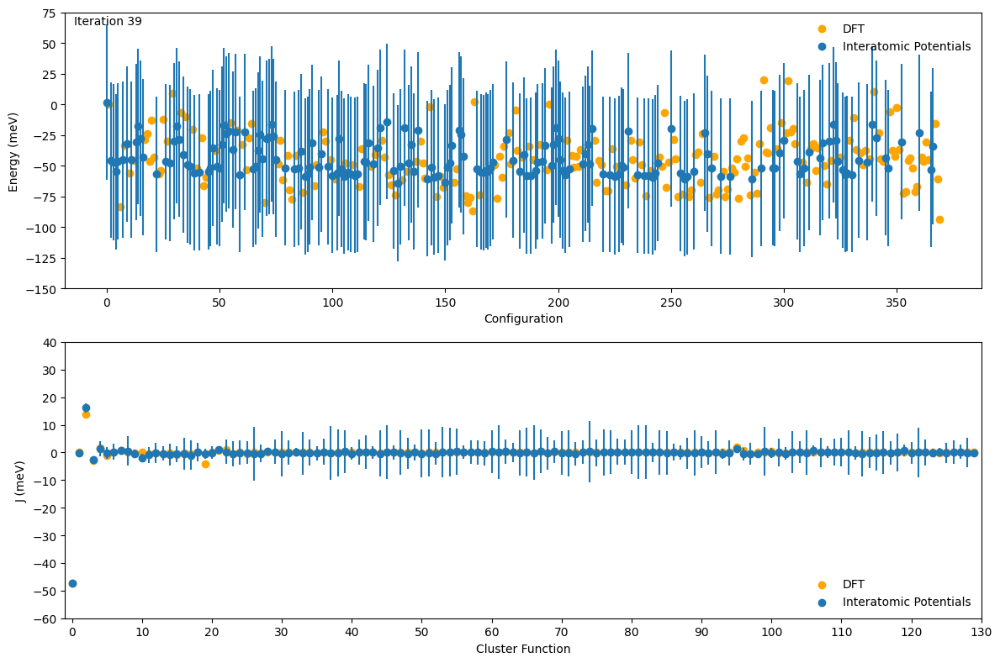

index of sampled structures: [369, 354, 353, 274, 258, 351, 350, 312, 25, 20, 358, 356, 294, 282, 279, 359, 284, 283, 247, 159, 343, 291, 233, 131, 29, 319, 281, 275, 262, 24, 368, 331, 252, 182, 125, 367, 348, 99, 63, 58, 259, 181, 149, 148, 87, 347, 340, 234, 232, 93, 357, 288, 264, 255, 78, 302, 179, 174, 141, 55, 237, 216, 133, 64, 42, 304, 287, 204, 62, 43, 270, 219, 218, 122, 19, 278, 241, 196, 162, 44, 329, 314, 208, 101, 17, 175, 172, 161, 106, 97, 335, 334, 143, 140, 126, 364, 277, 123, 92, 40, 308, 163, 18, 12, 10, 271, 267, 253, 160, 146, 321, 299, 248, 154, 23, 362, 332, 195, 84, 38, 310, 305, 251, 189, 137, 338, 285, 165, 139, 81, 289, 269, 210, 176, 48, 361, 263, 209, 173, 70, 315, 303, 239, 222, 82, 336, 292, 226, 184, 178, 355, 349, 344, 297, 112, 301, 280, 245, 221, 207, 261, 80, 77, 35, 8, 325, 249, 187, 128, 27, 318, 206, 192, 155, 1, 293, 224, 113, 33, 6, 342, 109, 96, 76, 21, 363, 246, 230, 119, 117, 313, 273, 236, 217, 60, 311, 286, 201, 177, 47]

RMSE = 2.4320922

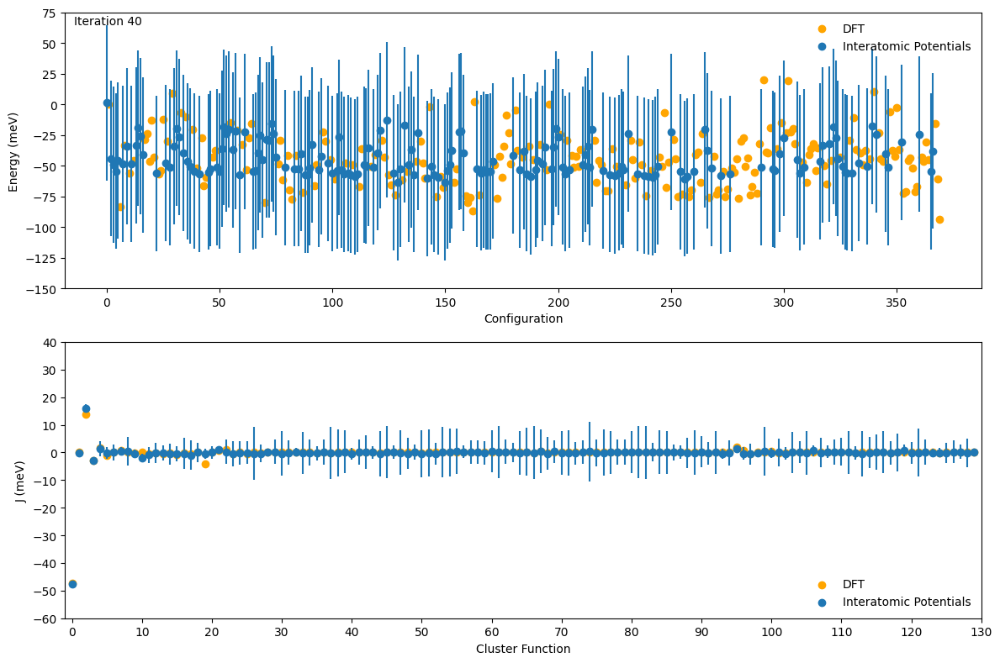

index of sampled structures: [369, 354, 353, 274, 258, 351, 350, 312, 25, 20, 358, 356, 294, 282, 279, 359, 284, 283, 247, 159, 343, 291, 233, 131, 29, 319, 281, 275, 262, 24, 368, 331, 252, 182, 125, 367, 348, 99, 63, 58, 259, 181, 149, 148, 87, 347, 340, 234, 232, 93, 357, 288, 264, 255, 78, 302, 179, 174, 141, 55, 237, 216, 133, 64, 42, 304, 287, 204, 62, 43, 270, 219, 218, 122, 19, 278, 241, 196, 162, 44, 329, 314, 208, 101, 17, 175, 172, 161, 106, 97, 335, 334, 143, 140, 126, 364, 277, 123, 92, 40, 308, 163, 18, 12, 10, 271, 267, 253, 160, 146, 321, 299, 248, 154, 23, 362, 332, 195, 84, 38, 310, 305, 251, 189, 137, 338, 285, 165, 139, 81, 289, 269, 210, 176, 48, 361, 263, 209, 173, 70, 315, 303, 239, 222, 82, 336, 292, 226, 184, 178, 355, 349, 344, 297, 112, 301, 280, 245, 221, 207, 261, 80, 77, 35, 8, 325, 249, 187, 128, 27, 318, 206, 192, 155, 1, 293, 224, 113, 33, 6, 342, 109, 96, 76, 21, 363, 246, 230, 119, 117, 313, 273, 236, 217, 60, 311, 286, 201, 177, 47, 360, 136, 114, 74

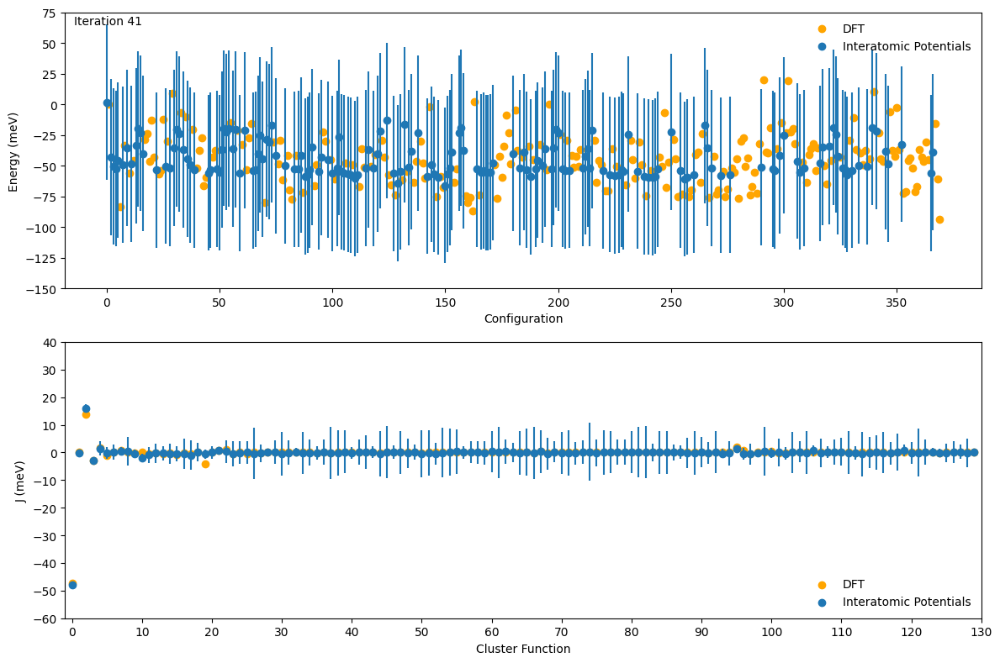

index of sampled structures: [369, 354, 353, 274, 258, 351, 350, 312, 25, 20, 358, 356, 294, 282, 279, 359, 284, 283, 247, 159, 343, 291, 233, 131, 29, 319, 281, 275, 262, 24, 368, 331, 252, 182, 125, 367, 348, 99, 63, 58, 259, 181, 149, 148, 87, 347, 340, 234, 232, 93, 357, 288, 264, 255, 78, 302, 179, 174, 141, 55, 237, 216, 133, 64, 42, 304, 287, 204, 62, 43, 270, 219, 218, 122, 19, 278, 241, 196, 162, 44, 329, 314, 208, 101, 17, 175, 172, 161, 106, 97, 335, 334, 143, 140, 126, 364, 277, 123, 92, 40, 308, 163, 18, 12, 10, 271, 267, 253, 160, 146, 321, 299, 248, 154, 23, 362, 332, 195, 84, 38, 310, 305, 251, 189, 137, 338, 285, 165, 139, 81, 289, 269, 210, 176, 48, 361, 263, 209, 173, 70, 315, 303, 239, 222, 82, 336, 292, 226, 184, 178, 355, 349, 344, 297, 112, 301, 280, 245, 221, 207, 261, 80, 77, 35, 8, 325, 249, 187, 128, 27, 318, 206, 192, 155, 1, 293, 224, 113, 33, 6, 342, 109, 96, 76, 21, 363, 246, 230, 119, 117, 313, 273, 236, 217, 60, 311, 286, 201, 177, 47, 360, 136, 114, 74

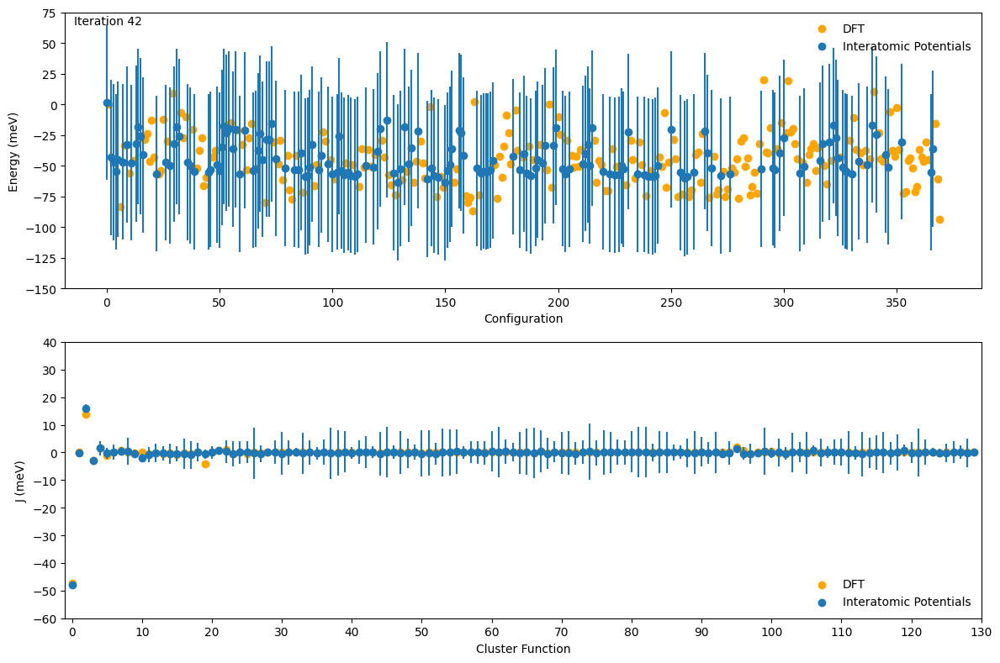

index of sampled structures: [369, 354, 353, 274, 258, 351, 350, 312, 25, 20, 358, 356, 294, 282, 279, 359, 284, 283, 247, 159, 343, 291, 233, 131, 29, 319, 281, 275, 262, 24, 368, 331, 252, 182, 125, 367, 348, 99, 63, 58, 259, 181, 149, 148, 87, 347, 340, 234, 232, 93, 357, 288, 264, 255, 78, 302, 179, 174, 141, 55, 237, 216, 133, 64, 42, 304, 287, 204, 62, 43, 270, 219, 218, 122, 19, 278, 241, 196, 162, 44, 329, 314, 208, 101, 17, 175, 172, 161, 106, 97, 335, 334, 143, 140, 126, 364, 277, 123, 92, 40, 308, 163, 18, 12, 10, 271, 267, 253, 160, 146, 321, 299, 248, 154, 23, 362, 332, 195, 84, 38, 310, 305, 251, 189, 137, 338, 285, 165, 139, 81, 289, 269, 210, 176, 48, 361, 263, 209, 173, 70, 315, 303, 239, 222, 82, 336, 292, 226, 184, 178, 355, 349, 344, 297, 112, 301, 280, 245, 221, 207, 261, 80, 77, 35, 8, 325, 249, 187, 128, 27, 318, 206, 192, 155, 1, 293, 224, 113, 33, 6, 342, 109, 96, 76, 21, 363, 246, 230, 119, 117, 313, 273, 236, 217, 60, 311, 286, 201, 177, 47, 360, 136, 114, 74

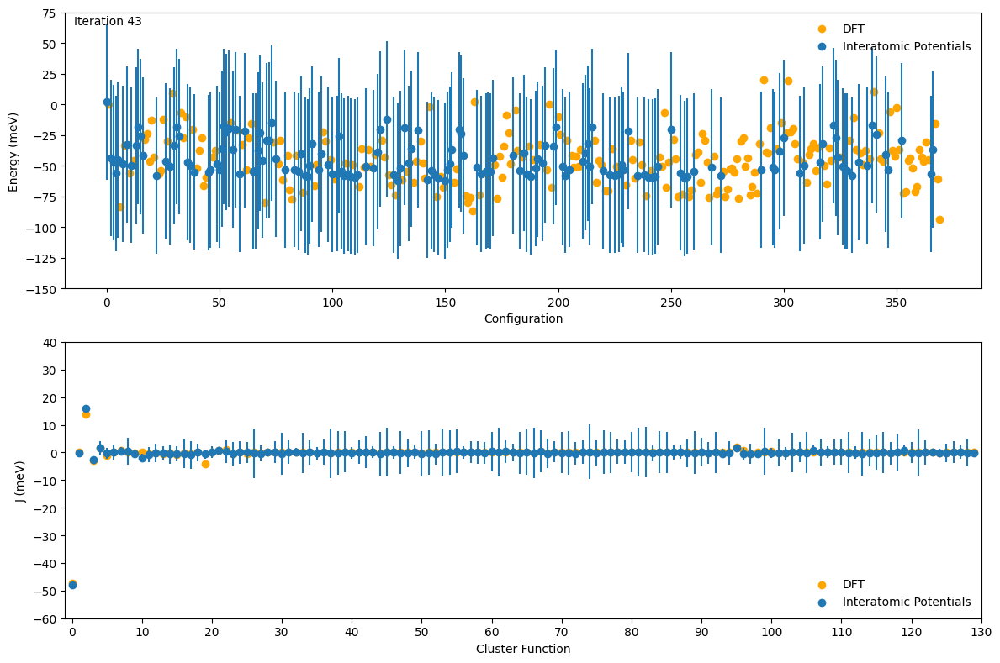

index of sampled structures: [369, 354, 353, 274, 258, 351, 350, 312, 25, 20, 358, 356, 294, 282, 279, 359, 284, 283, 247, 159, 343, 291, 233, 131, 29, 319, 281, 275, 262, 24, 368, 331, 252, 182, 125, 367, 348, 99, 63, 58, 259, 181, 149, 148, 87, 347, 340, 234, 232, 93, 357, 288, 264, 255, 78, 302, 179, 174, 141, 55, 237, 216, 133, 64, 42, 304, 287, 204, 62, 43, 270, 219, 218, 122, 19, 278, 241, 196, 162, 44, 329, 314, 208, 101, 17, 175, 172, 161, 106, 97, 335, 334, 143, 140, 126, 364, 277, 123, 92, 40, 308, 163, 18, 12, 10, 271, 267, 253, 160, 146, 321, 299, 248, 154, 23, 362, 332, 195, 84, 38, 310, 305, 251, 189, 137, 338, 285, 165, 139, 81, 289, 269, 210, 176, 48, 361, 263, 209, 173, 70, 315, 303, 239, 222, 82, 336, 292, 226, 184, 178, 355, 349, 344, 297, 112, 301, 280, 245, 221, 207, 261, 80, 77, 35, 8, 325, 249, 187, 128, 27, 318, 206, 192, 155, 1, 293, 224, 113, 33, 6, 342, 109, 96, 76, 21, 363, 246, 230, 119, 117, 313, 273, 236, 217, 60, 311, 286, 201, 177, 47, 360, 136, 114, 74

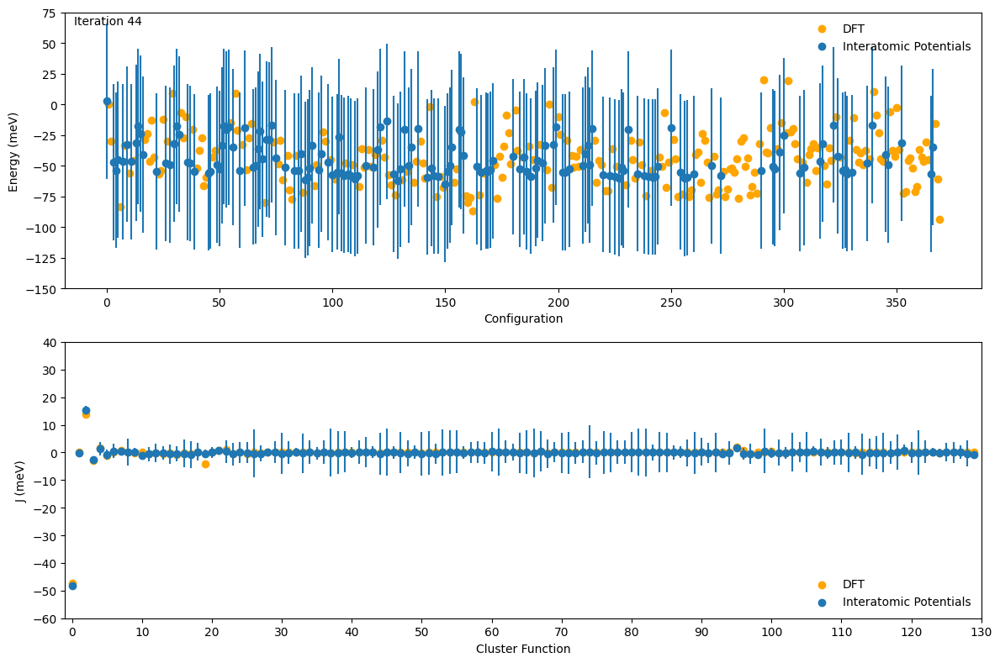

index of sampled structures: [369, 354, 353, 274, 258, 351, 350, 312, 25, 20, 358, 356, 294, 282, 279, 359, 284, 283, 247, 159, 343, 291, 233, 131, 29, 319, 281, 275, 262, 24, 368, 331, 252, 182, 125, 367, 348, 99, 63, 58, 259, 181, 149, 148, 87, 347, 340, 234, 232, 93, 357, 288, 264, 255, 78, 302, 179, 174, 141, 55, 237, 216, 133, 64, 42, 304, 287, 204, 62, 43, 270, 219, 218, 122, 19, 278, 241, 196, 162, 44, 329, 314, 208, 101, 17, 175, 172, 161, 106, 97, 335, 334, 143, 140, 126, 364, 277, 123, 92, 40, 308, 163, 18, 12, 10, 271, 267, 253, 160, 146, 321, 299, 248, 154, 23, 362, 332, 195, 84, 38, 310, 305, 251, 189, 137, 338, 285, 165, 139, 81, 289, 269, 210, 176, 48, 361, 263, 209, 173, 70, 315, 303, 239, 222, 82, 336, 292, 226, 184, 178, 355, 349, 344, 297, 112, 301, 280, 245, 221, 207, 261, 80, 77, 35, 8, 325, 249, 187, 128, 27, 318, 206, 192, 155, 1, 293, 224, 113, 33, 6, 342, 109, 96, 76, 21, 363, 246, 230, 119, 117, 313, 273, 236, 217, 60, 311, 286, 201, 177, 47, 360, 136, 114, 74

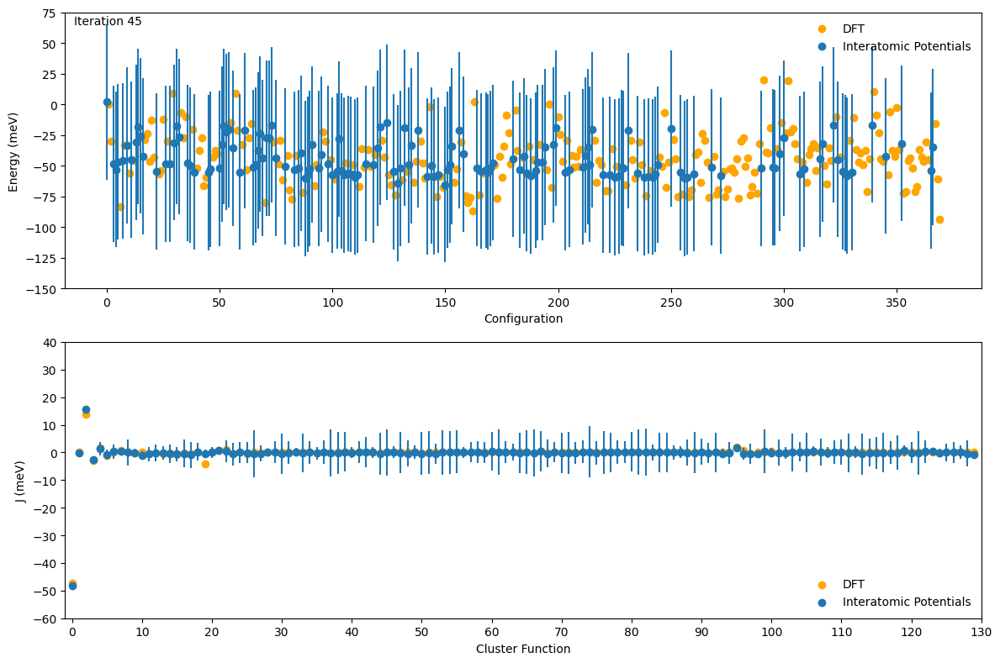

index of sampled structures: [369, 354, 353, 274, 258, 351, 350, 312, 25, 20, 358, 356, 294, 282, 279, 359, 284, 283, 247, 159, 343, 291, 233, 131, 29, 319, 281, 275, 262, 24, 368, 331, 252, 182, 125, 367, 348, 99, 63, 58, 259, 181, 149, 148, 87, 347, 340, 234, 232, 93, 357, 288, 264, 255, 78, 302, 179, 174, 141, 55, 237, 216, 133, 64, 42, 304, 287, 204, 62, 43, 270, 219, 218, 122, 19, 278, 241, 196, 162, 44, 329, 314, 208, 101, 17, 175, 172, 161, 106, 97, 335, 334, 143, 140, 126, 364, 277, 123, 92, 40, 308, 163, 18, 12, 10, 271, 267, 253, 160, 146, 321, 299, 248, 154, 23, 362, 332, 195, 84, 38, 310, 305, 251, 189, 137, 338, 285, 165, 139, 81, 289, 269, 210, 176, 48, 361, 263, 209, 173, 70, 315, 303, 239, 222, 82, 336, 292, 226, 184, 178, 355, 349, 344, 297, 112, 301, 280, 245, 221, 207, 261, 80, 77, 35, 8, 325, 249, 187, 128, 27, 318, 206, 192, 155, 1, 293, 224, 113, 33, 6, 342, 109, 96, 76, 21, 363, 246, 230, 119, 117, 313, 273, 236, 217, 60, 311, 286, 201, 177, 47, 360, 136, 114, 74

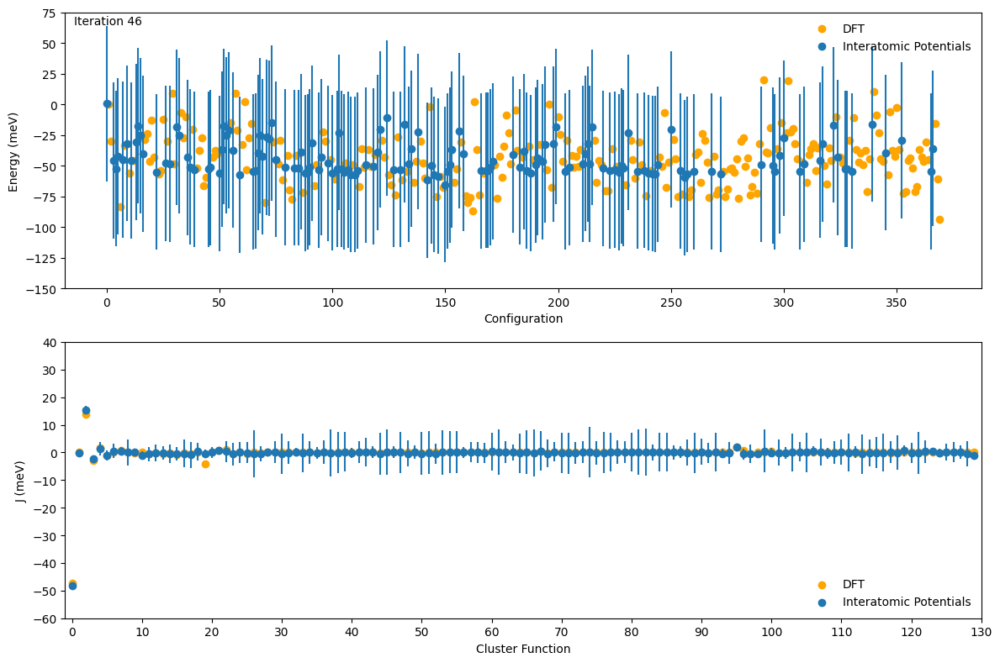

index of sampled structures: [369, 354, 353, 274, 258, 351, 350, 312, 25, 20, 358, 356, 294, 282, 279, 359, 284, 283, 247, 159, 343, 291, 233, 131, 29, 319, 281, 275, 262, 24, 368, 331, 252, 182, 125, 367, 348, 99, 63, 58, 259, 181, 149, 148, 87, 347, 340, 234, 232, 93, 357, 288, 264, 255, 78, 302, 179, 174, 141, 55, 237, 216, 133, 64, 42, 304, 287, 204, 62, 43, 270, 219, 218, 122, 19, 278, 241, 196, 162, 44, 329, 314, 208, 101, 17, 175, 172, 161, 106, 97, 335, 334, 143, 140, 126, 364, 277, 123, 92, 40, 308, 163, 18, 12, 10, 271, 267, 253, 160, 146, 321, 299, 248, 154, 23, 362, 332, 195, 84, 38, 310, 305, 251, 189, 137, 338, 285, 165, 139, 81, 289, 269, 210, 176, 48, 361, 263, 209, 173, 70, 315, 303, 239, 222, 82, 336, 292, 226, 184, 178, 355, 349, 344, 297, 112, 301, 280, 245, 221, 207, 261, 80, 77, 35, 8, 325, 249, 187, 128, 27, 318, 206, 192, 155, 1, 293, 224, 113, 33, 6, 342, 109, 96, 76, 21, 363, 246, 230, 119, 117, 313, 273, 236, 217, 60, 311, 286, 201, 177, 47, 360, 136, 114, 74

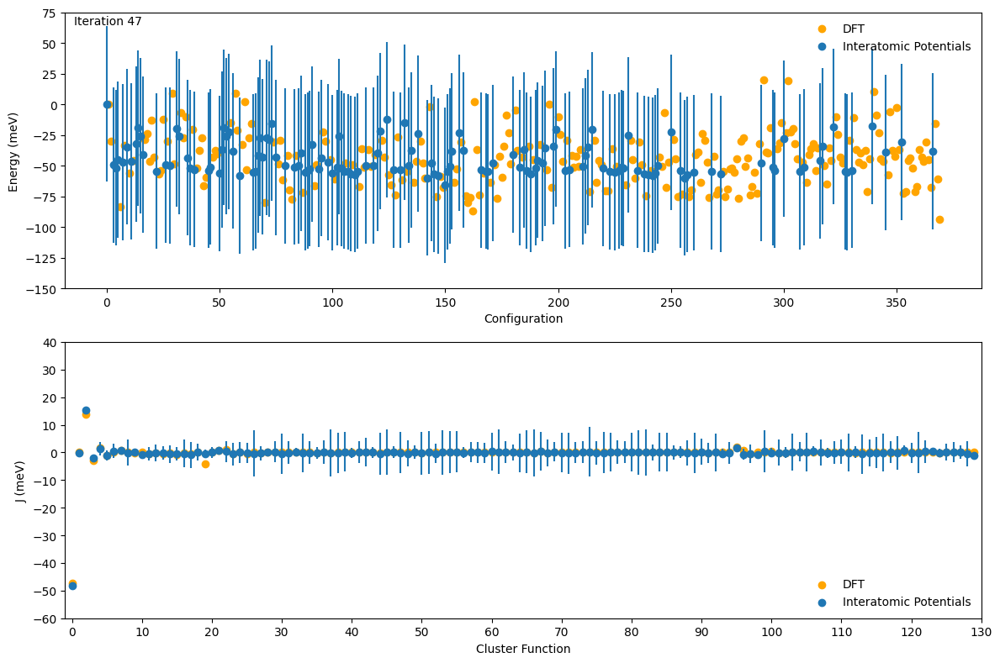

index of sampled structures: [369, 354, 353, 274, 258, 351, 350, 312, 25, 20, 358, 356, 294, 282, 279, 359, 284, 283, 247, 159, 343, 291, 233, 131, 29, 319, 281, 275, 262, 24, 368, 331, 252, 182, 125, 367, 348, 99, 63, 58, 259, 181, 149, 148, 87, 347, 340, 234, 232, 93, 357, 288, 264, 255, 78, 302, 179, 174, 141, 55, 237, 216, 133, 64, 42, 304, 287, 204, 62, 43, 270, 219, 218, 122, 19, 278, 241, 196, 162, 44, 329, 314, 208, 101, 17, 175, 172, 161, 106, 97, 335, 334, 143, 140, 126, 364, 277, 123, 92, 40, 308, 163, 18, 12, 10, 271, 267, 253, 160, 146, 321, 299, 248, 154, 23, 362, 332, 195, 84, 38, 310, 305, 251, 189, 137, 338, 285, 165, 139, 81, 289, 269, 210, 176, 48, 361, 263, 209, 173, 70, 315, 303, 239, 222, 82, 336, 292, 226, 184, 178, 355, 349, 344, 297, 112, 301, 280, 245, 221, 207, 261, 80, 77, 35, 8, 325, 249, 187, 128, 27, 318, 206, 192, 155, 1, 293, 224, 113, 33, 6, 342, 109, 96, 76, 21, 363, 246, 230, 119, 117, 313, 273, 236, 217, 60, 311, 286, 201, 177, 47, 360, 136, 114, 74

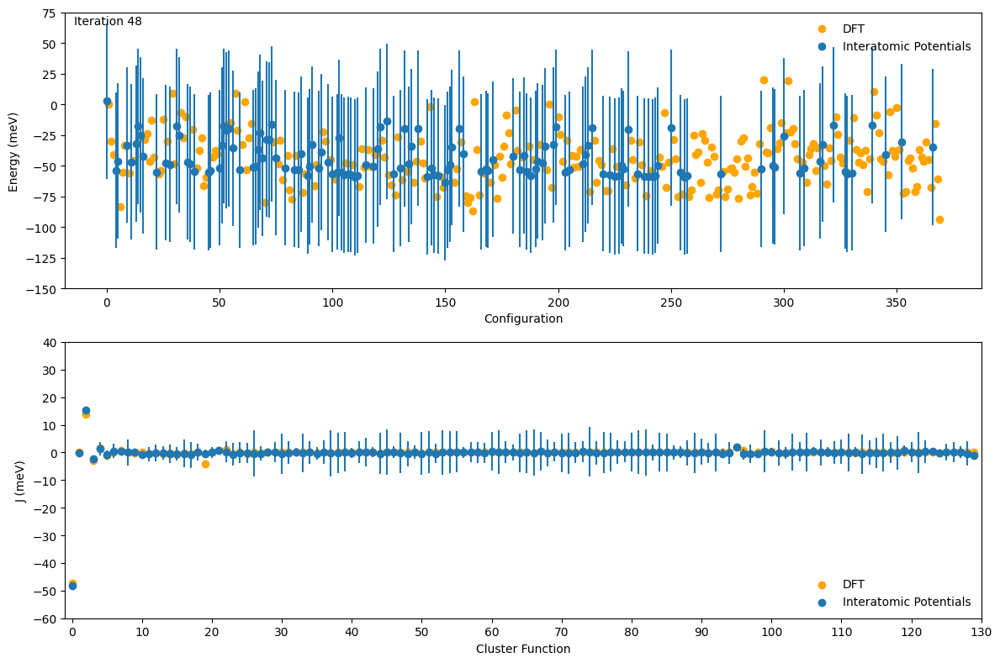

index of sampled structures: [369, 354, 353, 274, 258, 351, 350, 312, 25, 20, 358, 356, 294, 282, 279, 359, 284, 283, 247, 159, 343, 291, 233, 131, 29, 319, 281, 275, 262, 24, 368, 331, 252, 182, 125, 367, 348, 99, 63, 58, 259, 181, 149, 148, 87, 347, 340, 234, 232, 93, 357, 288, 264, 255, 78, 302, 179, 174, 141, 55, 237, 216, 133, 64, 42, 304, 287, 204, 62, 43, 270, 219, 218, 122, 19, 278, 241, 196, 162, 44, 329, 314, 208, 101, 17, 175, 172, 161, 106, 97, 335, 334, 143, 140, 126, 364, 277, 123, 92, 40, 308, 163, 18, 12, 10, 271, 267, 253, 160, 146, 321, 299, 248, 154, 23, 362, 332, 195, 84, 38, 310, 305, 251, 189, 137, 338, 285, 165, 139, 81, 289, 269, 210, 176, 48, 361, 263, 209, 173, 70, 315, 303, 239, 222, 82, 336, 292, 226, 184, 178, 355, 349, 344, 297, 112, 301, 280, 245, 221, 207, 261, 80, 77, 35, 8, 325, 249, 187, 128, 27, 318, 206, 192, 155, 1, 293, 224, 113, 33, 6, 342, 109, 96, 76, 21, 363, 246, 230, 119, 117, 313, 273, 236, 217, 60, 311, 286, 201, 177, 47, 360, 136, 114, 74

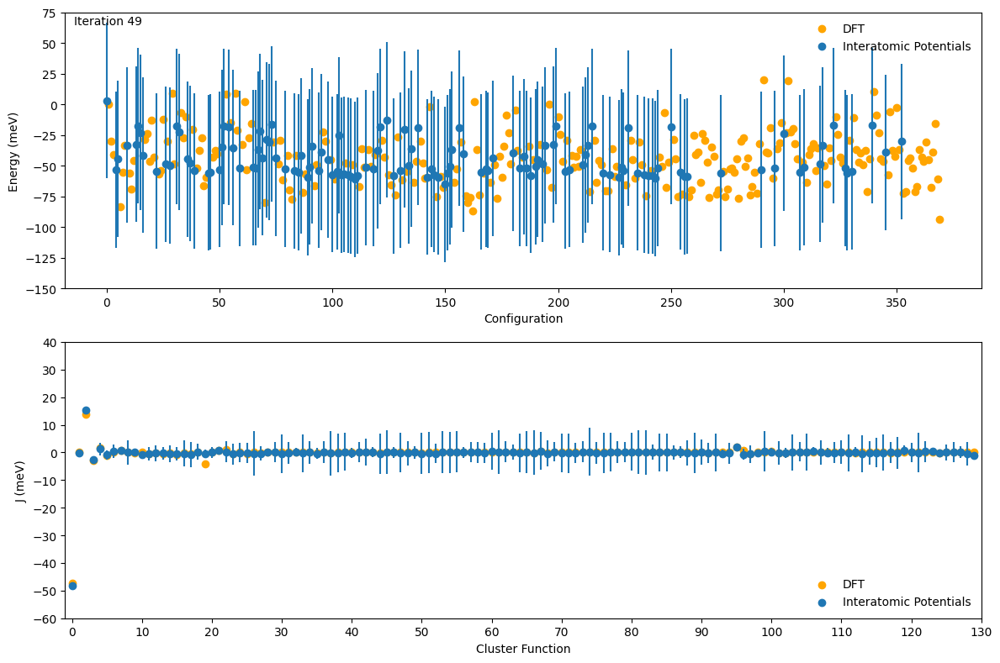

index of sampled structures: [369, 354, 353, 274, 258, 351, 350, 312, 25, 20, 358, 356, 294, 282, 279, 359, 284, 283, 247, 159, 343, 291, 233, 131, 29, 319, 281, 275, 262, 24, 368, 331, 252, 182, 125, 367, 348, 99, 63, 58, 259, 181, 149, 148, 87, 347, 340, 234, 232, 93, 357, 288, 264, 255, 78, 302, 179, 174, 141, 55, 237, 216, 133, 64, 42, 304, 287, 204, 62, 43, 270, 219, 218, 122, 19, 278, 241, 196, 162, 44, 329, 314, 208, 101, 17, 175, 172, 161, 106, 97, 335, 334, 143, 140, 126, 364, 277, 123, 92, 40, 308, 163, 18, 12, 10, 271, 267, 253, 160, 146, 321, 299, 248, 154, 23, 362, 332, 195, 84, 38, 310, 305, 251, 189, 137, 338, 285, 165, 139, 81, 289, 269, 210, 176, 48, 361, 263, 209, 173, 70, 315, 303, 239, 222, 82, 336, 292, 226, 184, 178, 355, 349, 344, 297, 112, 301, 280, 245, 221, 207, 261, 80, 77, 35, 8, 325, 249, 187, 128, 27, 318, 206, 192, 155, 1, 293, 224, 113, 33, 6, 342, 109, 96, 76, 21, 363, 246, 230, 119, 117, 313, 273, 236, 217, 60, 311, 286, 201, 177, 47, 360, 136, 114, 74

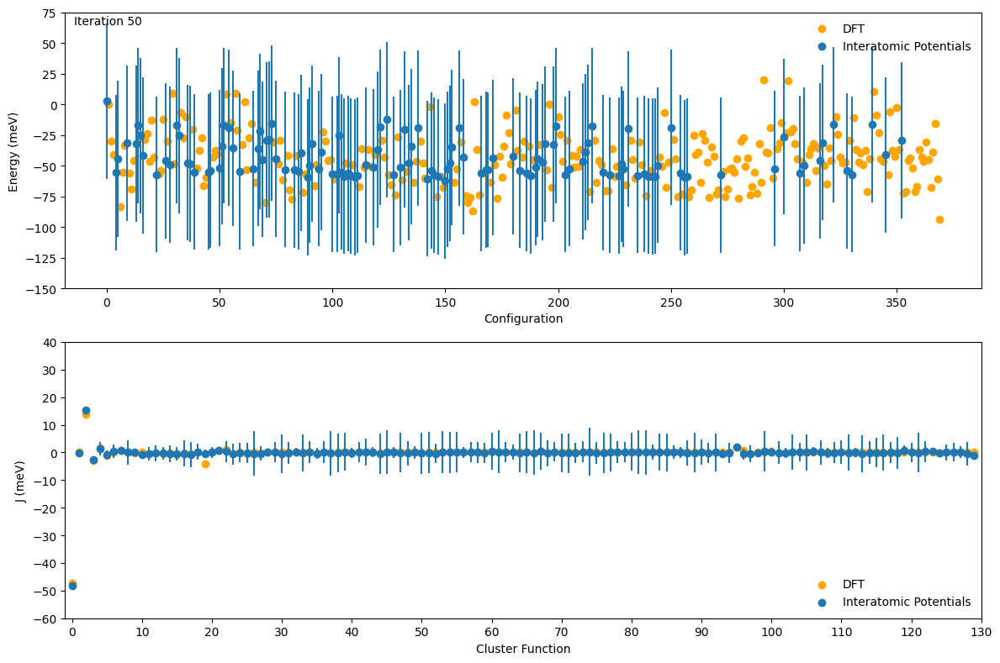

index of sampled structures: [369, 354, 353, 274, 258, 351, 350, 312, 25, 20, 358, 356, 294, 282, 279, 359, 284, 283, 247, 159, 343, 291, 233, 131, 29, 319, 281, 275, 262, 24, 368, 331, 252, 182, 125, 367, 348, 99, 63, 58, 259, 181, 149, 148, 87, 347, 340, 234, 232, 93, 357, 288, 264, 255, 78, 302, 179, 174, 141, 55, 237, 216, 133, 64, 42, 304, 287, 204, 62, 43, 270, 219, 218, 122, 19, 278, 241, 196, 162, 44, 329, 314, 208, 101, 17, 175, 172, 161, 106, 97, 335, 334, 143, 140, 126, 364, 277, 123, 92, 40, 308, 163, 18, 12, 10, 271, 267, 253, 160, 146, 321, 299, 248, 154, 23, 362, 332, 195, 84, 38, 310, 305, 251, 189, 137, 338, 285, 165, 139, 81, 289, 269, 210, 176, 48, 361, 263, 209, 173, 70, 315, 303, 239, 222, 82, 336, 292, 226, 184, 178, 355, 349, 344, 297, 112, 301, 280, 245, 221, 207, 261, 80, 77, 35, 8, 325, 249, 187, 128, 27, 318, 206, 192, 155, 1, 293, 224, 113, 33, 6, 342, 109, 96, 76, 21, 363, 246, 230, 119, 117, 313, 273, 236, 217, 60, 311, 286, 201, 177, 47, 360, 136, 114, 74

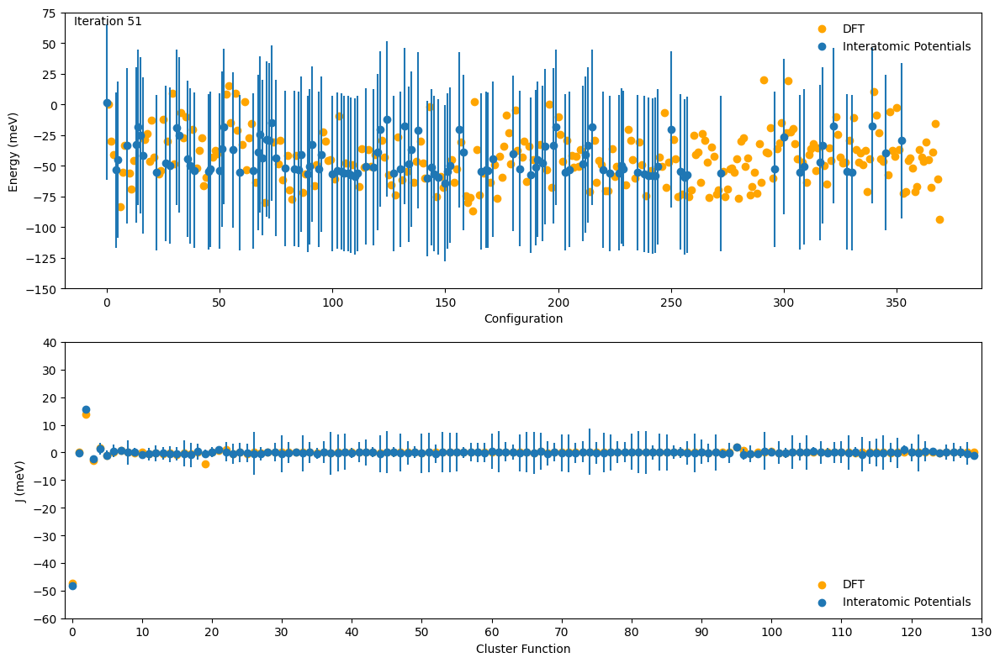

index of sampled structures: [369, 354, 353, 274, 258, 351, 350, 312, 25, 20, 358, 356, 294, 282, 279, 359, 284, 283, 247, 159, 343, 291, 233, 131, 29, 319, 281, 275, 262, 24, 368, 331, 252, 182, 125, 367, 348, 99, 63, 58, 259, 181, 149, 148, 87, 347, 340, 234, 232, 93, 357, 288, 264, 255, 78, 302, 179, 174, 141, 55, 237, 216, 133, 64, 42, 304, 287, 204, 62, 43, 270, 219, 218, 122, 19, 278, 241, 196, 162, 44, 329, 314, 208, 101, 17, 175, 172, 161, 106, 97, 335, 334, 143, 140, 126, 364, 277, 123, 92, 40, 308, 163, 18, 12, 10, 271, 267, 253, 160, 146, 321, 299, 248, 154, 23, 362, 332, 195, 84, 38, 310, 305, 251, 189, 137, 338, 285, 165, 139, 81, 289, 269, 210, 176, 48, 361, 263, 209, 173, 70, 315, 303, 239, 222, 82, 336, 292, 226, 184, 178, 355, 349, 344, 297, 112, 301, 280, 245, 221, 207, 261, 80, 77, 35, 8, 325, 249, 187, 128, 27, 318, 206, 192, 155, 1, 293, 224, 113, 33, 6, 342, 109, 96, 76, 21, 363, 246, 230, 119, 117, 313, 273, 236, 217, 60, 311, 286, 201, 177, 47, 360, 136, 114, 74

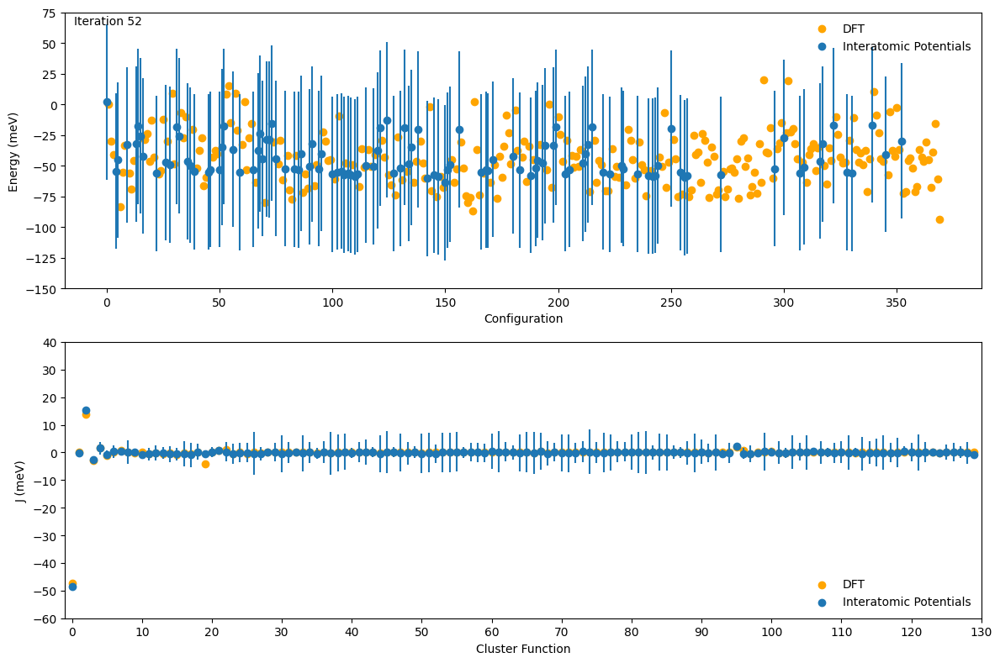

index of sampled structures: [369, 354, 353, 274, 258, 351, 350, 312, 25, 20, 358, 356, 294, 282, 279, 359, 284, 283, 247, 159, 343, 291, 233, 131, 29, 319, 281, 275, 262, 24, 368, 331, 252, 182, 125, 367, 348, 99, 63, 58, 259, 181, 149, 148, 87, 347, 340, 234, 232, 93, 357, 288, 264, 255, 78, 302, 179, 174, 141, 55, 237, 216, 133, 64, 42, 304, 287, 204, 62, 43, 270, 219, 218, 122, 19, 278, 241, 196, 162, 44, 329, 314, 208, 101, 17, 175, 172, 161, 106, 97, 335, 334, 143, 140, 126, 364, 277, 123, 92, 40, 308, 163, 18, 12, 10, 271, 267, 253, 160, 146, 321, 299, 248, 154, 23, 362, 332, 195, 84, 38, 310, 305, 251, 189, 137, 338, 285, 165, 139, 81, 289, 269, 210, 176, 48, 361, 263, 209, 173, 70, 315, 303, 239, 222, 82, 336, 292, 226, 184, 178, 355, 349, 344, 297, 112, 301, 280, 245, 221, 207, 261, 80, 77, 35, 8, 325, 249, 187, 128, 27, 318, 206, 192, 155, 1, 293, 224, 113, 33, 6, 342, 109, 96, 76, 21, 363, 246, 230, 119, 117, 313, 273, 236, 217, 60, 311, 286, 201, 177, 47, 360, 136, 114, 74

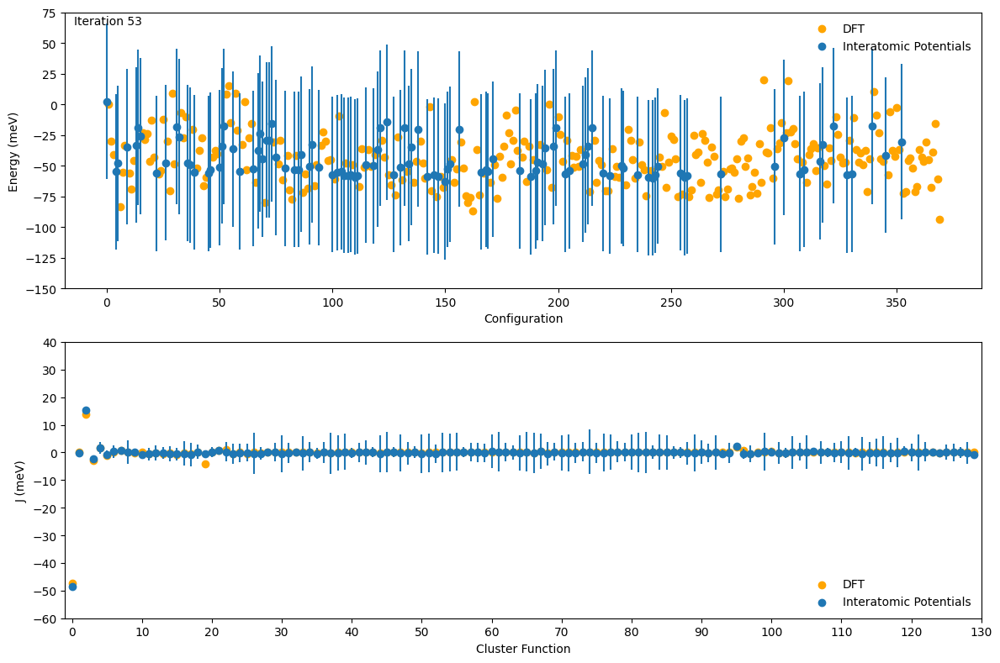

index of sampled structures: [369, 354, 353, 274, 258, 351, 350, 312, 25, 20, 358, 356, 294, 282, 279, 359, 284, 283, 247, 159, 343, 291, 233, 131, 29, 319, 281, 275, 262, 24, 368, 331, 252, 182, 125, 367, 348, 99, 63, 58, 259, 181, 149, 148, 87, 347, 340, 234, 232, 93, 357, 288, 264, 255, 78, 302, 179, 174, 141, 55, 237, 216, 133, 64, 42, 304, 287, 204, 62, 43, 270, 219, 218, 122, 19, 278, 241, 196, 162, 44, 329, 314, 208, 101, 17, 175, 172, 161, 106, 97, 335, 334, 143, 140, 126, 364, 277, 123, 92, 40, 308, 163, 18, 12, 10, 271, 267, 253, 160, 146, 321, 299, 248, 154, 23, 362, 332, 195, 84, 38, 310, 305, 251, 189, 137, 338, 285, 165, 139, 81, 289, 269, 210, 176, 48, 361, 263, 209, 173, 70, 315, 303, 239, 222, 82, 336, 292, 226, 184, 178, 355, 349, 344, 297, 112, 301, 280, 245, 221, 207, 261, 80, 77, 35, 8, 325, 249, 187, 128, 27, 318, 206, 192, 155, 1, 293, 224, 113, 33, 6, 342, 109, 96, 76, 21, 363, 246, 230, 119, 117, 313, 273, 236, 217, 60, 311, 286, 201, 177, 47, 360, 136, 114, 74

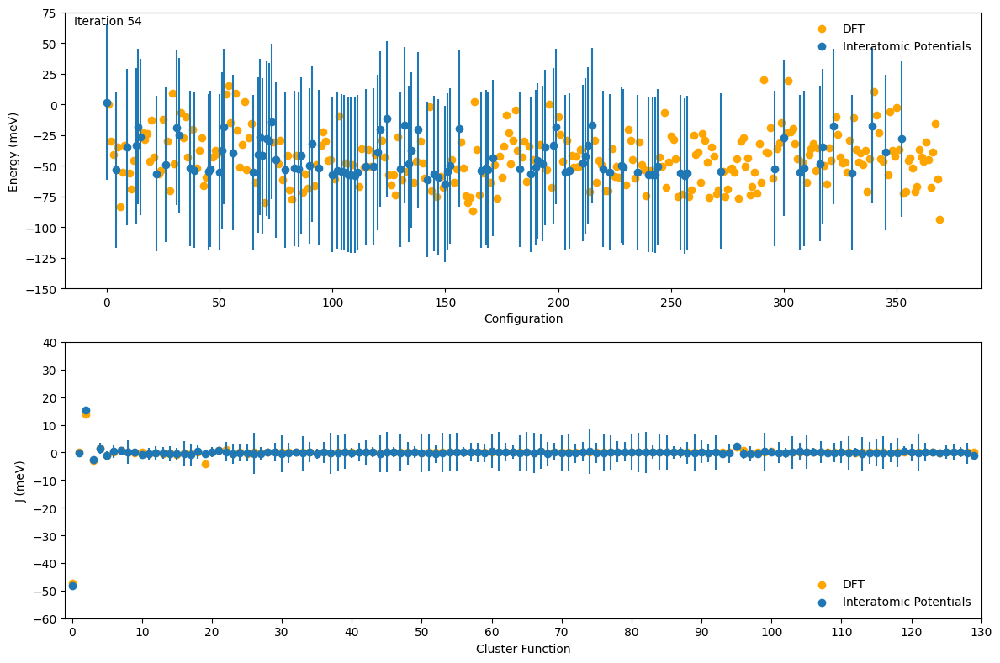

index of sampled structures: [369, 354, 353, 274, 258, 351, 350, 312, 25, 20, 358, 356, 294, 282, 279, 359, 284, 283, 247, 159, 343, 291, 233, 131, 29, 319, 281, 275, 262, 24, 368, 331, 252, 182, 125, 367, 348, 99, 63, 58, 259, 181, 149, 148, 87, 347, 340, 234, 232, 93, 357, 288, 264, 255, 78, 302, 179, 174, 141, 55, 237, 216, 133, 64, 42, 304, 287, 204, 62, 43, 270, 219, 218, 122, 19, 278, 241, 196, 162, 44, 329, 314, 208, 101, 17, 175, 172, 161, 106, 97, 335, 334, 143, 140, 126, 364, 277, 123, 92, 40, 308, 163, 18, 12, 10, 271, 267, 253, 160, 146, 321, 299, 248, 154, 23, 362, 332, 195, 84, 38, 310, 305, 251, 189, 137, 338, 285, 165, 139, 81, 289, 269, 210, 176, 48, 361, 263, 209, 173, 70, 315, 303, 239, 222, 82, 336, 292, 226, 184, 178, 355, 349, 344, 297, 112, 301, 280, 245, 221, 207, 261, 80, 77, 35, 8, 325, 249, 187, 128, 27, 318, 206, 192, 155, 1, 293, 224, 113, 33, 6, 342, 109, 96, 76, 21, 363, 246, 230, 119, 117, 313, 273, 236, 217, 60, 311, 286, 201, 177, 47, 360, 136, 114, 74

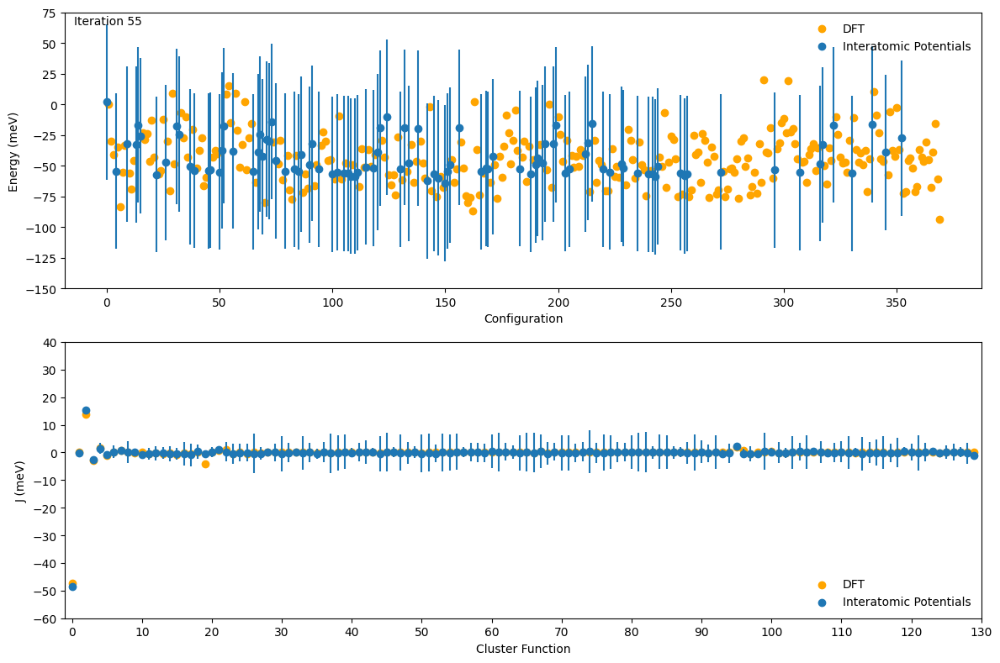

index of sampled structures: [369, 354, 353, 274, 258, 351, 350, 312, 25, 20, 358, 356, 294, 282, 279, 359, 284, 283, 247, 159, 343, 291, 233, 131, 29, 319, 281, 275, 262, 24, 368, 331, 252, 182, 125, 367, 348, 99, 63, 58, 259, 181, 149, 148, 87, 347, 340, 234, 232, 93, 357, 288, 264, 255, 78, 302, 179, 174, 141, 55, 237, 216, 133, 64, 42, 304, 287, 204, 62, 43, 270, 219, 218, 122, 19, 278, 241, 196, 162, 44, 329, 314, 208, 101, 17, 175, 172, 161, 106, 97, 335, 334, 143, 140, 126, 364, 277, 123, 92, 40, 308, 163, 18, 12, 10, 271, 267, 253, 160, 146, 321, 299, 248, 154, 23, 362, 332, 195, 84, 38, 310, 305, 251, 189, 137, 338, 285, 165, 139, 81, 289, 269, 210, 176, 48, 361, 263, 209, 173, 70, 315, 303, 239, 222, 82, 336, 292, 226, 184, 178, 355, 349, 344, 297, 112, 301, 280, 245, 221, 207, 261, 80, 77, 35, 8, 325, 249, 187, 128, 27, 318, 206, 192, 155, 1, 293, 224, 113, 33, 6, 342, 109, 96, 76, 21, 363, 246, 230, 119, 117, 313, 273, 236, 217, 60, 311, 286, 201, 177, 47, 360, 136, 114, 74

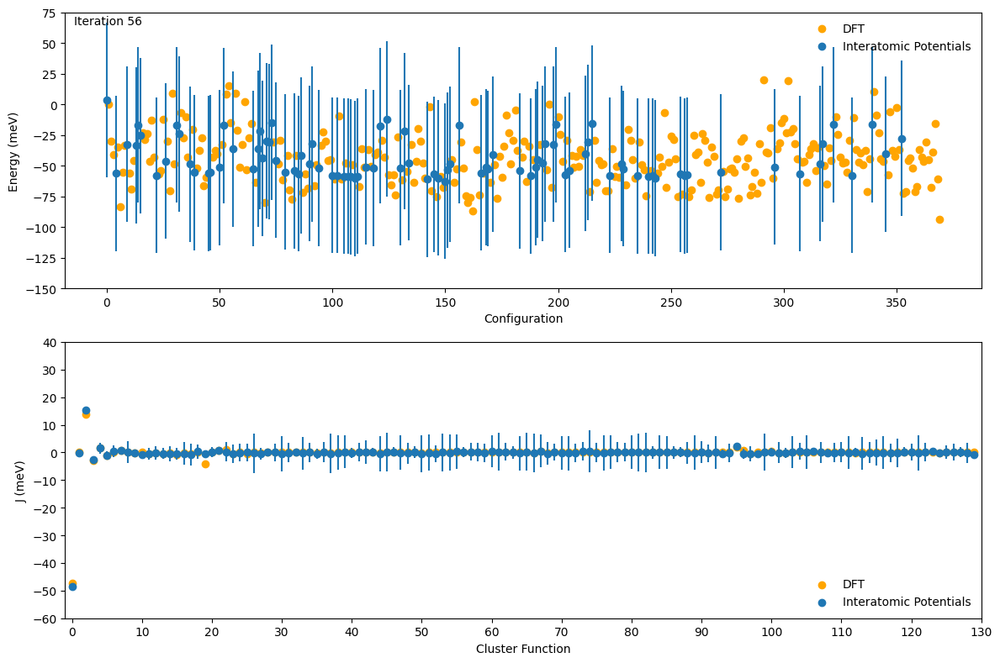

index of sampled structures: [369, 354, 353, 274, 258, 351, 350, 312, 25, 20, 358, 356, 294, 282, 279, 359, 284, 283, 247, 159, 343, 291, 233, 131, 29, 319, 281, 275, 262, 24, 368, 331, 252, 182, 125, 367, 348, 99, 63, 58, 259, 181, 149, 148, 87, 347, 340, 234, 232, 93, 357, 288, 264, 255, 78, 302, 179, 174, 141, 55, 237, 216, 133, 64, 42, 304, 287, 204, 62, 43, 270, 219, 218, 122, 19, 278, 241, 196, 162, 44, 329, 314, 208, 101, 17, 175, 172, 161, 106, 97, 335, 334, 143, 140, 126, 364, 277, 123, 92, 40, 308, 163, 18, 12, 10, 271, 267, 253, 160, 146, 321, 299, 248, 154, 23, 362, 332, 195, 84, 38, 310, 305, 251, 189, 137, 338, 285, 165, 139, 81, 289, 269, 210, 176, 48, 361, 263, 209, 173, 70, 315, 303, 239, 222, 82, 336, 292, 226, 184, 178, 355, 349, 344, 297, 112, 301, 280, 245, 221, 207, 261, 80, 77, 35, 8, 325, 249, 187, 128, 27, 318, 206, 192, 155, 1, 293, 224, 113, 33, 6, 342, 109, 96, 76, 21, 363, 246, 230, 119, 117, 313, 273, 236, 217, 60, 311, 286, 201, 177, 47, 360, 136, 114, 74

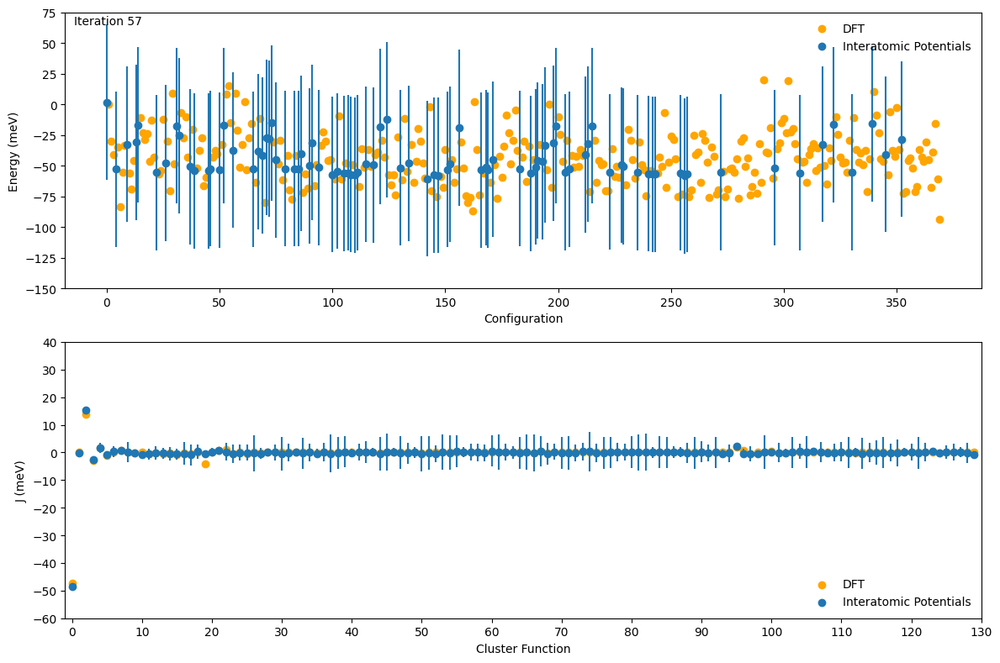

index of sampled structures: [369, 354, 353, 274, 258, 351, 350, 312, 25, 20, 358, 356, 294, 282, 279, 359, 284, 283, 247, 159, 343, 291, 233, 131, 29, 319, 281, 275, 262, 24, 368, 331, 252, 182, 125, 367, 348, 99, 63, 58, 259, 181, 149, 148, 87, 347, 340, 234, 232, 93, 357, 288, 264, 255, 78, 302, 179, 174, 141, 55, 237, 216, 133, 64, 42, 304, 287, 204, 62, 43, 270, 219, 218, 122, 19, 278, 241, 196, 162, 44, 329, 314, 208, 101, 17, 175, 172, 161, 106, 97, 335, 334, 143, 140, 126, 364, 277, 123, 92, 40, 308, 163, 18, 12, 10, 271, 267, 253, 160, 146, 321, 299, 248, 154, 23, 362, 332, 195, 84, 38, 310, 305, 251, 189, 137, 338, 285, 165, 139, 81, 289, 269, 210, 176, 48, 361, 263, 209, 173, 70, 315, 303, 239, 222, 82, 336, 292, 226, 184, 178, 355, 349, 344, 297, 112, 301, 280, 245, 221, 207, 261, 80, 77, 35, 8, 325, 249, 187, 128, 27, 318, 206, 192, 155, 1, 293, 224, 113, 33, 6, 342, 109, 96, 76, 21, 363, 246, 230, 119, 117, 313, 273, 236, 217, 60, 311, 286, 201, 177, 47, 360, 136, 114, 74

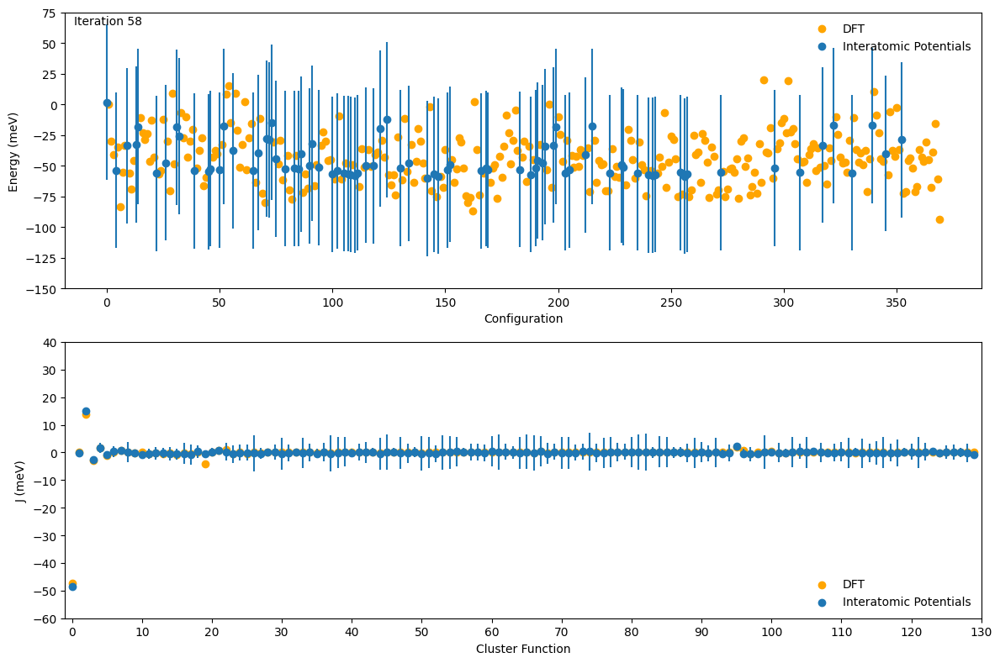

index of sampled structures: [369, 354, 353, 274, 258, 351, 350, 312, 25, 20, 358, 356, 294, 282, 279, 359, 284, 283, 247, 159, 343, 291, 233, 131, 29, 319, 281, 275, 262, 24, 368, 331, 252, 182, 125, 367, 348, 99, 63, 58, 259, 181, 149, 148, 87, 347, 340, 234, 232, 93, 357, 288, 264, 255, 78, 302, 179, 174, 141, 55, 237, 216, 133, 64, 42, 304, 287, 204, 62, 43, 270, 219, 218, 122, 19, 278, 241, 196, 162, 44, 329, 314, 208, 101, 17, 175, 172, 161, 106, 97, 335, 334, 143, 140, 126, 364, 277, 123, 92, 40, 308, 163, 18, 12, 10, 271, 267, 253, 160, 146, 321, 299, 248, 154, 23, 362, 332, 195, 84, 38, 310, 305, 251, 189, 137, 338, 285, 165, 139, 81, 289, 269, 210, 176, 48, 361, 263, 209, 173, 70, 315, 303, 239, 222, 82, 336, 292, 226, 184, 178, 355, 349, 344, 297, 112, 301, 280, 245, 221, 207, 261, 80, 77, 35, 8, 325, 249, 187, 128, 27, 318, 206, 192, 155, 1, 293, 224, 113, 33, 6, 342, 109, 96, 76, 21, 363, 246, 230, 119, 117, 313, 273, 236, 217, 60, 311, 286, 201, 177, 47, 360, 136, 114, 74

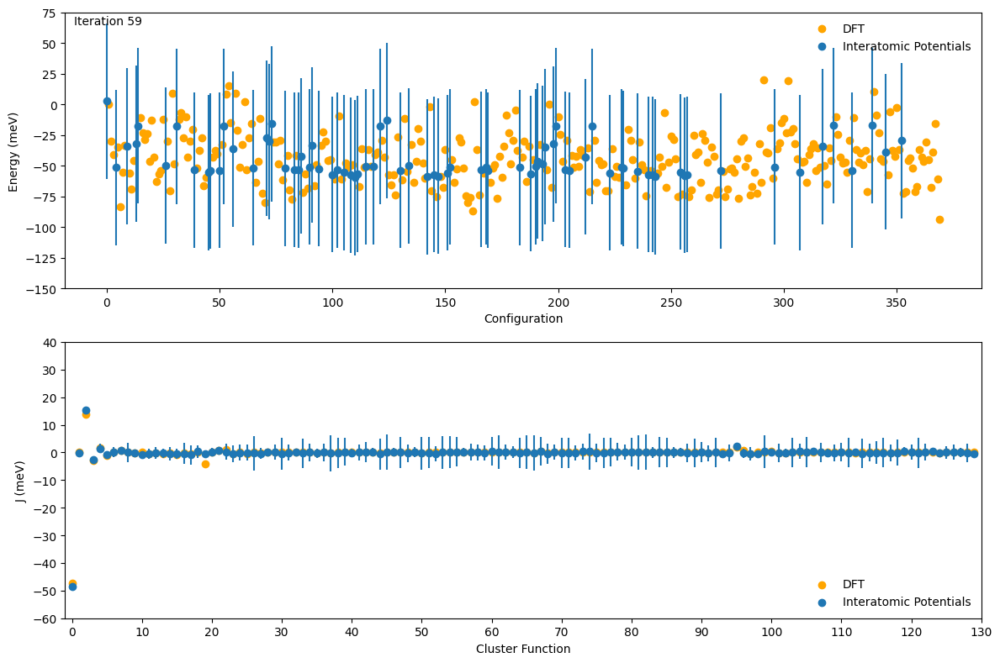

index of sampled structures: [369, 354, 353, 274, 258, 351, 350, 312, 25, 20, 358, 356, 294, 282, 279, 359, 284, 283, 247, 159, 343, 291, 233, 131, 29, 319, 281, 275, 262, 24, 368, 331, 252, 182, 125, 367, 348, 99, 63, 58, 259, 181, 149, 148, 87, 347, 340, 234, 232, 93, 357, 288, 264, 255, 78, 302, 179, 174, 141, 55, 237, 216, 133, 64, 42, 304, 287, 204, 62, 43, 270, 219, 218, 122, 19, 278, 241, 196, 162, 44, 329, 314, 208, 101, 17, 175, 172, 161, 106, 97, 335, 334, 143, 140, 126, 364, 277, 123, 92, 40, 308, 163, 18, 12, 10, 271, 267, 253, 160, 146, 321, 299, 248, 154, 23, 362, 332, 195, 84, 38, 310, 305, 251, 189, 137, 338, 285, 165, 139, 81, 289, 269, 210, 176, 48, 361, 263, 209, 173, 70, 315, 303, 239, 222, 82, 336, 292, 226, 184, 178, 355, 349, 344, 297, 112, 301, 280, 245, 221, 207, 261, 80, 77, 35, 8, 325, 249, 187, 128, 27, 318, 206, 192, 155, 1, 293, 224, 113, 33, 6, 342, 109, 96, 76, 21, 363, 246, 230, 119, 117, 313, 273, 236, 217, 60, 311, 286, 201, 177, 47, 360, 136, 114, 74

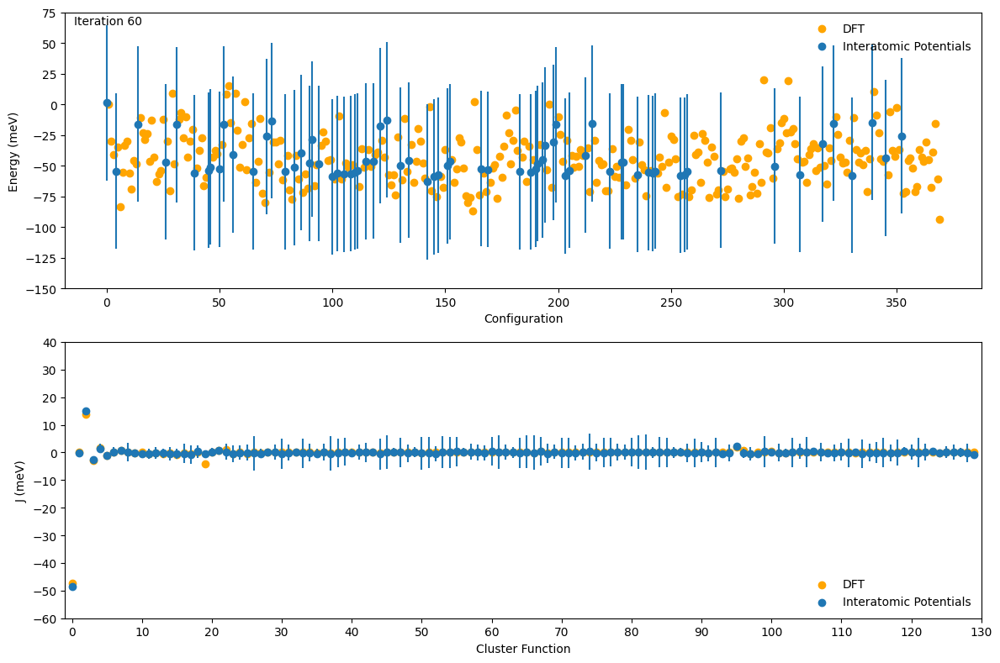

index of sampled structures: [369, 354, 353, 274, 258, 351, 350, 312, 25, 20, 358, 356, 294, 282, 279, 359, 284, 283, 247, 159, 343, 291, 233, 131, 29, 319, 281, 275, 262, 24, 368, 331, 252, 182, 125, 367, 348, 99, 63, 58, 259, 181, 149, 148, 87, 347, 340, 234, 232, 93, 357, 288, 264, 255, 78, 302, 179, 174, 141, 55, 237, 216, 133, 64, 42, 304, 287, 204, 62, 43, 270, 219, 218, 122, 19, 278, 241, 196, 162, 44, 329, 314, 208, 101, 17, 175, 172, 161, 106, 97, 335, 334, 143, 140, 126, 364, 277, 123, 92, 40, 308, 163, 18, 12, 10, 271, 267, 253, 160, 146, 321, 299, 248, 154, 23, 362, 332, 195, 84, 38, 310, 305, 251, 189, 137, 338, 285, 165, 139, 81, 289, 269, 210, 176, 48, 361, 263, 209, 173, 70, 315, 303, 239, 222, 82, 336, 292, 226, 184, 178, 355, 349, 344, 297, 112, 301, 280, 245, 221, 207, 261, 80, 77, 35, 8, 325, 249, 187, 128, 27, 318, 206, 192, 155, 1, 293, 224, 113, 33, 6, 342, 109, 96, 76, 21, 363, 246, 230, 119, 117, 313, 273, 236, 217, 60, 311, 286, 201, 177, 47, 360, 136, 114, 74

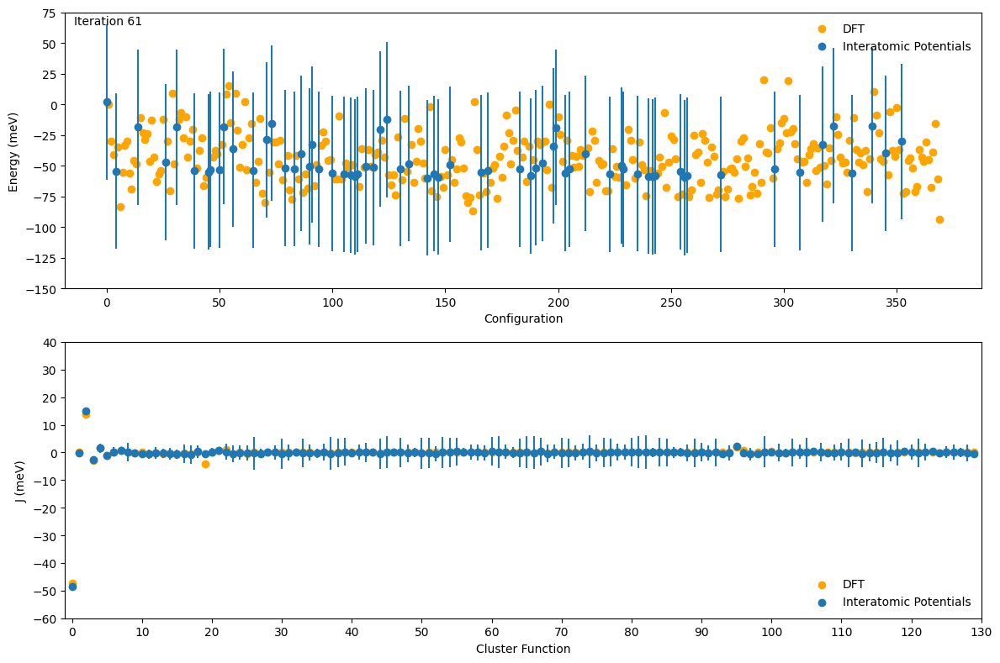

index of sampled structures: [369, 354, 353, 274, 258, 351, 350, 312, 25, 20, 358, 356, 294, 282, 279, 359, 284, 283, 247, 159, 343, 291, 233, 131, 29, 319, 281, 275, 262, 24, 368, 331, 252, 182, 125, 367, 348, 99, 63, 58, 259, 181, 149, 148, 87, 347, 340, 234, 232, 93, 357, 288, 264, 255, 78, 302, 179, 174, 141, 55, 237, 216, 133, 64, 42, 304, 287, 204, 62, 43, 270, 219, 218, 122, 19, 278, 241, 196, 162, 44, 329, 314, 208, 101, 17, 175, 172, 161, 106, 97, 335, 334, 143, 140, 126, 364, 277, 123, 92, 40, 308, 163, 18, 12, 10, 271, 267, 253, 160, 146, 321, 299, 248, 154, 23, 362, 332, 195, 84, 38, 310, 305, 251, 189, 137, 338, 285, 165, 139, 81, 289, 269, 210, 176, 48, 361, 263, 209, 173, 70, 315, 303, 239, 222, 82, 336, 292, 226, 184, 178, 355, 349, 344, 297, 112, 301, 280, 245, 221, 207, 261, 80, 77, 35, 8, 325, 249, 187, 128, 27, 318, 206, 192, 155, 1, 293, 224, 113, 33, 6, 342, 109, 96, 76, 21, 363, 246, 230, 119, 117, 313, 273, 236, 217, 60, 311, 286, 201, 177, 47, 360, 136, 114, 74

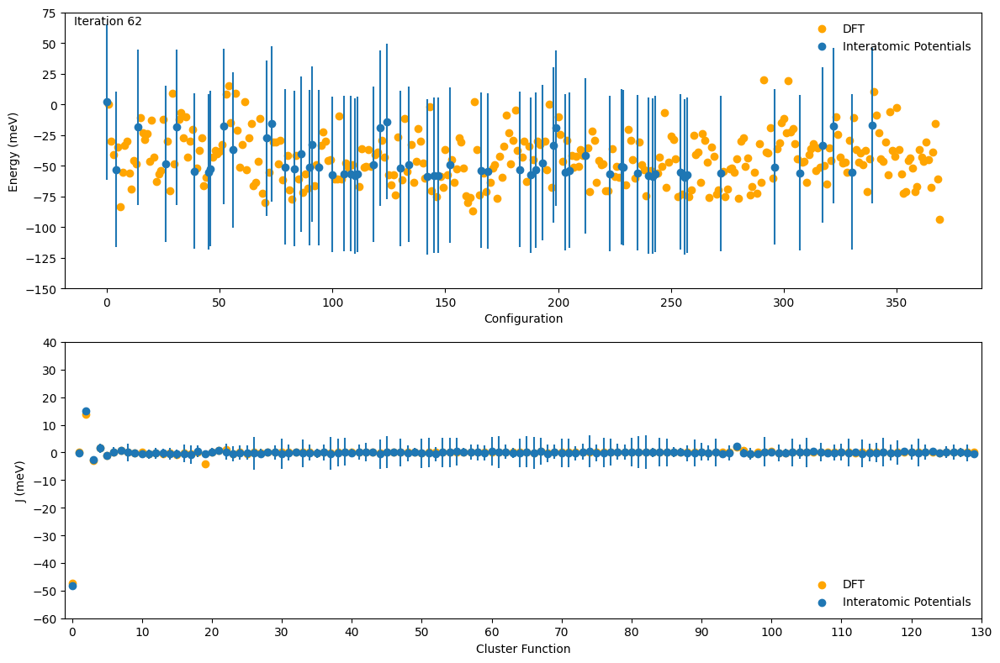

index of sampled structures: [369, 354, 353, 274, 258, 351, 350, 312, 25, 20, 358, 356, 294, 282, 279, 359, 284, 283, 247, 159, 343, 291, 233, 131, 29, 319, 281, 275, 262, 24, 368, 331, 252, 182, 125, 367, 348, 99, 63, 58, 259, 181, 149, 148, 87, 347, 340, 234, 232, 93, 357, 288, 264, 255, 78, 302, 179, 174, 141, 55, 237, 216, 133, 64, 42, 304, 287, 204, 62, 43, 270, 219, 218, 122, 19, 278, 241, 196, 162, 44, 329, 314, 208, 101, 17, 175, 172, 161, 106, 97, 335, 334, 143, 140, 126, 364, 277, 123, 92, 40, 308, 163, 18, 12, 10, 271, 267, 253, 160, 146, 321, 299, 248, 154, 23, 362, 332, 195, 84, 38, 310, 305, 251, 189, 137, 338, 285, 165, 139, 81, 289, 269, 210, 176, 48, 361, 263, 209, 173, 70, 315, 303, 239, 222, 82, 336, 292, 226, 184, 178, 355, 349, 344, 297, 112, 301, 280, 245, 221, 207, 261, 80, 77, 35, 8, 325, 249, 187, 128, 27, 318, 206, 192, 155, 1, 293, 224, 113, 33, 6, 342, 109, 96, 76, 21, 363, 246, 230, 119, 117, 313, 273, 236, 217, 60, 311, 286, 201, 177, 47, 360, 136, 114, 74

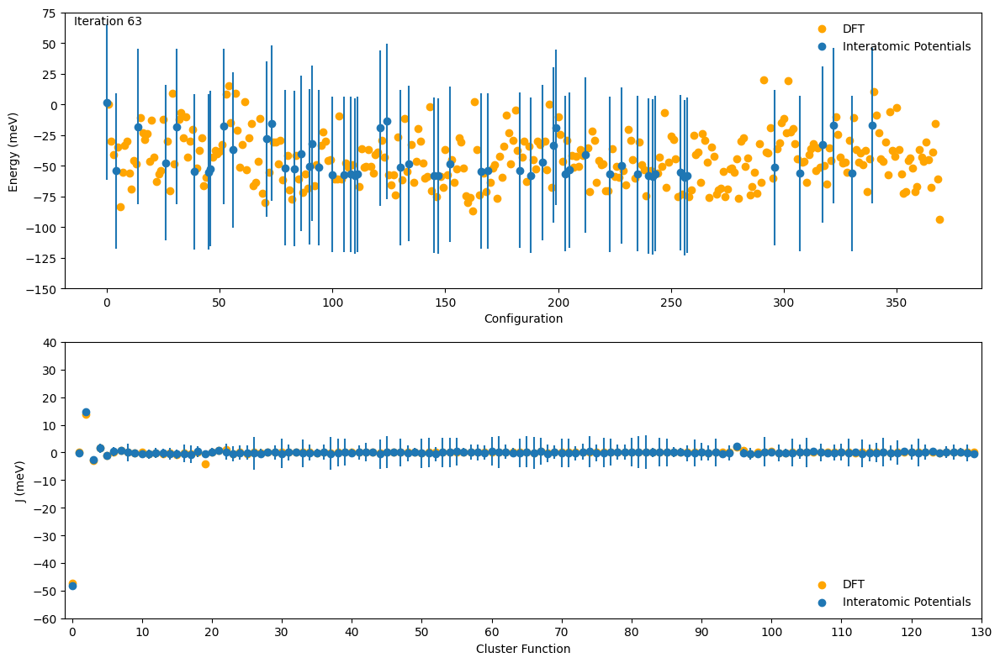

index of sampled structures: [369, 354, 353, 274, 258, 351, 350, 312, 25, 20, 358, 356, 294, 282, 279, 359, 284, 283, 247, 159, 343, 291, 233, 131, 29, 319, 281, 275, 262, 24, 368, 331, 252, 182, 125, 367, 348, 99, 63, 58, 259, 181, 149, 148, 87, 347, 340, 234, 232, 93, 357, 288, 264, 255, 78, 302, 179, 174, 141, 55, 237, 216, 133, 64, 42, 304, 287, 204, 62, 43, 270, 219, 218, 122, 19, 278, 241, 196, 162, 44, 329, 314, 208, 101, 17, 175, 172, 161, 106, 97, 335, 334, 143, 140, 126, 364, 277, 123, 92, 40, 308, 163, 18, 12, 10, 271, 267, 253, 160, 146, 321, 299, 248, 154, 23, 362, 332, 195, 84, 38, 310, 305, 251, 189, 137, 338, 285, 165, 139, 81, 289, 269, 210, 176, 48, 361, 263, 209, 173, 70, 315, 303, 239, 222, 82, 336, 292, 226, 184, 178, 355, 349, 344, 297, 112, 301, 280, 245, 221, 207, 261, 80, 77, 35, 8, 325, 249, 187, 128, 27, 318, 206, 192, 155, 1, 293, 224, 113, 33, 6, 342, 109, 96, 76, 21, 363, 246, 230, 119, 117, 313, 273, 236, 217, 60, 311, 286, 201, 177, 47, 360, 136, 114, 74

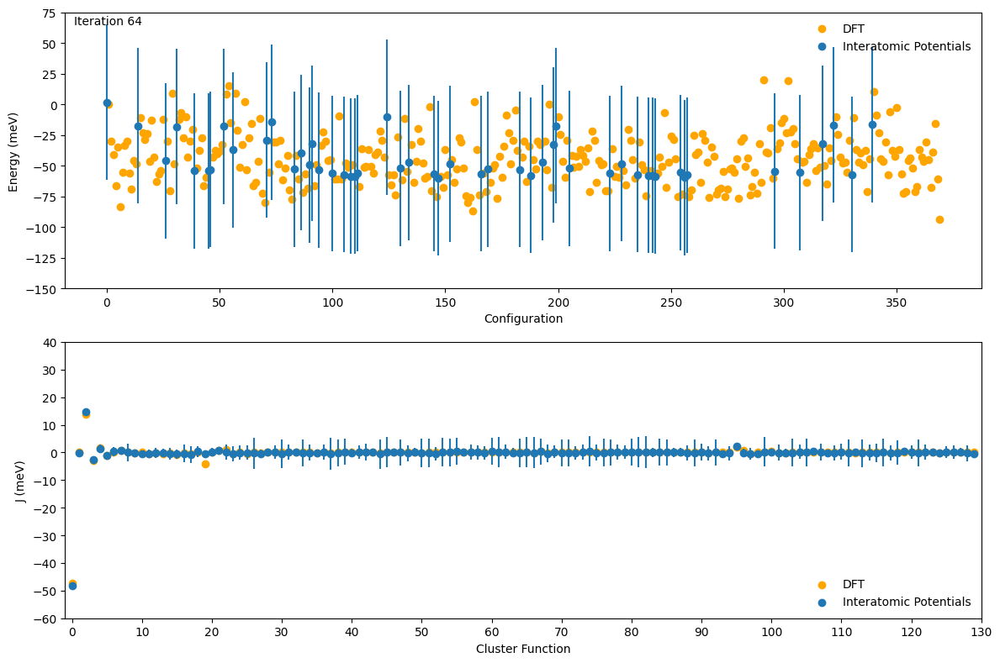

index of sampled structures: [369, 354, 353, 274, 258, 351, 350, 312, 25, 20, 358, 356, 294, 282, 279, 359, 284, 283, 247, 159, 343, 291, 233, 131, 29, 319, 281, 275, 262, 24, 368, 331, 252, 182, 125, 367, 348, 99, 63, 58, 259, 181, 149, 148, 87, 347, 340, 234, 232, 93, 357, 288, 264, 255, 78, 302, 179, 174, 141, 55, 237, 216, 133, 64, 42, 304, 287, 204, 62, 43, 270, 219, 218, 122, 19, 278, 241, 196, 162, 44, 329, 314, 208, 101, 17, 175, 172, 161, 106, 97, 335, 334, 143, 140, 126, 364, 277, 123, 92, 40, 308, 163, 18, 12, 10, 271, 267, 253, 160, 146, 321, 299, 248, 154, 23, 362, 332, 195, 84, 38, 310, 305, 251, 189, 137, 338, 285, 165, 139, 81, 289, 269, 210, 176, 48, 361, 263, 209, 173, 70, 315, 303, 239, 222, 82, 336, 292, 226, 184, 178, 355, 349, 344, 297, 112, 301, 280, 245, 221, 207, 261, 80, 77, 35, 8, 325, 249, 187, 128, 27, 318, 206, 192, 155, 1, 293, 224, 113, 33, 6, 342, 109, 96, 76, 21, 363, 246, 230, 119, 117, 313, 273, 236, 217, 60, 311, 286, 201, 177, 47, 360, 136, 114, 74

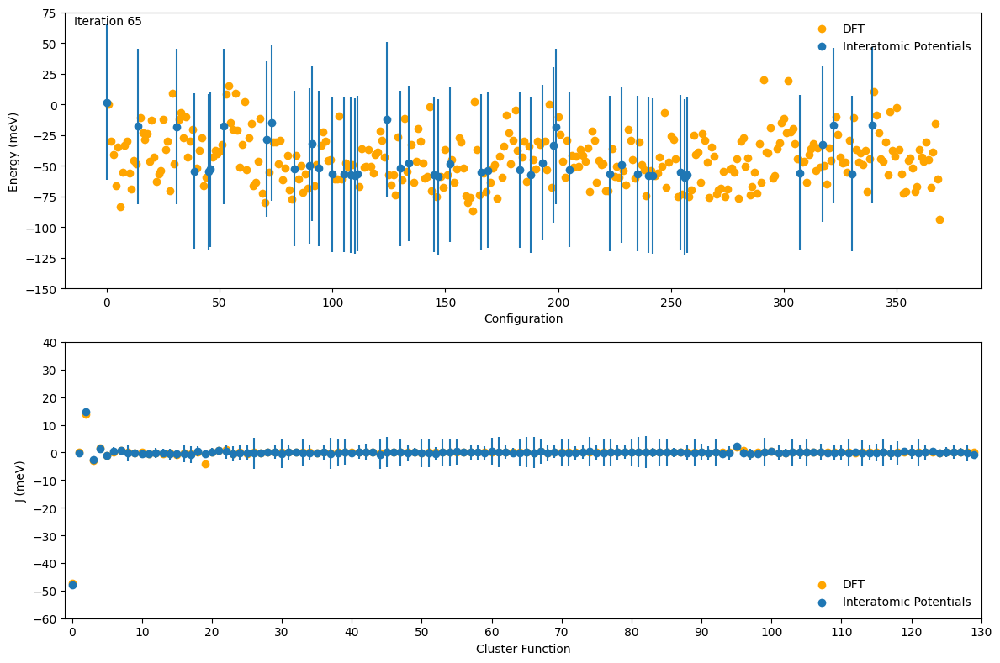

index of sampled structures: [369, 354, 353, 274, 258, 351, 350, 312, 25, 20, 358, 356, 294, 282, 279, 359, 284, 283, 247, 159, 343, 291, 233, 131, 29, 319, 281, 275, 262, 24, 368, 331, 252, 182, 125, 367, 348, 99, 63, 58, 259, 181, 149, 148, 87, 347, 340, 234, 232, 93, 357, 288, 264, 255, 78, 302, 179, 174, 141, 55, 237, 216, 133, 64, 42, 304, 287, 204, 62, 43, 270, 219, 218, 122, 19, 278, 241, 196, 162, 44, 329, 314, 208, 101, 17, 175, 172, 161, 106, 97, 335, 334, 143, 140, 126, 364, 277, 123, 92, 40, 308, 163, 18, 12, 10, 271, 267, 253, 160, 146, 321, 299, 248, 154, 23, 362, 332, 195, 84, 38, 310, 305, 251, 189, 137, 338, 285, 165, 139, 81, 289, 269, 210, 176, 48, 361, 263, 209, 173, 70, 315, 303, 239, 222, 82, 336, 292, 226, 184, 178, 355, 349, 344, 297, 112, 301, 280, 245, 221, 207, 261, 80, 77, 35, 8, 325, 249, 187, 128, 27, 318, 206, 192, 155, 1, 293, 224, 113, 33, 6, 342, 109, 96, 76, 21, 363, 246, 230, 119, 117, 313, 273, 236, 217, 60, 311, 286, 201, 177, 47, 360, 136, 114, 74

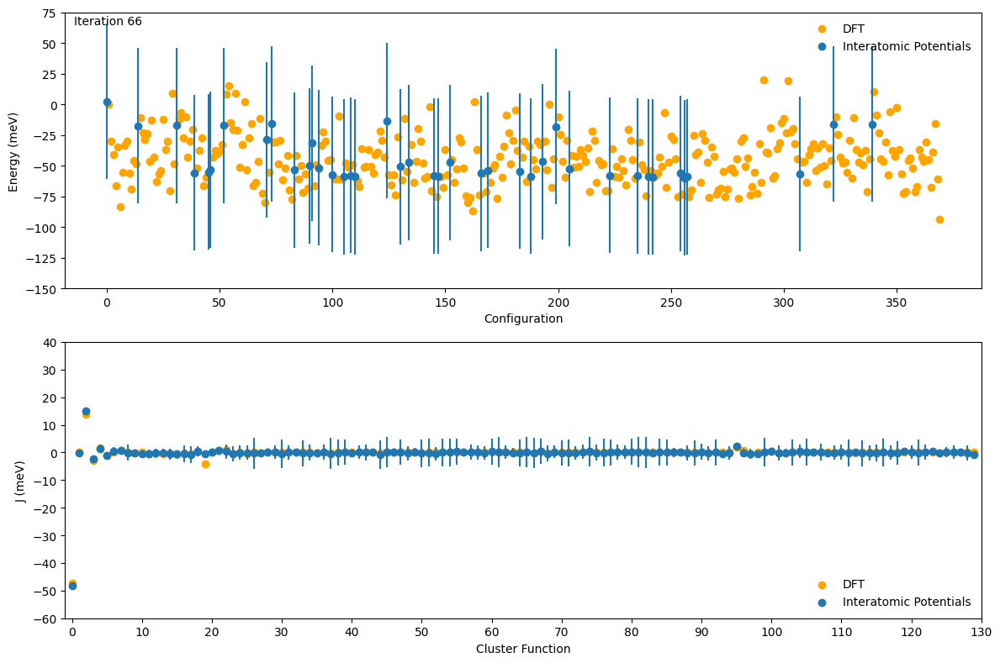

index of sampled structures: [369, 354, 353, 274, 258, 351, 350, 312, 25, 20, 358, 356, 294, 282, 279, 359, 284, 283, 247, 159, 343, 291, 233, 131, 29, 319, 281, 275, 262, 24, 368, 331, 252, 182, 125, 367, 348, 99, 63, 58, 259, 181, 149, 148, 87, 347, 340, 234, 232, 93, 357, 288, 264, 255, 78, 302, 179, 174, 141, 55, 237, 216, 133, 64, 42, 304, 287, 204, 62, 43, 270, 219, 218, 122, 19, 278, 241, 196, 162, 44, 329, 314, 208, 101, 17, 175, 172, 161, 106, 97, 335, 334, 143, 140, 126, 364, 277, 123, 92, 40, 308, 163, 18, 12, 10, 271, 267, 253, 160, 146, 321, 299, 248, 154, 23, 362, 332, 195, 84, 38, 310, 305, 251, 189, 137, 338, 285, 165, 139, 81, 289, 269, 210, 176, 48, 361, 263, 209, 173, 70, 315, 303, 239, 222, 82, 336, 292, 226, 184, 178, 355, 349, 344, 297, 112, 301, 280, 245, 221, 207, 261, 80, 77, 35, 8, 325, 249, 187, 128, 27, 318, 206, 192, 155, 1, 293, 224, 113, 33, 6, 342, 109, 96, 76, 21, 363, 246, 230, 119, 117, 313, 273, 236, 217, 60, 311, 286, 201, 177, 47, 360, 136, 114, 74

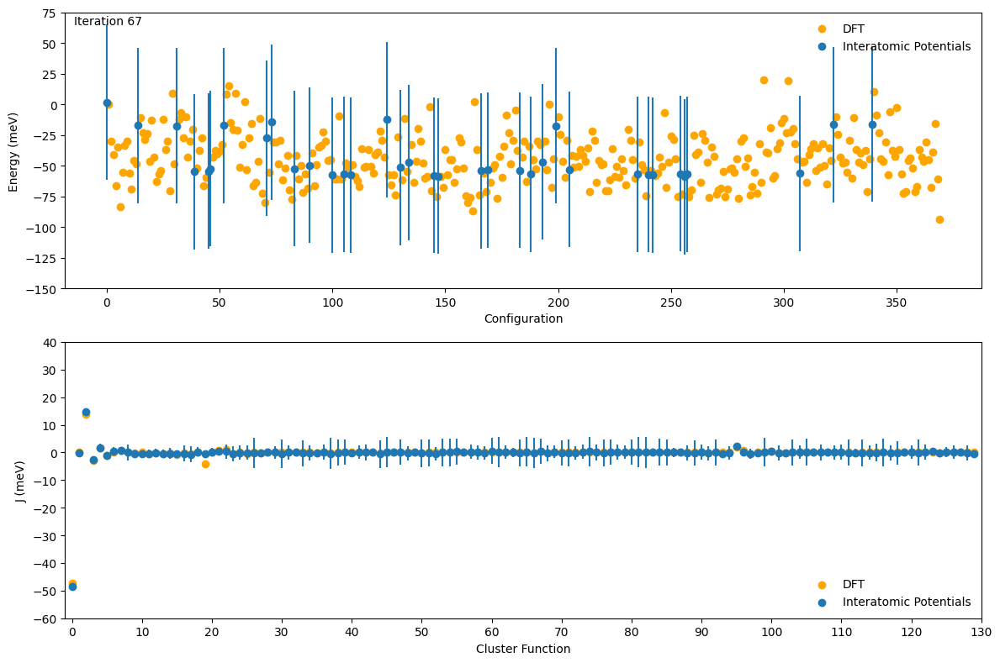

index of sampled structures: [369, 354, 353, 274, 258, 351, 350, 312, 25, 20, 358, 356, 294, 282, 279, 359, 284, 283, 247, 159, 343, 291, 233, 131, 29, 319, 281, 275, 262, 24, 368, 331, 252, 182, 125, 367, 348, 99, 63, 58, 259, 181, 149, 148, 87, 347, 340, 234, 232, 93, 357, 288, 264, 255, 78, 302, 179, 174, 141, 55, 237, 216, 133, 64, 42, 304, 287, 204, 62, 43, 270, 219, 218, 122, 19, 278, 241, 196, 162, 44, 329, 314, 208, 101, 17, 175, 172, 161, 106, 97, 335, 334, 143, 140, 126, 364, 277, 123, 92, 40, 308, 163, 18, 12, 10, 271, 267, 253, 160, 146, 321, 299, 248, 154, 23, 362, 332, 195, 84, 38, 310, 305, 251, 189, 137, 338, 285, 165, 139, 81, 289, 269, 210, 176, 48, 361, 263, 209, 173, 70, 315, 303, 239, 222, 82, 336, 292, 226, 184, 178, 355, 349, 344, 297, 112, 301, 280, 245, 221, 207, 261, 80, 77, 35, 8, 325, 249, 187, 128, 27, 318, 206, 192, 155, 1, 293, 224, 113, 33, 6, 342, 109, 96, 76, 21, 363, 246, 230, 119, 117, 313, 273, 236, 217, 60, 311, 286, 201, 177, 47, 360, 136, 114, 74

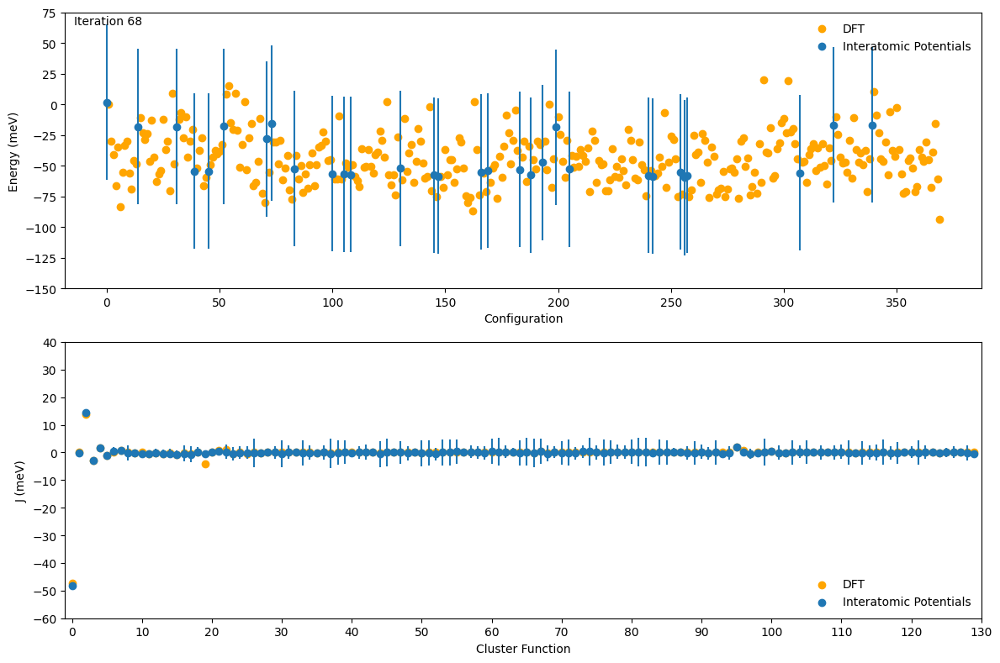

index of sampled structures: [369, 354, 353, 274, 258, 351, 350, 312, 25, 20, 358, 356, 294, 282, 279, 359, 284, 283, 247, 159, 343, 291, 233, 131, 29, 319, 281, 275, 262, 24, 368, 331, 252, 182, 125, 367, 348, 99, 63, 58, 259, 181, 149, 148, 87, 347, 340, 234, 232, 93, 357, 288, 264, 255, 78, 302, 179, 174, 141, 55, 237, 216, 133, 64, 42, 304, 287, 204, 62, 43, 270, 219, 218, 122, 19, 278, 241, 196, 162, 44, 329, 314, 208, 101, 17, 175, 172, 161, 106, 97, 335, 334, 143, 140, 126, 364, 277, 123, 92, 40, 308, 163, 18, 12, 10, 271, 267, 253, 160, 146, 321, 299, 248, 154, 23, 362, 332, 195, 84, 38, 310, 305, 251, 189, 137, 338, 285, 165, 139, 81, 289, 269, 210, 176, 48, 361, 263, 209, 173, 70, 315, 303, 239, 222, 82, 336, 292, 226, 184, 178, 355, 349, 344, 297, 112, 301, 280, 245, 221, 207, 261, 80, 77, 35, 8, 325, 249, 187, 128, 27, 318, 206, 192, 155, 1, 293, 224, 113, 33, 6, 342, 109, 96, 76, 21, 363, 246, 230, 119, 117, 313, 273, 236, 217, 60, 311, 286, 201, 177, 47, 360, 136, 114, 74

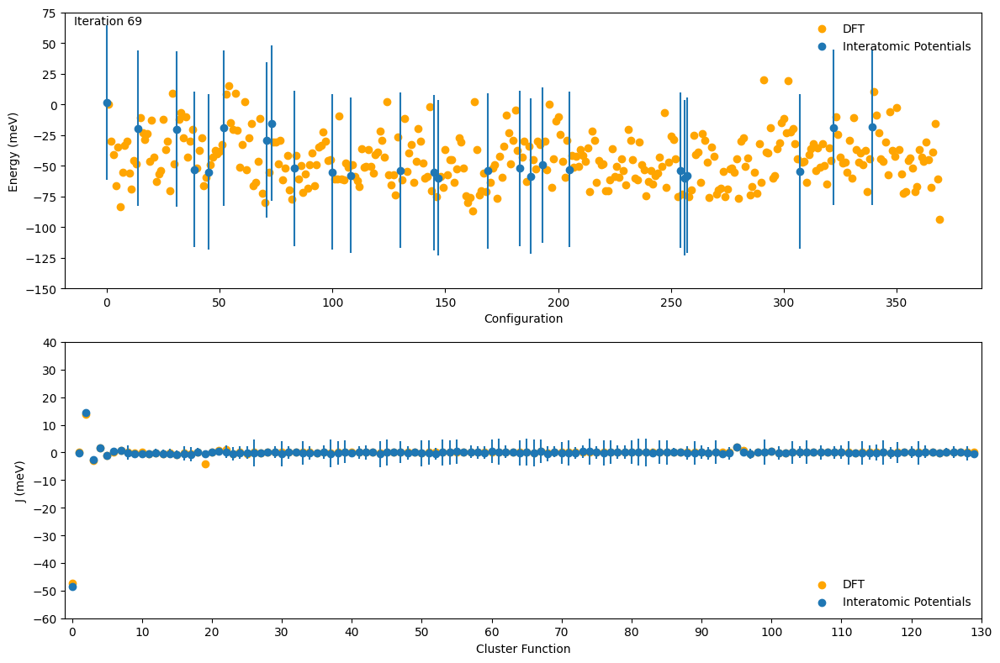

index of sampled structures: [369, 354, 353, 274, 258, 351, 350, 312, 25, 20, 358, 356, 294, 282, 279, 359, 284, 283, 247, 159, 343, 291, 233, 131, 29, 319, 281, 275, 262, 24, 368, 331, 252, 182, 125, 367, 348, 99, 63, 58, 259, 181, 149, 148, 87, 347, 340, 234, 232, 93, 357, 288, 264, 255, 78, 302, 179, 174, 141, 55, 237, 216, 133, 64, 42, 304, 287, 204, 62, 43, 270, 219, 218, 122, 19, 278, 241, 196, 162, 44, 329, 314, 208, 101, 17, 175, 172, 161, 106, 97, 335, 334, 143, 140, 126, 364, 277, 123, 92, 40, 308, 163, 18, 12, 10, 271, 267, 253, 160, 146, 321, 299, 248, 154, 23, 362, 332, 195, 84, 38, 310, 305, 251, 189, 137, 338, 285, 165, 139, 81, 289, 269, 210, 176, 48, 361, 263, 209, 173, 70, 315, 303, 239, 222, 82, 336, 292, 226, 184, 178, 355, 349, 344, 297, 112, 301, 280, 245, 221, 207, 261, 80, 77, 35, 8, 325, 249, 187, 128, 27, 318, 206, 192, 155, 1, 293, 224, 113, 33, 6, 342, 109, 96, 76, 21, 363, 246, 230, 119, 117, 313, 273, 236, 217, 60, 311, 286, 201, 177, 47, 360, 136, 114, 74

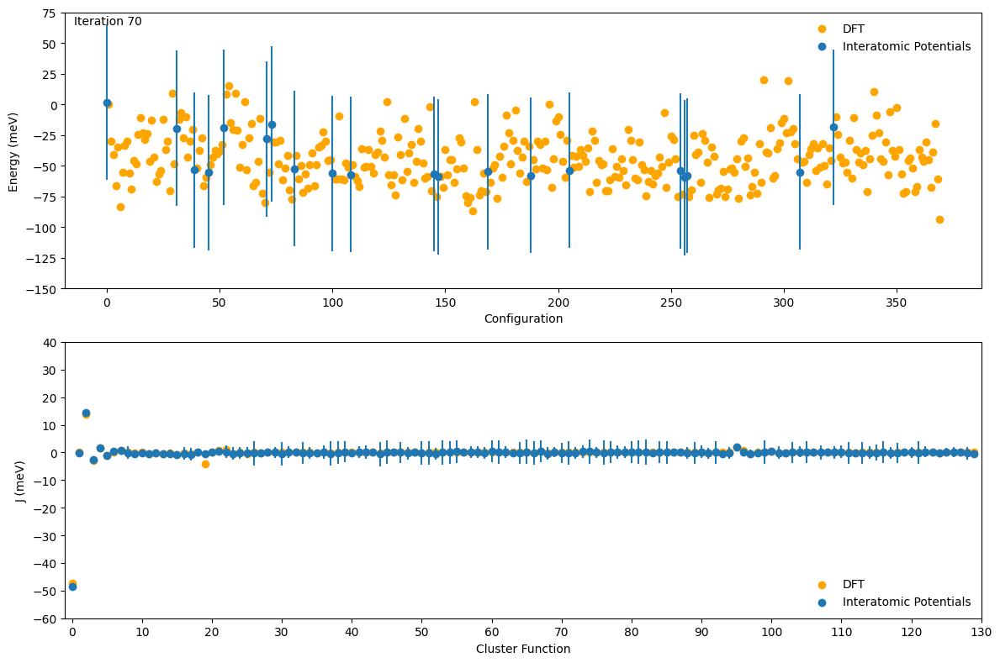

index of sampled structures: [369, 354, 353, 274, 258, 351, 350, 312, 25, 20, 358, 356, 294, 282, 279, 359, 284, 283, 247, 159, 343, 291, 233, 131, 29, 319, 281, 275, 262, 24, 368, 331, 252, 182, 125, 367, 348, 99, 63, 58, 259, 181, 149, 148, 87, 347, 340, 234, 232, 93, 357, 288, 264, 255, 78, 302, 179, 174, 141, 55, 237, 216, 133, 64, 42, 304, 287, 204, 62, 43, 270, 219, 218, 122, 19, 278, 241, 196, 162, 44, 329, 314, 208, 101, 17, 175, 172, 161, 106, 97, 335, 334, 143, 140, 126, 364, 277, 123, 92, 40, 308, 163, 18, 12, 10, 271, 267, 253, 160, 146, 321, 299, 248, 154, 23, 362, 332, 195, 84, 38, 310, 305, 251, 189, 137, 338, 285, 165, 139, 81, 289, 269, 210, 176, 48, 361, 263, 209, 173, 70, 315, 303, 239, 222, 82, 336, 292, 226, 184, 178, 355, 349, 344, 297, 112, 301, 280, 245, 221, 207, 261, 80, 77, 35, 8, 325, 249, 187, 128, 27, 318, 206, 192, 155, 1, 293, 224, 113, 33, 6, 342, 109, 96, 76, 21, 363, 246, 230, 119, 117, 313, 273, 236, 217, 60, 311, 286, 201, 177, 47, 360, 136, 114, 74

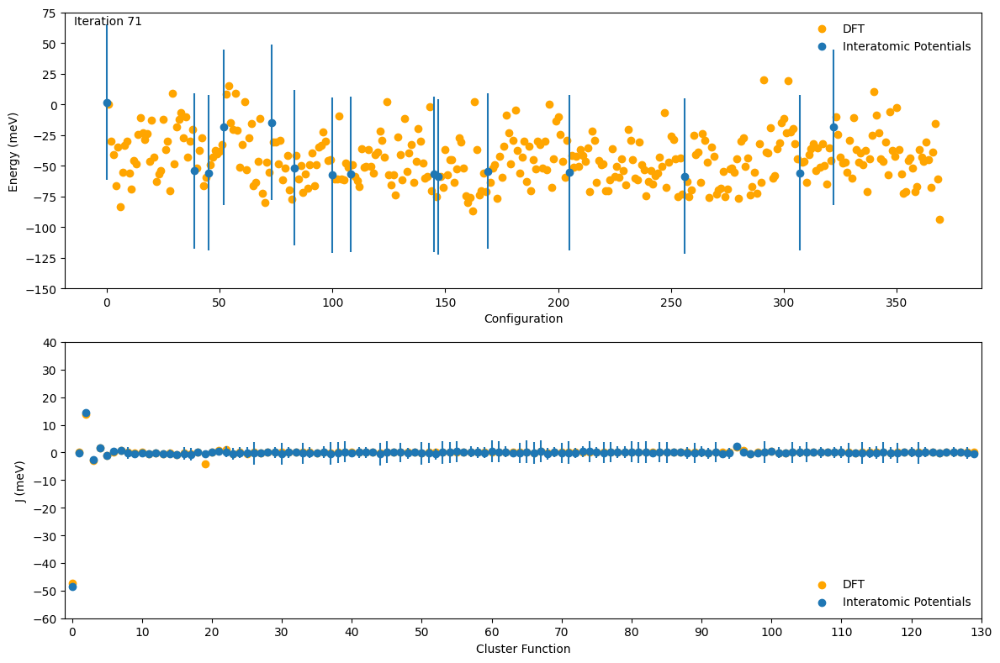

index of sampled structures: [369, 354, 353, 274, 258, 351, 350, 312, 25, 20, 358, 356, 294, 282, 279, 359, 284, 283, 247, 159, 343, 291, 233, 131, 29, 319, 281, 275, 262, 24, 368, 331, 252, 182, 125, 367, 348, 99, 63, 58, 259, 181, 149, 148, 87, 347, 340, 234, 232, 93, 357, 288, 264, 255, 78, 302, 179, 174, 141, 55, 237, 216, 133, 64, 42, 304, 287, 204, 62, 43, 270, 219, 218, 122, 19, 278, 241, 196, 162, 44, 329, 314, 208, 101, 17, 175, 172, 161, 106, 97, 335, 334, 143, 140, 126, 364, 277, 123, 92, 40, 308, 163, 18, 12, 10, 271, 267, 253, 160, 146, 321, 299, 248, 154, 23, 362, 332, 195, 84, 38, 310, 305, 251, 189, 137, 338, 285, 165, 139, 81, 289, 269, 210, 176, 48, 361, 263, 209, 173, 70, 315, 303, 239, 222, 82, 336, 292, 226, 184, 178, 355, 349, 344, 297, 112, 301, 280, 245, 221, 207, 261, 80, 77, 35, 8, 325, 249, 187, 128, 27, 318, 206, 192, 155, 1, 293, 224, 113, 33, 6, 342, 109, 96, 76, 21, 363, 246, 230, 119, 117, 313, 273, 236, 217, 60, 311, 286, 201, 177, 47, 360, 136, 114, 74

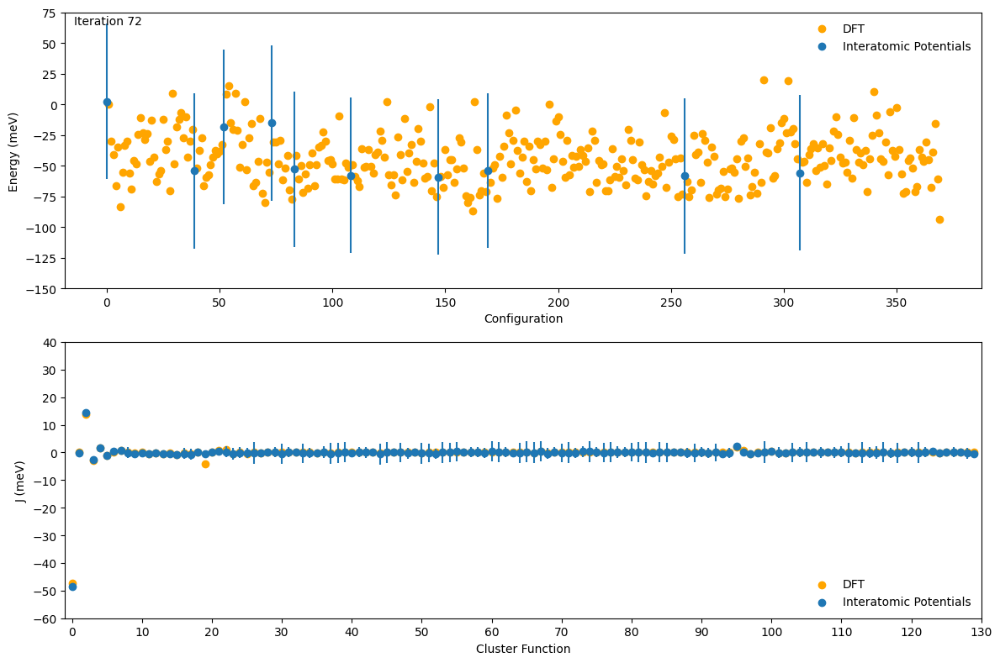

index of sampled structures: [369, 354, 353, 274, 258, 351, 350, 312, 25, 20, 358, 356, 294, 282, 279, 359, 284, 283, 247, 159, 343, 291, 233, 131, 29, 319, 281, 275, 262, 24, 368, 331, 252, 182, 125, 367, 348, 99, 63, 58, 259, 181, 149, 148, 87, 347, 340, 234, 232, 93, 357, 288, 264, 255, 78, 302, 179, 174, 141, 55, 237, 216, 133, 64, 42, 304, 287, 204, 62, 43, 270, 219, 218, 122, 19, 278, 241, 196, 162, 44, 329, 314, 208, 101, 17, 175, 172, 161, 106, 97, 335, 334, 143, 140, 126, 364, 277, 123, 92, 40, 308, 163, 18, 12, 10, 271, 267, 253, 160, 146, 321, 299, 248, 154, 23, 362, 332, 195, 84, 38, 310, 305, 251, 189, 137, 338, 285, 165, 139, 81, 289, 269, 210, 176, 48, 361, 263, 209, 173, 70, 315, 303, 239, 222, 82, 336, 292, 226, 184, 178, 355, 349, 344, 297, 112, 301, 280, 245, 221, 207, 261, 80, 77, 35, 8, 325, 249, 187, 128, 27, 318, 206, 192, 155, 1, 293, 224, 113, 33, 6, 342, 109, 96, 76, 21, 363, 246, 230, 119, 117, 313, 273, 236, 217, 60, 311, 286, 201, 177, 47, 360, 136, 114, 74

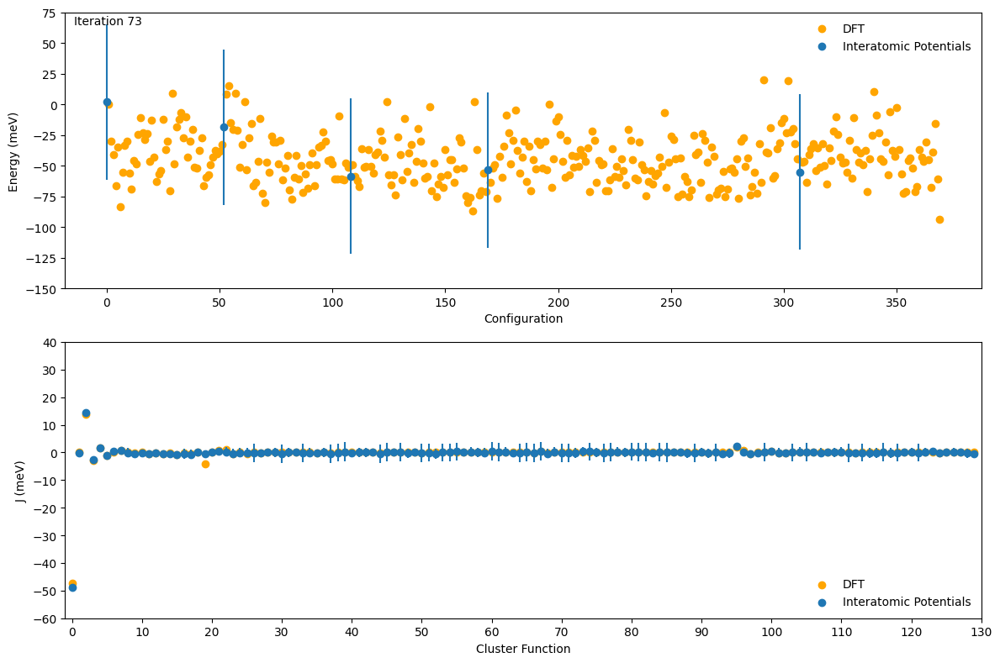

index of sampled structures: [369, 354, 353, 274, 258, 351, 350, 312, 25, 20, 358, 356, 294, 282, 279, 359, 284, 283, 247, 159, 343, 291, 233, 131, 29, 319, 281, 275, 262, 24, 368, 331, 252, 182, 125, 367, 348, 99, 63, 58, 259, 181, 149, 148, 87, 347, 340, 234, 232, 93, 357, 288, 264, 255, 78, 302, 179, 174, 141, 55, 237, 216, 133, 64, 42, 304, 287, 204, 62, 43, 270, 219, 218, 122, 19, 278, 241, 196, 162, 44, 329, 314, 208, 101, 17, 175, 172, 161, 106, 97, 335, 334, 143, 140, 126, 364, 277, 123, 92, 40, 308, 163, 18, 12, 10, 271, 267, 253, 160, 146, 321, 299, 248, 154, 23, 362, 332, 195, 84, 38, 310, 305, 251, 189, 137, 338, 285, 165, 139, 81, 289, 269, 210, 176, 48, 361, 263, 209, 173, 70, 315, 303, 239, 222, 82, 336, 292, 226, 184, 178, 355, 349, 344, 297, 112, 301, 280, 245, 221, 207, 261, 80, 77, 35, 8, 325, 249, 187, 128, 27, 318, 206, 192, 155, 1, 293, 224, 113, 33, 6, 342, 109, 96, 76, 21, 363, 246, 230, 119, 117, 313, 273, 236, 217, 60, 311, 286, 201, 177, 47, 360, 136, 114, 74

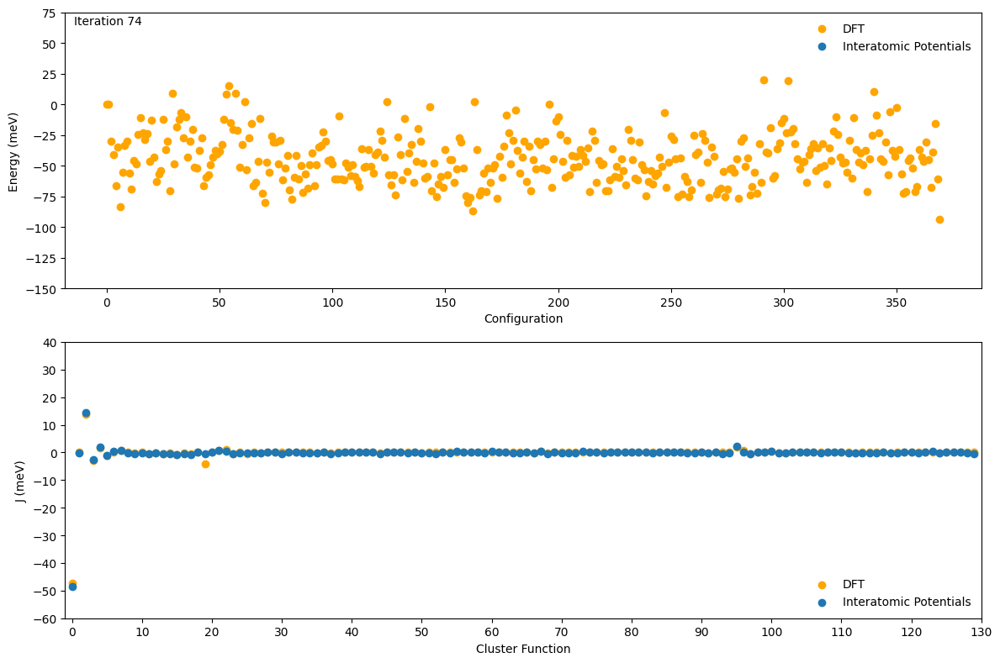

In [ ]:
# Initialize variables and data structures for the optimization process
next_K = K.copy()
next_mu = mu.copy()
mu_fixed = mu.copy()
energies = []
Js = []
f_sampled = []
index_notsampled = np.array(range(n_structures))
index_sampled = []
index = []
mu_n = []
mu_n.append(next_mu)
ids = []

# Perform iterative optimization for a specified number of loops
for j in range(number_of_loops):
    std = []
    std_J = []
    det = []

    # Calculate the inverse of the matrix 'next_K'
    K_inverse = np.linalg.inv(next_K)

    for i in range(len(K_inverse)):
        # Create a reduced matrix by deleting rows and columns
        reduced_K = np.delete(K_inverse, i, 0)
        reduced_K = np.delete(reduced_K, i, 1)

        # Calculate the sign and determinant of the reduced matrix
        sign, determinan = np.linalg.slogdet(reduced_K)
        det.append(determinan)

    # Identify the configuration with the maximum determinant for replacement with DFT
    max_det = max(det)
    max_det_index = np.argmax(det)
    index.append(max_det_index)

    # Identify the top 5 configurations to be replaced with DFT data
    id = np.argsort(det)[-5:]

    for k in range(1, len(id) + 1):
        # Update sampled and not-sampled structures
        index_sampled.append(index_notsampled[np.sort(id)[-k]])
        index_notsampled = np.delete(index_notsampled, np.sort(id)[-k])

        # Retrieve and store DFT values for the sampled structures
        f = PBE.iloc[index_sampled[-1], 7] / 1000
        f_sampled.append(f)

        # Update 'mu_fixed' and 'w' for the sampled structures
        mu_fixed[index_sampled[-1]] = f
        w[index_sampled[-1]][index_sampled[-1]] = 1

        # Update the inverse matrix 'K_inverse' and 'next_K'
        K_inverse = np.linalg.inv(next_K)
        K_ortho = np.delete(K_inverse, np.sort(id)[-k], 0)
        K_ortho = np.delete(K_ortho, np.sort(id)[-k], 1)
        next_K  = np.linalg.inv(K_ortho)

        # Update 'next_mu' and 'mu_n' for the orthogonal structures
        mu_ortho = next_mu.copy()
        mu_ortho = np.delete(np.array(mu_ortho), [np.sort(id)[-k]])
        K_ortho_par = np.array(K_inverse[:, np.sort(id)[-k]])
        K_ortho_par = np.delete(K_ortho_par, np.where(K_ortho_par == K_ortho_par[np.sort(id)[-k]]))
        next_mu = mu_ortho - np.matmul(next_K, K_ortho_par) * (f - next_mu[np.sort(id)[-k]])
        mu_n.append(next_mu)
        ids.append(id[k-1])

    print('index of sampled structures:', index_sampled)
    print('')

    # Calculate scaling factors for various potential energy contributions
    scaling_factor_meam = np.dot(f_sampled, f_meam[index_sampled]) / np.dot(f_meam[index_sampled], f_meam[index_sampled])
    scaling_factor_eam = np.dot(f_sampled, f_eam[index_sampled]) / np.dot(f_eam[index_sampled], f_eam[index_sampled])
    scaling_factor_reaxff = np.dot(f_sampled, f_reaxff[index_sampled]) / np.dot(f_reaxff[index_sampled], f_reaxff[index_sampled])
    scaling_factor_comb = np.dot(f_sampled, f_comb[index_sampled]) / np.dot(f_comb[index_sampled], f_comb[index_sampled])
    scaling_factor_CHGNet = np.dot(f_sampled, f_CHGNet[index_sampled]) / np.dot(f_CHGNet[index_sampled], f_CHGNet[index_sampled])
    scaling_factor_M3GNet = np.dot(f_sampled, f_M3GNet[index_sampled]) / np.dot(f_M3GNet[index_sampled], f_M3GNet[index_sampled])

    # Rescale potential energy contributions for interatomic potentials
    f_comb_rescaled = f_comb * scaling_factor_comb
    f_reaxff_rescaled = f_reaxff * scaling_factor_reaxff
    f_meam_rescaled = f_meam * scaling_factor_meam
    f_eam_rescaled = f_eam * scaling_factor_eam
    f_CHGNet_rescaled = f_CHGNet * scaling_factor_CHGNet
    f_M3GNet_rescaled = f_M3GNet * scaling_factor_M3GNet

    # Create a DataFrame with rescaled potential energy contributions
    ep_rescaled = pd.DataFrame([f_comb_rescaled, f_reaxff_rescaled, f_meam_rescaled, f_eam_rescaled, f_CHGNet_rescaled, f_M3GNet_rescaled])

    # Calculate the mean of rescaled contributions and their covariance matrix
    mu_rescaled = np.mean(ep_rescaled, axis=0)
    X_rescaled = np.stack((f_comb_rescaled, f_reaxff_rescaled, f_meam_rescaled, f_eam_rescaled, f_CHGNet_rescaled, f_M3GNet_rescaled))
    k_rescaled = np.cov(X_rescaled.T)

    # Update the rescaled covariance matrix 'K_rescaled'
    K_rescaled = k_rescaled + np.identity(n_structures) * 0.001
    next_K = K_rescaled.copy()
    next_mu = mu_rescaled.copy()
    mu_fixed = mu_rescaled.copy()

    # Update 'mu_fixed' for sampled structures with rescaled values
    mu_fixed[index_sampled] = f_sampled


    # Update the inverse matrix 'K_inverse' and 'next_K' with rescaled values
    K_inverse = np.linalg.inv(next_K)
    K_ortho = np.delete(K_inverse, np.sort(index_sampled), 0)
    K_ortho = np.delete(K_ortho, np.sort(index_sampled), 1)
    next_K  = np.linalg.inv(K_ortho)

    # Update 'next_mu' and 'mu_n' for the orthogonal structures with rescaled values
    mu_ortho = next_mu.copy()
    mu_ortho =np.delete(np.array(mu_ortho), [np.sort(index_sampled)])
    K_ortho_par = np.array(K_inverse[:, np.sort(index_sampled)])
    K_ortho_par = np.delete(K_ortho_par, np.sort(index_sampled), 0)
    next_mu = mu_ortho - np.matmul(next_K,(K_ortho_par @ np.array(f_sampled-next_mu[np.sort(index_sampled)])))
    mu_n.append(next_mu)


    # Calculate J parameters and energies
    J = np.matmul(np.linalg.pinv(np.matmul(w, Pi)), np.matmul(w, np.array(mu_fixed))) * 1000
    e = np.matmul(Pi, np.array(J))

    # Append calculated values for further analysis
    energies.append(e)
    Js.append(J)

    # Calculate RMSE and R-squared values
    RMSE.append(calc_rmse(PBE['Cluster_DFT (meV/f.u.)'], e))
    R2.append(calc_r2(PBE['Cluster_DFT (meV/f.u.)'], e))

    # Calculate standard deviations for structures not sampled
    for i in range(len(index_notsampled)):
        a = np.zeros(len(index_notsampled))
        a[i] = 1
        std.append(np.sqrt(np.matmul(a.T,np.matmul(next_K,a)))*2)

    # Calculate standard deviations for J parameters
    for i in range(len(Pi[0,:])):
      std_J.append(np.sqrt(np.matmul(Pi[index_notsampled,i].T,np.matmul(next_K,Pi[index_notsampled,i])))*2)

    # Store standard deviations for analysis
    stds.append(std)
    stds_J.append(std_J)

    # Plot the results for this iteration
    fig, ax = plt.subplots(2,1)

    # Plot Energies
    ax[0].scatter(index_sampled,np.array(f_sampled)*1000,label='DFT', color='orange')
    ax[0].scatter(index_notsampled,next_mu*1000, label = 'Interatomic Potentials')
    ax[0].errorbar(index_notsampled,next_mu*1000, yerr=np.array(std)*1000, linestyle="None")
    ax[0].set_xlabel('Configuration')
    ax[0].set_ylabel('Energy (meV)')
    ax[0].set_ylim([-150, 75])
    ax[0].legend(frameon=False)
    ax[0].annotate('Iteration %s' %(j+1), xy=(2, 1), xycoords='data',
            xytext=(0.01, .99), textcoords='axes fraction',
            va='top', ha='left')


    # Plot J Parameters
    ax[1].scatter(np.array(range(len(Pi[0,:]))),df_ecis['eci'], label='DFT', color='orange')
    ax[1].scatter(np.array(range(len(Pi[0,:]))), J, label='Interatomic Potentials')
    ax[1].errorbar(np.array(range(len(Pi[0,:]))),J, yerr=std_J, linestyle="None")
    ax[1].set_xlabel('Cluster Function')
    ax[1].set_ylabel('J (meV)')
    ax[1].set_ylim([-60, 40])
    ax[1].set_xlim([-1, 130])
    ax[1].set_xticks(np.arange(0.0, 131, 10))
    ax[1].set_yticks(np.arange(-60, 41, 10))
    ax[1].legend(frameon=False , loc='lower right')

    fig.set_figheight(8)
    fig.set_figwidth(12)

    plt.tight_layout()
    plt.show()


#Bayesian on Clusters (Iterative)

The process remains the same for selecting one structure at a time, and this can be achieved with a minor modification to the previous code. In the following cell, we will consolidate all the steps for your convenience.

index of sampled structures: [369]

RMSE = 14.272452869819066
R2 = 0.7812129511885924


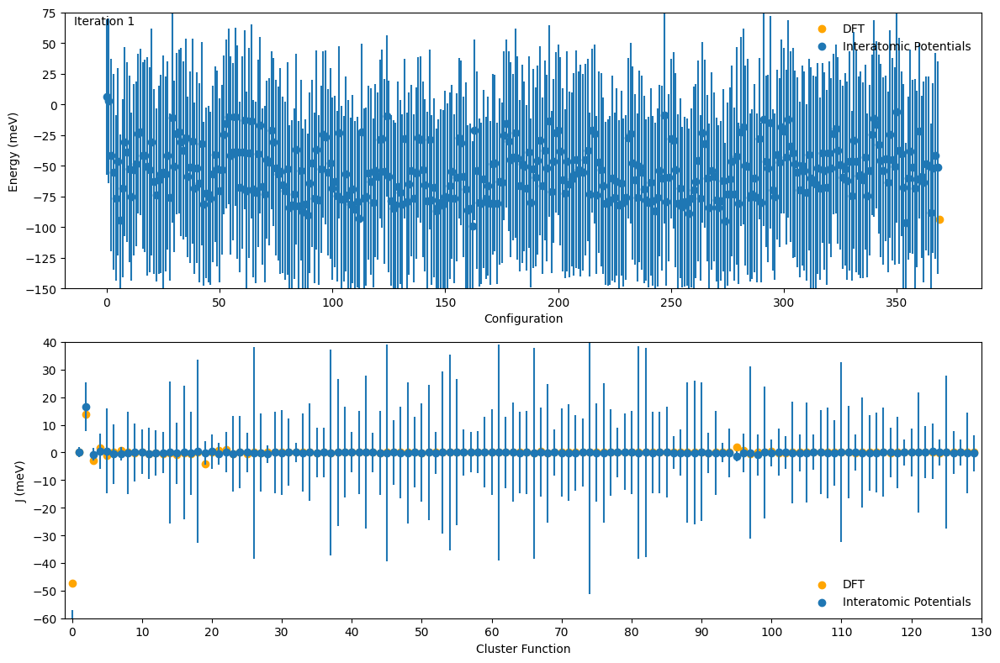

index of sampled structures: [369, 25]

RMSE = 8.296411476296667
R2 = 0.8405025665556118


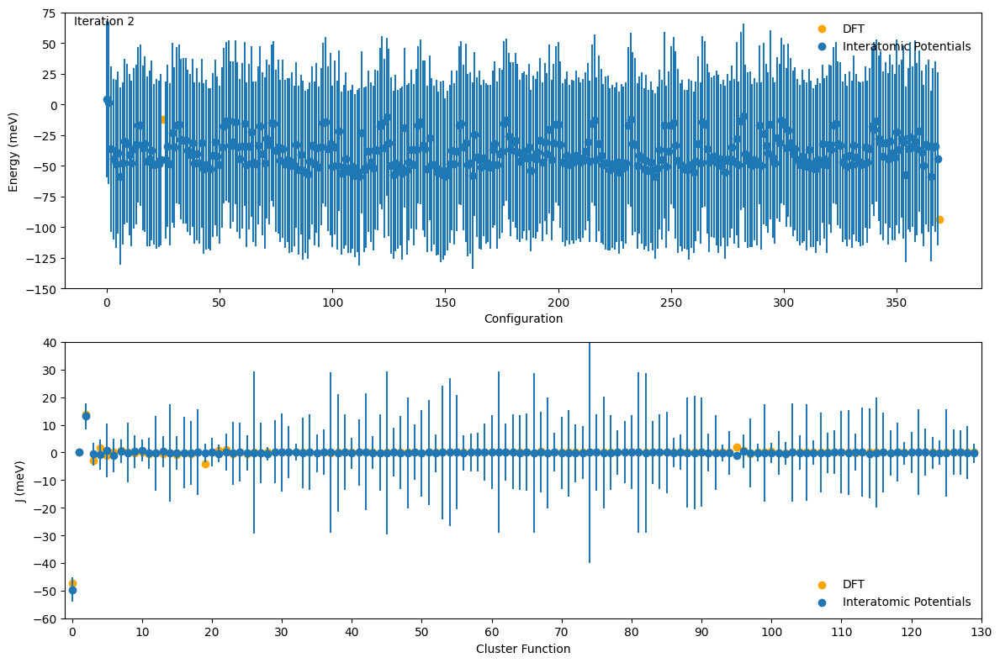

index of sampled structures: [369, 25, 358]

RMSE = 8.09258587521878
R2 = 0.8418118692295795


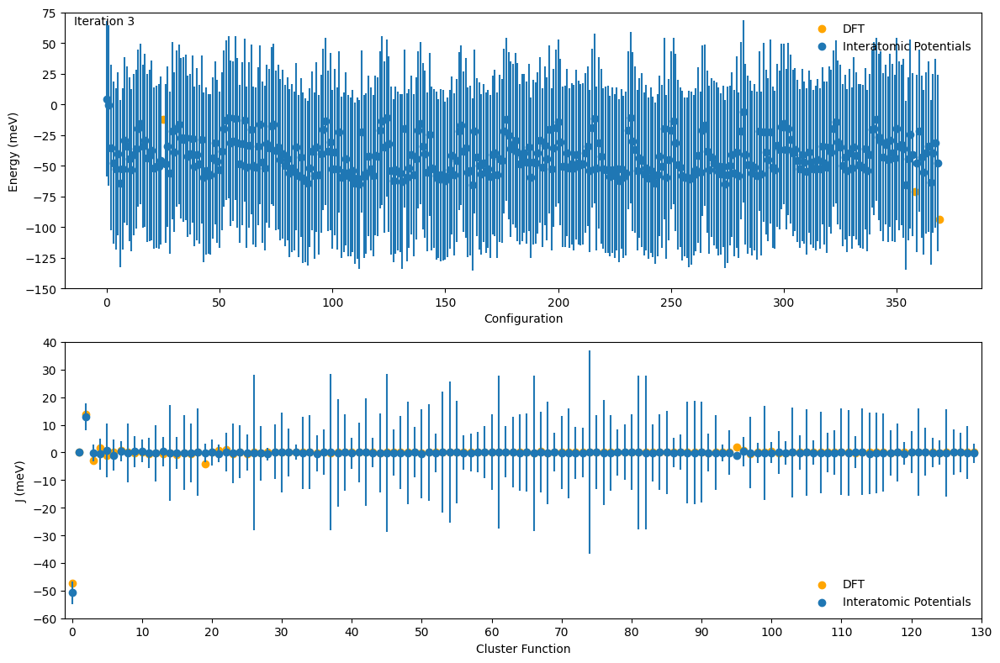

index of sampled structures: [369, 25, 358, 279]

RMSE = 8.085664123470508
R2 = 0.8426771379056518


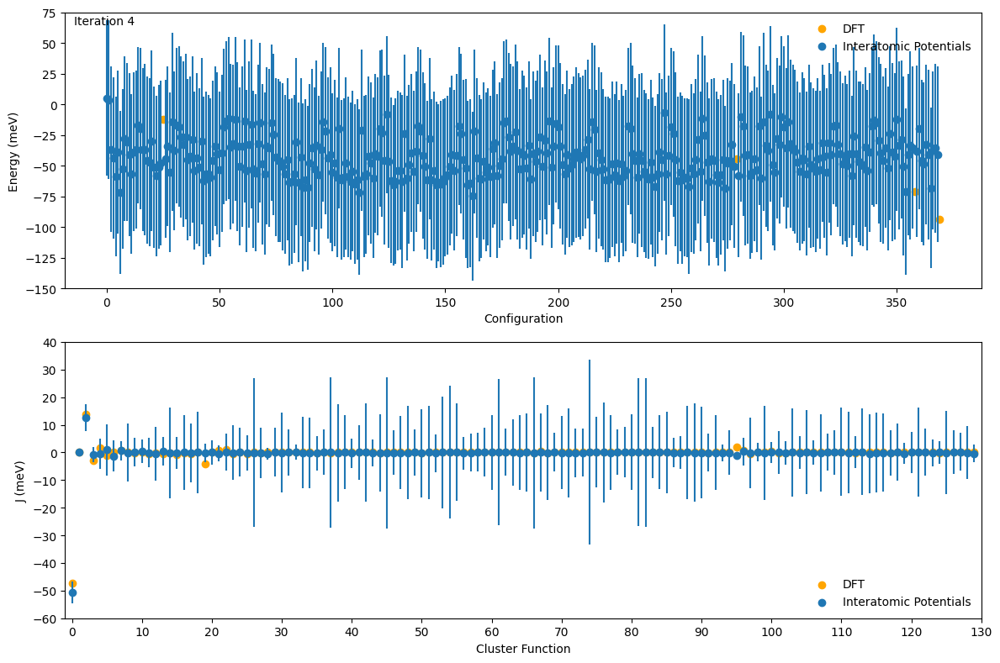

index of sampled structures: [369, 25, 358, 279, 356]

RMSE = 7.909860468835739
R2 = 0.8474750583579194


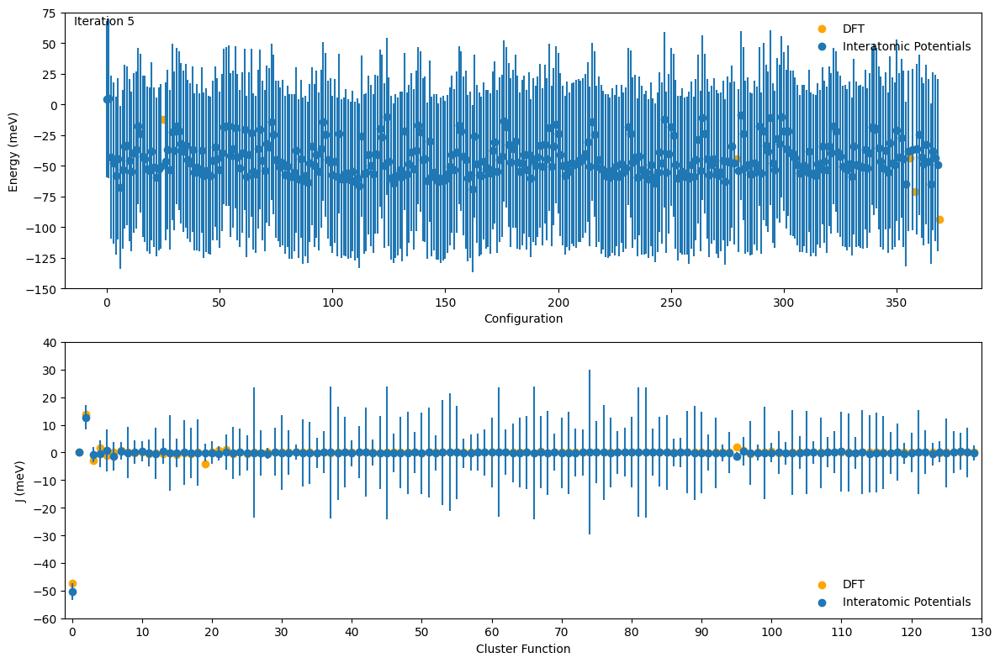

index of sampled structures: [369, 25, 358, 279, 356, 350]

RMSE = 8.229049376782736
R2 = 0.8448287681388358


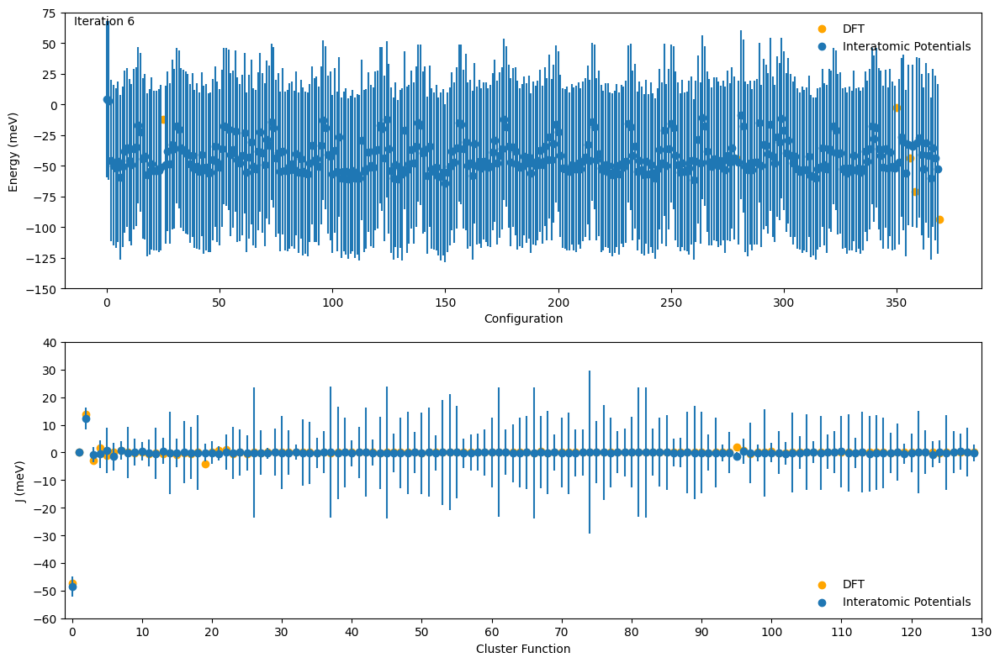

index of sampled structures: [369, 25, 358, 279, 356, 350, 159]

RMSE = 7.6877477649253585
R2 = 0.8550779337191715


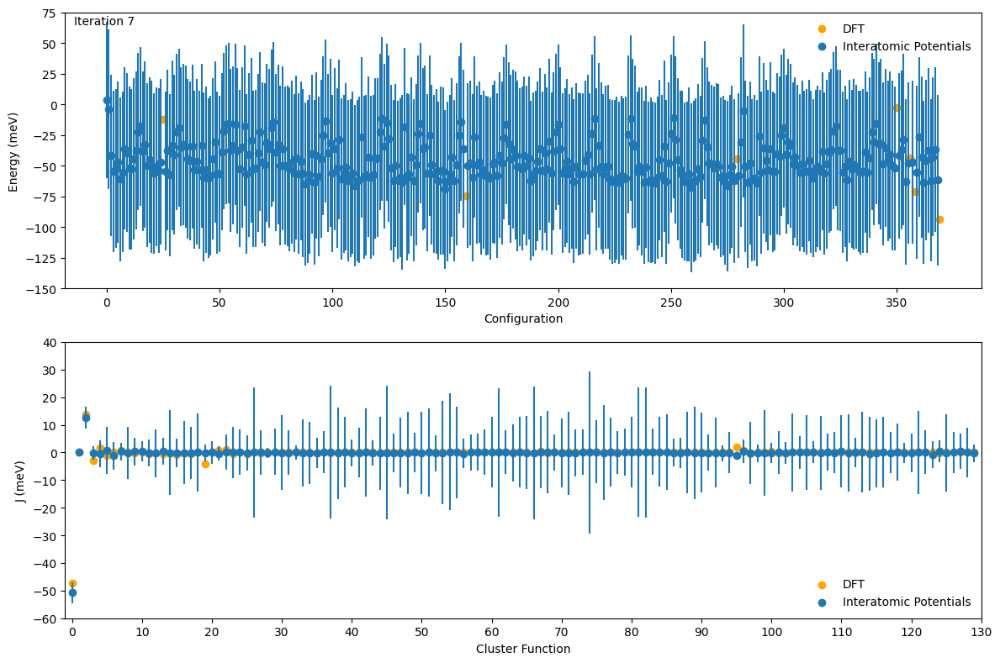

index of sampled structures: [369, 25, 358, 279, 356, 350, 159, 131]

RMSE = 7.843482115984529
R2 = 0.8525029012194992


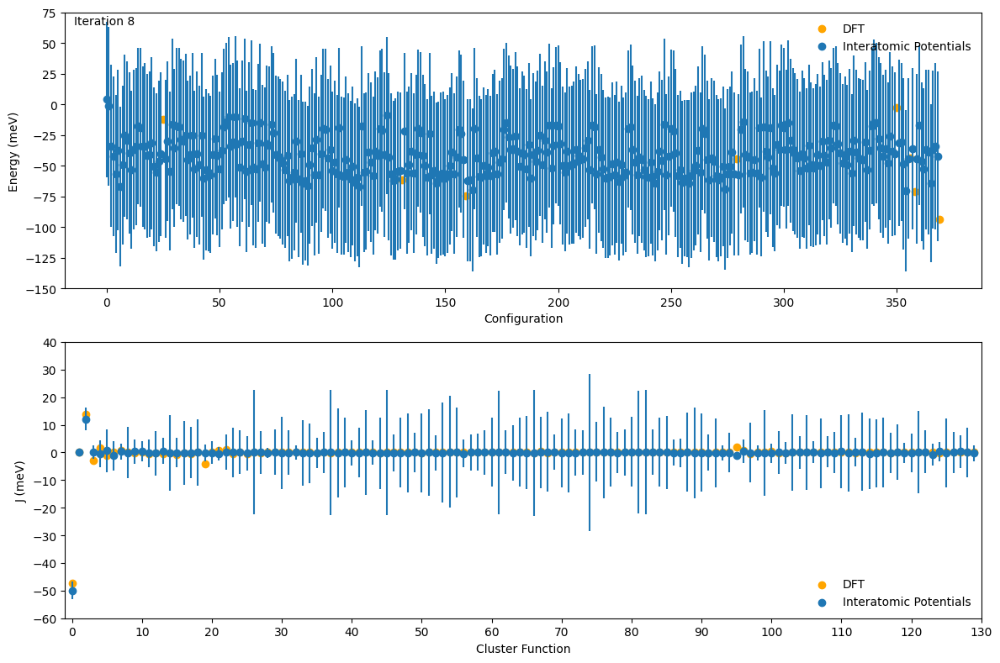

index of sampled structures: [369, 25, 358, 279, 356, 350, 159, 131, 294]

RMSE = 7.9707173517311976
R2 = 0.8509577063920378


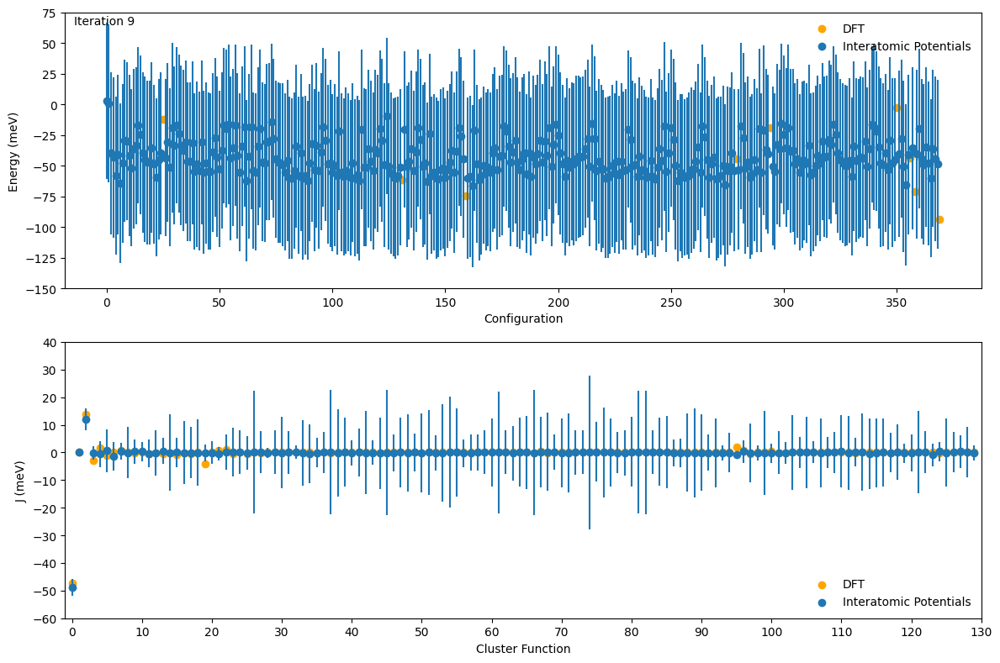

index of sampled structures: [369, 25, 358, 279, 356, 350, 159, 131, 294, 283]

RMSE = 7.790339194353059
R2 = 0.8539651603728662


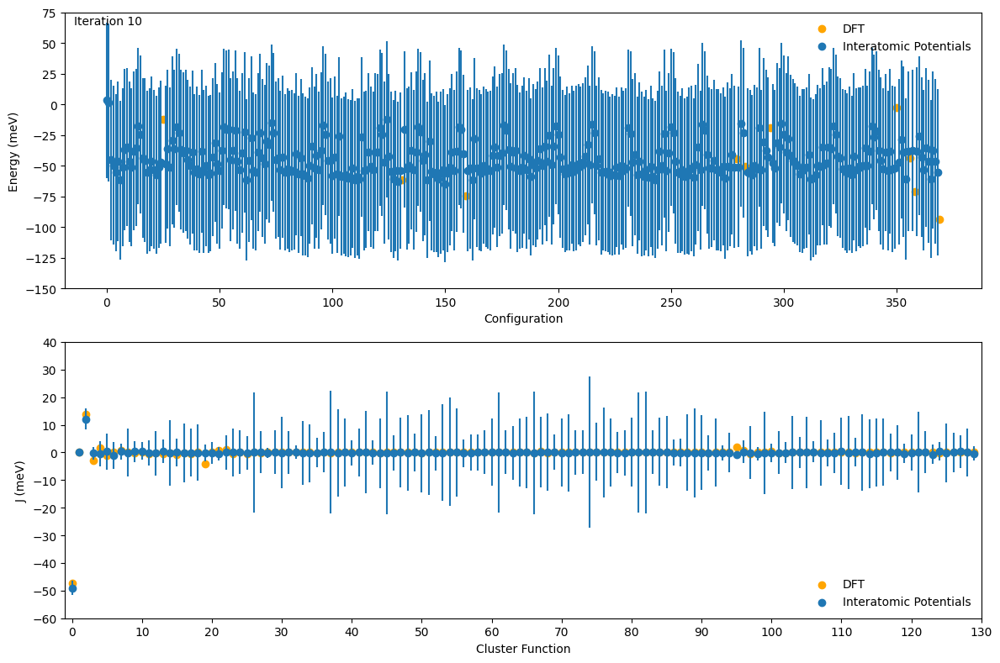

index of sampled structures: [369, 25, 358, 279, 356, 350, 159, 131, 294, 283, 353]

RMSE = 7.596176104539016
R2 = 0.8573831320703357


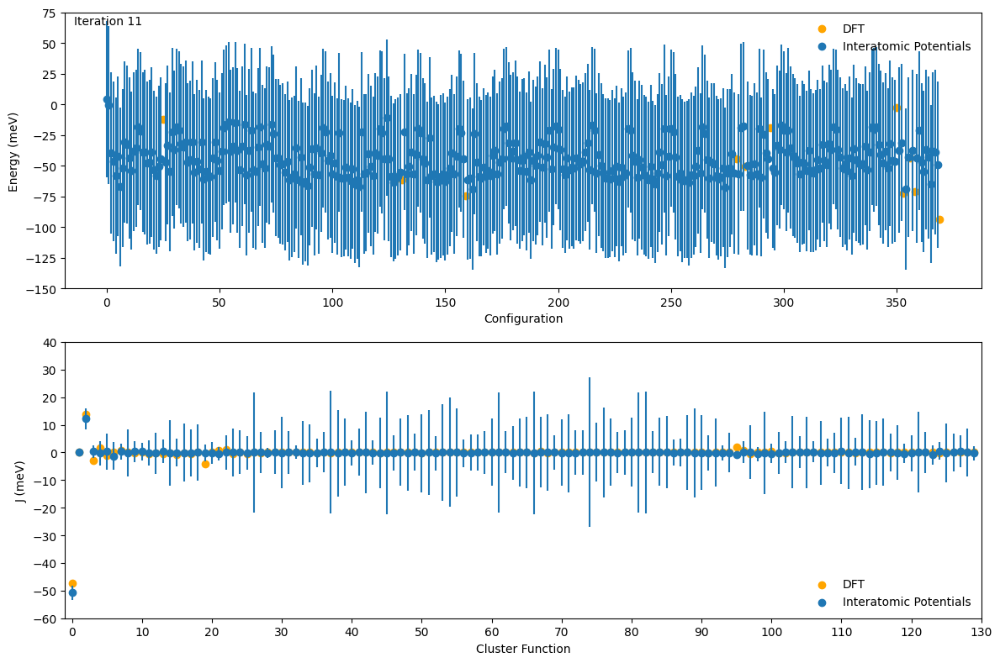

index of sampled structures: [369, 25, 358, 279, 356, 350, 159, 131, 294, 283, 353, 282]

RMSE = 7.612973804591627
R2 = 0.8570959729104252


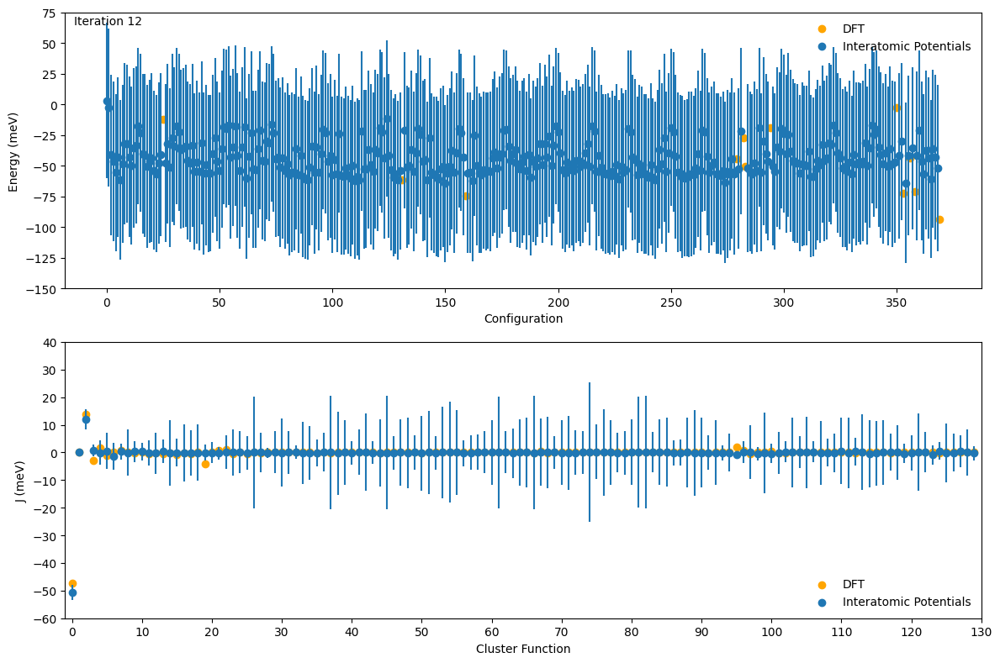

index of sampled structures: [369, 25, 358, 279, 356, 350, 159, 131, 294, 283, 353, 282, 20]

RMSE = 7.73654560688874
R2 = 0.8581231737497743


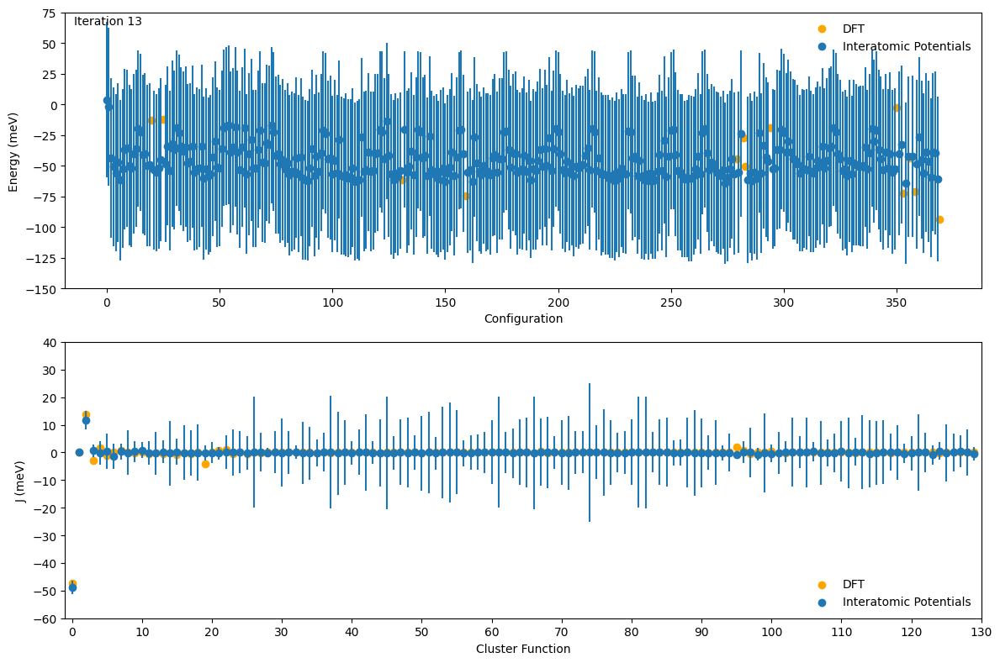

index of sampled structures: [369, 25, 358, 279, 356, 350, 159, 131, 294, 283, 353, 282, 20, 359]

RMSE = 7.507261904938049
R2 = 0.8611971046466737


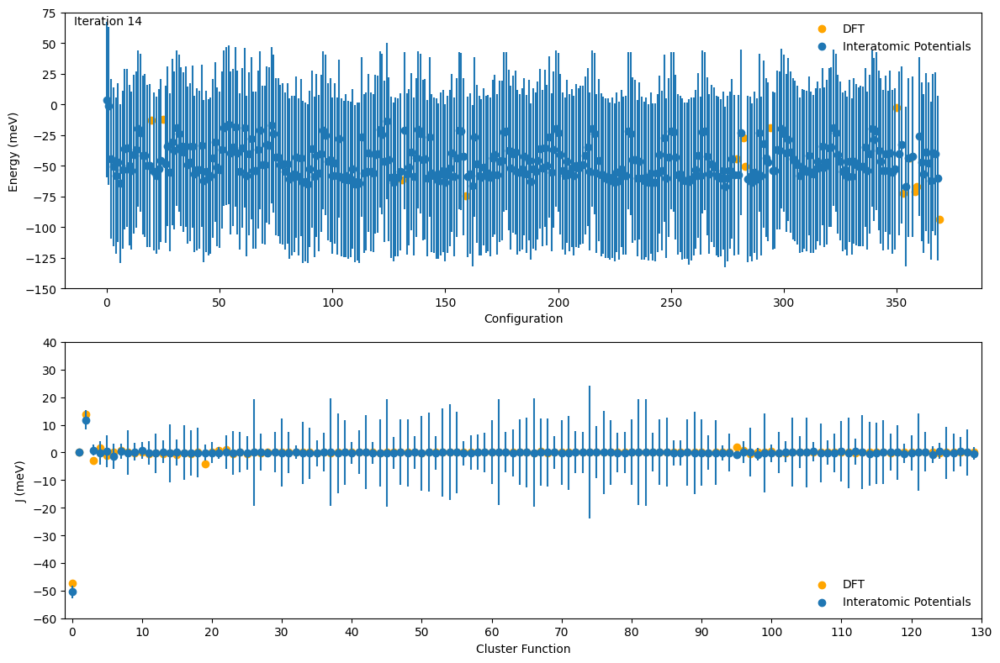

index of sampled structures: [369, 25, 358, 279, 356, 350, 159, 131, 294, 283, 353, 282, 20, 359, 247]

RMSE = 7.562067119590273
R2 = 0.8614284442955573


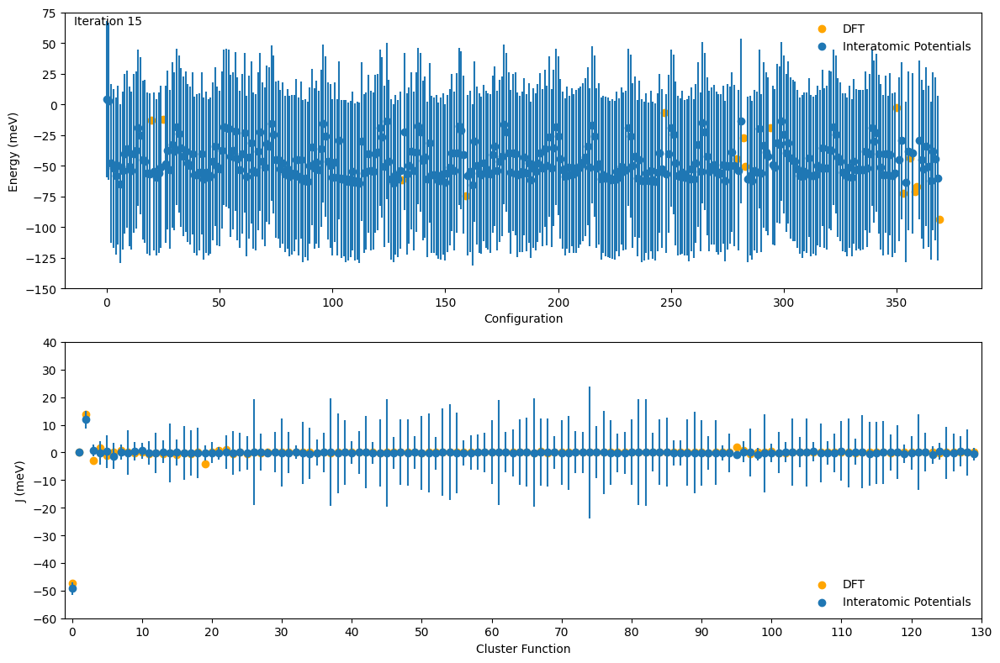

index of sampled structures: [369, 25, 358, 279, 356, 350, 159, 131, 294, 283, 353, 282, 20, 359, 247, 258]

RMSE = 7.538554549130039
R2 = 0.8608252375010653


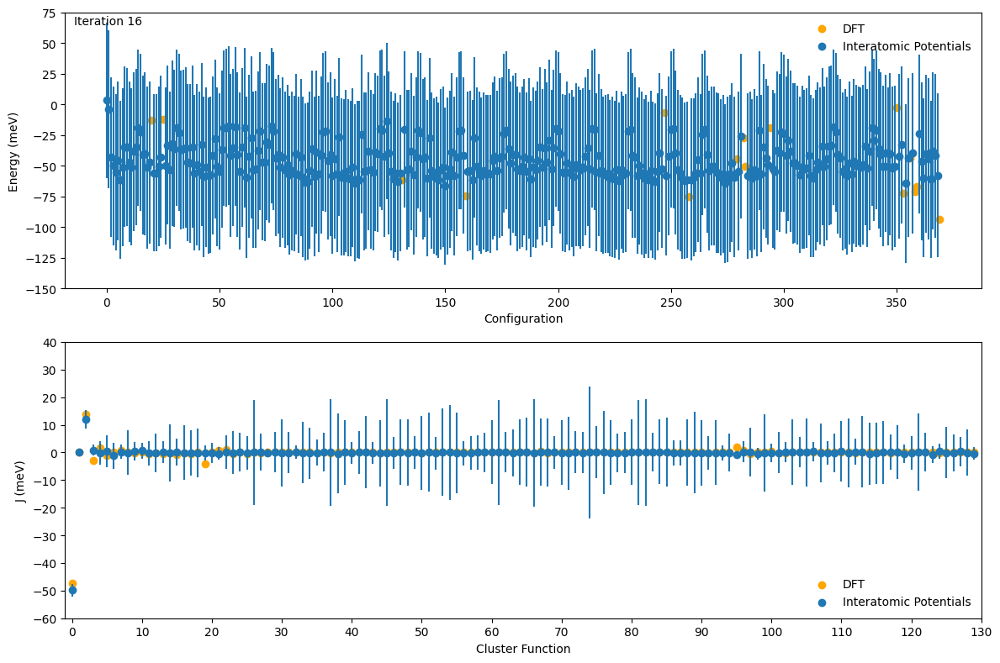

index of sampled structures: [369, 25, 358, 279, 356, 350, 159, 131, 294, 283, 353, 282, 20, 359, 247, 258, 29]

RMSE = 7.657070320730752
R2 = 0.8595591143252754


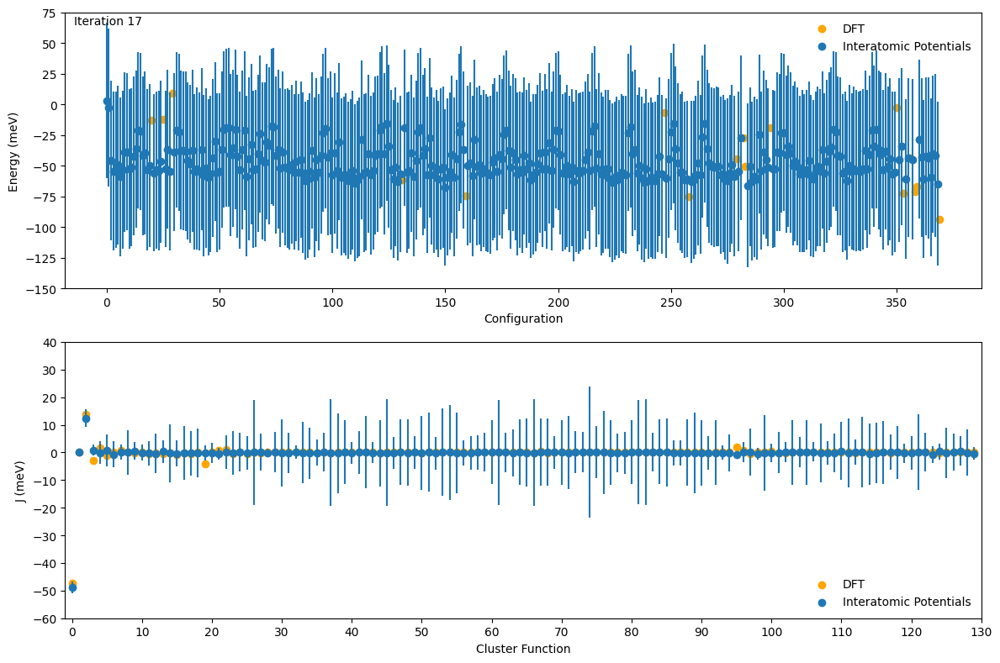

index of sampled structures: [369, 25, 358, 279, 356, 350, 159, 131, 294, 283, 353, 282, 20, 359, 247, 258, 29, 275]

RMSE = 7.533755146123332
R2 = 0.8613496183725091


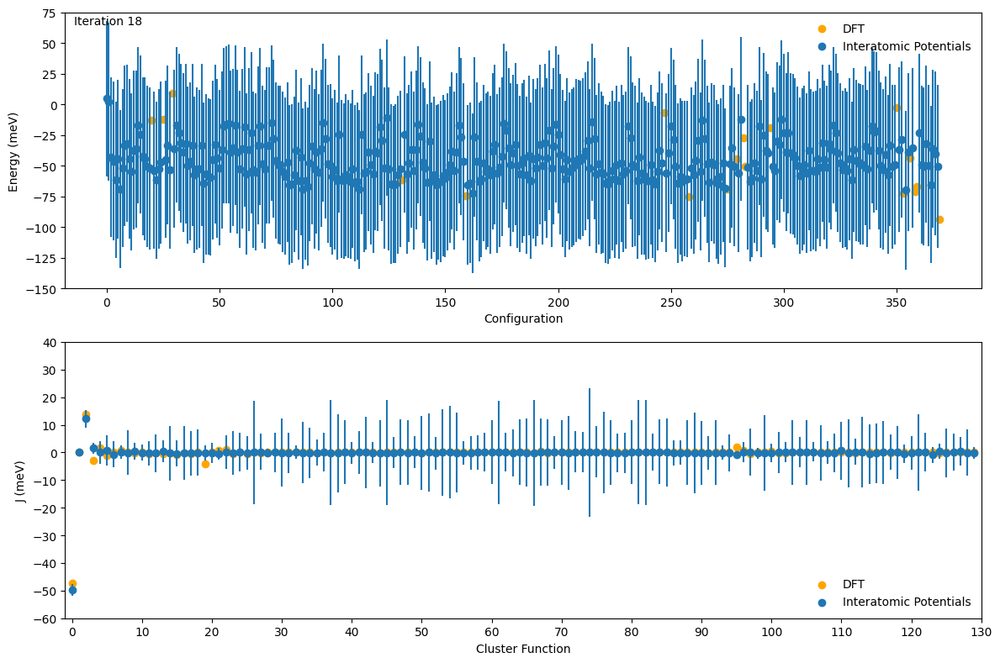

index of sampled structures: [369, 25, 358, 279, 356, 350, 159, 131, 294, 283, 353, 282, 20, 359, 247, 258, 29, 275, 343]

RMSE = 7.431017244108687
R2 = 0.8643869426813683


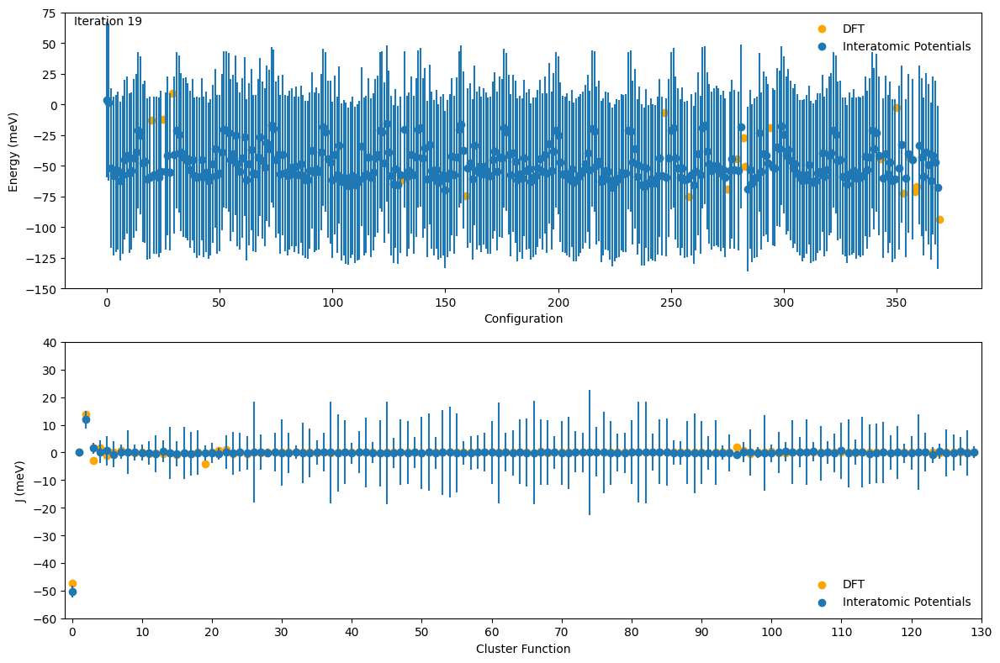

index of sampled structures: [369, 25, 358, 279, 356, 350, 159, 131, 294, 283, 353, 282, 20, 359, 247, 258, 29, 275, 343, 351]

RMSE = 7.354036283089041
R2 = 0.8670743558965214


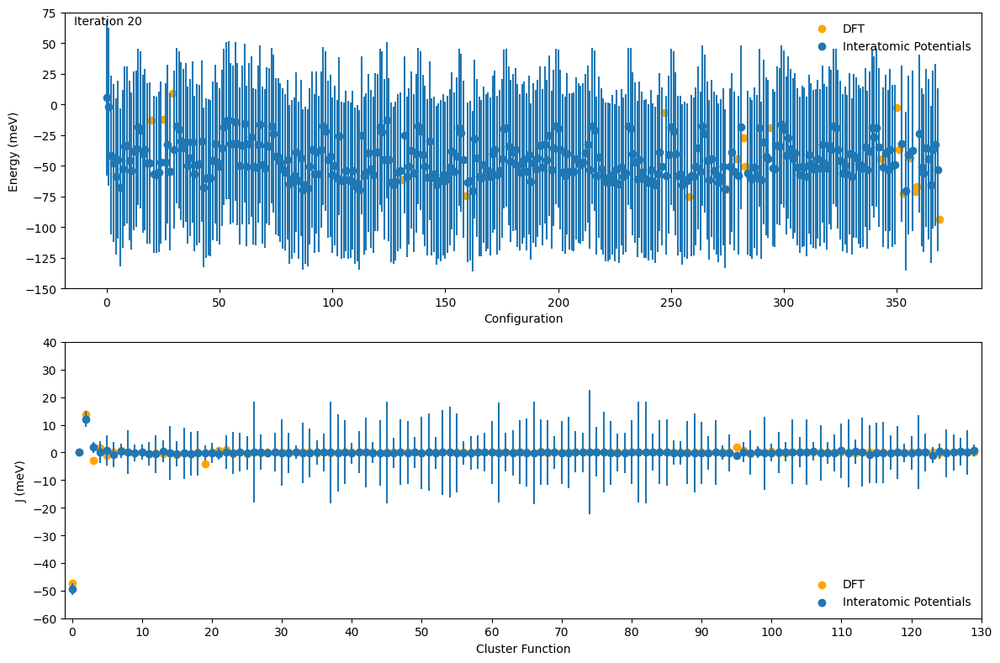

index of sampled structures: [369, 25, 358, 279, 356, 350, 159, 131, 294, 283, 353, 282, 20, 359, 247, 258, 29, 275, 343, 351, 291]

RMSE = 6.968427294897302
R2 = 0.8851709799354127


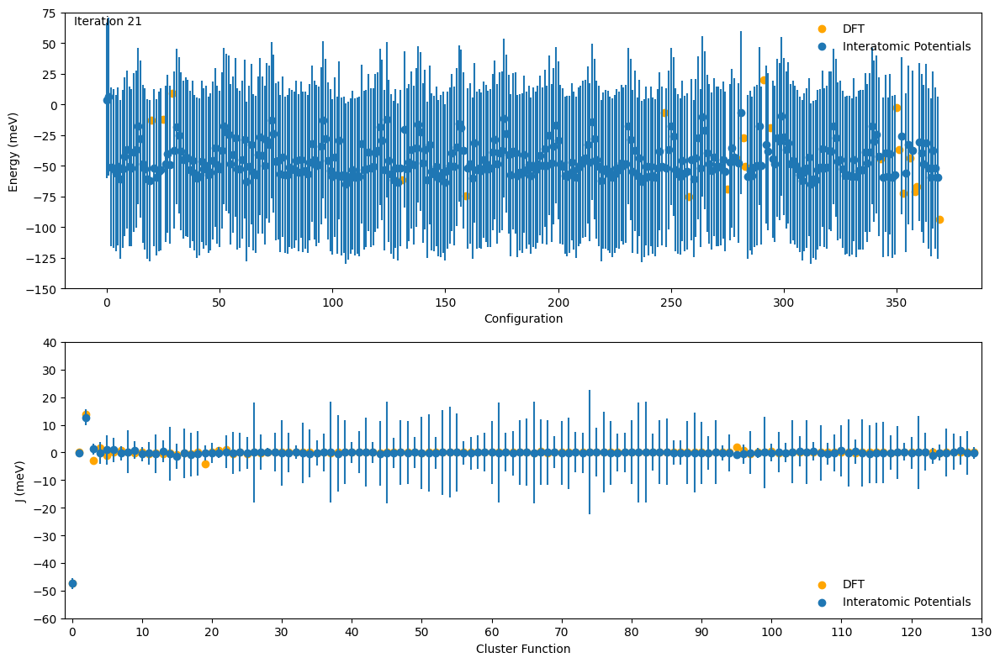

index of sampled structures: [369, 25, 358, 279, 356, 350, 159, 131, 294, 283, 353, 282, 20, 359, 247, 258, 29, 275, 343, 351, 291, 281]

RMSE = 6.980411872433349
R2 = 0.8843664231312273


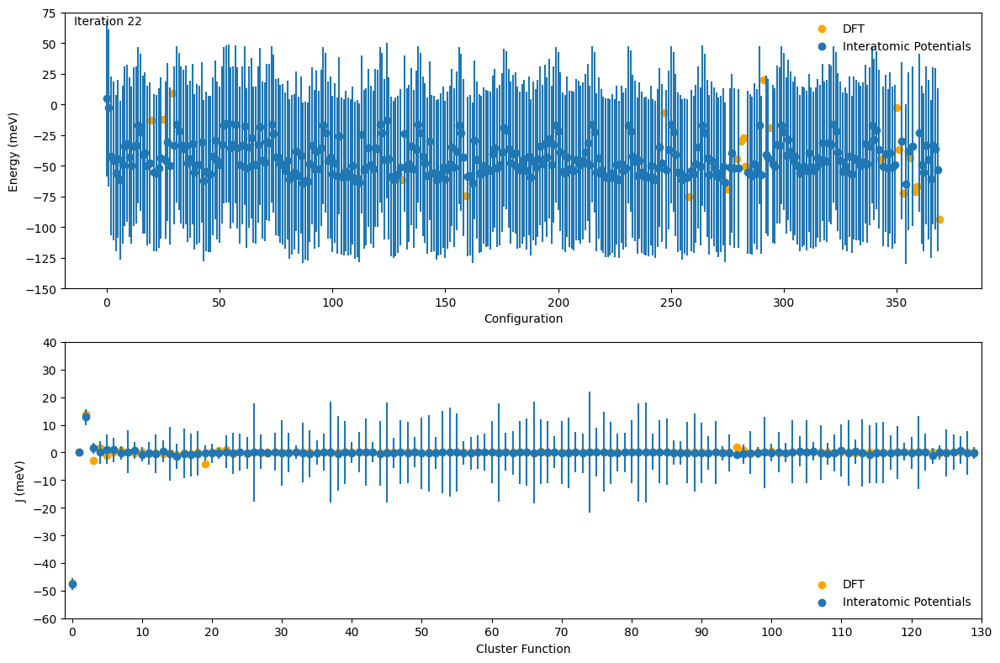

index of sampled structures: [369, 25, 358, 279, 356, 350, 159, 131, 294, 283, 353, 282, 20, 359, 247, 258, 29, 275, 343, 351, 291, 281, 233]

RMSE = 6.944967878668043
R2 = 0.884767492615711


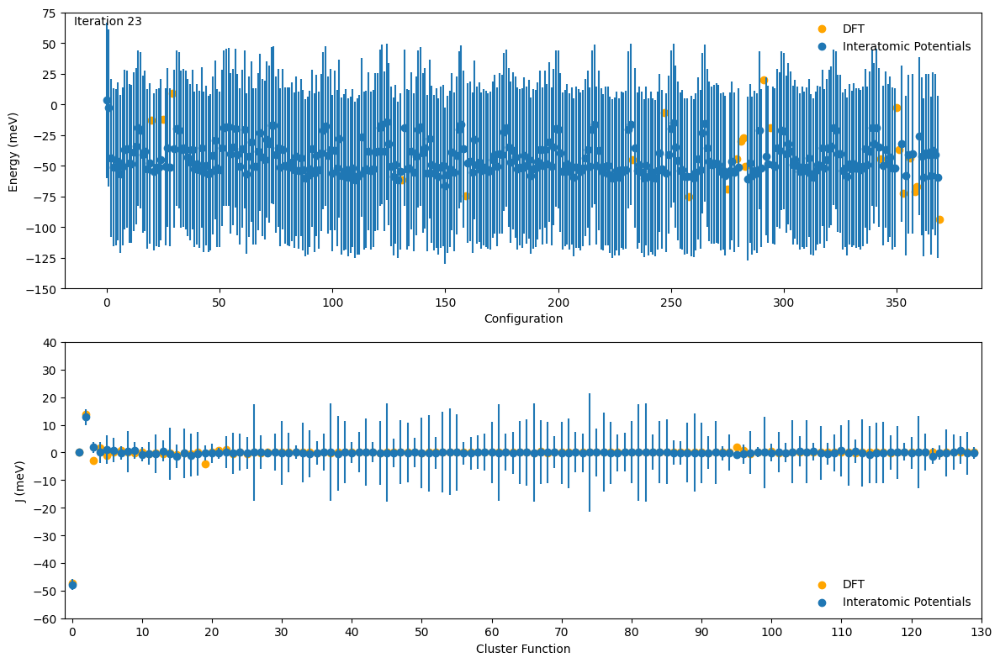

index of sampled structures: [369, 25, 358, 279, 356, 350, 159, 131, 294, 283, 353, 282, 20, 359, 247, 258, 29, 275, 343, 351, 291, 281, 233, 284]

RMSE = 6.931944291130781
R2 = 0.8855893778403445


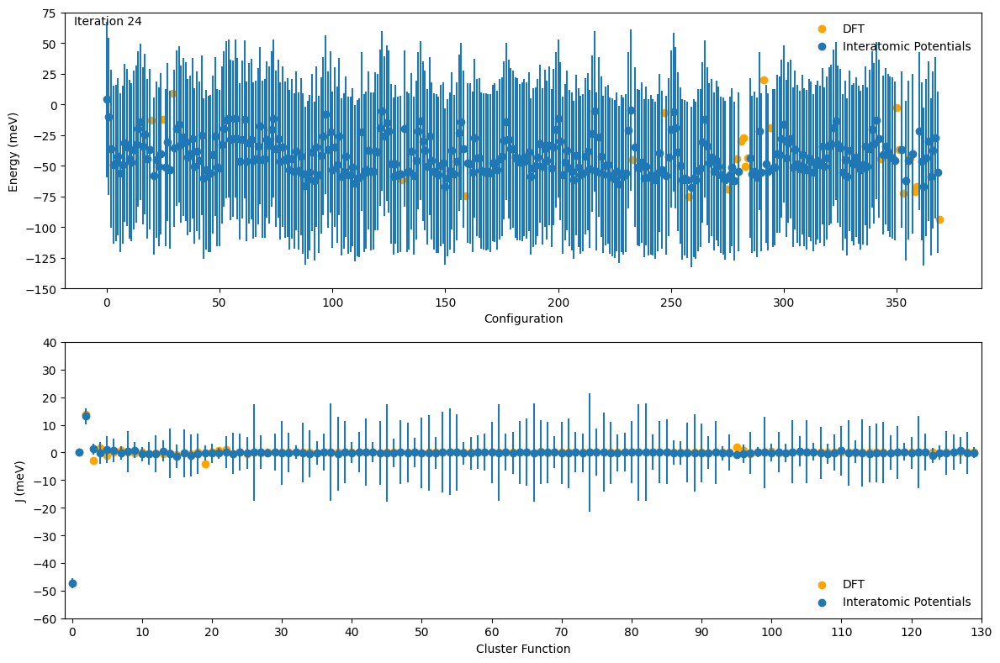

index of sampled structures: [369, 25, 358, 279, 356, 350, 159, 131, 294, 283, 353, 282, 20, 359, 247, 258, 29, 275, 343, 351, 291, 281, 233, 284, 319]

RMSE = 6.63543064605602
R2 = 0.8926007790149576


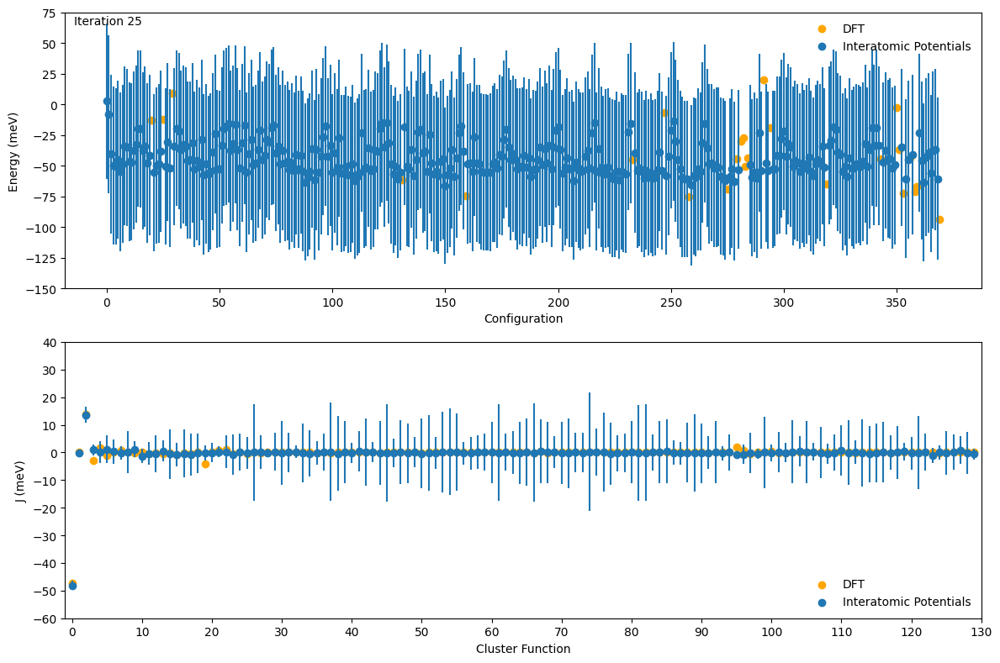

index of sampled structures: [369, 25, 358, 279, 356, 350, 159, 131, 294, 283, 353, 282, 20, 359, 247, 258, 29, 275, 343, 351, 291, 281, 233, 284, 319, 262]

RMSE = 6.651045059461662
R2 = 0.8925272324440147


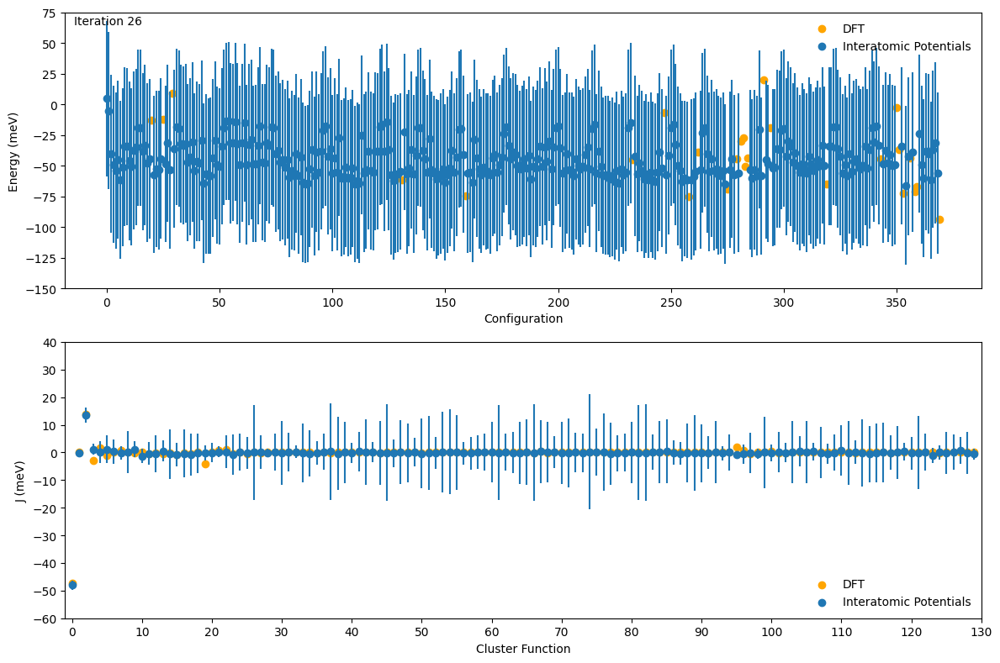

index of sampled structures: [369, 25, 358, 279, 356, 350, 159, 131, 294, 283, 353, 282, 20, 359, 247, 258, 29, 275, 343, 351, 291, 281, 233, 284, 319, 262, 331]

RMSE = 6.69303874474743
R2 = 0.8931766200151416


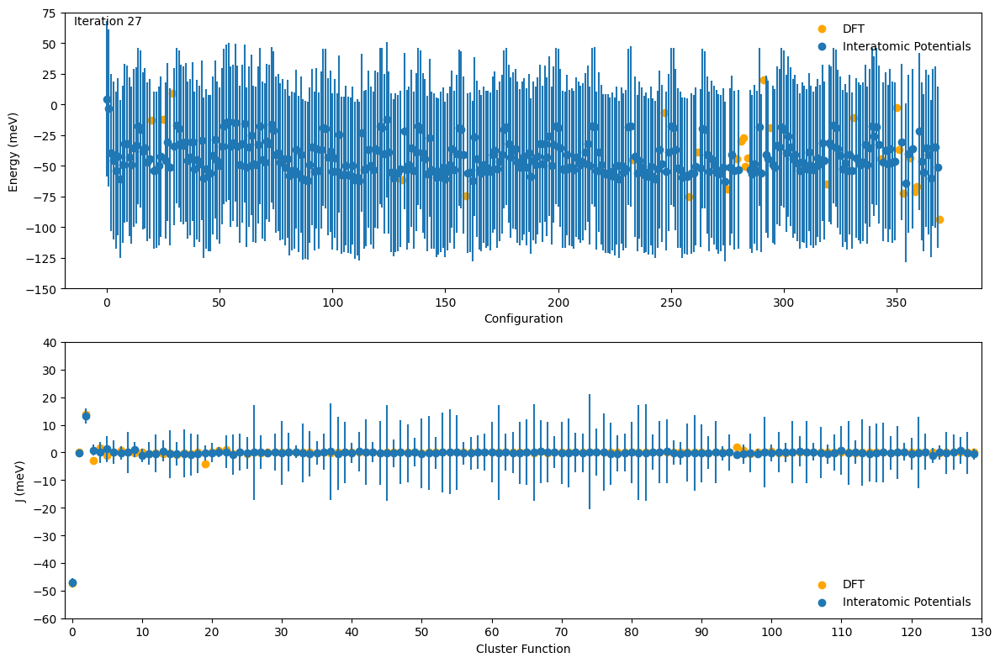

index of sampled structures: [369, 25, 358, 279, 356, 350, 159, 131, 294, 283, 353, 282, 20, 359, 247, 258, 29, 275, 343, 351, 291, 281, 233, 284, 319, 262, 331, 125]

RMSE = 6.628985480594331
R2 = 0.8940862067891787


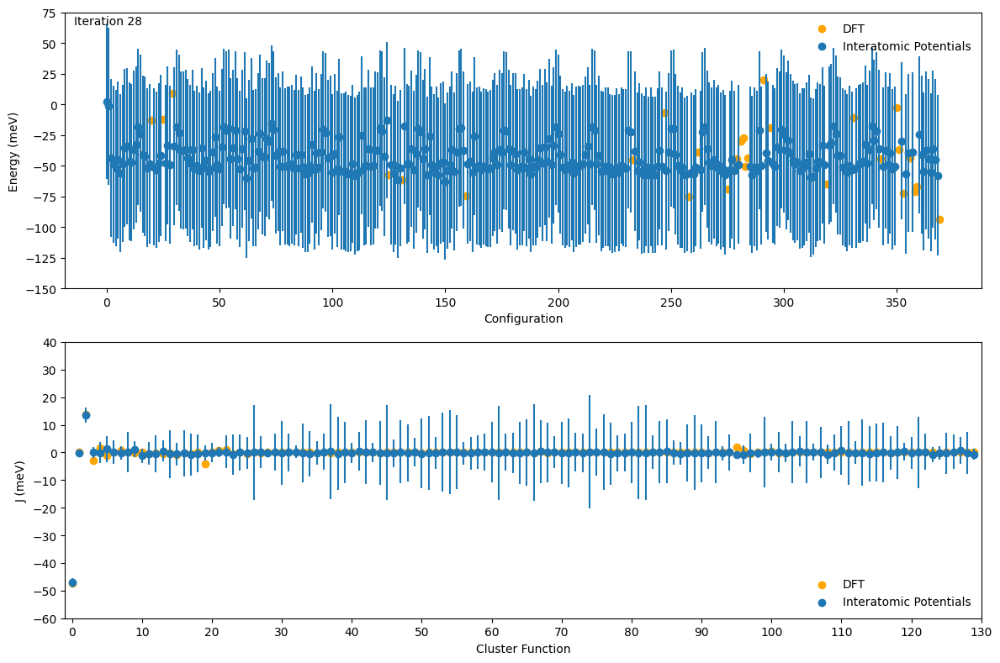

index of sampled structures: [369, 25, 358, 279, 356, 350, 159, 131, 294, 283, 353, 282, 20, 359, 247, 258, 29, 275, 343, 351, 291, 281, 233, 284, 319, 262, 331, 125, 368]

RMSE = 6.684128935546616
R2 = 0.8900070944900933


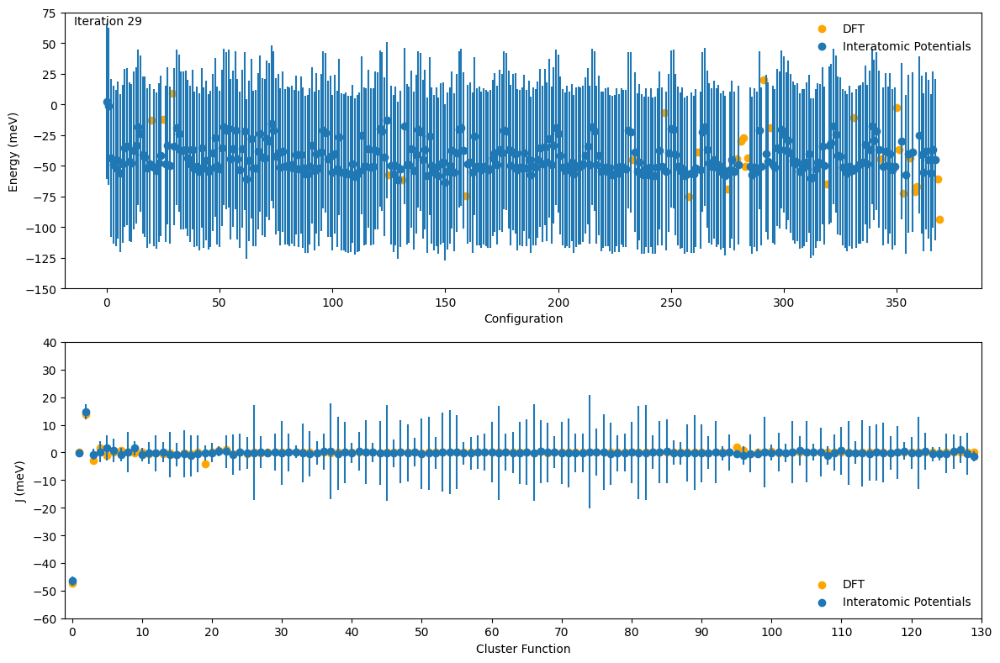

index of sampled structures: [369, 25, 358, 279, 356, 350, 159, 131, 294, 283, 353, 282, 20, 359, 247, 258, 29, 275, 343, 351, 291, 281, 233, 284, 319, 262, 331, 125, 368, 58]

RMSE = 6.4271335076029095
R2 = 0.900100512065442


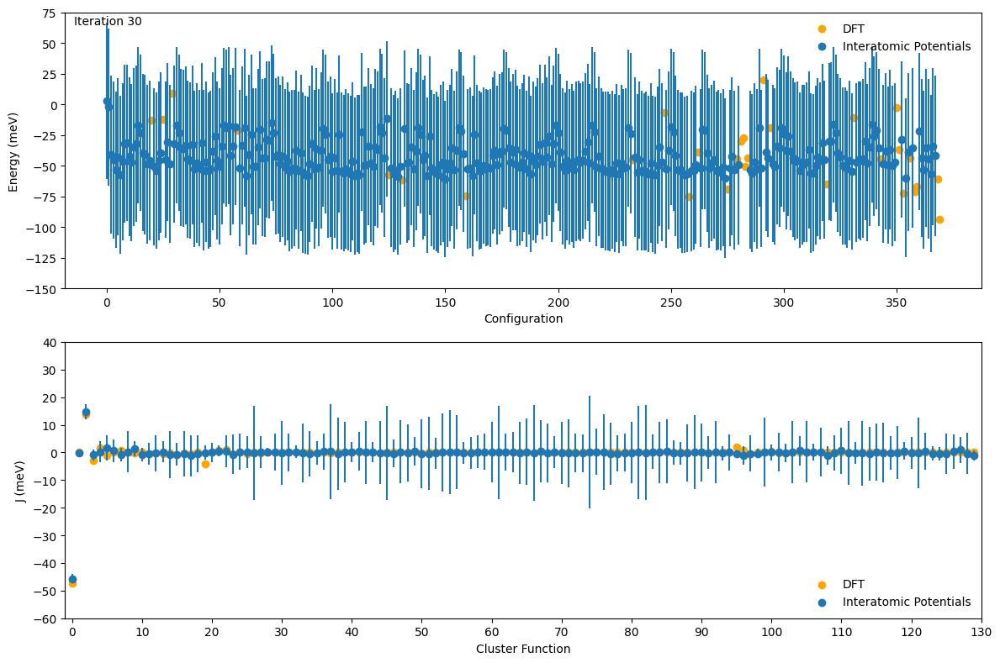

index of sampled structures: [369, 25, 358, 279, 356, 350, 159, 131, 294, 283, 353, 282, 20, 359, 247, 258, 29, 275, 343, 351, 291, 281, 233, 284, 319, 262, 331, 125, 368, 58, 252]

RMSE = 6.3844004161757555
R2 = 0.901326404695861


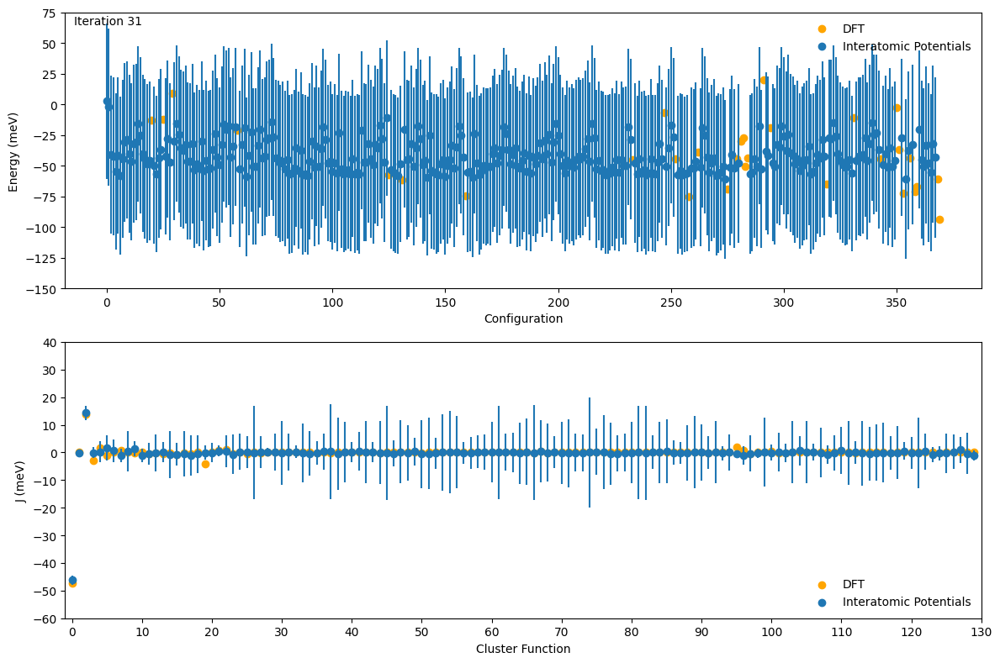

index of sampled structures: [369, 25, 358, 279, 356, 350, 159, 131, 294, 283, 353, 282, 20, 359, 247, 258, 29, 275, 343, 351, 291, 281, 233, 284, 319, 262, 331, 125, 368, 58, 252, 182]

RMSE = 6.348334979908833
R2 = 0.9026727223290512


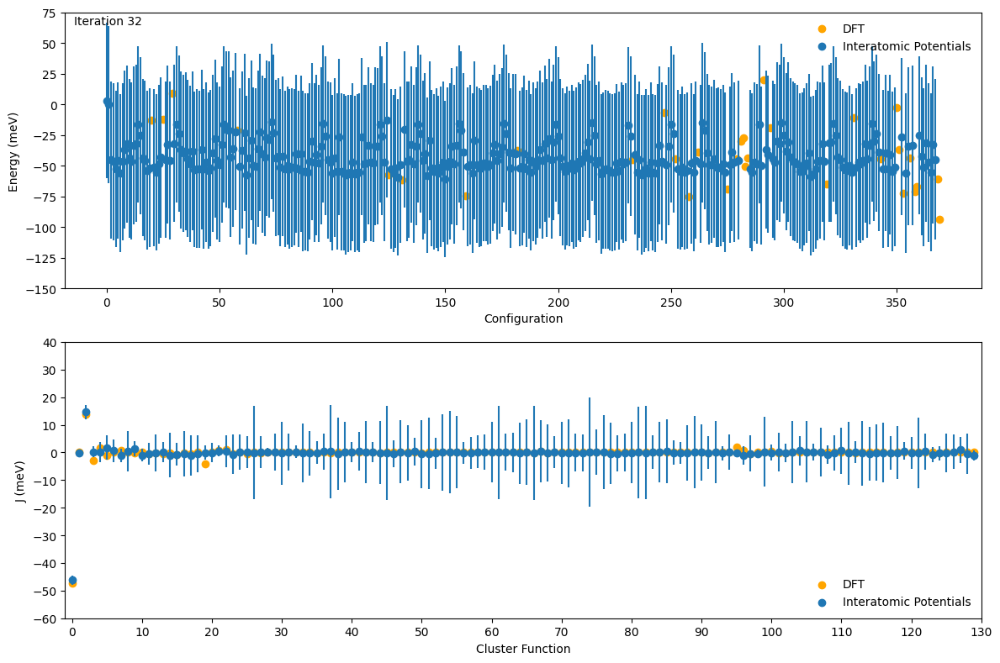

index of sampled structures: [369, 25, 358, 279, 356, 350, 159, 131, 294, 283, 353, 282, 20, 359, 247, 258, 29, 275, 343, 351, 291, 281, 233, 284, 319, 262, 331, 125, 368, 58, 252, 182, 148]

RMSE = 6.389439249290632
R2 = 0.9022944555426429


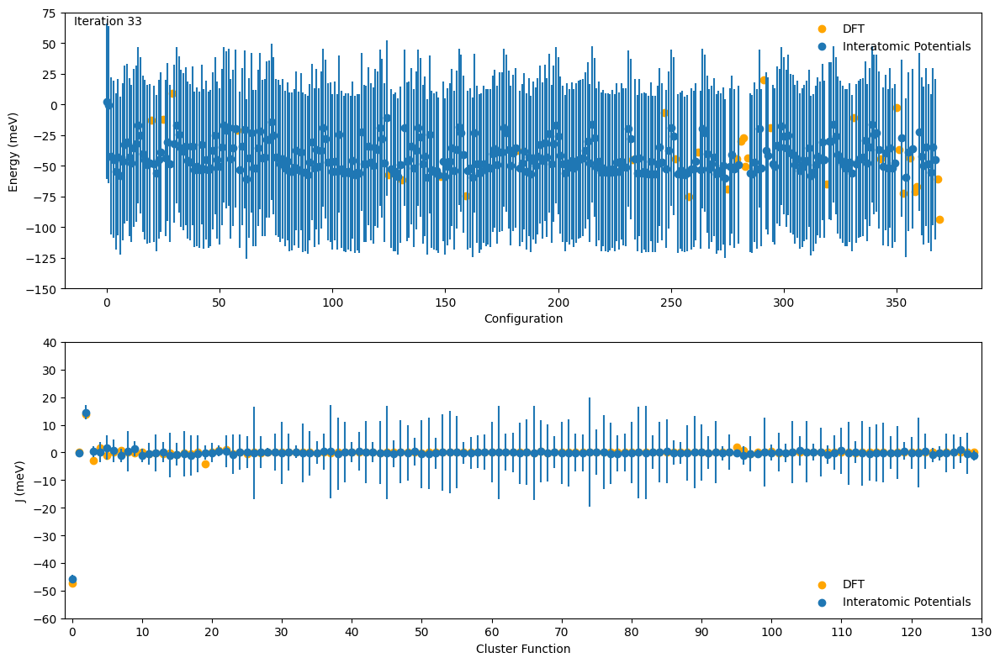

index of sampled structures: [369, 25, 358, 279, 356, 350, 159, 131, 294, 283, 353, 282, 20, 359, 247, 258, 29, 275, 343, 351, 291, 281, 233, 284, 319, 262, 331, 125, 368, 58, 252, 182, 148, 259]

RMSE = 6.217925091745057
R2 = 0.9058272615778504


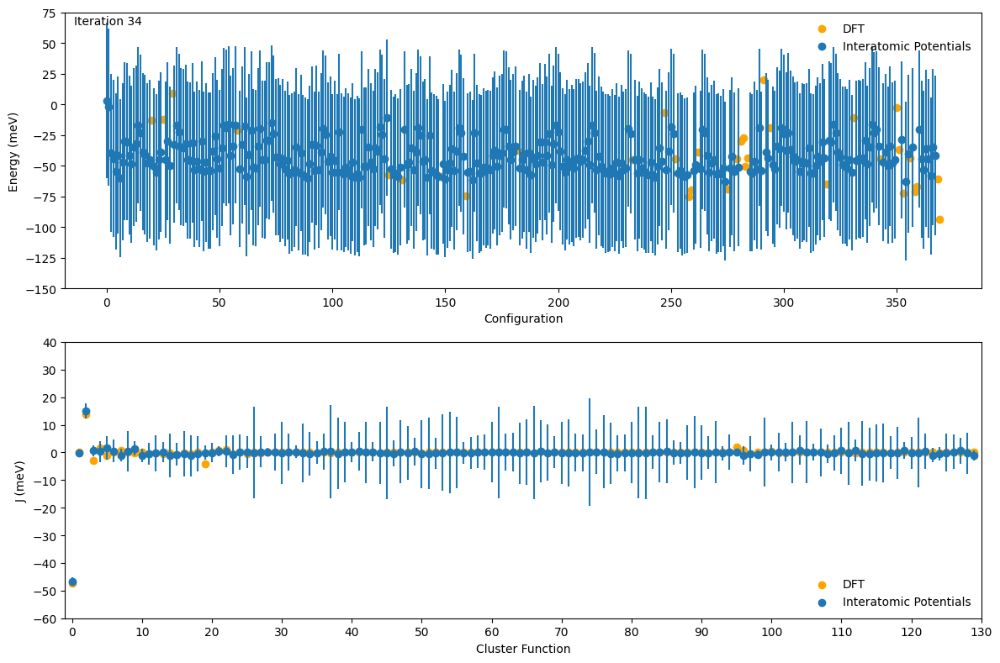

index of sampled structures: [369, 25, 358, 279, 356, 350, 159, 131, 294, 283, 353, 282, 20, 359, 247, 258, 29, 275, 343, 351, 291, 281, 233, 284, 319, 262, 331, 125, 368, 58, 252, 182, 148, 259, 367]

RMSE = 6.113408464687818
R2 = 0.9106626126679177


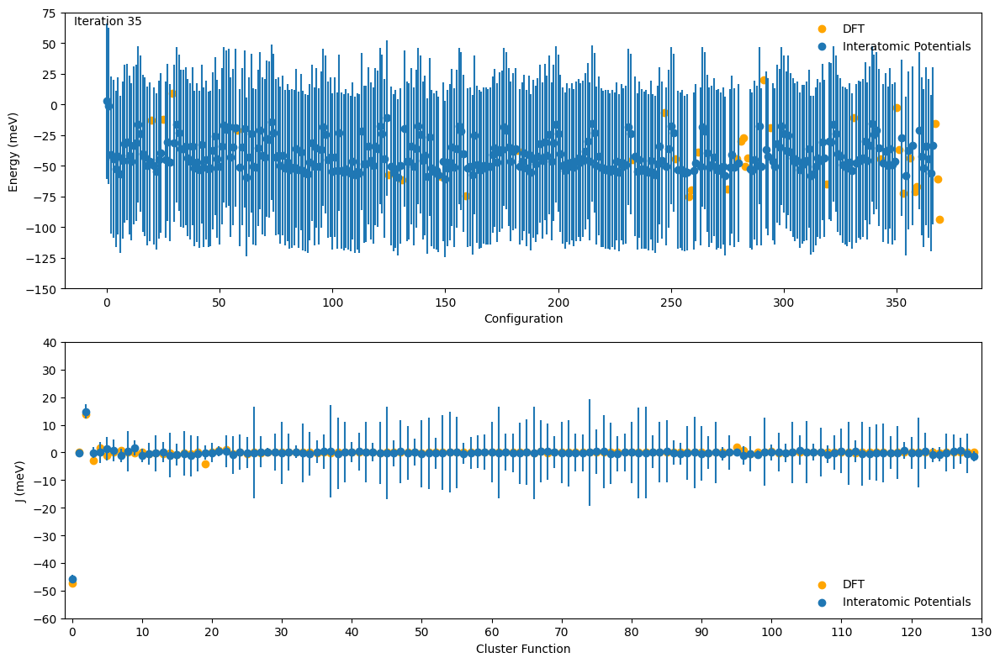

index of sampled structures: [369, 25, 358, 279, 356, 350, 159, 131, 294, 283, 353, 282, 20, 359, 247, 258, 29, 275, 343, 351, 291, 281, 233, 284, 319, 262, 331, 125, 368, 58, 252, 182, 148, 259, 367, 255]

RMSE = 6.058642697500394
R2 = 0.9108593663462005


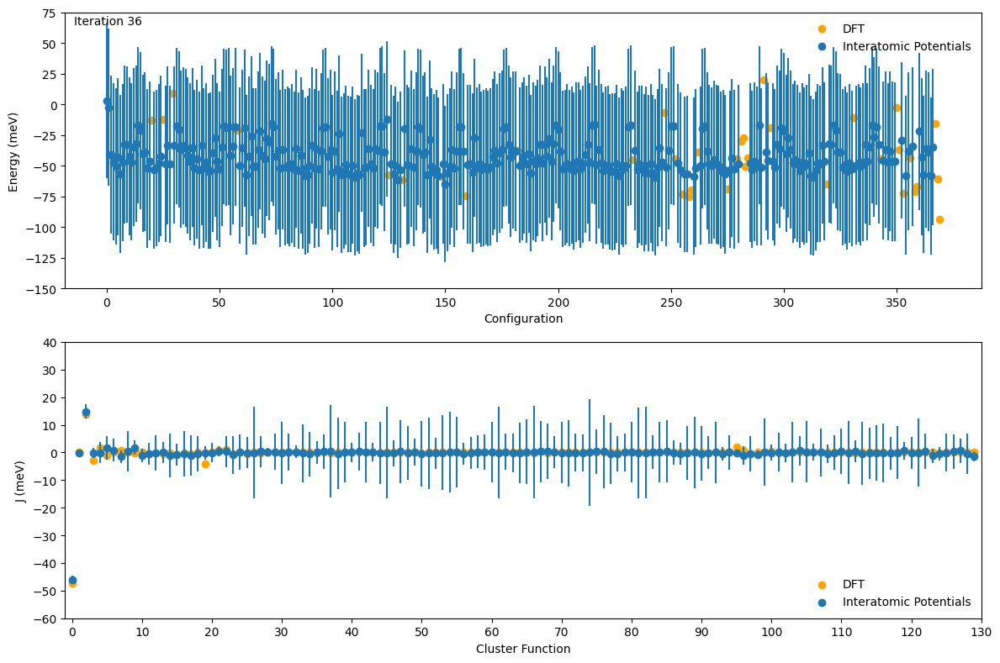

index of sampled structures: [369, 25, 358, 279, 356, 350, 159, 131, 294, 283, 353, 282, 20, 359, 247, 258, 29, 275, 343, 351, 291, 281, 233, 284, 319, 262, 331, 125, 368, 58, 252, 182, 148, 259, 367, 255, 181]

RMSE = 6.09810037375948
R2 = 0.910560215564683


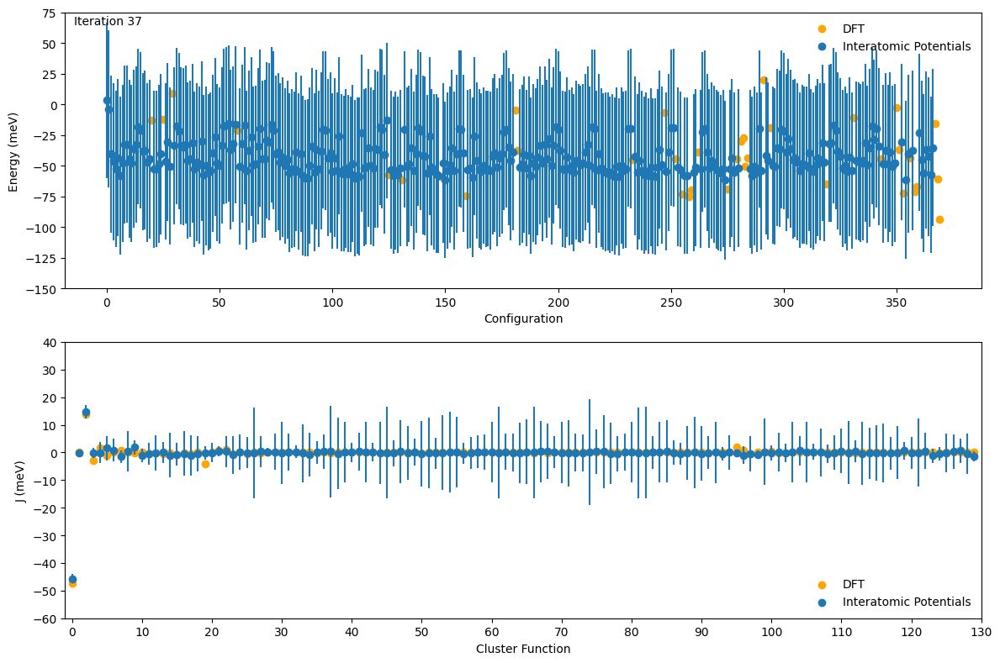

index of sampled structures: [369, 25, 358, 279, 356, 350, 159, 131, 294, 283, 353, 282, 20, 359, 247, 258, 29, 275, 343, 351, 291, 281, 233, 284, 319, 262, 331, 125, 368, 58, 252, 182, 148, 259, 367, 255, 181, 24]

RMSE = 6.044245766833404
R2 = 0.9112272422786268


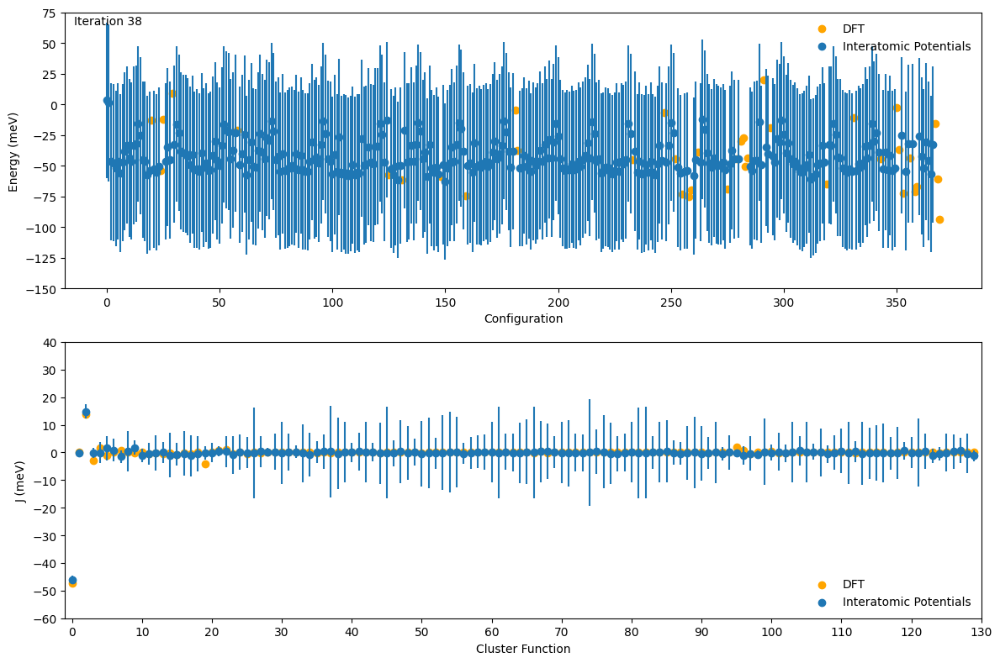

index of sampled structures: [369, 25, 358, 279, 356, 350, 159, 131, 294, 283, 353, 282, 20, 359, 247, 258, 29, 275, 343, 351, 291, 281, 233, 284, 319, 262, 331, 125, 368, 58, 252, 182, 148, 259, 367, 255, 181, 24, 99]

RMSE = 5.943936025175507
R2 = 0.9134898261188755


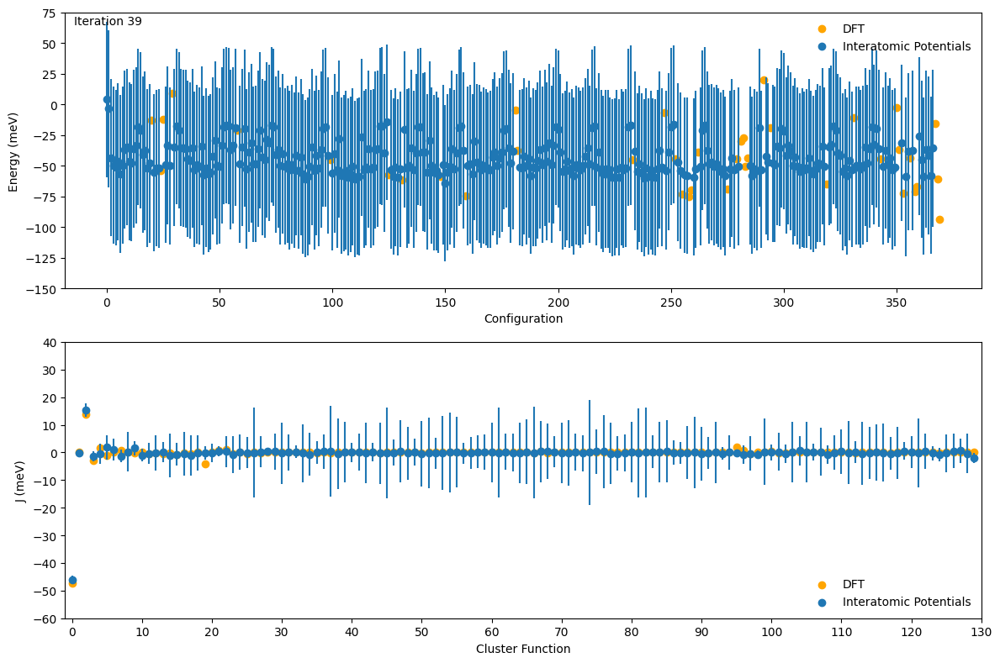

index of sampled structures: [369, 25, 358, 279, 356, 350, 159, 131, 294, 283, 353, 282, 20, 359, 247, 258, 29, 275, 343, 351, 291, 281, 233, 284, 319, 262, 331, 125, 368, 58, 252, 182, 148, 259, 367, 255, 181, 24, 99, 348]

RMSE = 5.9221447244123
R2 = 0.9141727475773764


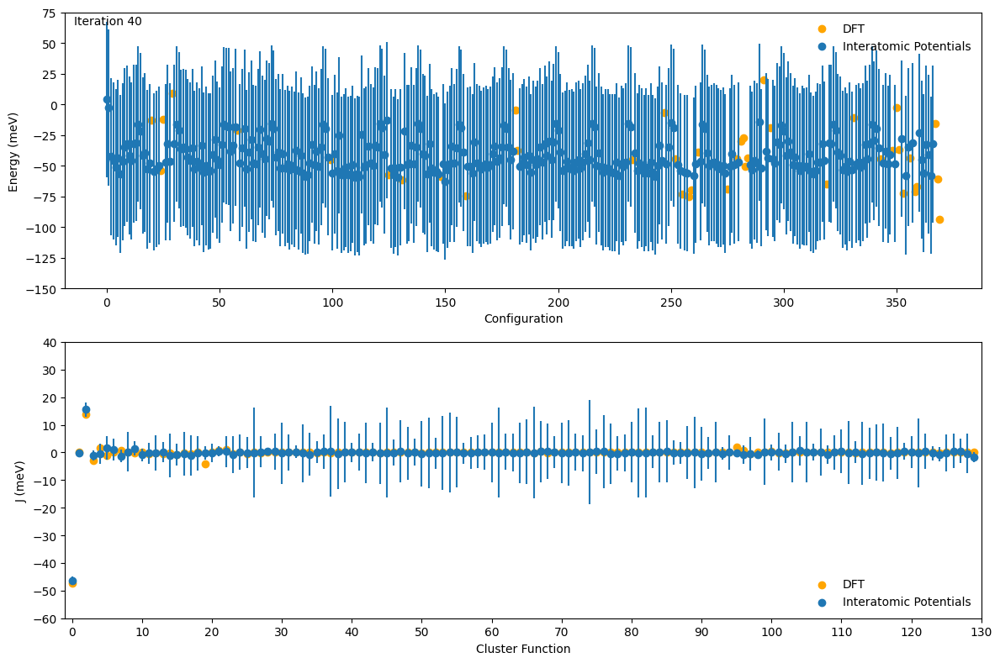

index of sampled structures: [369, 25, 358, 279, 356, 350, 159, 131, 294, 283, 353, 282, 20, 359, 247, 258, 29, 275, 343, 351, 291, 281, 233, 284, 319, 262, 331, 125, 368, 58, 252, 182, 148, 259, 367, 255, 181, 24, 99, 348, 63]

RMSE = 5.926010473115641
R2 = 0.9145319679240876


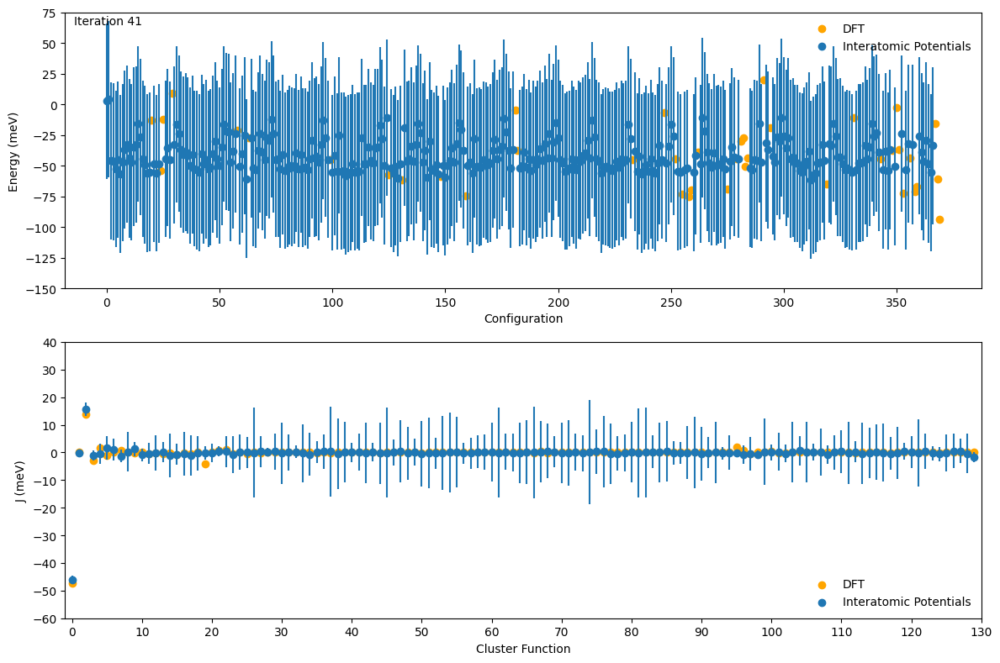

index of sampled structures: [369, 25, 358, 279, 356, 350, 159, 131, 294, 283, 353, 282, 20, 359, 247, 258, 29, 275, 343, 351, 291, 281, 233, 284, 319, 262, 331, 125, 368, 58, 252, 182, 148, 259, 367, 255, 181, 24, 99, 348, 63, 232]

RMSE = 5.932508494868513
R2 = 0.9141962047942105


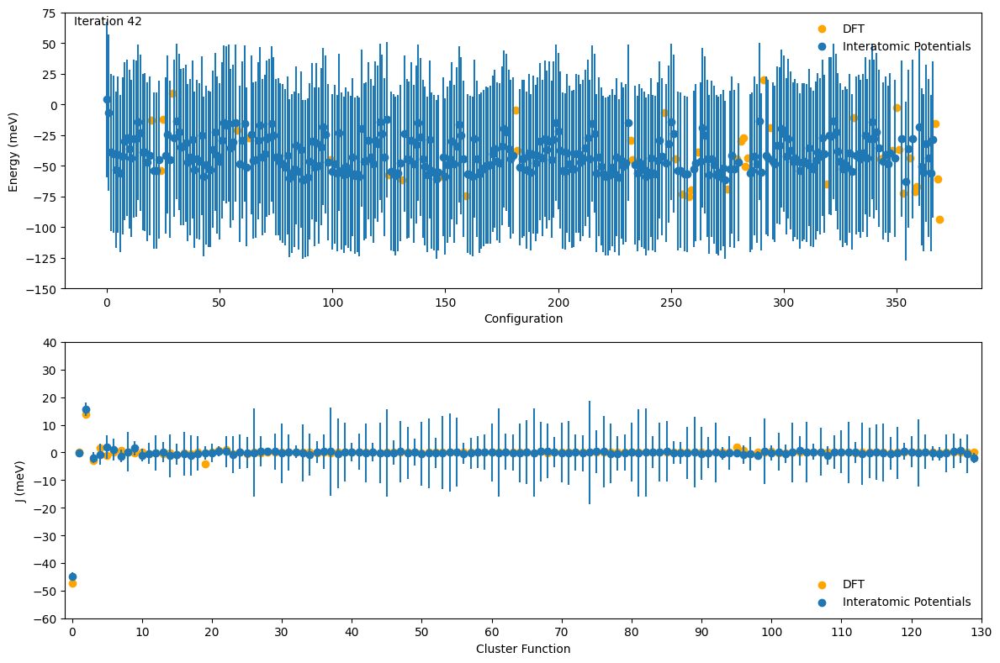

index of sampled structures: [369, 25, 358, 279, 356, 350, 159, 131, 294, 283, 353, 282, 20, 359, 247, 258, 29, 275, 343, 351, 291, 281, 233, 284, 319, 262, 331, 125, 368, 58, 252, 182, 148, 259, 367, 255, 181, 24, 99, 348, 63, 232, 149]

RMSE = 5.9178522357522745
R2 = 0.9143650059924574


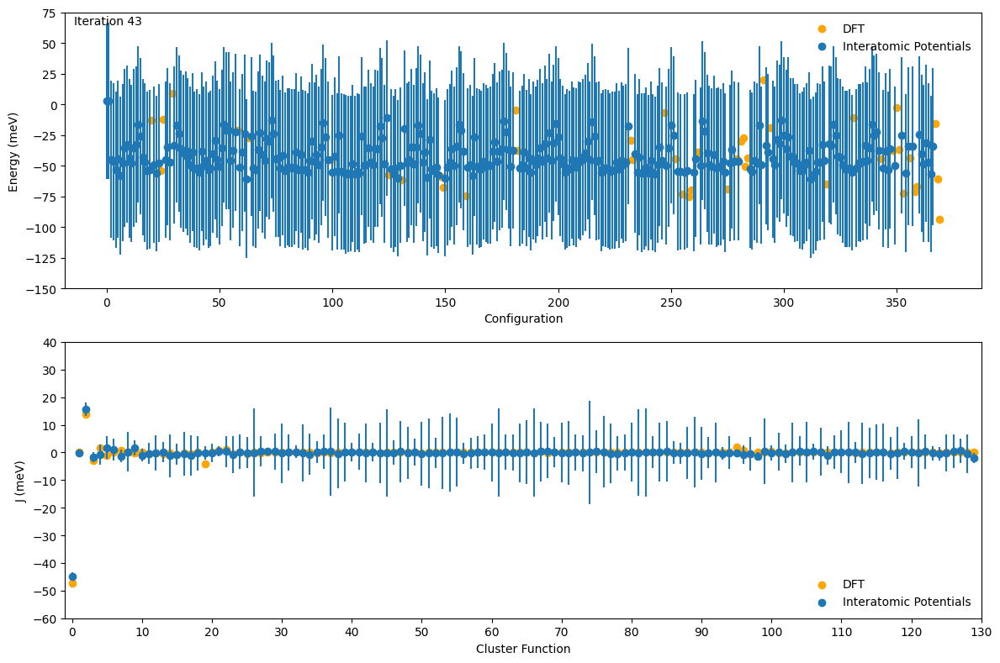

index of sampled structures: [369, 25, 358, 279, 356, 350, 159, 131, 294, 283, 353, 282, 20, 359, 247, 258, 29, 275, 343, 351, 291, 281, 233, 284, 319, 262, 331, 125, 368, 58, 252, 182, 148, 259, 367, 255, 181, 24, 99, 348, 63, 232, 149, 141]

RMSE = 5.891695912425899
R2 = 0.9147870932965355


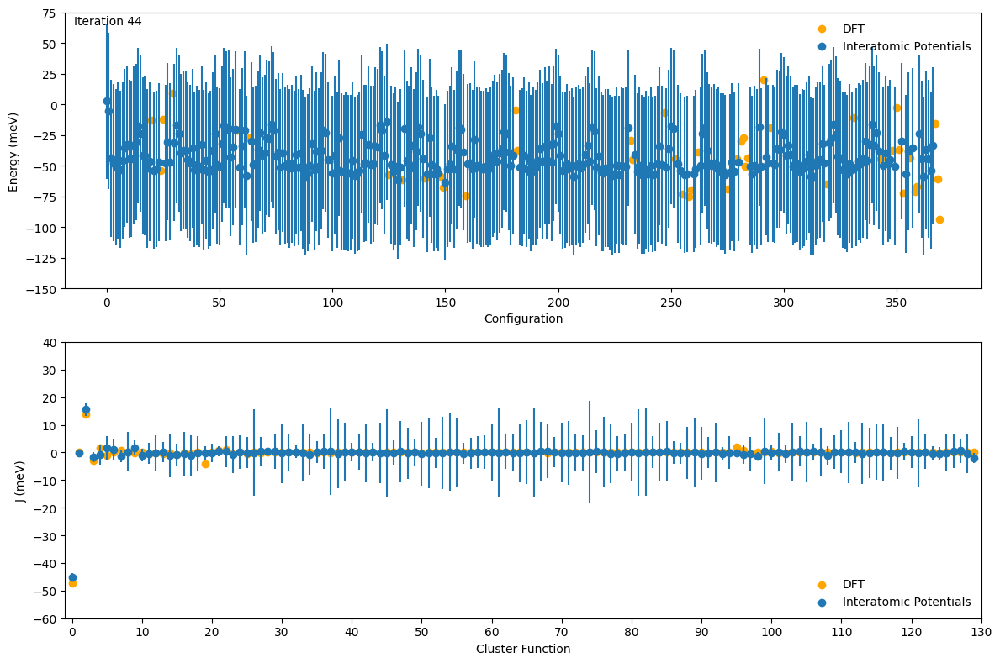

index of sampled structures: [369, 25, 358, 279, 356, 350, 159, 131, 294, 283, 353, 282, 20, 359, 247, 258, 29, 275, 343, 351, 291, 281, 233, 284, 319, 262, 331, 125, 368, 58, 252, 182, 148, 259, 367, 255, 181, 24, 99, 348, 63, 232, 149, 141, 347]

RMSE = 5.888310678734186
R2 = 0.9153162033868723


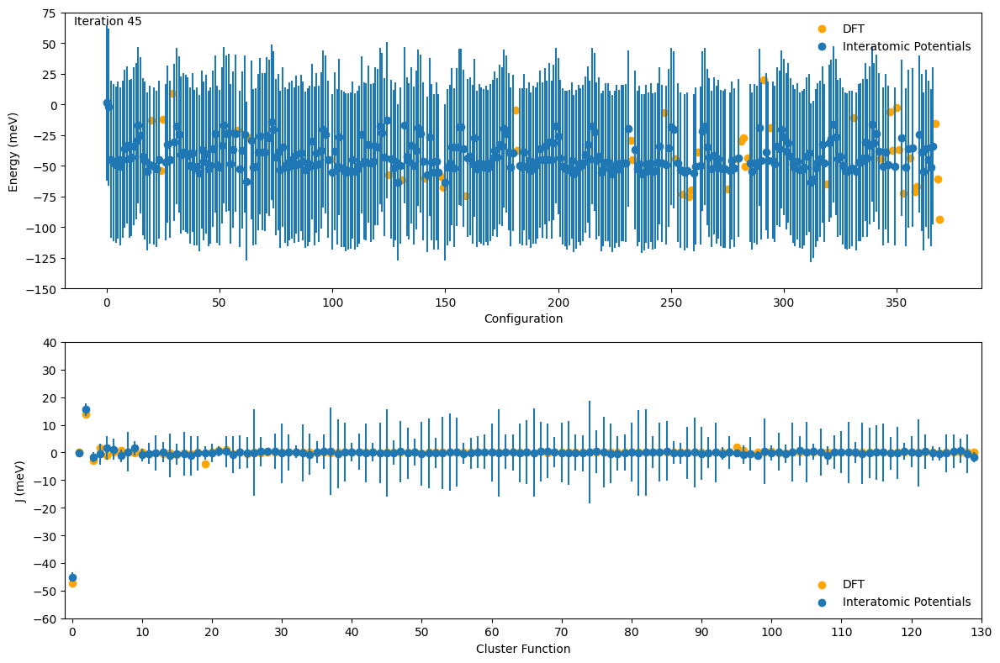

index of sampled structures: [369, 25, 358, 279, 356, 350, 159, 131, 294, 283, 353, 282, 20, 359, 247, 258, 29, 275, 343, 351, 291, 281, 233, 284, 319, 262, 331, 125, 368, 58, 252, 182, 148, 259, 367, 255, 181, 24, 99, 348, 63, 232, 149, 141, 347, 288]

RMSE = 5.677066499353846
R2 = 0.9202603474359081


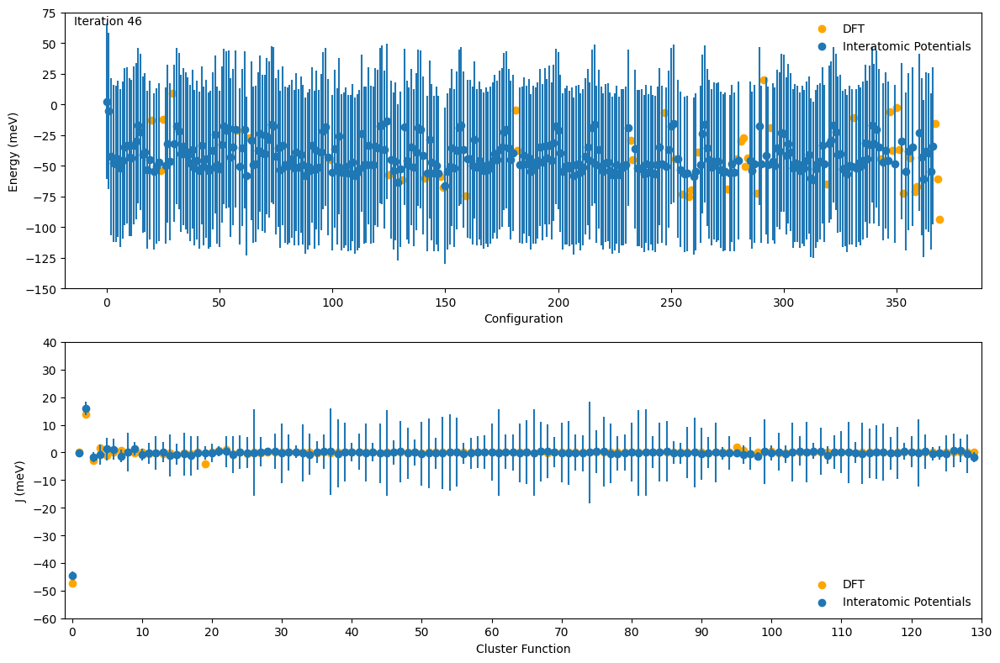

index of sampled structures: [369, 25, 358, 279, 356, 350, 159, 131, 294, 283, 353, 282, 20, 359, 247, 258, 29, 275, 343, 351, 291, 281, 233, 284, 319, 262, 331, 125, 368, 58, 252, 182, 148, 259, 367, 255, 181, 24, 99, 348, 63, 232, 149, 141, 347, 288, 93]

RMSE = 5.639389250010849
R2 = 0.9210772477293689


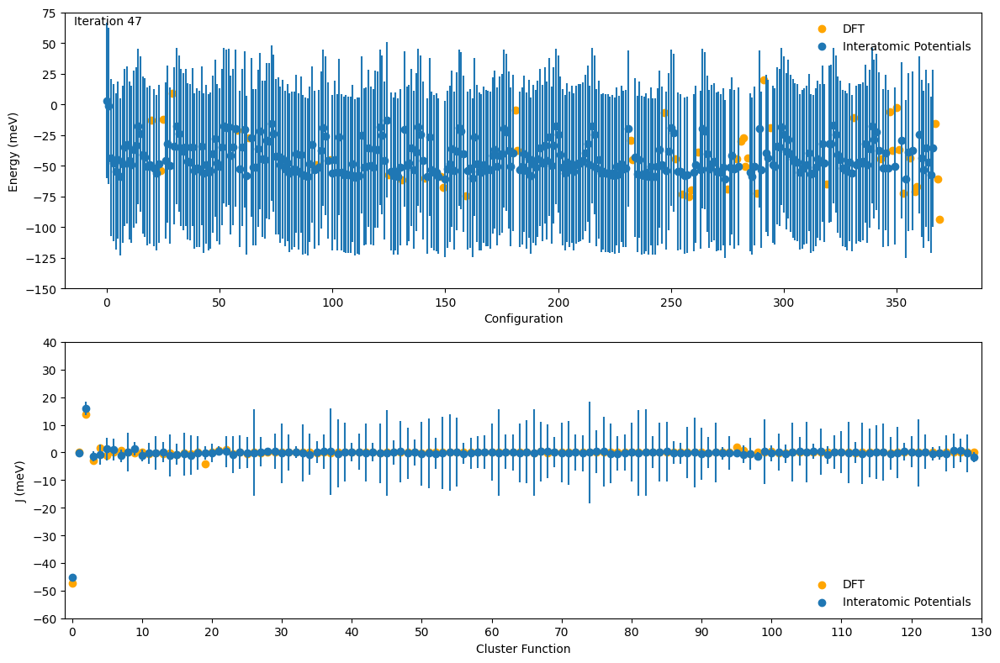

index of sampled structures: [369, 25, 358, 279, 356, 350, 159, 131, 294, 283, 353, 282, 20, 359, 247, 258, 29, 275, 343, 351, 291, 281, 233, 284, 319, 262, 331, 125, 368, 58, 252, 182, 148, 259, 367, 255, 181, 24, 99, 348, 63, 232, 149, 141, 347, 288, 93, 87]

RMSE = 5.641137248743592
R2 = 0.9210294045709004


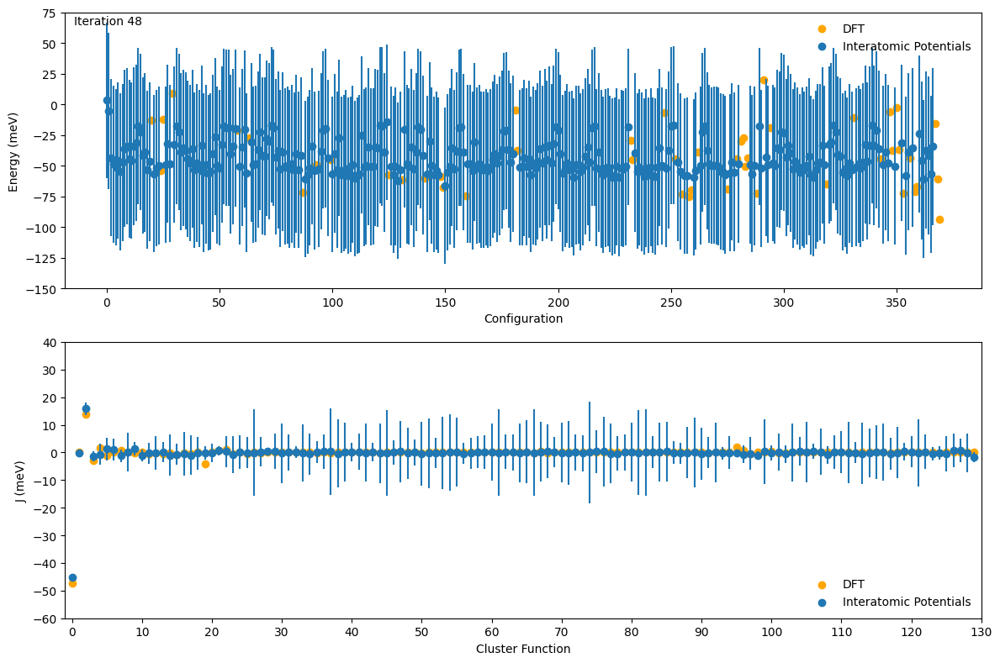

index of sampled structures: [369, 25, 358, 279, 356, 350, 159, 131, 294, 283, 353, 282, 20, 359, 247, 258, 29, 275, 343, 351, 291, 281, 233, 284, 319, 262, 331, 125, 368, 58, 252, 182, 148, 259, 367, 255, 181, 24, 99, 348, 63, 232, 149, 141, 347, 288, 93, 87, 264]

RMSE = 5.615791062369617
R2 = 0.9217278691934769


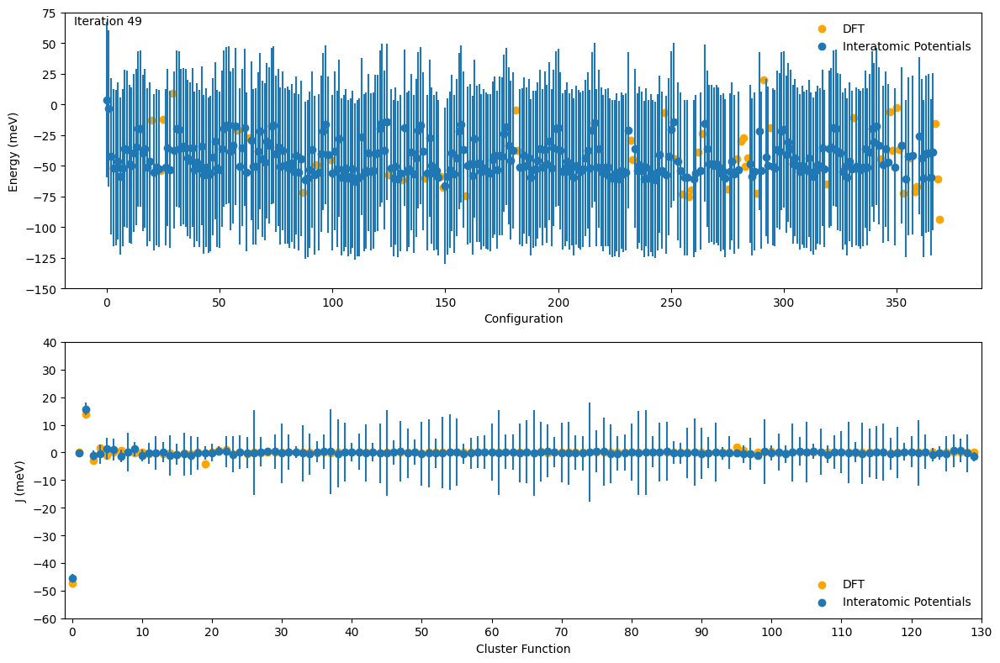

index of sampled structures: [369, 25, 358, 279, 356, 350, 159, 131, 294, 283, 353, 282, 20, 359, 247, 258, 29, 275, 343, 351, 291, 281, 233, 284, 319, 262, 331, 125, 368, 58, 252, 182, 148, 259, 367, 255, 181, 24, 99, 348, 63, 232, 149, 141, 347, 288, 93, 87, 264, 55]

RMSE = 5.601754494917028
R2 = 0.9223382145839829


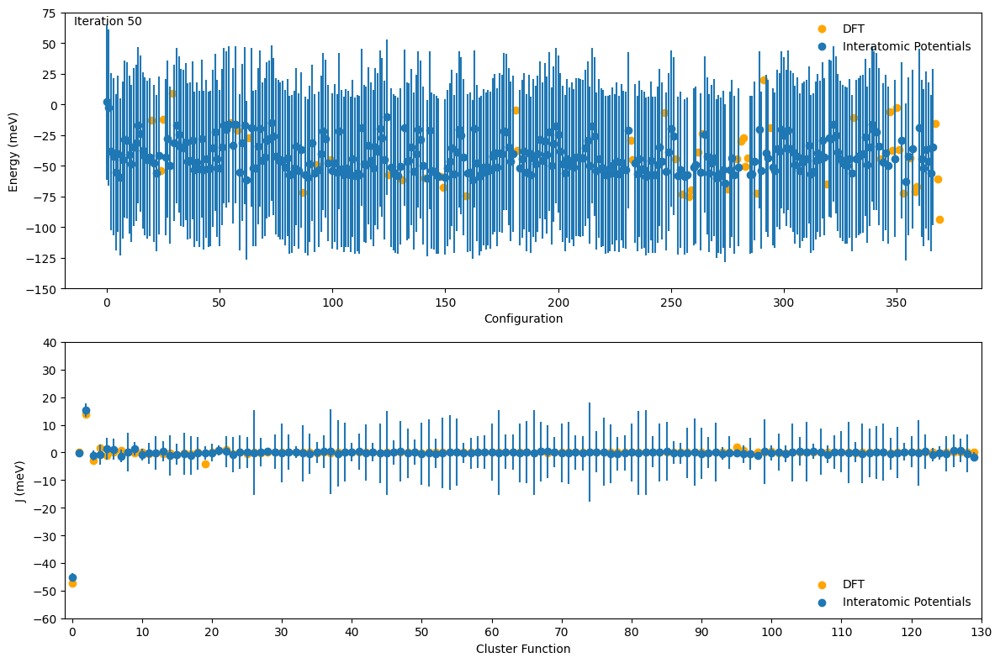

index of sampled structures: [369, 25, 358, 279, 356, 350, 159, 131, 294, 283, 353, 282, 20, 359, 247, 258, 29, 275, 343, 351, 291, 281, 233, 284, 319, 262, 331, 125, 368, 58, 252, 182, 148, 259, 367, 255, 181, 24, 99, 348, 63, 232, 149, 141, 347, 288, 93, 87, 264, 55, 340]

RMSE = 5.671236116417791
R2 = 0.9206458970316111


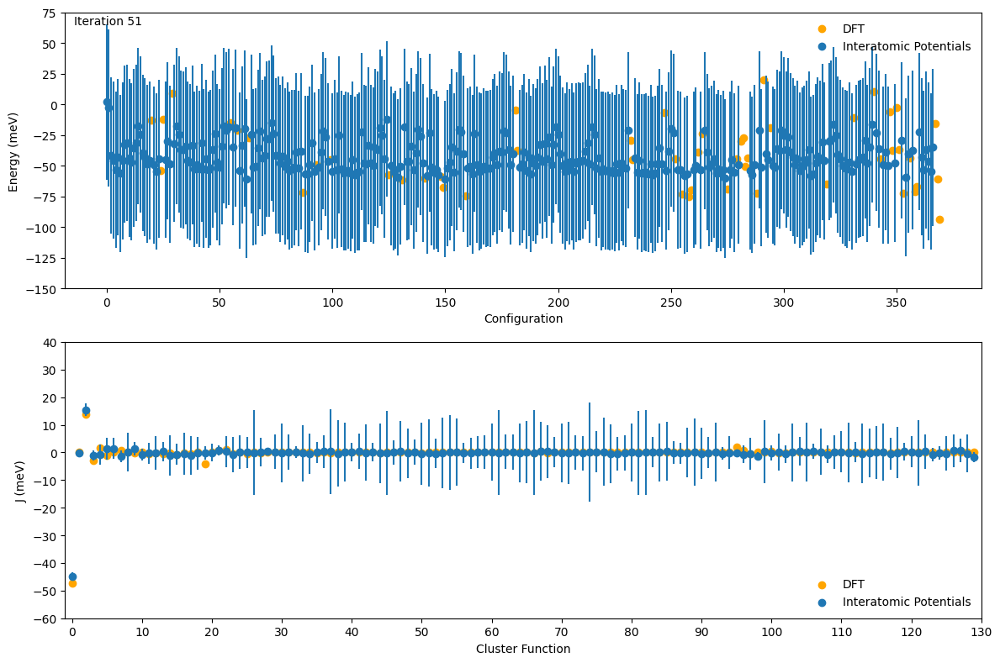

index of sampled structures: [369, 25, 358, 279, 356, 350, 159, 131, 294, 283, 353, 282, 20, 359, 247, 258, 29, 275, 343, 351, 291, 281, 233, 284, 319, 262, 331, 125, 368, 58, 252, 182, 148, 259, 367, 255, 181, 24, 99, 348, 63, 232, 149, 141, 347, 288, 93, 87, 264, 55, 340, 78]

RMSE = 5.592975395119519
R2 = 0.9226209260773588


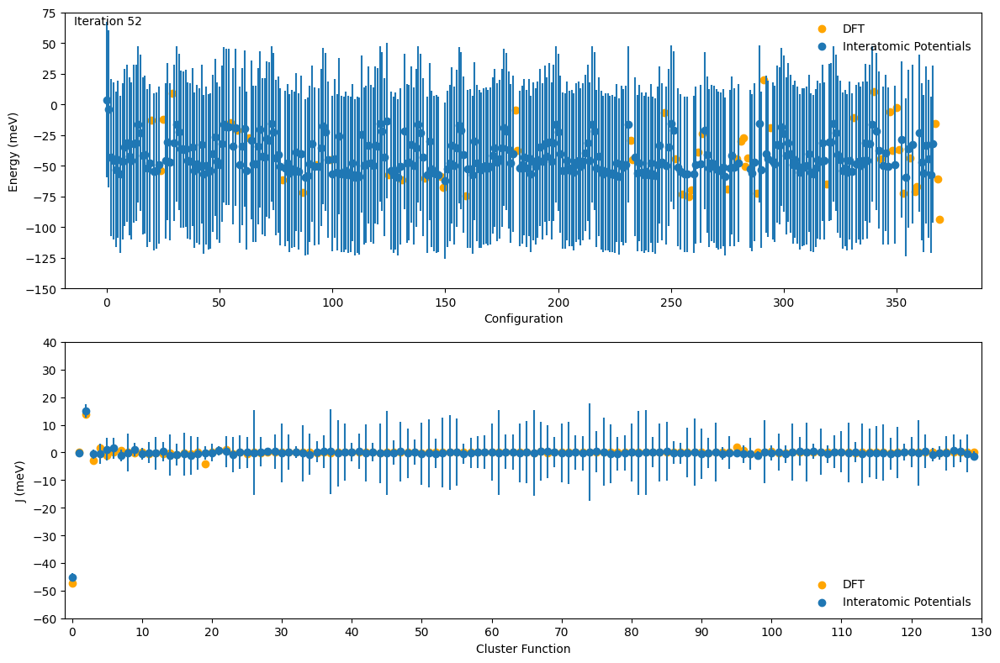

index of sampled structures: [369, 25, 358, 279, 356, 350, 159, 131, 294, 283, 353, 282, 20, 359, 247, 258, 29, 275, 343, 351, 291, 281, 233, 284, 319, 262, 331, 125, 368, 58, 252, 182, 148, 259, 367, 255, 181, 24, 99, 348, 63, 232, 149, 141, 347, 288, 93, 87, 264, 55, 340, 78, 302]

RMSE = 5.720339206540085
R2 = 0.9192165710585248


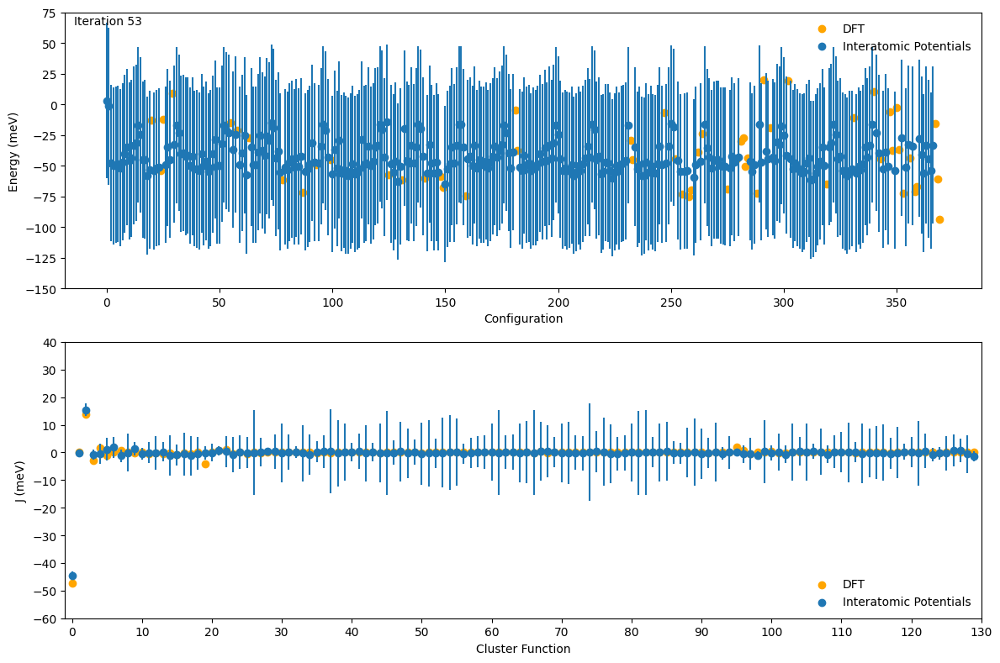

index of sampled structures: [369, 25, 358, 279, 356, 350, 159, 131, 294, 283, 353, 282, 20, 359, 247, 258, 29, 275, 343, 351, 291, 281, 233, 284, 319, 262, 331, 125, 368, 58, 252, 182, 148, 259, 367, 255, 181, 24, 99, 348, 63, 232, 149, 141, 347, 288, 93, 87, 264, 55, 340, 78, 302, 357]

RMSE = 5.711040237150358
R2 = 0.9192519837470413


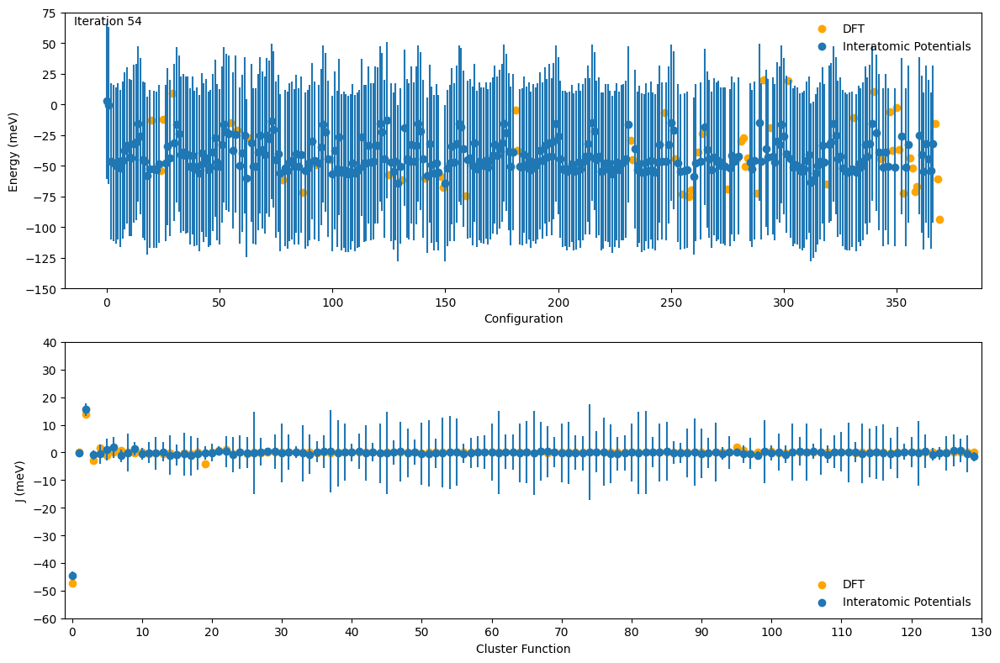

index of sampled structures: [369, 25, 358, 279, 356, 350, 159, 131, 294, 283, 353, 282, 20, 359, 247, 258, 29, 275, 343, 351, 291, 281, 233, 284, 319, 262, 331, 125, 368, 58, 252, 182, 148, 259, 367, 255, 181, 24, 99, 348, 63, 232, 149, 141, 347, 288, 93, 87, 264, 55, 340, 78, 302, 357, 234]

RMSE = 5.704665547902798
R2 = 0.9193054847180637


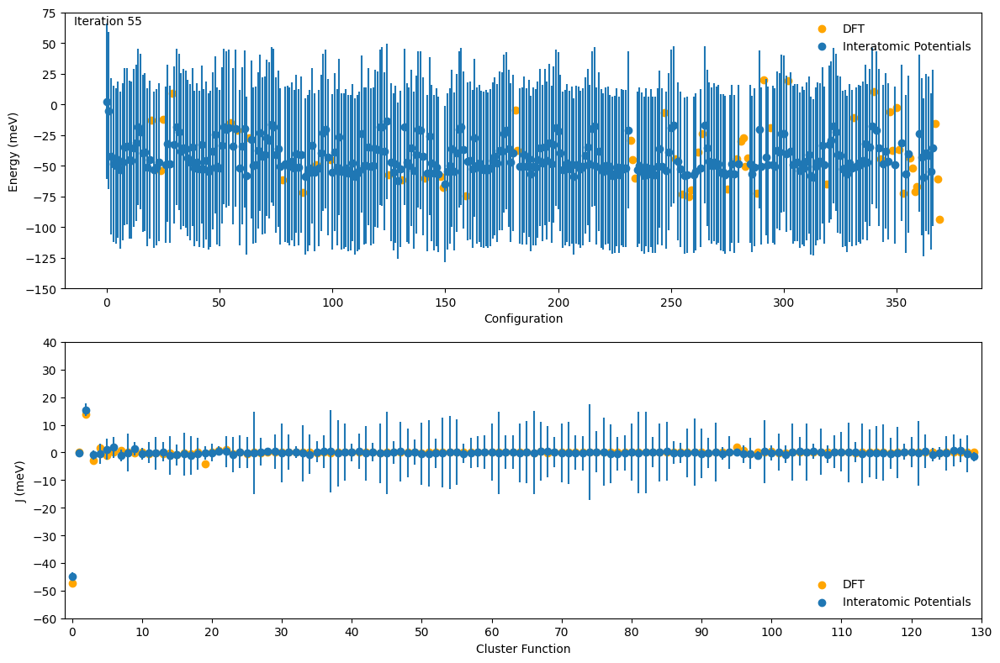

index of sampled structures: [369, 25, 358, 279, 356, 350, 159, 131, 294, 283, 353, 282, 20, 359, 247, 258, 29, 275, 343, 351, 291, 281, 233, 284, 319, 262, 331, 125, 368, 58, 252, 182, 148, 259, 367, 255, 181, 24, 99, 348, 63, 232, 149, 141, 347, 288, 93, 87, 264, 55, 340, 78, 302, 357, 234, 179]

RMSE = 5.700658072076454
R2 = 0.9193445905209553


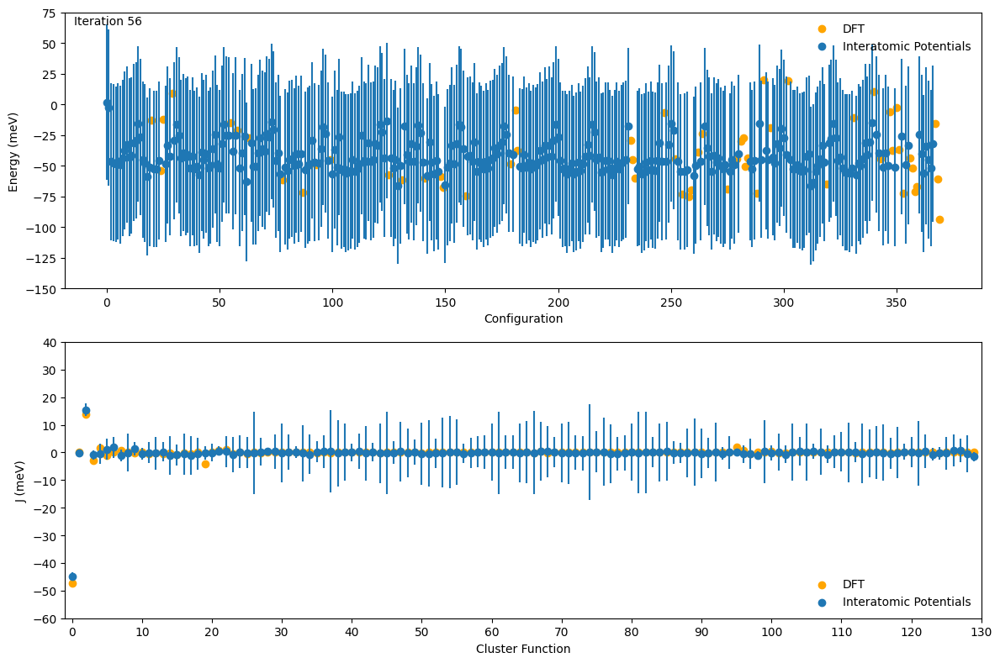

index of sampled structures: [369, 25, 358, 279, 356, 350, 159, 131, 294, 283, 353, 282, 20, 359, 247, 258, 29, 275, 343, 351, 291, 281, 233, 284, 319, 262, 331, 125, 368, 58, 252, 182, 148, 259, 367, 255, 181, 24, 99, 348, 63, 232, 149, 141, 347, 288, 93, 87, 264, 55, 340, 78, 302, 357, 234, 179, 133]

RMSE = 5.71164736364395
R2 = 0.9192305190058925


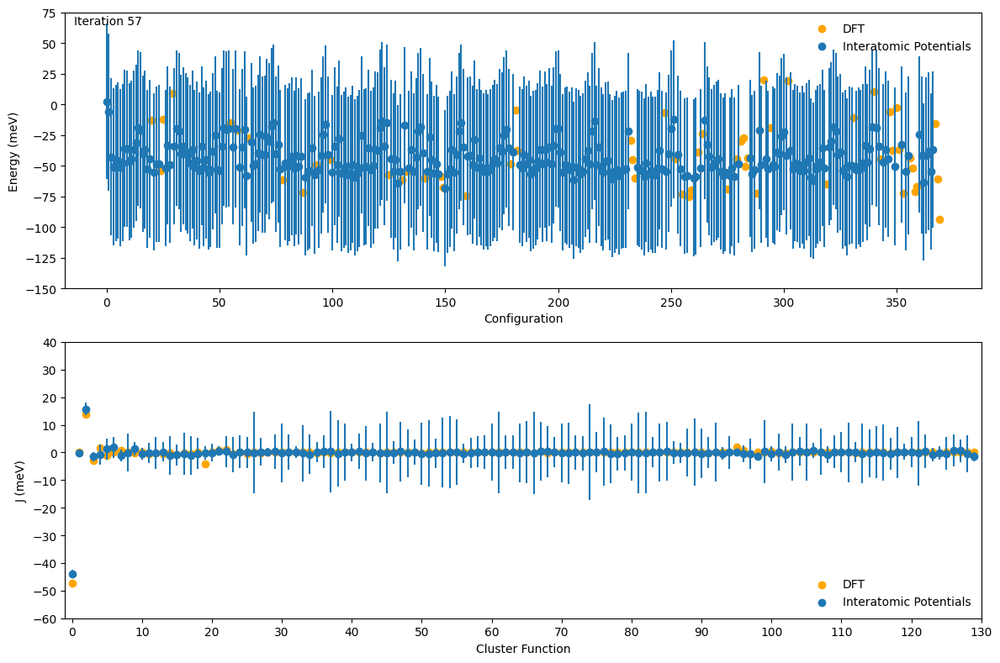

index of sampled structures: [369, 25, 358, 279, 356, 350, 159, 131, 294, 283, 353, 282, 20, 359, 247, 258, 29, 275, 343, 351, 291, 281, 233, 284, 319, 262, 331, 125, 368, 58, 252, 182, 148, 259, 367, 255, 181, 24, 99, 348, 63, 232, 149, 141, 347, 288, 93, 87, 264, 55, 340, 78, 302, 357, 234, 179, 133, 174]

RMSE = 5.746137110795395
R2 = 0.918528979615277


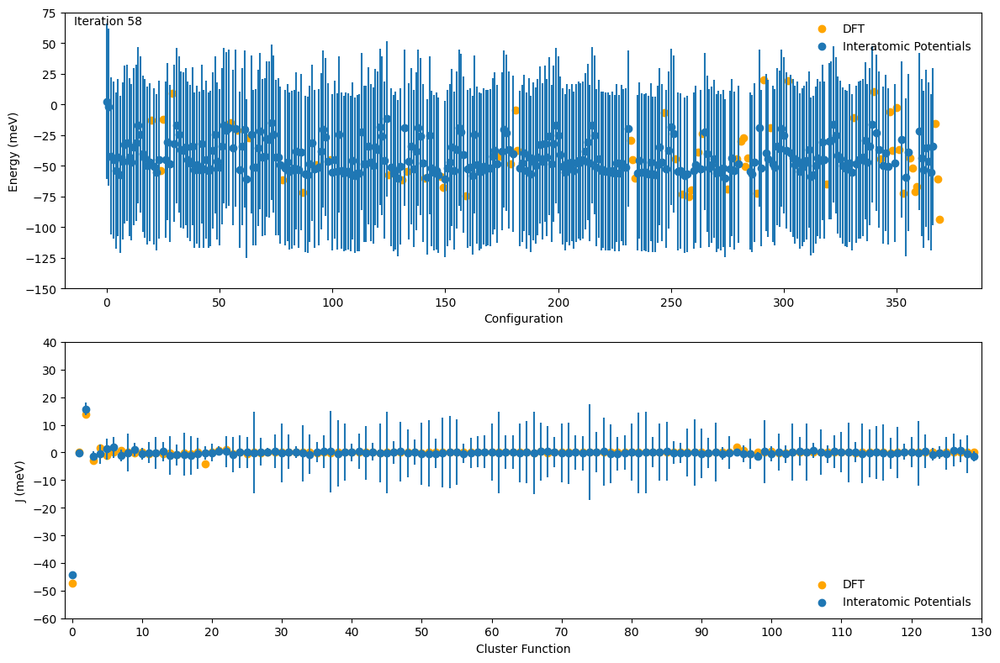

index of sampled structures: [369, 25, 358, 279, 356, 350, 159, 131, 294, 283, 353, 282, 20, 359, 247, 258, 29, 275, 343, 351, 291, 281, 233, 284, 319, 262, 331, 125, 368, 58, 252, 182, 148, 259, 367, 255, 181, 24, 99, 348, 63, 232, 149, 141, 347, 288, 93, 87, 264, 55, 340, 78, 302, 357, 234, 179, 133, 174, 62]

RMSE = 5.627094506581628
R2 = 0.9219167905606986


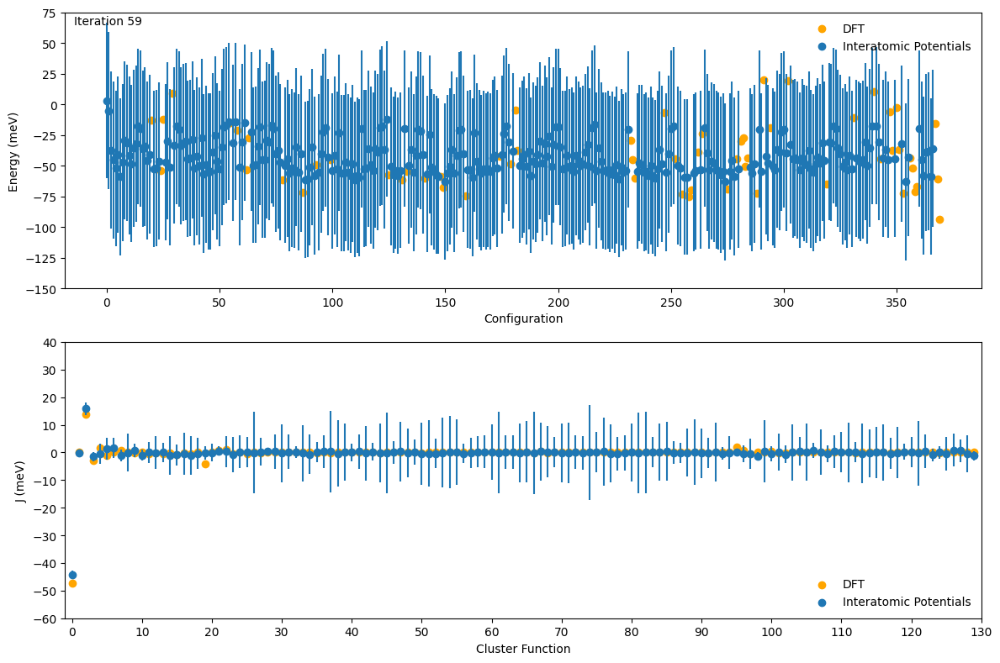

index of sampled structures: [369, 25, 358, 279, 356, 350, 159, 131, 294, 283, 353, 282, 20, 359, 247, 258, 29, 275, 343, 351, 291, 281, 233, 284, 319, 262, 331, 125, 368, 58, 252, 182, 148, 259, 367, 255, 181, 24, 99, 348, 63, 232, 149, 141, 347, 288, 93, 87, 264, 55, 340, 78, 302, 357, 234, 179, 133, 174, 62, 216]

RMSE = 5.626102472425467
R2 = 0.9219191973255763


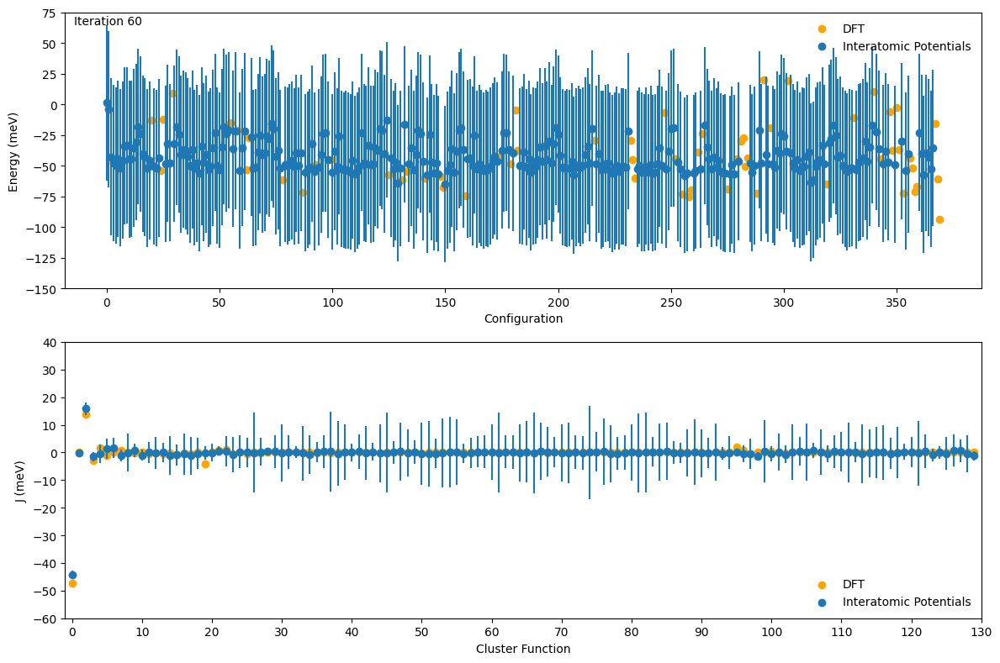

index of sampled structures: [369, 25, 358, 279, 356, 350, 159, 131, 294, 283, 353, 282, 20, 359, 247, 258, 29, 275, 343, 351, 291, 281, 233, 284, 319, 262, 331, 125, 368, 58, 252, 182, 148, 259, 367, 255, 181, 24, 99, 348, 63, 232, 149, 141, 347, 288, 93, 87, 264, 55, 340, 78, 302, 357, 234, 179, 133, 174, 62, 216, 64]

RMSE = 5.6336701720551945
R2 = 0.9219252205857994


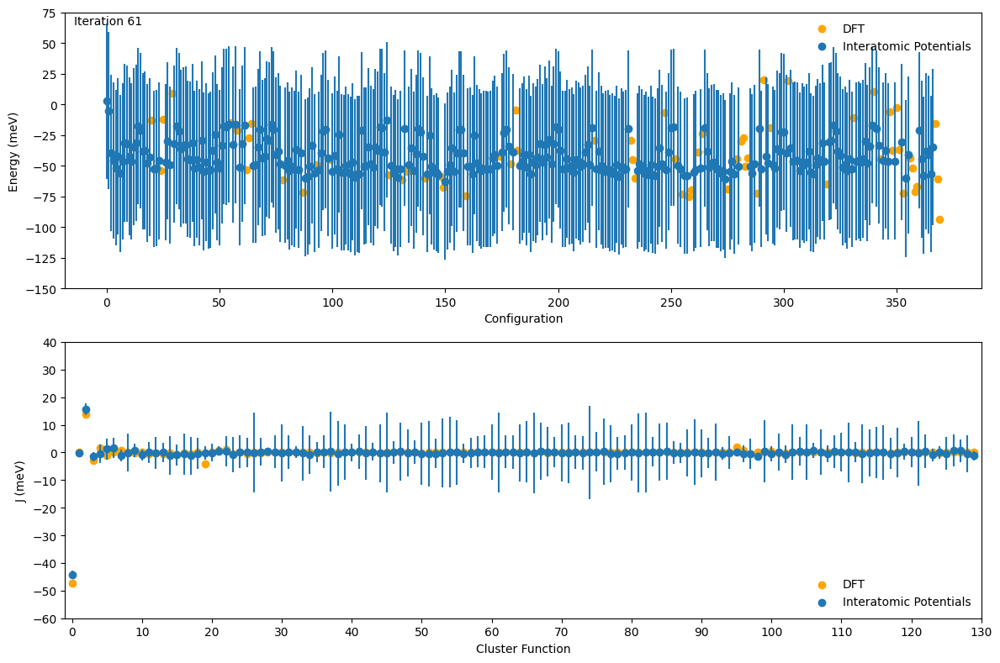

index of sampled structures: [369, 25, 358, 279, 356, 350, 159, 131, 294, 283, 353, 282, 20, 359, 247, 258, 29, 275, 343, 351, 291, 281, 233, 284, 319, 262, 331, 125, 368, 58, 252, 182, 148, 259, 367, 255, 181, 24, 99, 348, 63, 232, 149, 141, 347, 288, 93, 87, 264, 55, 340, 78, 302, 357, 234, 179, 133, 174, 62, 216, 64, 43]

RMSE = 5.62663553984332
R2 = 0.9220391012528589


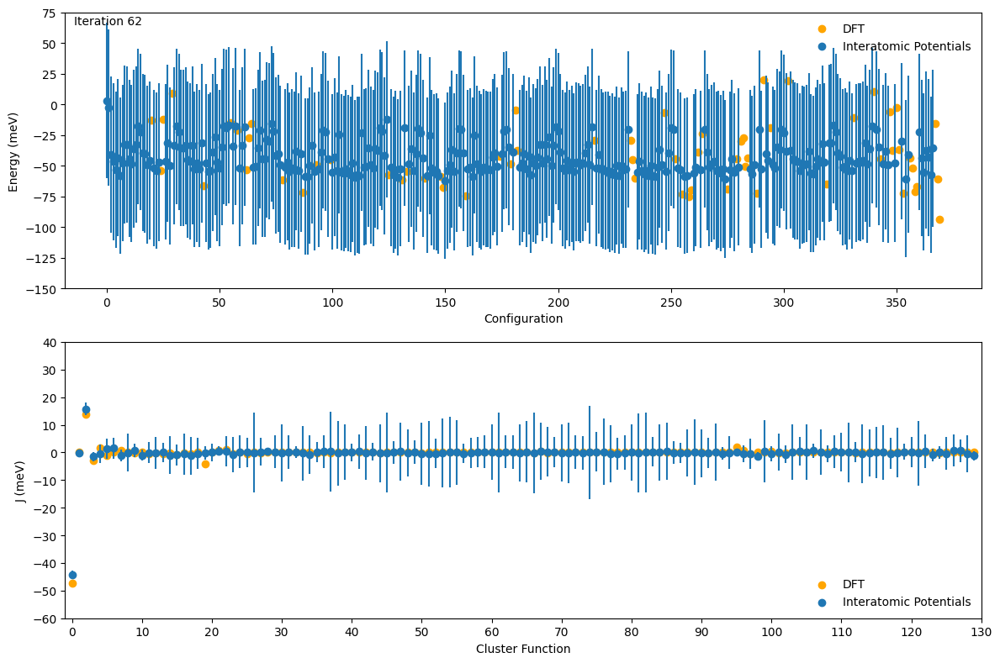

index of sampled structures: [369, 25, 358, 279, 356, 350, 159, 131, 294, 283, 353, 282, 20, 359, 247, 258, 29, 275, 343, 351, 291, 281, 233, 284, 319, 262, 331, 125, 368, 58, 252, 182, 148, 259, 367, 255, 181, 24, 99, 348, 63, 232, 149, 141, 347, 288, 93, 87, 264, 55, 340, 78, 302, 357, 234, 179, 133, 174, 62, 216, 64, 43, 42]

RMSE = 5.629843798360895
R2 = 0.9220134170021277


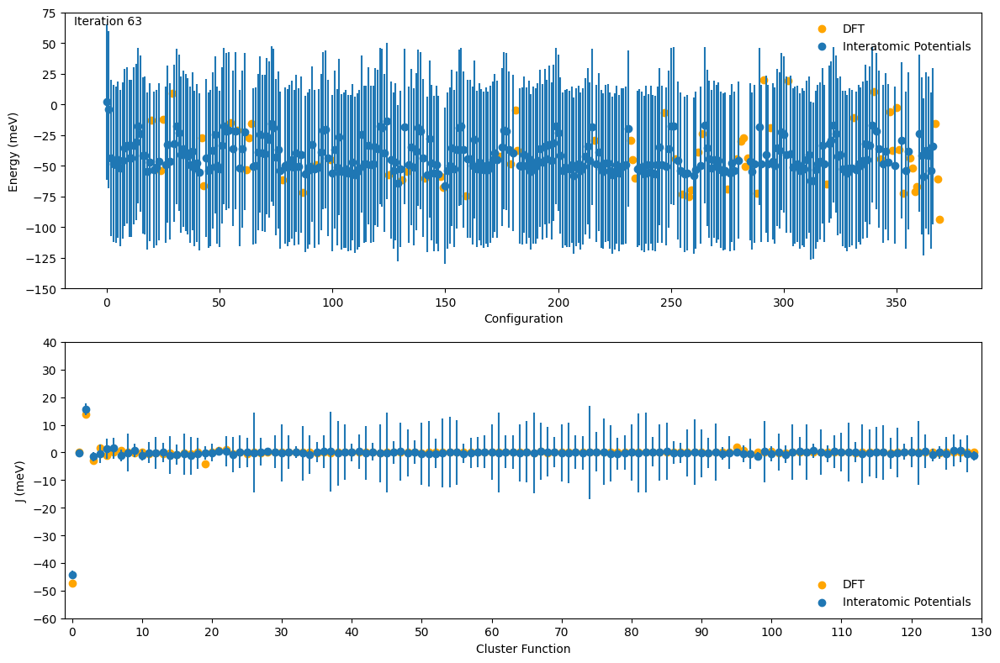

index of sampled structures: [369, 25, 358, 279, 356, 350, 159, 131, 294, 283, 353, 282, 20, 359, 247, 258, 29, 275, 343, 351, 291, 281, 233, 284, 319, 262, 331, 125, 368, 58, 252, 182, 148, 259, 367, 255, 181, 24, 99, 348, 63, 232, 149, 141, 347, 288, 93, 87, 264, 55, 340, 78, 302, 357, 234, 179, 133, 174, 62, 216, 64, 43, 42, 237]

RMSE = 5.622611204152601
R2 = 0.9220656305117573


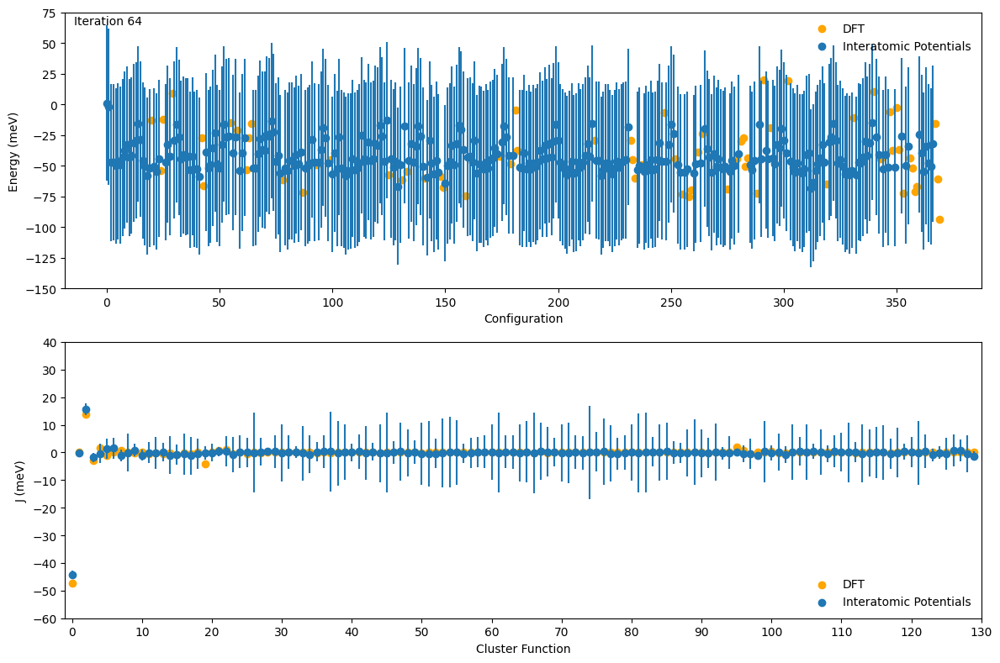

index of sampled structures: [369, 25, 358, 279, 356, 350, 159, 131, 294, 283, 353, 282, 20, 359, 247, 258, 29, 275, 343, 351, 291, 281, 233, 284, 319, 262, 331, 125, 368, 58, 252, 182, 148, 259, 367, 255, 181, 24, 99, 348, 63, 232, 149, 141, 347, 288, 93, 87, 264, 55, 340, 78, 302, 357, 234, 179, 133, 174, 62, 216, 64, 43, 42, 237, 278]

RMSE = 5.630884243902205
R2 = 0.9219703474094799


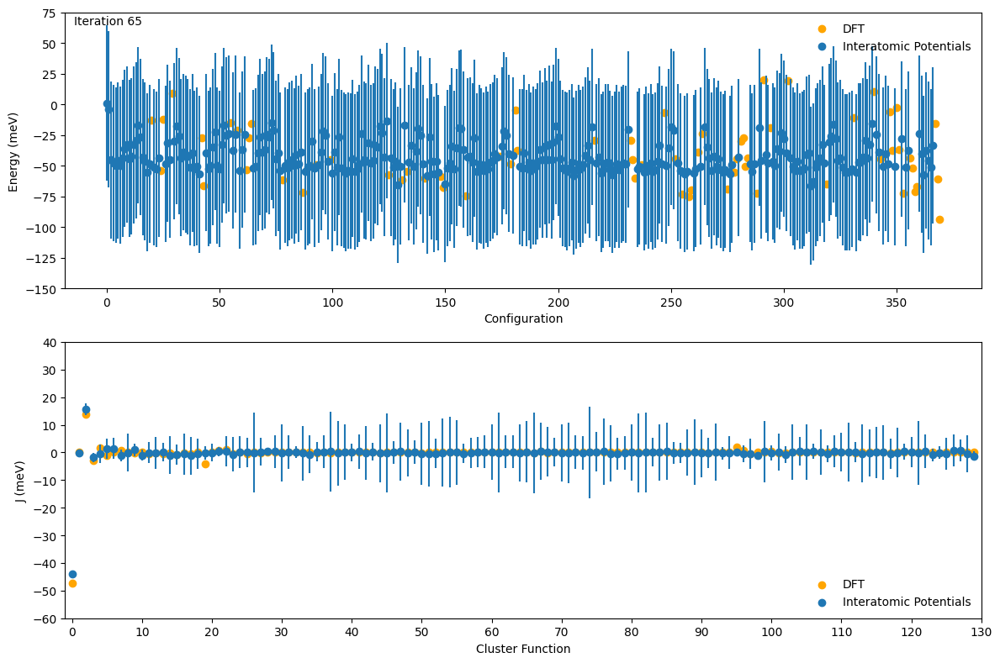

index of sampled structures: [369, 25, 358, 279, 356, 350, 159, 131, 294, 283, 353, 282, 20, 359, 247, 258, 29, 275, 343, 351, 291, 281, 233, 284, 319, 262, 331, 125, 368, 58, 252, 182, 148, 259, 367, 255, 181, 24, 99, 348, 63, 232, 149, 141, 347, 288, 93, 87, 264, 55, 340, 78, 302, 357, 234, 179, 133, 174, 62, 216, 64, 43, 42, 237, 278, 204]

RMSE = 5.631275325158789
R2 = 0.9217276795492528


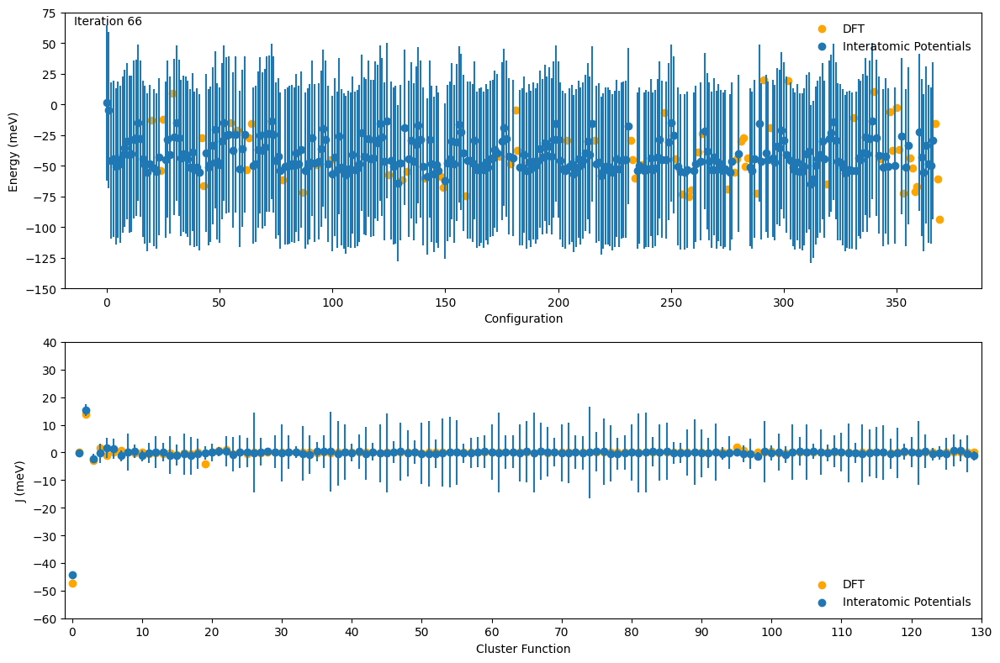

index of sampled structures: [369, 25, 358, 279, 356, 350, 159, 131, 294, 283, 353, 282, 20, 359, 247, 258, 29, 275, 343, 351, 291, 281, 233, 284, 319, 262, 331, 125, 368, 58, 252, 182, 148, 259, 367, 255, 181, 24, 99, 348, 63, 232, 149, 141, 347, 288, 93, 87, 264, 55, 340, 78, 302, 357, 234, 179, 133, 174, 62, 216, 64, 43, 42, 237, 278, 204, 162]

RMSE = 5.615864783670336
R2 = 0.921896802306038


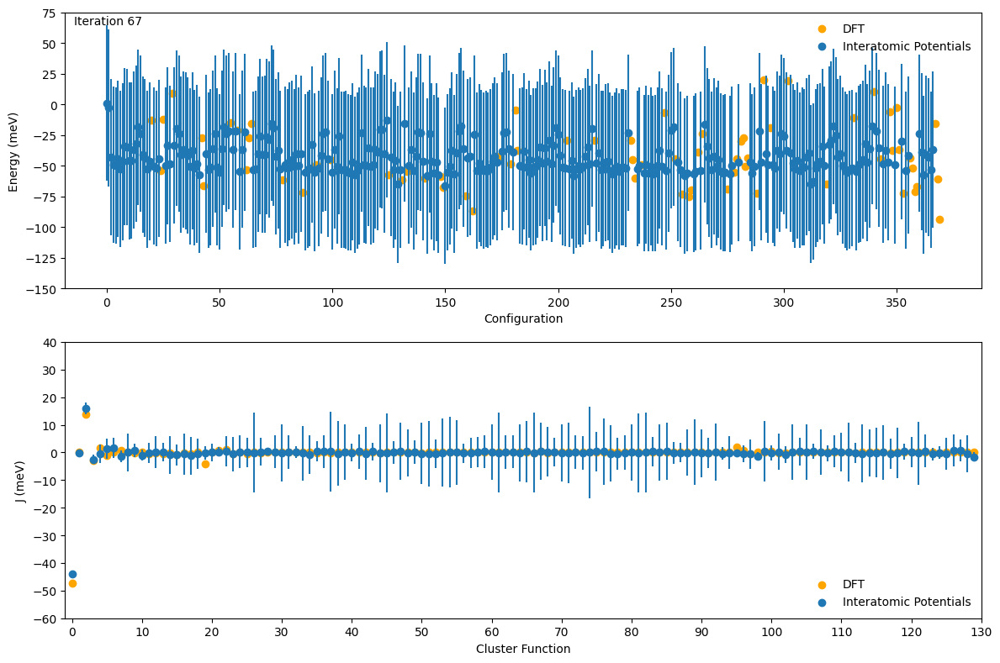

index of sampled structures: [369, 25, 358, 279, 356, 350, 159, 131, 294, 283, 353, 282, 20, 359, 247, 258, 29, 275, 343, 351, 291, 281, 233, 284, 319, 262, 331, 125, 368, 58, 252, 182, 148, 259, 367, 255, 181, 24, 99, 348, 63, 232, 149, 141, 347, 288, 93, 87, 264, 55, 340, 78, 302, 357, 234, 179, 133, 174, 62, 216, 64, 43, 42, 237, 278, 204, 162, 304]

RMSE = 5.653267837392191
R2 = 0.921353035260435


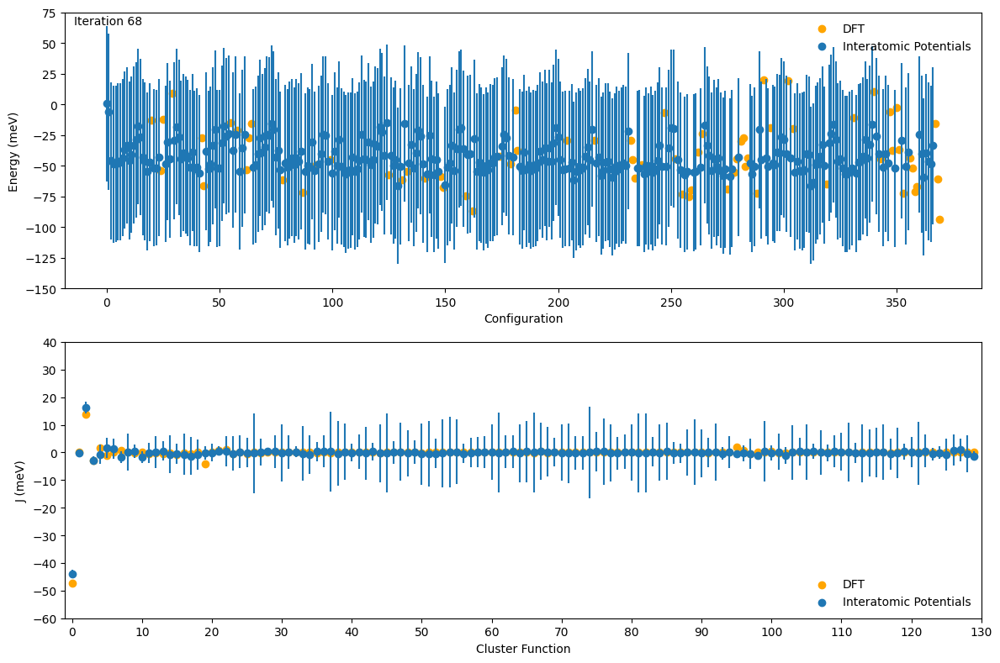

index of sampled structures: [369, 25, 358, 279, 356, 350, 159, 131, 294, 283, 353, 282, 20, 359, 247, 258, 29, 275, 343, 351, 291, 281, 233, 284, 319, 262, 331, 125, 368, 58, 252, 182, 148, 259, 367, 255, 181, 24, 99, 348, 63, 232, 149, 141, 347, 288, 93, 87, 264, 55, 340, 78, 302, 357, 234, 179, 133, 174, 62, 216, 64, 43, 42, 237, 278, 204, 162, 304, 218]

RMSE = 5.636348803676016
R2 = 0.9217244153957165


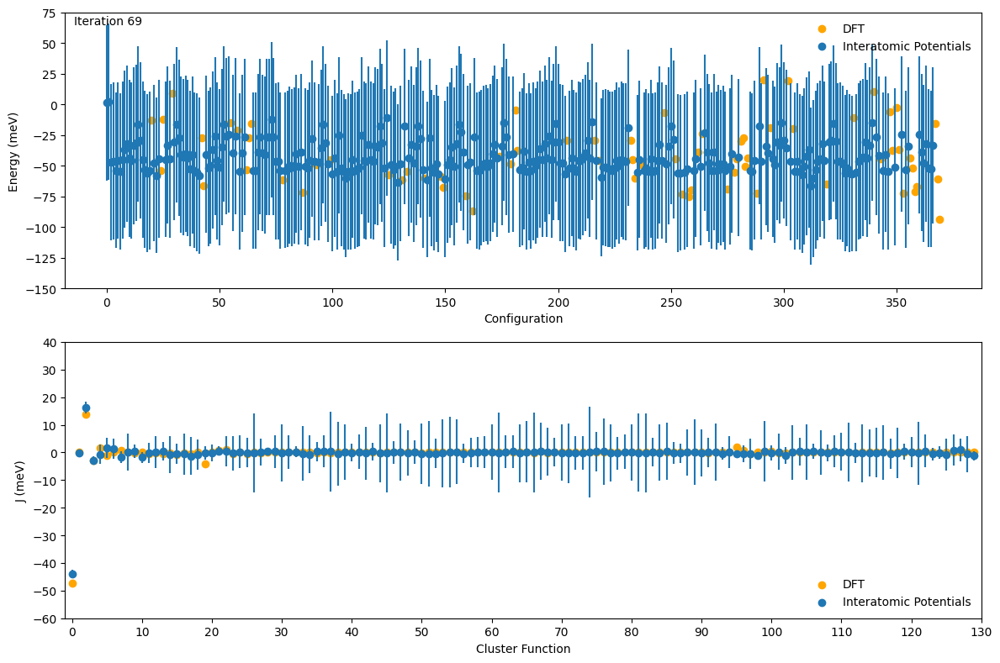

index of sampled structures: [369, 25, 358, 279, 356, 350, 159, 131, 294, 283, 353, 282, 20, 359, 247, 258, 29, 275, 343, 351, 291, 281, 233, 284, 319, 262, 331, 125, 368, 58, 252, 182, 148, 259, 367, 255, 181, 24, 99, 348, 63, 232, 149, 141, 347, 288, 93, 87, 264, 55, 340, 78, 302, 357, 234, 179, 133, 174, 62, 216, 64, 43, 42, 237, 278, 204, 162, 304, 218, 287]

RMSE = 5.63231012393365
R2 = 0.9217062641280838


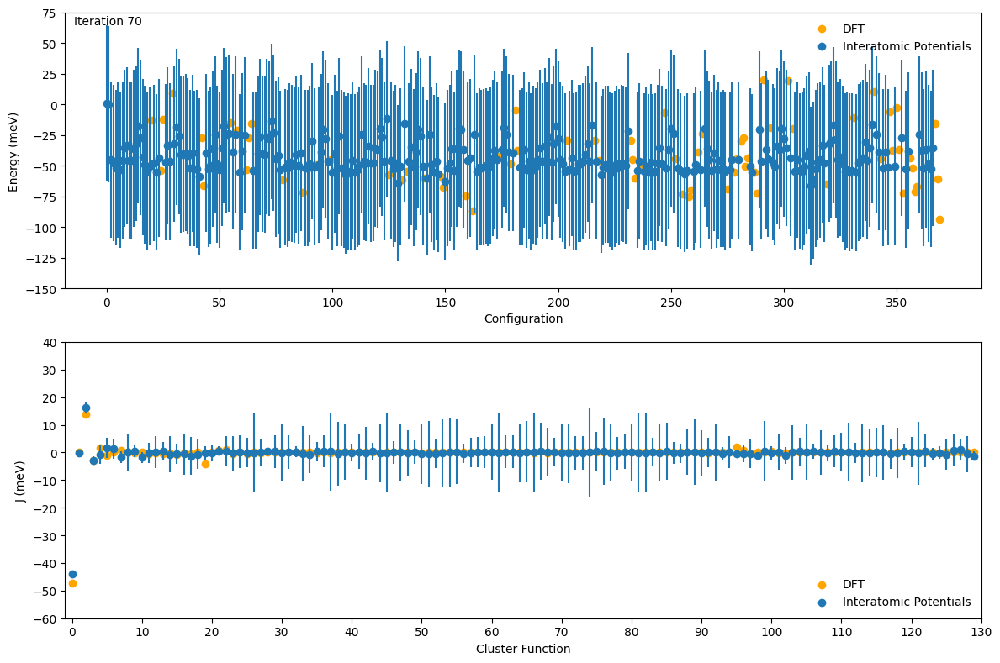

index of sampled structures: [369, 25, 358, 279, 356, 350, 159, 131, 294, 283, 353, 282, 20, 359, 247, 258, 29, 275, 343, 351, 291, 281, 233, 284, 319, 262, 331, 125, 368, 58, 252, 182, 148, 259, 367, 255, 181, 24, 99, 348, 63, 232, 149, 141, 347, 288, 93, 87, 264, 55, 340, 78, 302, 357, 234, 179, 133, 174, 62, 216, 64, 43, 42, 237, 278, 204, 162, 304, 218, 287, 219]

RMSE = 5.614908080351866
R2 = 0.9220510854368237


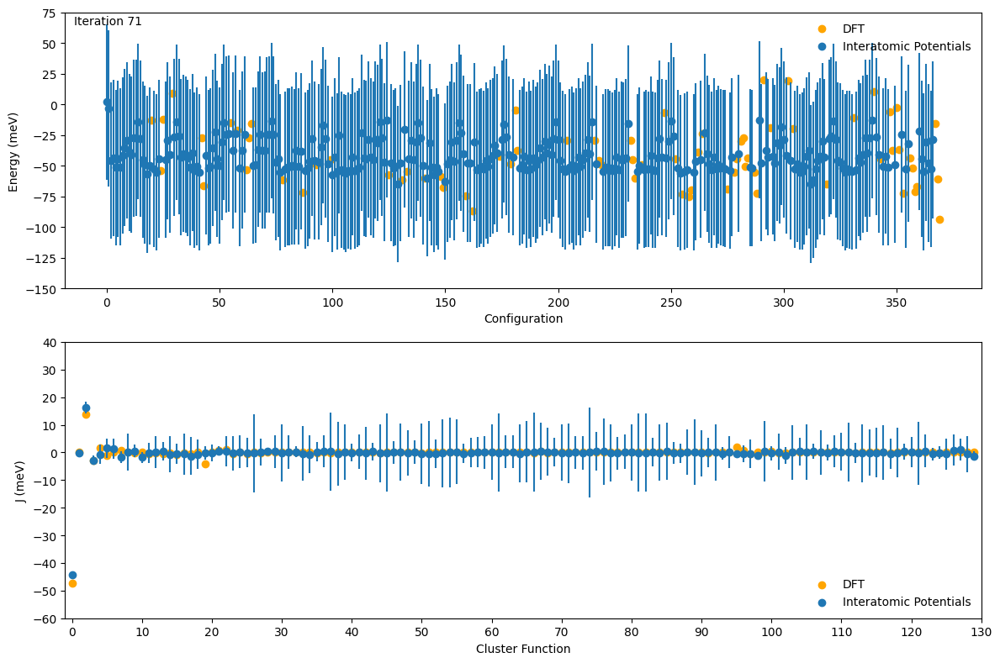

index of sampled structures: [369, 25, 358, 279, 356, 350, 159, 131, 294, 283, 353, 282, 20, 359, 247, 258, 29, 275, 343, 351, 291, 281, 233, 284, 319, 262, 331, 125, 368, 58, 252, 182, 148, 259, 367, 255, 181, 24, 99, 348, 63, 232, 149, 141, 347, 288, 93, 87, 264, 55, 340, 78, 302, 357, 234, 179, 133, 174, 62, 216, 64, 43, 42, 237, 278, 204, 162, 304, 218, 287, 219, 312]

RMSE = 5.621688753105791
R2 = 0.9219347522185556


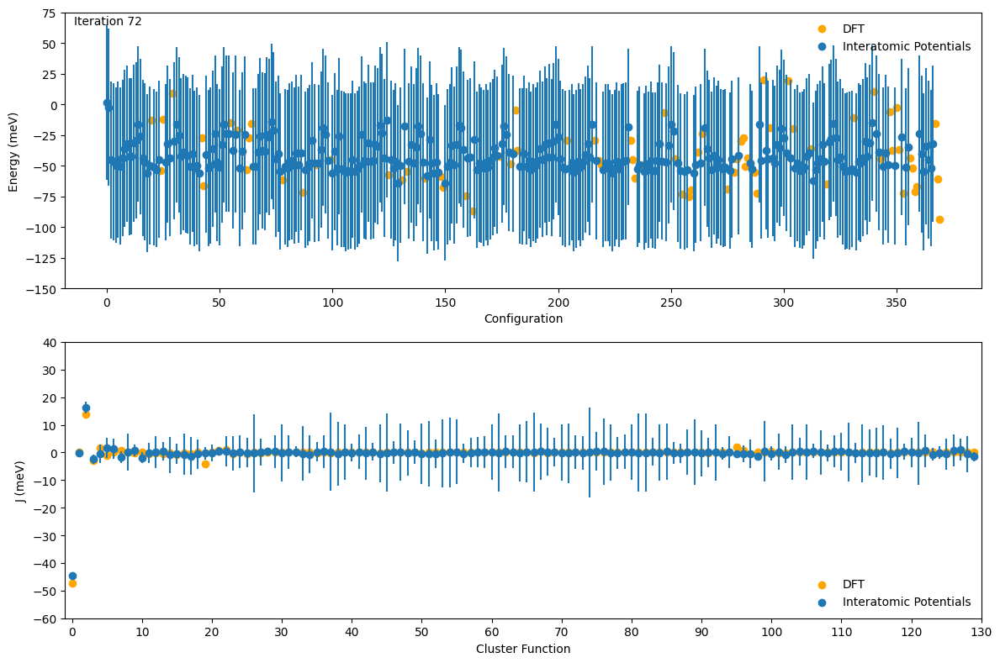

index of sampled structures: [369, 25, 358, 279, 356, 350, 159, 131, 294, 283, 353, 282, 20, 359, 247, 258, 29, 275, 343, 351, 291, 281, 233, 284, 319, 262, 331, 125, 368, 58, 252, 182, 148, 259, 367, 255, 181, 24, 99, 348, 63, 232, 149, 141, 347, 288, 93, 87, 264, 55, 340, 78, 302, 357, 234, 179, 133, 174, 62, 216, 64, 43, 42, 237, 278, 204, 162, 304, 218, 287, 219, 312, 270]

RMSE = 5.6093927989271615
R2 = 0.9220779677257961


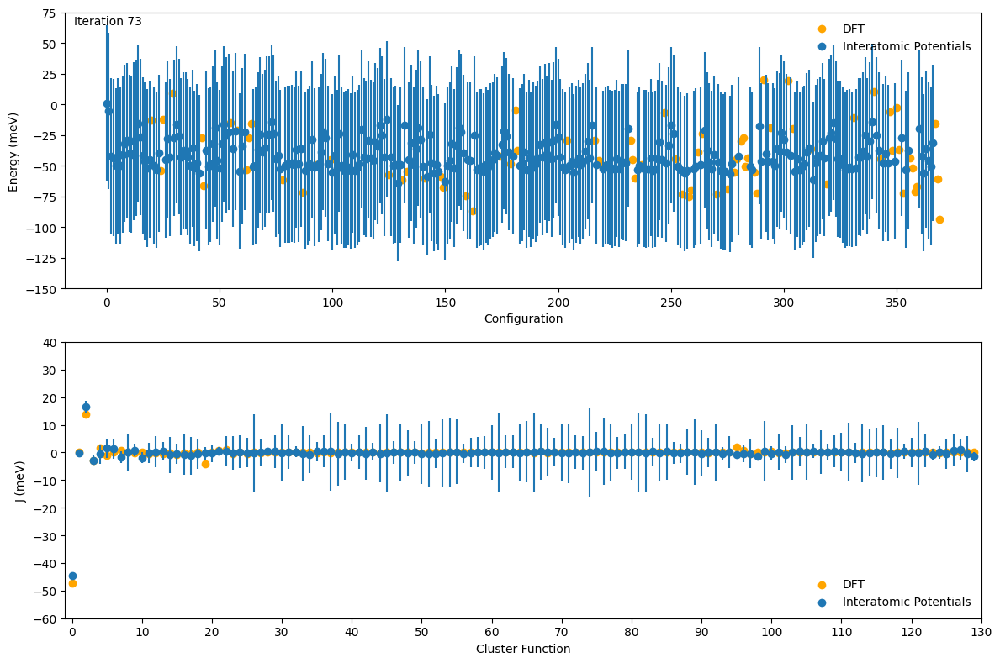

index of sampled structures: [369, 25, 358, 279, 356, 350, 159, 131, 294, 283, 353, 282, 20, 359, 247, 258, 29, 275, 343, 351, 291, 281, 233, 284, 319, 262, 331, 125, 368, 58, 252, 182, 148, 259, 367, 255, 181, 24, 99, 348, 63, 232, 149, 141, 347, 288, 93, 87, 264, 55, 340, 78, 302, 357, 234, 179, 133, 174, 62, 216, 64, 43, 42, 237, 278, 204, 162, 304, 218, 287, 219, 312, 270, 196]

RMSE = 5.643613357344405
R2 = 0.9211522383401186


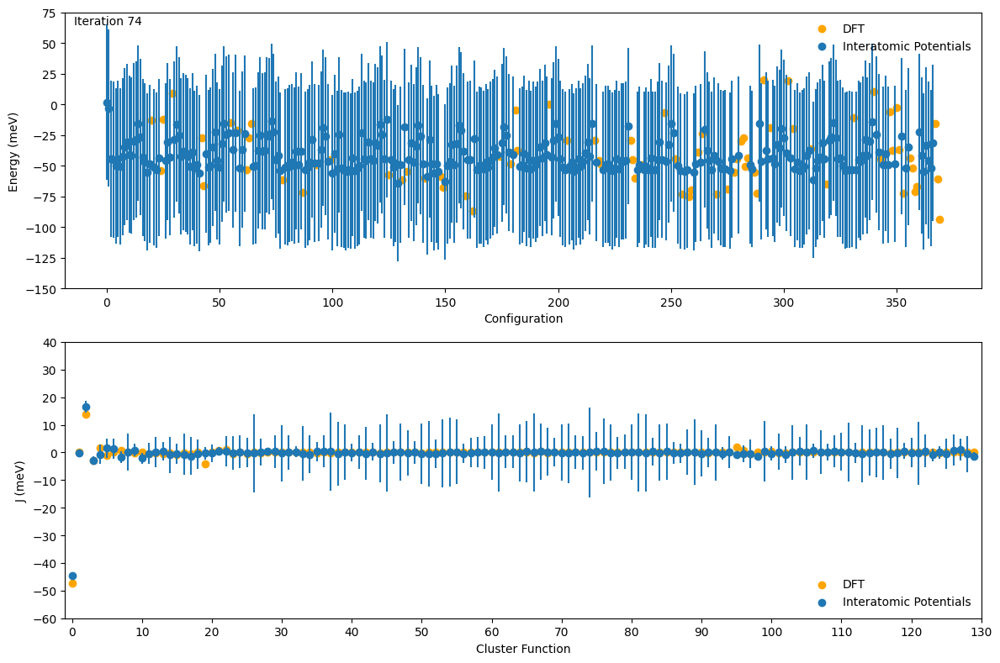

In [ ]:
###### STEP 1: Variable Initialization ##############################################################################################

# Define the number of optimization loops and the total number of structures
number_of_loops = 74
n_structures = 370

# Initialize lists to store Root Mean Square Error (RMSE), R-squared (R2),
# standard deviations (stds and stds_J) for further analysis.
RMSE=[]
R2=[]
stds=[]
stds_J=[]

# Extract and scale energy values from empirical potentials DataFrame
# for different interatomic potentials.
f_comb = EP['Cluster_COMB3 (meV/f.u.)']*0.001
f_reaxff = EP['Cluster_ReaxxFF (meV/f.u.)']*0.001
f_meam = EP['Cluster_MEAM (meV/f.u.)']*0.001
f_eam = EP['Cluster_EAM (meV/f.u.)']*0.001
f_CHGNet = EP['Cluster_CHGNet (meV/f.u.)']*0.001
f_M3GNet = EP['Cluster_M3GNet (meV/f.u.)']*0.001

#####################################################################################################################################




###### STEP 2: Data Processing ######################################################################################################

# Create a DataFrame 'ep' by stacking energy arrays for various interatomic potentials
ep = pd.DataFrame([f_comb, f_reaxff, f_meam, f_eam, f_CHGNet, f_M3GNet])

# Calculate the mean of energy values across different interatomic potentials
mu = np.mean(ep, axis=0)

# Stack energy arrays into matrix 'X' for further calculations
X = np.stack((f_comb, f_reaxff, f_eam, f_meam, f_CHGNet, f_M3GNet))

# Calculate the covariance matrix 'k' for the stacked matrix 'X'
k = np.cov(X.T)

# Add a small diagonal perturbation to the covariance matrix 'K'
K = k + np.identity(n_structures) * 0.001

# Initialize a square matrix 'w' with zeros and set diagonal elements to 0.10 to assign a higher weight to DFT calculations.
w = np.zeros((n_structures, n_structures))
np.fill_diagonal(w, 0.10)

#####################################################################################################################################





###### STEP 3: Iterative Optimization Loop and Results Visualization ################################################################

# Initialize variables and data structures for the optimization process
next_K = K.copy()
next_mu = mu.copy()
mu_fixed = mu.copy()
energies = []
Js= []
f_sampled=[]
index_notsampled = np.array(range(n_structures))
index_sampled = []
index=[]
mu_n=[]
mu_n.append(next_mu)

# Perform iterative optimization for a specified number of loops
for j in range(number_of_loops):

    std=[]
    std_J=[]
    det = []

    # Calculate the inverse of the matrix 'next_K'
    K_inverse = np.linalg.inv(next_K)


    for i in range(len(K_inverse)) :
        # Create a reduced matrix by deleting rows and columns
        reduced_K = np.delete(K_inverse, i, 0)
        reduced_K = np.delete(reduced_K, i, 1)

        # Calculate the sign and determinant of the reduced matrix
        sign, determinan = np.linalg.slogdet(reduced_K)
        det.append(determinan)


    # Identify the configuration with the maximum determinant for replacement with DFT
    max_det = max(det)
    max_det_index = np.argmax(det)
    index.append(max_det_index)

    # Update sampled and not-sampled structures
    index_sampled.append(index_notsampled[np.argmax(det)])
    index_notsampled = np.delete(index_notsampled, np.argmax(det))
    print('index of sampled structures:', index_sampled)
    print('')

    # Update 'next_K'
    K_ortho = np.delete(K_inverse, np.argmax(det), 0)
    K_ortho = np.delete(K_ortho, np.argmax(det), 1)
    next_K  = np.linalg.inv(K_ortho)

    # Retrieve and store DFT values for the sampled structures
    f = PBE.iloc[index_sampled[-1],7]/1000
    f_sampled.append(f)

    # Update 'mu_fixed' and 'w' for the sampled structures
    mu_fixed[index_sampled[-1]]=f
    w[index_sampled[-1]][index_sampled[-1]]=1

    # Update 'next_mu' and 'mu_n' for the orthogonal structures
    mu_ortho = next_mu.copy()
    mu_ortho =np.delete(np.array(mu_ortho), [np.argmax(det)])
    K_ortho_par = np.array(K_inverse[:, np.argmax(det)])
    K_ortho_par = np.delete(K_ortho_par, np.where(K_ortho_par == K_ortho_par[np.argmax(det)]))
    next_mu = mu_ortho - np.matmul(next_K,K_ortho_par)*(f-next_mu[np.argmax(det)])
    mu_n.append(next_mu)

    # Calculate scaling factors for various potential energy contributions
    scaling_factor_meam = np.dot(f_sampled, f_meam[index_sampled]) / np.dot(f_meam[index_sampled], f_meam[index_sampled])
    scaling_factor_eam = np.dot(f_sampled, f_eam[index_sampled]) / np.dot(f_eam[index_sampled], f_eam[index_sampled])
    scaling_factor_reaxff = np.dot(f_sampled, f_reaxff[index_sampled]) / np.dot(f_reaxff[index_sampled], f_reaxff[index_sampled])
    scaling_factor_comb = np.dot(f_sampled, f_comb[index_sampled]) / np.dot(f_comb[index_sampled], f_comb[index_sampled])
    scaling_factor_CHGNet = np.dot(f_sampled, f_CHGNet[index_sampled]) / np.dot(f_CHGNet[index_sampled], f_CHGNet[index_sampled])
    scaling_factor_M3GNet = np.dot(f_sampled, f_M3GNet[index_sampled]) / np.dot(f_M3GNet[index_sampled], f_M3GNet[index_sampled])

    # Rescale potential energy contributions for interatomic potentials
    f_comb_rescaled = f_comb * scaling_factor_comb
    f_reaxff_rescaled = f_reaxff * scaling_factor_reaxff
    f_meam_rescaled = f_meam * scaling_factor_meam
    f_eam_rescaled = f_eam * scaling_factor_eam
    f_CHGNet_rescaled = f_CHGNet * scaling_factor_CHGNet
    f_M3GNet_rescaled = f_M3GNet * scaling_factor_M3GNet

    # Create a DataFrame with rescaled potential energy contributions
    ff_rescaled = pd.DataFrame([f_comb_rescaled, f_reaxff_rescaled, f_meam_rescaled, f_eam_rescaled, f_CHGNet_rescaled, f_M3GNet_rescaled])

    # Calculate the mean of rescaled contributions and their covariance matrix
    mu_rescaled = np.mean(ff_rescaled, axis=0)
    X_rescaled = np.stack((f_comb_rescaled, f_reaxff_rescaled, f_meam_rescaled, f_eam_rescaled, f_CHGNet_rescaled, f_M3GNet_rescaled))
    k_rescaled = np.cov(X_rescaled.T)

    # Update the rescaled covariance matrix 'K_rescaled'
    K_rescaled = k_rescaled + np.identity(n_structures) * 0.001
    next_K = K_rescaled.copy()
    next_mu = mu_rescaled.copy()
    mu_fixed = mu_rescaled.copy()

    # Update 'mu_fixed' for sampled structures with rescaled values
    mu_fixed[index_sampled] = f_sampled


    # Update the inverse matrix 'K_inverse' and 'next_K' with rescaled values
    K_inverse = np.linalg.inv(next_K)
    K_ortho = np.delete(K_inverse, np.sort(index_sampled), 0)
    K_ortho = np.delete(K_ortho, np.sort(index_sampled), 1)
    next_K  = np.linalg.inv(K_ortho)

    # Update 'next_mu' and 'mu_n' for the orthogonal structures with rescaled values
    mu_ortho = next_mu.copy()
    mu_ortho =np.delete(np.array(mu_ortho), [np.sort(index_sampled)])
    K_ortho_par = np.array(K_inverse[:, np.sort(index_sampled)])
    K_ortho_par = np.delete(K_ortho_par, np.sort(index_sampled), 0)
    next_mu = mu_ortho - np.matmul(next_K,(K_ortho_par @ np.array(f_sampled-next_mu[np.sort(index_sampled)])))
    mu_n.append(next_mu)

    # Calculate J parameters and energies
    J = np.matmul(np.linalg.pinv(np.matmul(w,Pi)),np.matmul(w,np.array(mu_fixed)))*1000
    e=np.matmul(Pi,np.array(J))

    # Append calculated values for further analysis
    energies.append(e)
    Js.append(J)

    # Calculate RMSE and R-squared values
    RMSE.append(calc_rmse(PBE['Cluster_DFT (meV/f.u.)'], e))
    R2.append(calc_r2(PBE['Cluster_DFT (meV/f.u.)'], e))

    # Calculate standard deviations for structures not sampled
    for i in range(len(index_notsampled)):
        a=np.zeros(len(index_notsampled))
        a[i]=1
        std.append(np.sqrt(np.matmul(a.T,np.matmul(next_K,a)))*2)

    # Calculate standard deviations for J parameters
    for i in range(len(Pi[0,:])):

        std_J.append(np.sqrt(np.matmul(Pi[index_notsampled,i].T,np.matmul(next_K,Pi[index_notsampled,i])))*2)

    # Store standard deviations for analysis
    stds.append(std)
    stds_J.append(std_J)

    # Plot the results for this iteration
    fig, ax = plt.subplots(2,1)

    # Plot Energies
    ax[0].scatter(index_sampled,np.array(f_sampled)*1000,label='DFT', color='orange')
    ax[0].scatter(index_notsampled,next_mu*1000, label = 'Interatomic Potentials')
    ax[0].errorbar(index_notsampled,next_mu*1000, yerr=np.array(std)*1000, linestyle="None")
    ax[0].set_xlabel('Configuration')
    ax[0].set_ylabel('Energy (meV)')
    ax[0].set_ylim([-150, 75])
    ax[0].legend(frameon=False)
    ax[0].annotate('Iteration %s' %(j+1), xy=(2, 1), xycoords='data',
            xytext=(0.01, .99), textcoords='axes fraction',
            va='top', ha='left')


    # Plot J Parameters
    ax[1].scatter(np.array(range(len(Pi[0,:]))),df_ecis['eci'], label='DFT', color='orange')
    ax[1].scatter(np.array(range(len(Pi[0,:]))), J, label='Interatomic Potentials')
    ax[1].errorbar(np.array(range(len(Pi[0,:]))),J, yerr=std_J, linestyle="None")
    ax[1].set_xlabel('Cluster Function')
    ax[1].set_ylabel('J (meV)')
    ax[1].set_ylim([-60, 40])
    ax[1].set_xlim([-1, 130])
    ax[1].set_xticks(np.arange(0.0, 131, 10))
    ax[1].set_yticks(np.arange(-60, 41, 10))
    ax[1].legend(frameon=False , loc='lower right')

    fig.set_figheight(8)
    fig.set_figwidth(12)

    plt.tight_layout()
    plt.show()

#####################################################################################################################################